# Network growth models pt 1

In [5]:
# Load some packages
import numpy as np
import matplotlib.pyplot as plt
import random 
from random import choices
import operator
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import powerlaw
from scipy.optimize import curve_fit
from scipy.stats import poisson
from scipy.stats import binom
from scipy.stats import powerlaw
import scipy.stats as stats
from scipy.stats import ks_2samp


In [42]:
def trianngles(n0,conn,x,y,z):     
    
    deg = np.zeros(n0)
    for i in range(len(deg)):
        deg[i] +=1
        for j in range(len(conn)):
            if conn[j]==i:
                deg[i] +=1
    
    list2=list(conn)
    cl_triangles = 0
    
    for i in range(len(deg)):
        if deg[i] > 1:
            if i in list2:#if 1 is in list
                nemo= list2[i] #what is the element in position one? 28
                if list2[list2[nemo]] == i:
                    cl_triangles +=1
                                    
    cl_triangles = cl_triangles/3
    
    print("number of closed triangles is", cl_triangles)
    print()
    
    triangles = 0
    for i in range(len(deg)):
        if deg[i] > 1:
            num=deg[i]
            if not deg[i] %2 == 0:
                num-=1
            triangles += int(num/2)

    print("number of open triangles is", triangles)

    distances_1=np.zeros(len(conn))
    for i in range(n0):
        distances_1[i] = (((x[i]-x[conn[i]])**2)+((y[i]-y[conn[i]])**2)+((z[i]-z[conn[i]])**2))**(1/2)
    
    avdist_1 = np.sum(distances_1)/(n0)
    print('average distance is',avdist_1)
    
    return triangles, cl_triangles, avdist_1

In [43]:
def truncated_power_law(a, m, N):
    k = np.arange(0.8, m+0.8, dtype='float')
    pmf = k**-a
    pmf /= pmf.sum()
    d= stats.rv_discrete(values=(range(1, m+1), pmf))
    a, m = 2, 15
    return d.rvs(size=N)

## Barabasi-Albert network model

When growing a Barabasi-Albert network, new nodes are entering the network over time, but the way these are connected to previous nodes depend on the the degree of the already existing nodes. This is way we start with an initial configuration of the network composed of n0 = 30 nodes: in this way the existing nodes randomly acquire an ”advantage in degree” over other nodes and this random advantage then leads them to become the nodes with the highest degree in the entire network. In practice, the growth of the network is simulated in the following way:
1. initial nodes positions are generated in a cube of dimensions [0,1) x [0,1) x [0,1) 2. initial connectivity should be such that all initial nodes are connected;
3. new nodes are added one at a time and they are connected to one of the existing nodes by taking into consideration the degree of the already existing nodes;
4. the process continues until the last node is added.
In the graph below, it is shown a network in which n = 500 new nodes are gradually inserted and connected by means of preferential attachment:

In [44]:
def rich_get_richer(n0 = 30, n = 500, seed = 184937, graph=True):
    if seed is not None:
        np.random.seed(seed)
        
    # generate the nodes positions in [0,1)x[0,1)
    x = np.random.rand(n0) # random array, elements in [0,1), length n
    y = np.random.rand(n0) # same....
    z = np.random.rand(n0)

    # connectivity should be such that all vertices are connected
    conn = np.array([16,28,14,25,20,16,12,1,27,19,15,2,21,11,4,9,24,27,8,3,23,22,0,29,18,6,5,13,7,10,26,17])
    conn_copy = conn
    #print(conn)
    
    trianngles(n0,conn,x,y,z)
        
    
    if graph== True:
        fig = plt.figure(figsize=(10,8))
        ax = Axes3D(fig)
    
        for j,k,l,i in zip(x,y,z,range(len(x))):
            ax.text(j,k,l,i)
        
        for i in range(len(x)):
            ax.plot([x[i],x[conn[i]]], [y[i],y[conn[i]]], [z[i],z[conn[i]]])
        ax.scatter3D(x, y, z,s=40, cmap='Greens');

        plt.pause(0.001)

        plt.show()  
        
    
    for i in range(n):
        # create a random node
        #while True:
        new_x= np.random.rand()
        new_y= np.random.rand()
        new_z= np.random.rand()

        x = np.append(x,new_x) #append the x coordinate of the new node
        y = np.append(y,new_y) #append the y coordinate of the new node
        z = np.append(z,new_z)

        deg_1 = np.zeros(len(x))
        for i in range(len(deg_1)):
            for j in range(len(conn)):
                if conn[j]==i:
                    deg_1[i] +=1
        
        
        new_conn = random.choices(np.arange(len(x)), weights=deg_1) # weighted choice (wrt to the degree of each node) among existing nodes
        
        conn = np.append(conn, new_conn) #append the existing node to which the new node will connect

        plt.clf()

    
    if graph== True:
        fig = plt.figure(figsize=(10,8))
        ax = Axes3D(fig)
            
        for j,k,l,i in zip(x,y,z,range(len(x))):
            ax.text(j,k,l,i)
            
        for i in range(len(x)):
            ax.plot([x[i],x[conn[i]]], [y[i],y[conn[i]]], [z[i],z[conn[i]]])
        ax.scatter(x, y, z, cmap='hsv')

        plt.pause(0.001) # needed to force pyplot to actually show us
        
        triangles, cl_triangles,avdist=trianngles(n0+n,conn,x,y,z)
        fig = plt.figure(figsize=(10,6))
        #sample = truncated_power_law(2,int(np.amax(deg)+1)*2,(n+n0)*2)
       # sns.countplot(sample, ax=ax[0])
       # ax[0].set_title('Powerlaw distribution')
       # ax.set_title('Distribution of degrees'
        sns.countplot(deg)
        plt.show()
        
    degree = deg
    
    print("The clustering coefficient is", cl_triangles/triangles)    
    index, value = max(enumerate(deg), key=operator.itemgetter(1))

    print("Node with highest degree is:", index,"with a degree of:", value,", the mean is", np.sum(deg)/len(deg),", the variance is", np.var(deg))
    
    return degree, avdist, triangles, cl_triangles, cl_triangles/triangles, np.sum(deg)/len(deg),np.var(deg)

### TRIAL 1

number of closed triangles is 3
number of open triangles is 30
average distance is 0.5955380792215976


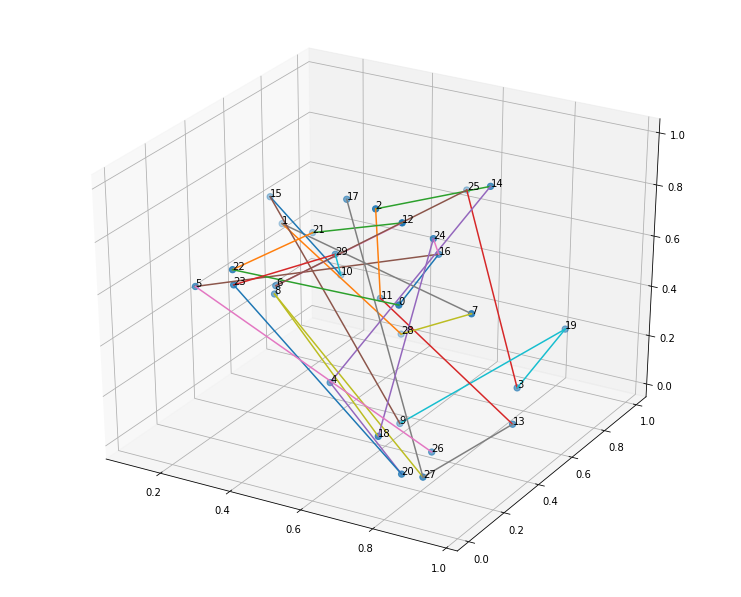

<Figure size 432x288 with 0 Axes>

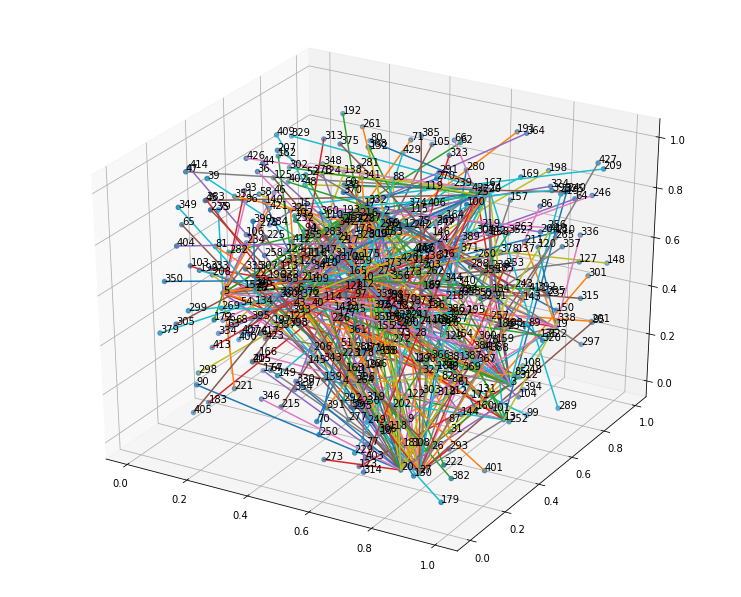

number of closed triangles is 3
number of open triangles is 225
average distance is 0.6334954920537925


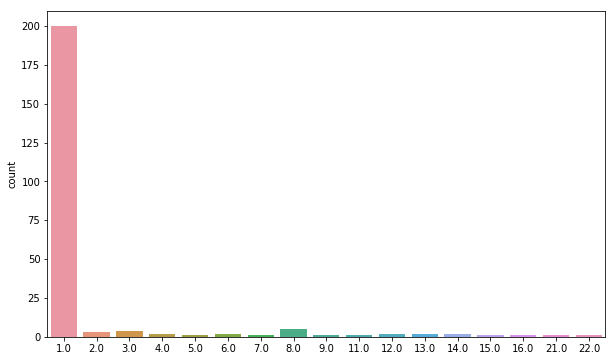

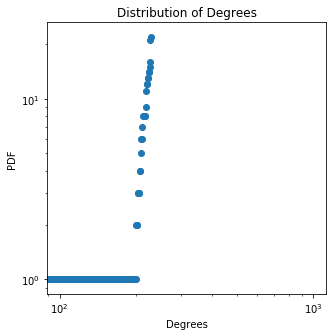

The clustering coefficient is 0.013333333333333334
Node with highest degree is: 20 with a degree of: 22.0 , the mean is 2.008695652173913 , the variance is 10.62601134215501


In [48]:
deg = rich_get_richer(n=400)[0]

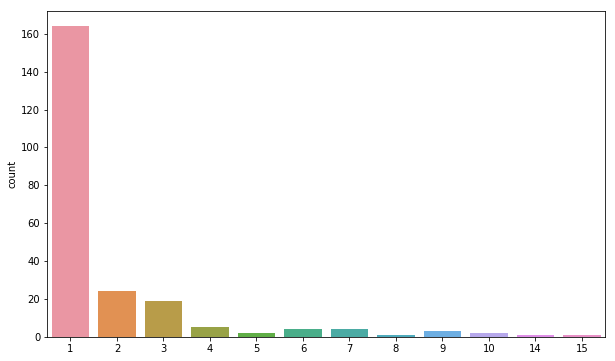

int32


In [47]:
sample = truncated_power_law(2,16,230)
fig = plt.figure(figsize=(10,6))
sns.countplot(sample)
plt.show()

Here, preferential attachment seem to work as expected. We can check this intuition by visualizing how a power-law distribution would look like.

In [7]:
ks_2samp(deg,sample)

Ks_2sampResult(statistic=0.08260869565217388, pvalue=0.39738666034271625)

To verify whether or not it is reasonable to assume that the random sample of degrees comes from a specific distribution, which is the power-law, the two-sample Kolmogorov-Smirnov test is used. If the K-S statistic is small or the p-value is high (greater than the significance level, say 5%), then we cannot reject the hypothesis that the distributions of the two samples are the same. In this case, we cannot reject the null hypothesis.

### TRIAL 2

Let's try with a larger growing network, with 1500 new nodes added

number of closed triangles is 1
number of open triangles is 0
average distance is 0.5955380792215976
number of closed triangles is 1
number of open triangles is 520
average distance is 0.6502180108650647


<Figure size 432x288 with 0 Axes>

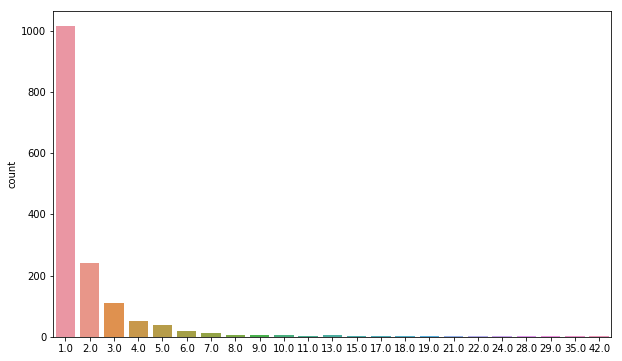

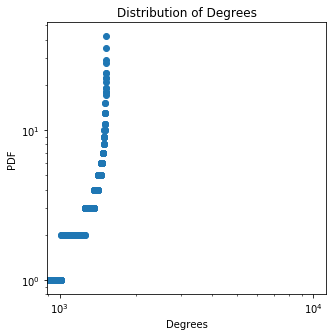

The clustering coefficient is 0.0019230769230769232
Node with highest degree is: 31 with a degree of: 42.0 , the mean is 2.0013071895424837 , the variance is 7.807841428510401
[ 9. 17. 22. ...  1.  1.  1.]


In [8]:
deg_2 = rich_get_richer(n=1500, graph=False)[0]
print(deg_2)

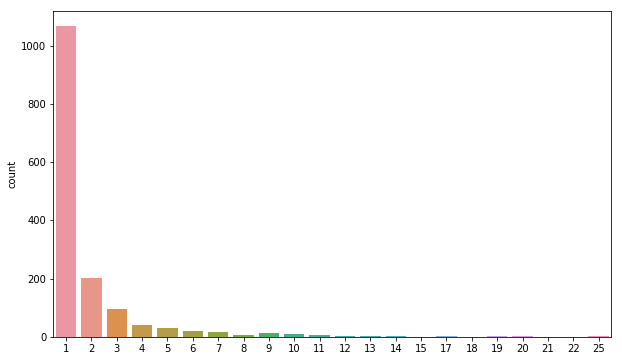

In [9]:
sample_2 = truncated_power_law(2,25,1530)
fig = plt.figure(figsize=(10,6))
sns.countplot(sample_2)
plt.show()

In [10]:
ks_2samp(sample_2,deg_2)


Ks_2sampResult(statistic=0.033986928104575154, pvalue=0.33460217245332563)

In this case the K-S statistic has a p-value still much greater than 0.05, which does not allow to reject the hypothesis that the degrees of the nodes in this particular instance of Barab´asi-Albert network are distributed according to a power-law.

However, it is advisable to check this hypothesis on a larger sample. Here are the results from a sample of 500 networks grown with 500 new nodes each:

number of closed triangles is 1
number of open triangles is 0
average distance is 0.6377128838013921
number of closed triangles is 1
number of open triangles is 192
average distance is 0.6525679025604112


<Figure size 432x288 with 0 Axes>

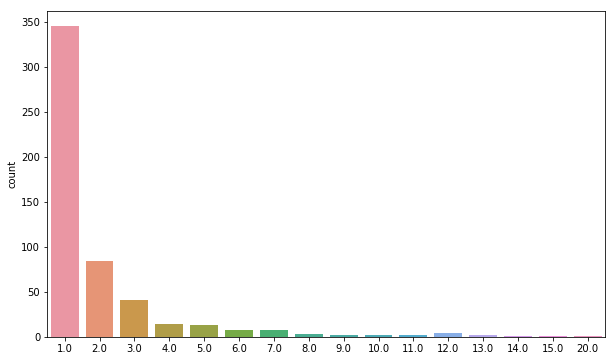

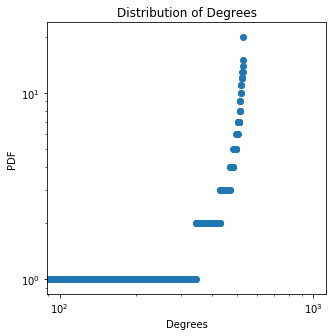

The clustering coefficient is 0.005208333333333333
Node with highest degree is: 3 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 4.992438590245638
499
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5767633942063757
number of closed triangles is 1
number of open triangles is 201
average distance is 0.6546202637980223


<Figure size 432x288 with 0 Axes>

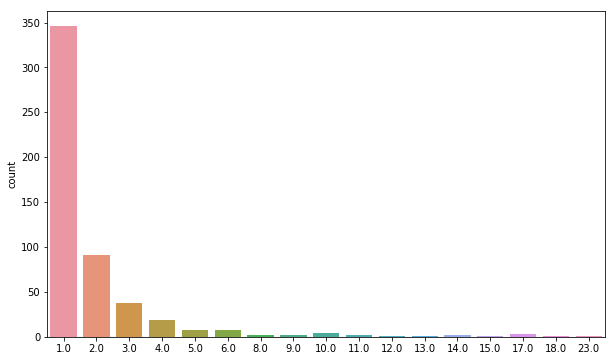

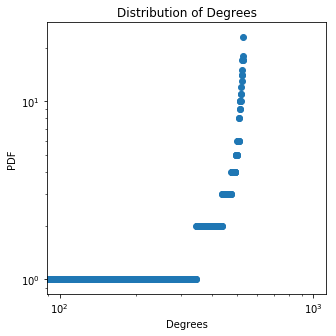

The clustering coefficient is 0.004975124378109453
Node with highest degree is: 46 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 6.222627269490923
498
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6074043876887026
number of closed triangles is 1
number of open triangles is 249
average distance is 0.6677255408878532


<Figure size 432x288 with 0 Axes>

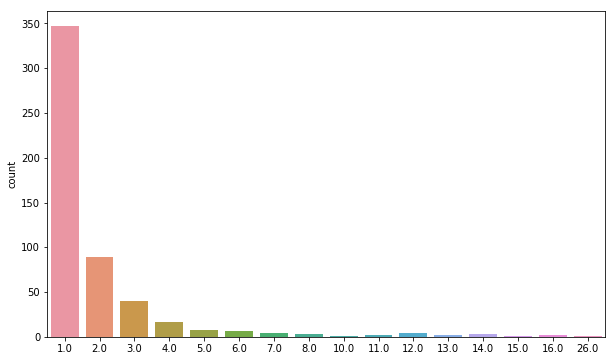

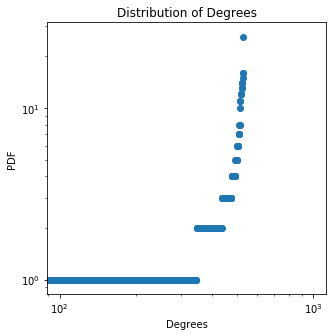

The clustering coefficient is 0.004016064257028112
Node with highest degree is: 18 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 6.166023495906017
497
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6470791772947485
number of closed triangles is 1
number of open triangles is 186
average distance is 0.6910246994874879


<Figure size 432x288 with 0 Axes>

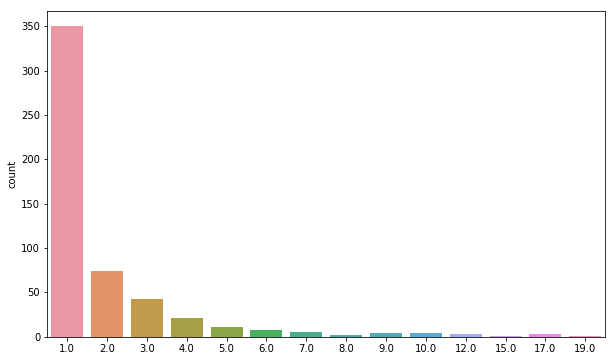

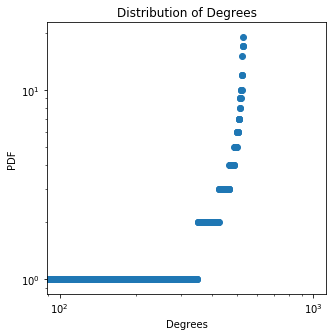

The clustering coefficient is 0.005376344086021506
Node with highest degree is: 13 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.256589533641866
496
number of closed triangles is 1
number of open triangles is 0
average distance is 0.63848391773701
number of closed triangles is 1
number of open triangles is 145
average distance is 0.667053554403705


<Figure size 432x288 with 0 Axes>

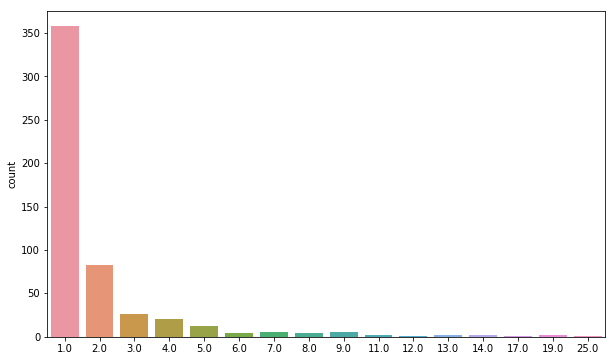

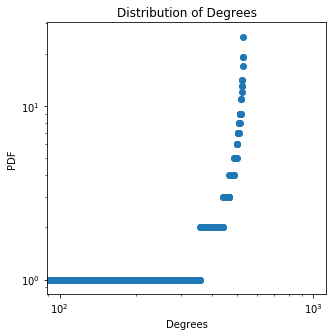

The clustering coefficient is 0.006896551724137931
Node with highest degree is: 20 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.316966892132433
495
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7510747594087593
number of closed triangles is 1
number of open triangles is 185
average distance is 0.6653648528198773


<Figure size 432x288 with 0 Axes>

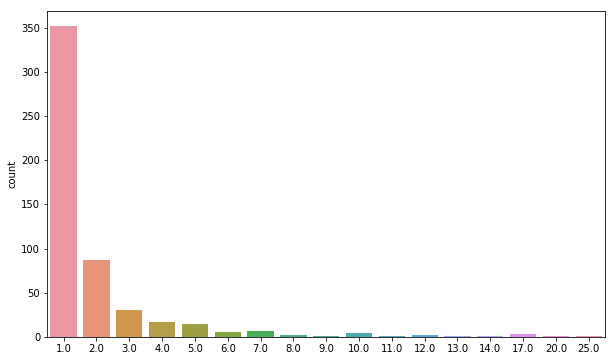

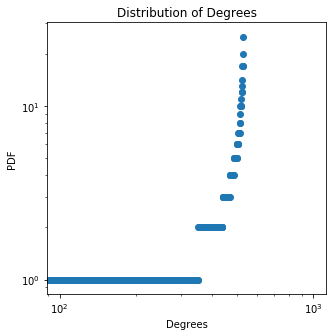

The clustering coefficient is 0.005405405405405406
Node with highest degree is: 25 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.222627269490923
494
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6582246809138316
number of closed triangles is 1
number of open triangles is 173
average distance is 0.6651297130452394


<Figure size 432x288 with 0 Axes>

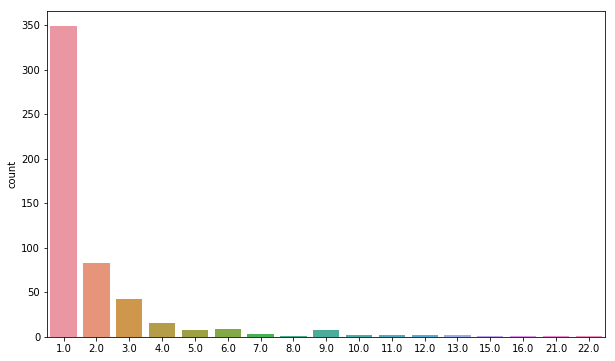

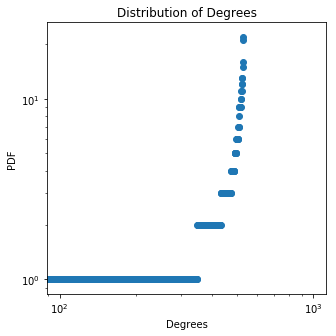

The clustering coefficient is 0.005780346820809248
Node with highest degree is: 15 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.713193307226771
493
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5906621043742499
number of closed triangles is 1
number of open triangles is 161
average distance is 0.6710396359919246


<Figure size 432x288 with 0 Axes>

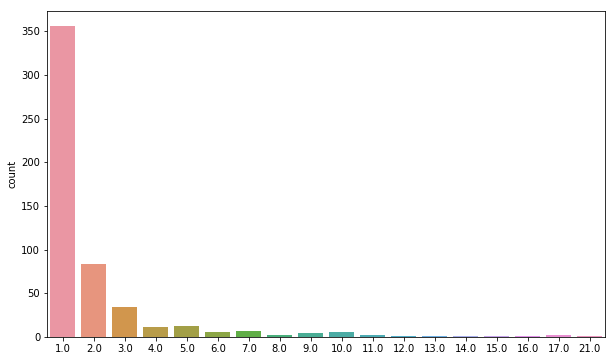

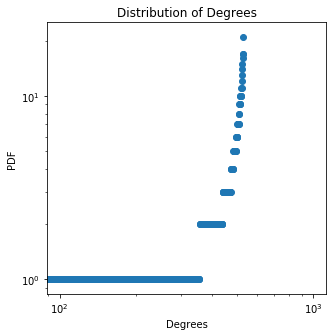

The clustering coefficient is 0.006211180124223602
Node with highest degree is: 81 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.856589533641865
492
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6874135423407739
number of closed triangles is 1
number of open triangles is 166
average distance is 0.6412836672890243


<Figure size 432x288 with 0 Axes>

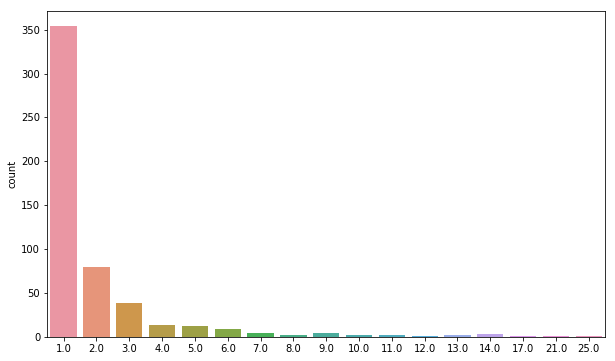

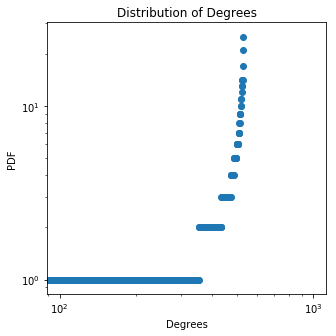

The clustering coefficient is 0.006024096385542169
Node with highest degree is: 16 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.120740477038091
491
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6171730156743532
number of closed triangles is 1
number of open triangles is 154
average distance is 0.6655756831220971


<Figure size 432x288 with 0 Axes>

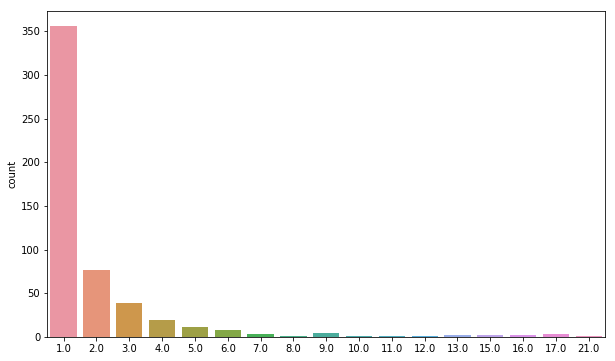

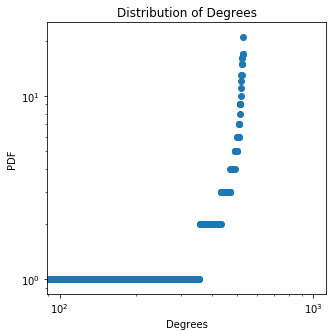

The clustering coefficient is 0.006493506493506494
Node with highest degree is: 8 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 6.1471555713777155
490
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5419462289525842
number of closed triangles is 1
number of open triangles is 224
average distance is 0.6199092243117656


<Figure size 432x288 with 0 Axes>

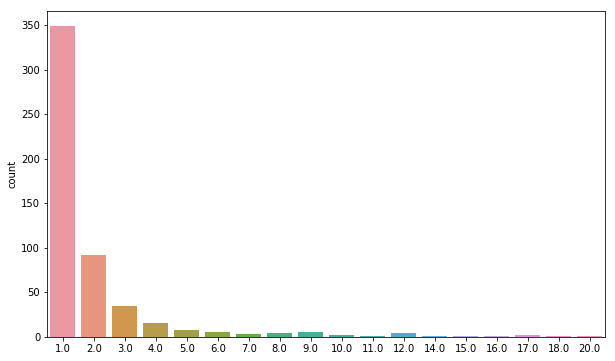

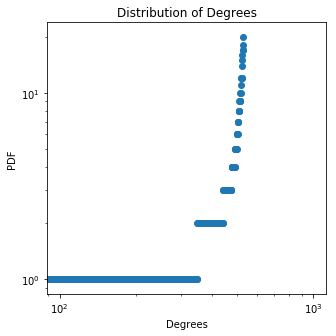

The clustering coefficient is 0.004464285714285714
Node with highest degree is: 14 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 6.052815948736206
489
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7017985177495151
number of closed triangles is 1
number of open triangles is 179
average distance is 0.6513038157008944


<Figure size 432x288 with 0 Axes>

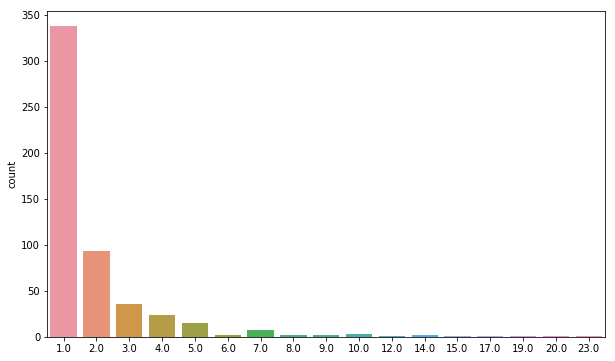

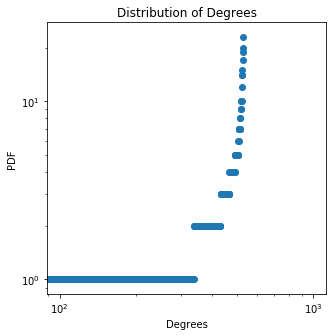

The clustering coefficient is 0.00558659217877095
Node with highest degree is: 24 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.679231043075827
488
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6749581588898067
number of closed triangles is 1
number of open triangles is 196
average distance is 0.6497051648236195


<Figure size 432x288 with 0 Axes>

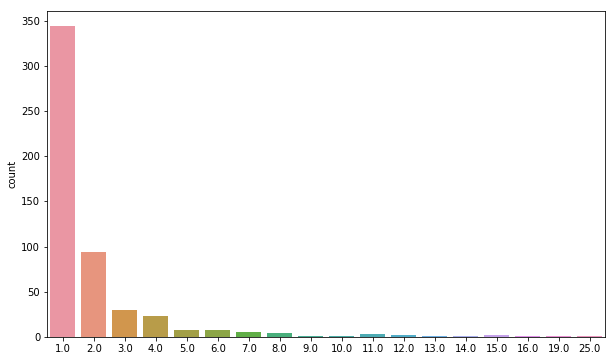

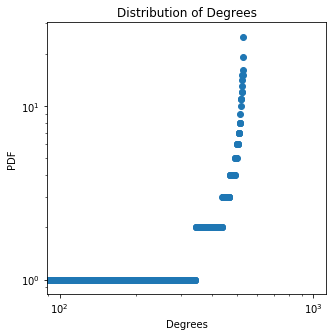

The clustering coefficient is 0.00510204081632653
Node with highest degree is: 18 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.864136703453186
487
number of closed triangles is 1
number of open triangles is 0
average distance is 0.613462967227425
number of closed triangles is 1
number of open triangles is 209
average distance is 0.6661977589218787


<Figure size 432x288 with 0 Axes>

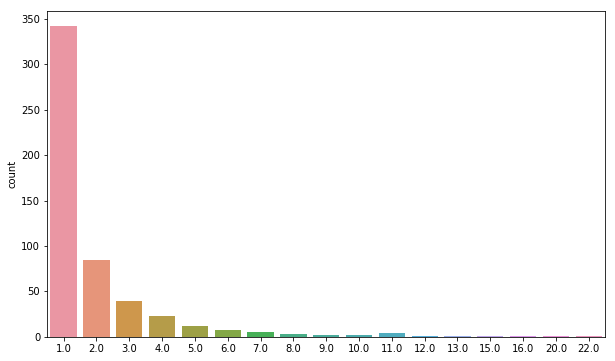

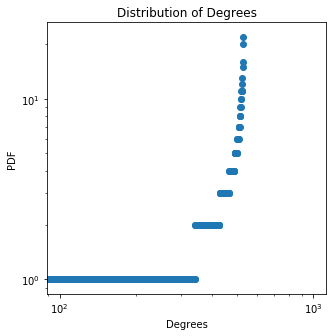

The clustering coefficient is 0.004784688995215311
Node with highest degree is: 21 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.256589533641866
486
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6751921732179805
number of closed triangles is 1
number of open triangles is 189
average distance is 0.667335618097476


<Figure size 432x288 with 0 Axes>

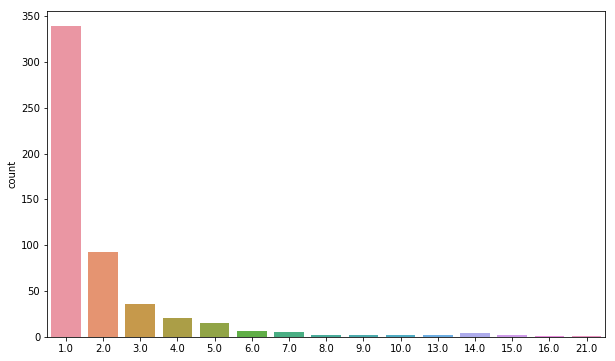

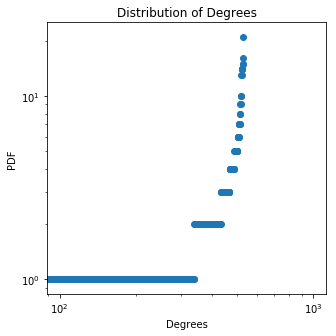

The clustering coefficient is 0.005291005291005291
Node with highest degree is: 11 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.324514061943753
485
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6449985415279154
number of closed triangles is 1
number of open triangles is 227
average distance is 0.6699486367626526


<Figure size 432x288 with 0 Axes>

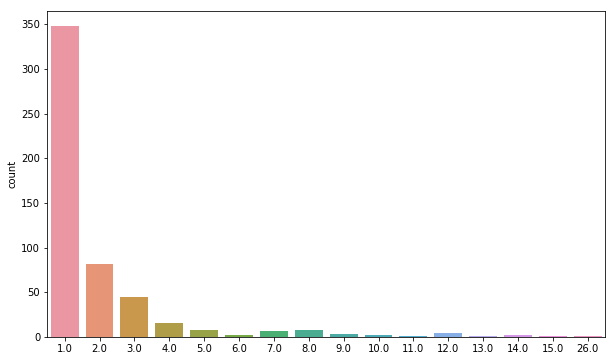

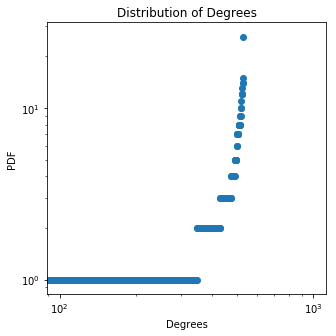

The clustering coefficient is 0.004405286343612335
Node with highest degree is: 14 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 5.535834816660734
484
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7213070277566561
number of closed triangles is 1
number of open triangles is 155
average distance is 0.6723360072506717


<Figure size 432x288 with 0 Axes>

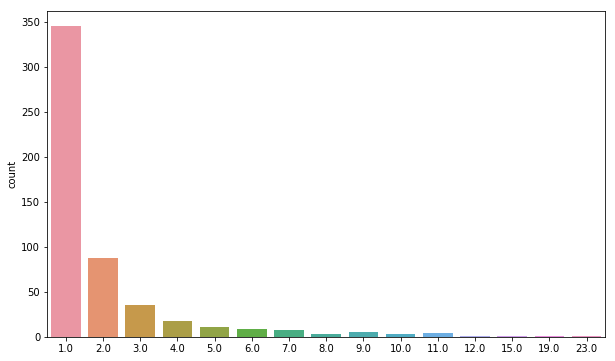

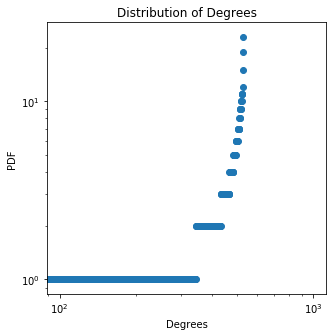

The clustering coefficient is 0.0064516129032258064
Node with highest degree is: 27 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.1584763260946955
483
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6130463136369282
number of closed triangles is 1
number of open triangles is 180
average distance is 0.6603304158966103


<Figure size 432x288 with 0 Axes>

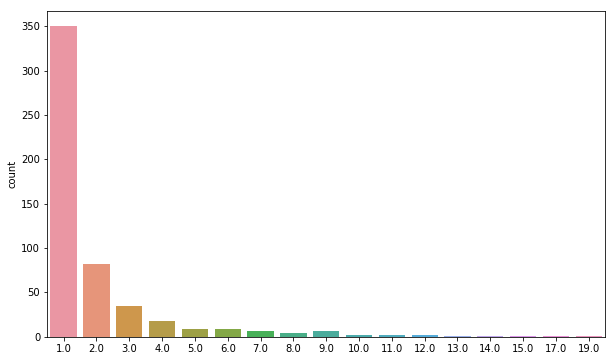

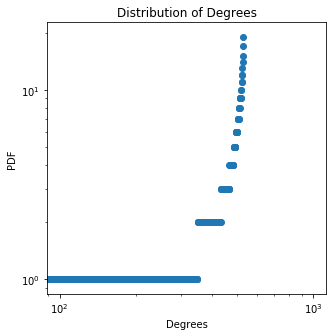

The clustering coefficient is 0.005555555555555556
Node with highest degree is: 19 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.10941972232111
482
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6888106154569326
number of closed triangles is 1
number of open triangles is 203
average distance is 0.6755775202380342


<Figure size 432x288 with 0 Axes>

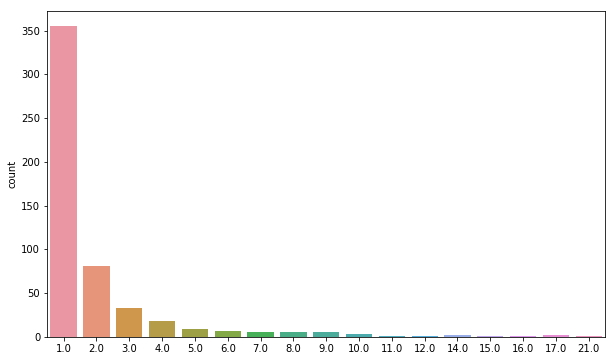

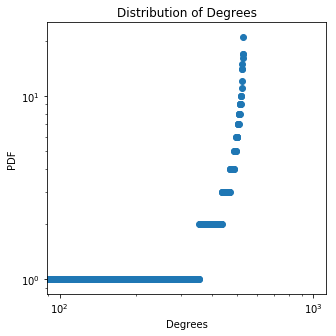

The clustering coefficient is 0.0049261083743842365
Node with highest degree is: 9 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.735834816660733
481
number of closed triangles is 1
number of open triangles is 0
average distance is 0.63582557032323
number of closed triangles is 1
number of open triangles is 242
average distance is 0.6481266614117369


<Figure size 432x288 with 0 Axes>

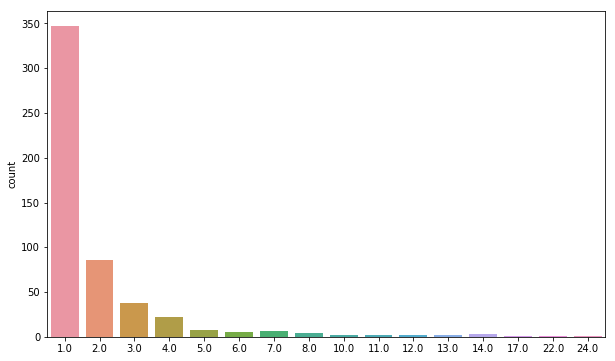

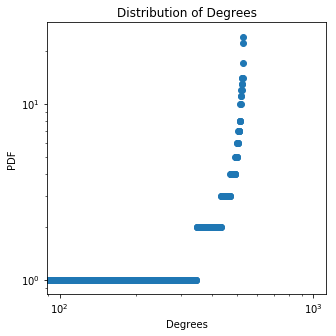

The clustering coefficient is 0.004132231404958678
Node with highest degree is: 27 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.022627269490921
480
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6536200743193811
number of closed triangles is 1
number of open triangles is 203
average distance is 0.6746435645068954


<Figure size 432x288 with 0 Axes>

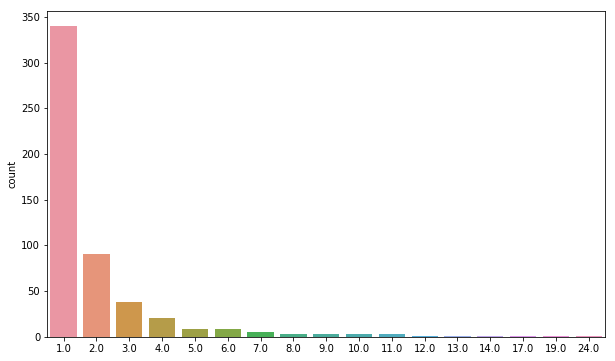

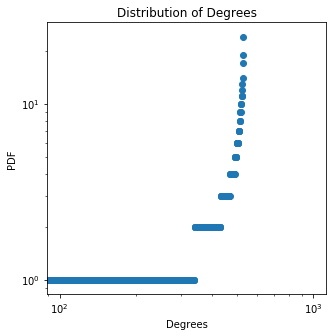

The clustering coefficient is 0.0049261083743842365
Node with highest degree is: 28 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.38866500533998
479
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5534870006692371
number of closed triangles is 1
number of open triangles is 226
average distance is 0.6405934825936714


<Figure size 432x288 with 0 Axes>

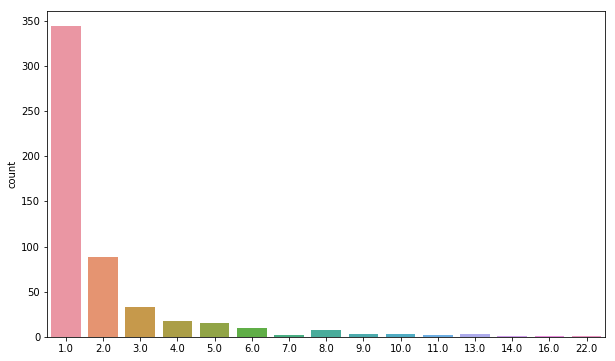

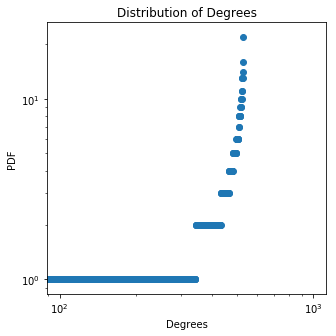

The clustering coefficient is 0.004424778761061947
Node with highest degree is: 10 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 4.99243859024564
478
number of closed triangles is 1
number of open triangles is 0
average distance is 0.72007705834836
number of closed triangles is 1
number of open triangles is 155
average distance is 0.6383424094843925


<Figure size 432x288 with 0 Axes>

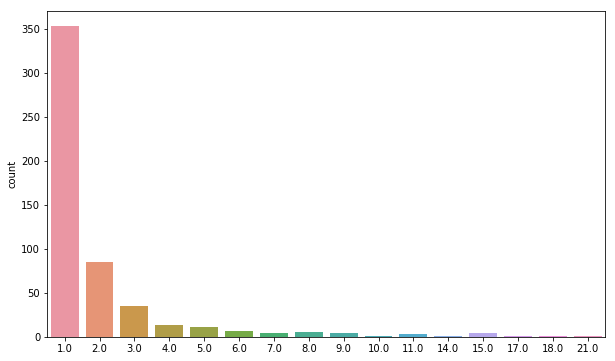

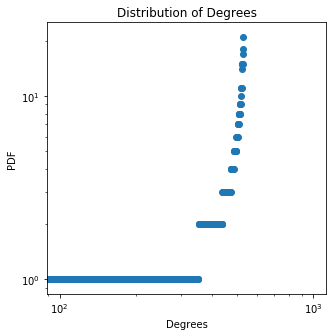

The clustering coefficient is 0.0064516129032258064
Node with highest degree is: 17 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.909419722321111
477
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6652221037206911
number of closed triangles is 1
number of open triangles is 196
average distance is 0.6712344611608473


<Figure size 432x288 with 0 Axes>

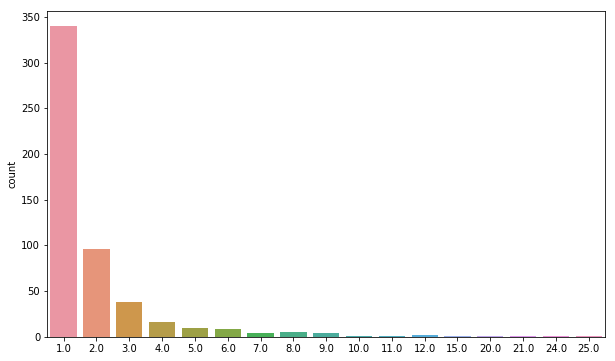

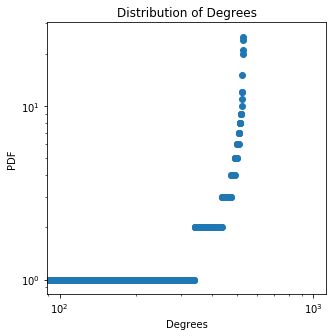

The clustering coefficient is 0.00510204081632653
Node with highest degree is: 23 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.316966892132431
476
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5700326284975025
number of closed triangles is 1
number of open triangles is 262
average distance is 0.6440543375312424


<Figure size 432x288 with 0 Axes>

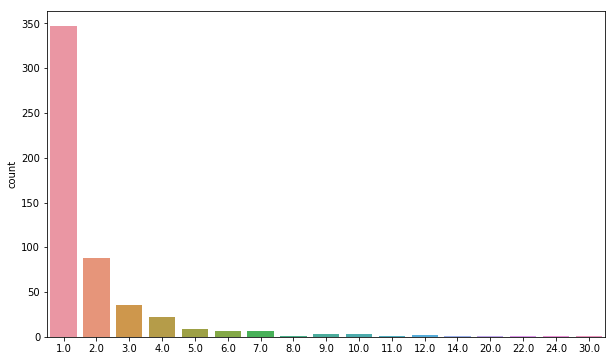

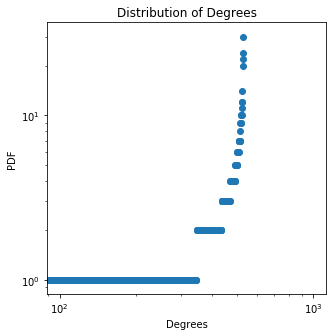

The clustering coefficient is 0.003816793893129771
Node with highest degree is: 20 with a degree of: 30.0 , the mean is 2.0037735849056606 , the variance is 6.849042363830544
475
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6592708701066525
number of closed triangles is 1
number of open triangles is 214
average distance is 0.6529032597612361


<Figure size 432x288 with 0 Axes>

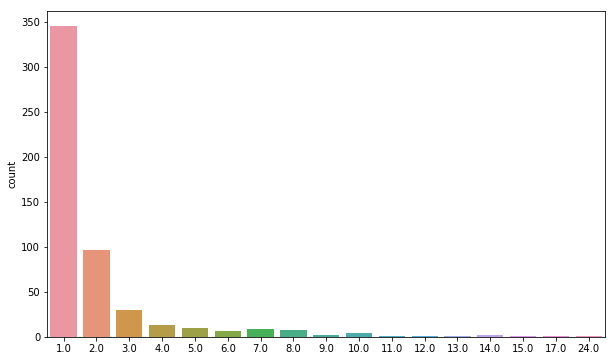

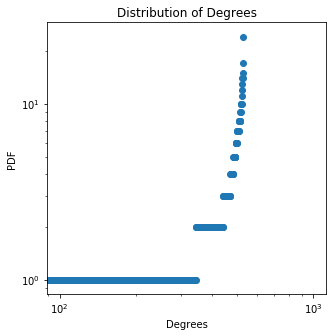

The clustering coefficient is 0.004672897196261682
Node with highest degree is: 2 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.49432538269847
474
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5727018354149102
number of closed triangles is 1
number of open triangles is 184
average distance is 0.6593939435464816


<Figure size 432x288 with 0 Axes>

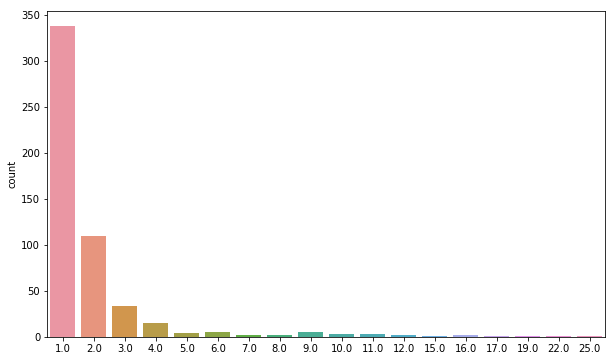

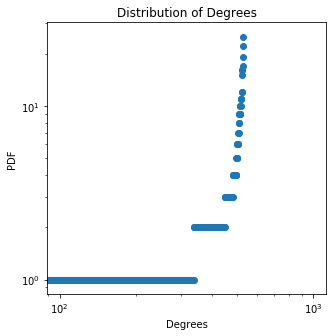

The clustering coefficient is 0.005434782608695652
Node with highest degree is: 16 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.70564613741545
473
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6398242158453945
number of closed triangles is 1
number of open triangles is 158
average distance is 0.644131644538139


<Figure size 432x288 with 0 Axes>

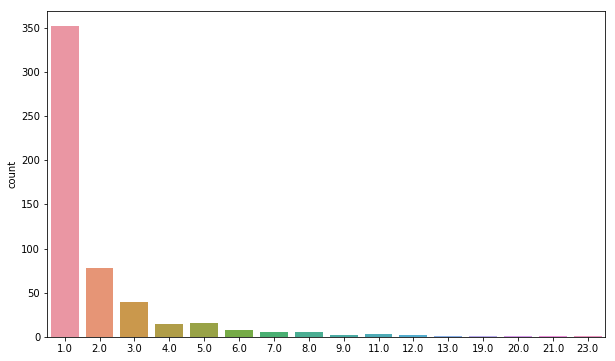

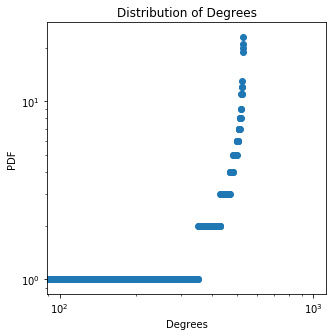

The clustering coefficient is 0.006329113924050633
Node with highest degree is: 4 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.89809896760413
472
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7053882470082484
number of closed triangles is 1
number of open triangles is 191
average distance is 0.691122396251025


<Figure size 432x288 with 0 Axes>

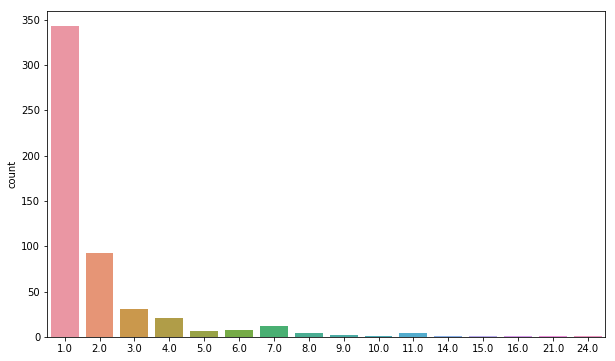

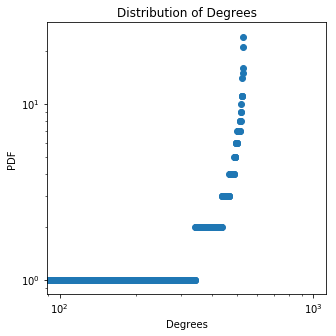

The clustering coefficient is 0.005235602094240838
Node with highest degree is: 18 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.516966892132432
471
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6689914153433894
number of closed triangles is 1
number of open triangles is 211
average distance is 0.6681539091595287


<Figure size 432x288 with 0 Axes>

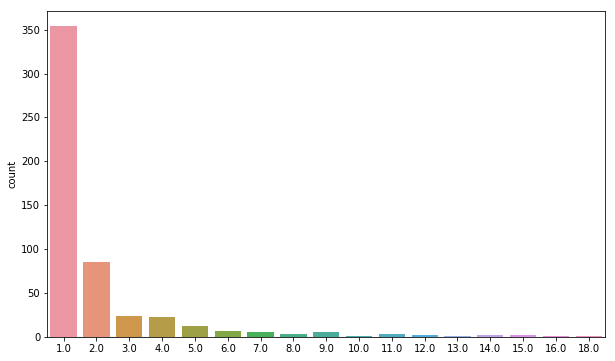

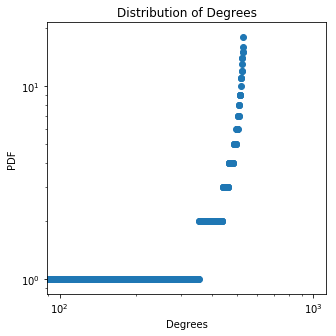

The clustering coefficient is 0.004739336492890996
Node with highest degree is: 16 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.4150800996796
470
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7237369146156724
number of closed triangles is 1
number of open triangles is 175
average distance is 0.646530804603494


<Figure size 432x288 with 0 Axes>

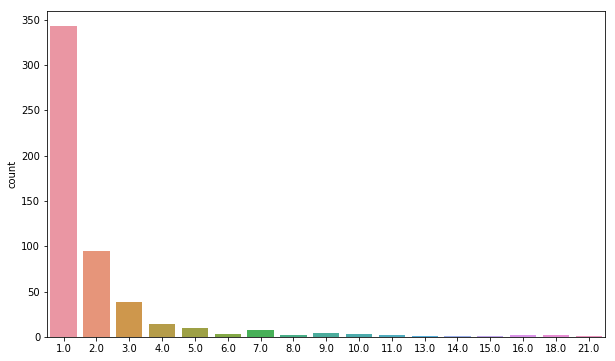

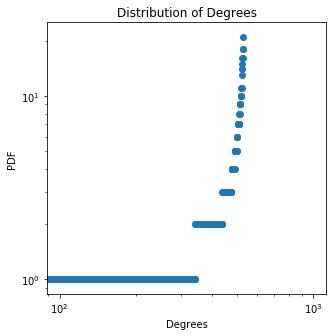

The clustering coefficient is 0.005714285714285714
Node with highest degree is: 2 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.841495194019225
469
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6164656619894333
number of closed triangles is 1
number of open triangles is 126
average distance is 0.6518411553758869


<Figure size 432x288 with 0 Axes>

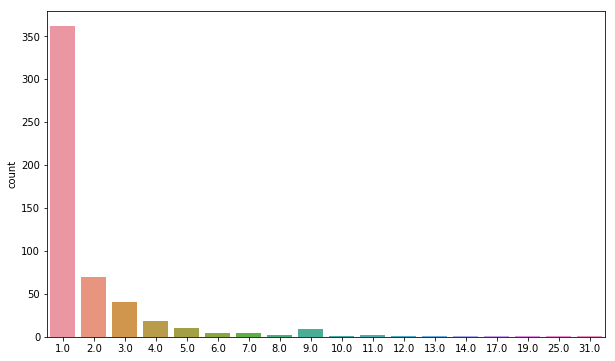

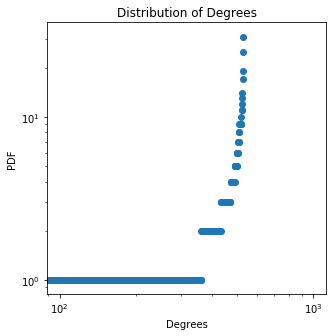

The clustering coefficient is 0.007936507936507936
Node with highest degree is: 8 with a degree of: 31.0 , the mean is 2.0037735849056606 , the variance is 7.041495194019224
468
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7221774767488839
number of closed triangles is 1
number of open triangles is 222
average distance is 0.6886312816070038


<Figure size 432x288 with 0 Axes>

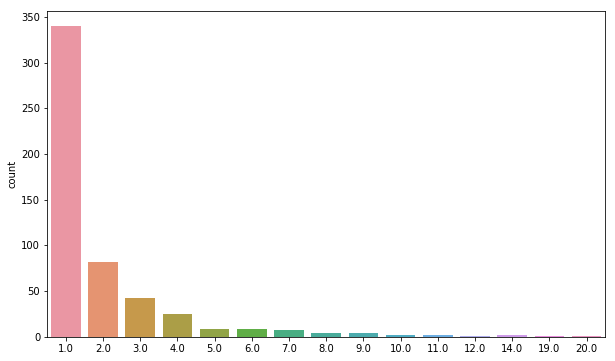

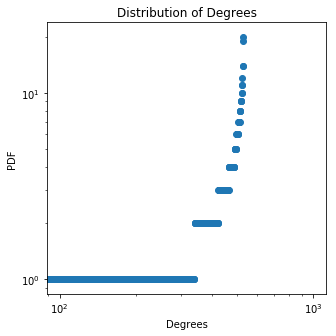

The clustering coefficient is 0.0045045045045045045
Node with highest degree is: 5 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 4.724514061943752
467
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7000260652805658
number of closed triangles is 1
number of open triangles is 255
average distance is 0.6721706414566018


<Figure size 432x288 with 0 Axes>

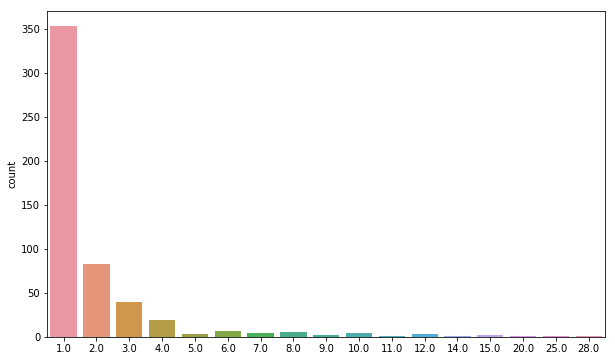

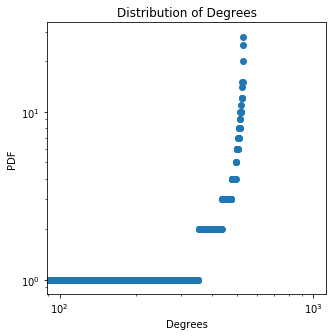

The clustering coefficient is 0.00392156862745098
Node with highest degree is: 3 with a degree of: 28.0 , the mean is 2.0037735849056606 , the variance is 6.856589533641867
466
number of closed triangles is 1
number of open triangles is 0
average distance is 0.63168853506037
number of closed triangles is 1
number of open triangles is 241
average distance is 0.6550017400457396


<Figure size 432x288 with 0 Axes>

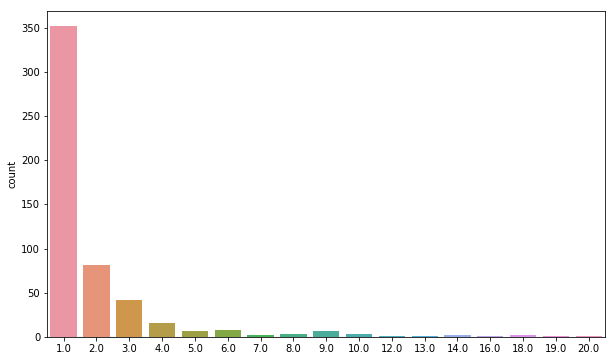

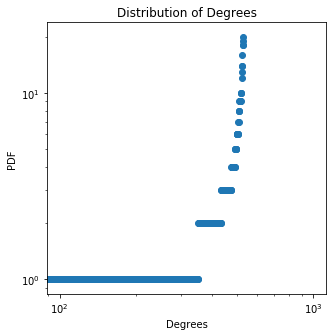

The clustering coefficient is 0.004149377593360996
Node with highest degree is: 27 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.984891420434318
465
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6567115057669051
number of closed triangles is 1
number of open triangles is 225
average distance is 0.6924337393686147


<Figure size 432x288 with 0 Axes>

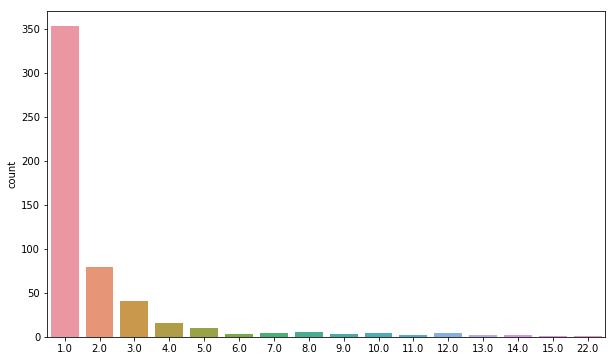

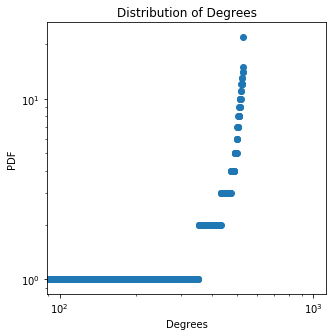

The clustering coefficient is 0.0044444444444444444
Node with highest degree is: 16 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.547155571377714
464
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7182957606804076
number of closed triangles is 1
number of open triangles is 220
average distance is 0.6807946290808846


<Figure size 432x288 with 0 Axes>

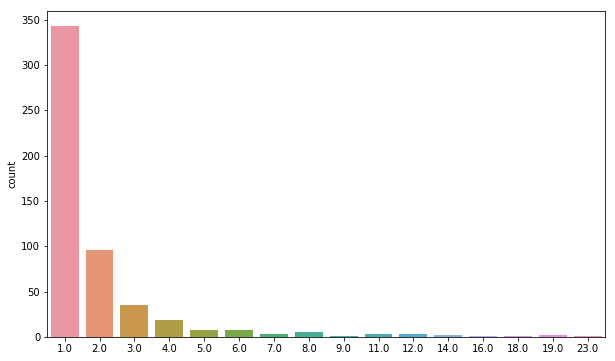

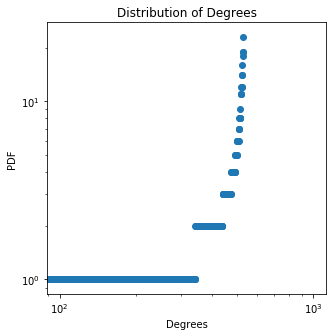

The clustering coefficient is 0.004545454545454545
Node with highest degree is: 25 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 6.143381986472056
463
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6179997272944991
number of closed triangles is 1
number of open triangles is 217
average distance is 0.6387166299723375


<Figure size 432x288 with 0 Axes>

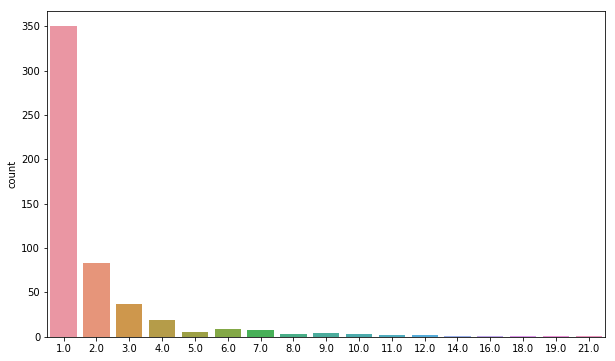

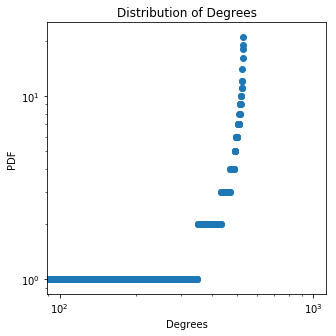

The clustering coefficient is 0.004608294930875576
Node with highest degree is: 13 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.577344250622998
462
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6445256078925224
number of closed triangles is 1
number of open triangles is 206
average distance is 0.6694294945191659


<Figure size 432x288 with 0 Axes>

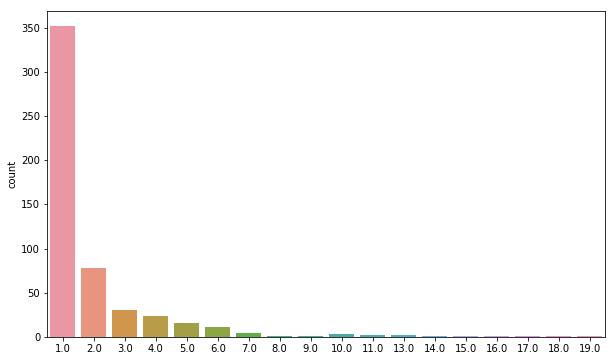

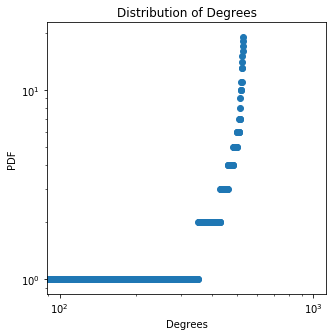

The clustering coefficient is 0.0048543689320388345
Node with highest degree is: 29 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.392438590245639
461
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6040126459488364
number of closed triangles is 1
number of open triangles is 209
average distance is 0.6437995125193554


<Figure size 432x288 with 0 Axes>

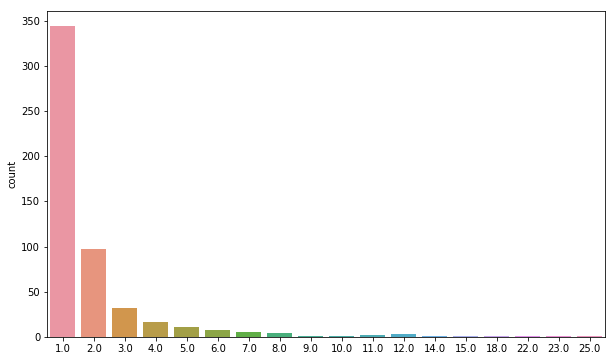

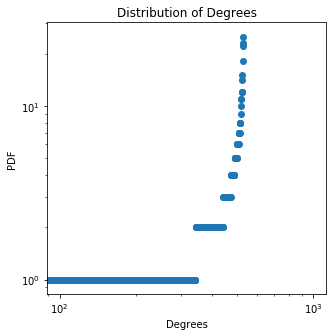

The clustering coefficient is 0.004784688995215311
Node with highest degree is: 9 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.5094197223211125
460
number of closed triangles is 1
number of open triangles is 0
average distance is 0.8047964129227746
number of closed triangles is 1
number of open triangles is 167
average distance is 0.6828150190318345


<Figure size 432x288 with 0 Axes>

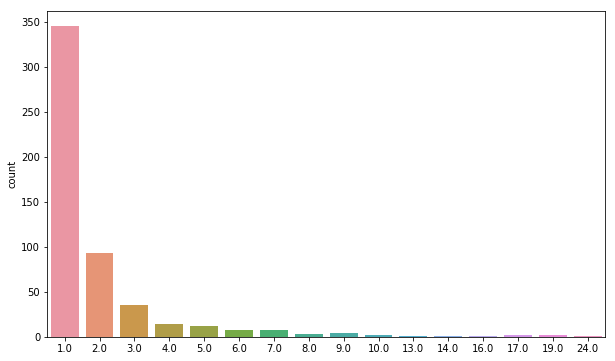

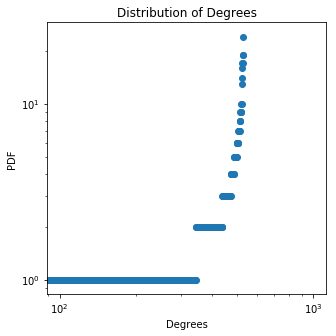

The clustering coefficient is 0.005988023952095809
Node with highest degree is: 29 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.105646137415451
459
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7082456087082372
number of closed triangles is 1
number of open triangles is 185
average distance is 0.6896264160845641


<Figure size 432x288 with 0 Axes>

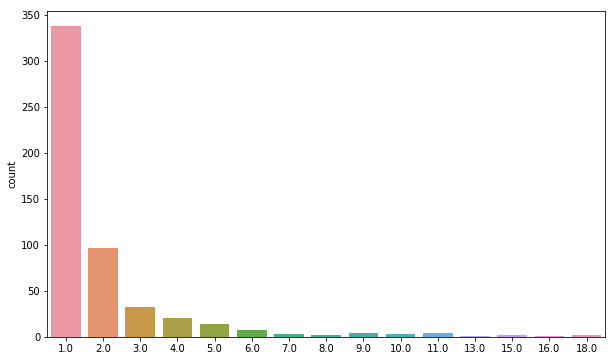

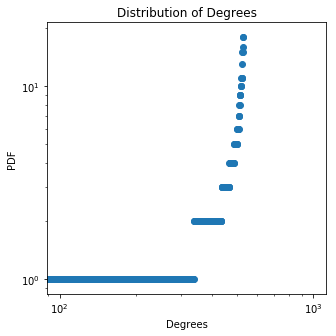

The clustering coefficient is 0.005405405405405406
Node with highest degree is: 8 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.120740477038091
458
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7428740647030174
number of closed triangles is 1
number of open triangles is 192
average distance is 0.6765797381306069


<Figure size 432x288 with 0 Axes>

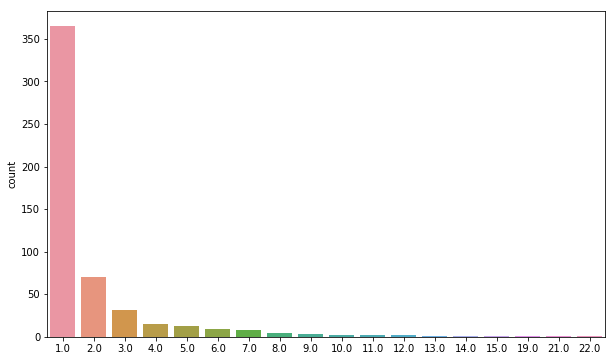

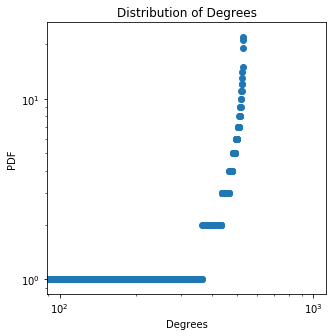

The clustering coefficient is 0.005208333333333333
Node with highest degree is: 27 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 6.003759344962621
457
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7419070963483632
number of closed triangles is 1
number of open triangles is 192
average distance is 0.6670197255514168


<Figure size 432x288 with 0 Axes>

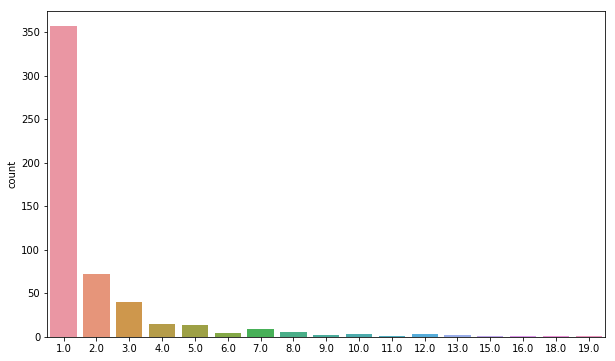

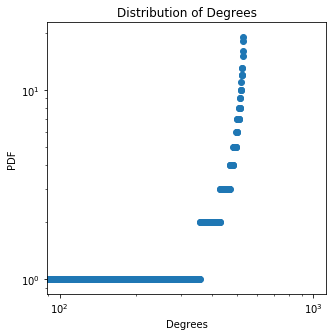

The clustering coefficient is 0.005208333333333333
Node with highest degree is: 16 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.40753292986828
456
number of closed triangles is 1
number of open triangles is 0
average distance is 0.606303069249577
number of closed triangles is 1
number of open triangles is 205
average distance is 0.6431489112304581


<Figure size 432x288 with 0 Axes>

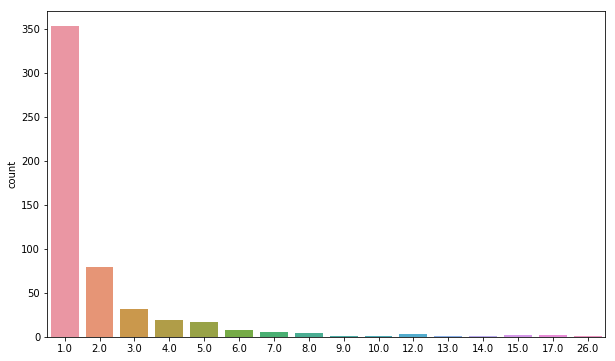

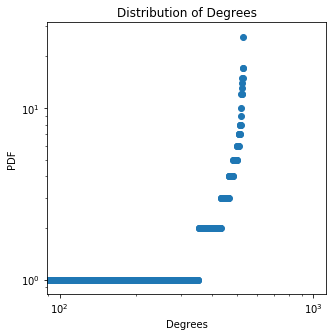

The clustering coefficient is 0.004878048780487805
Node with highest degree is: 20 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 5.80753292986828
455
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7140855535621597
number of closed triangles is 1
number of open triangles is 190
average distance is 0.66295229727135


<Figure size 432x288 with 0 Axes>

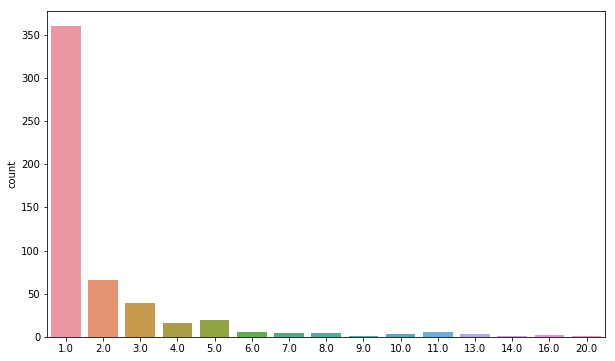

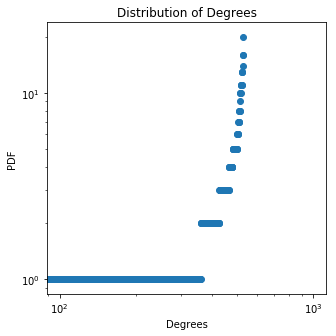

The clustering coefficient is 0.005263157894736842
Node with highest degree is: 5 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.350929156283376
454
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5894370107220802
number of closed triangles is 1
number of open triangles is 204
average distance is 0.6466635367775132


<Figure size 432x288 with 0 Axes>

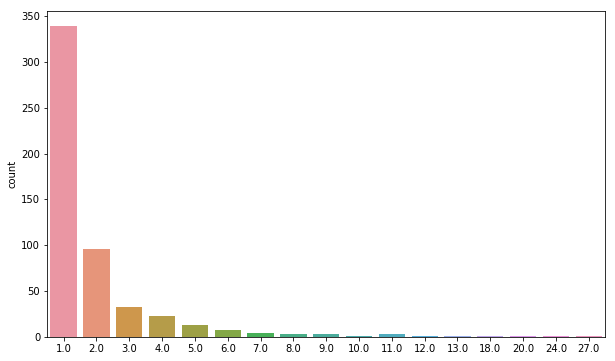

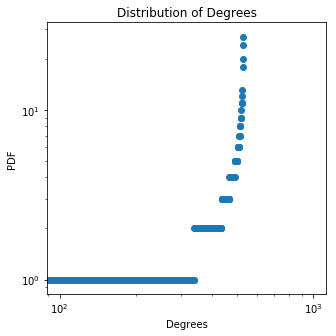

The clustering coefficient is 0.004901960784313725
Node with highest degree is: 24 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 6.1584763260946955
453
number of closed triangles is 1
number of open triangles is 0
average distance is 0.681104865728294
number of closed triangles is 1
number of open triangles is 219
average distance is 0.6705054826590441


<Figure size 432x288 with 0 Axes>

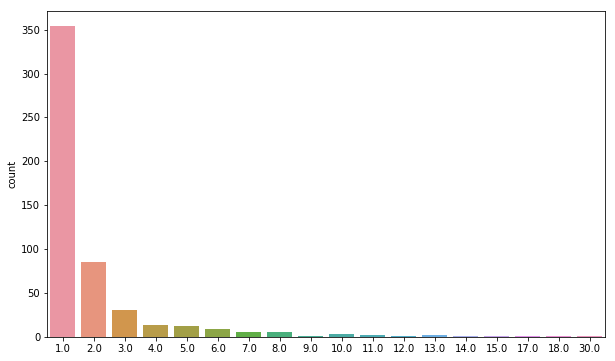

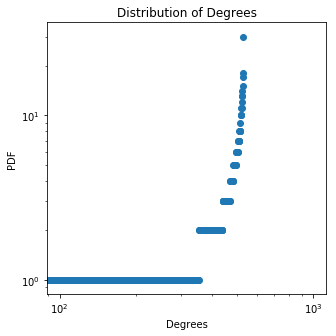

The clustering coefficient is 0.0045662100456621
Node with highest degree is: 5 with a degree of: 30.0 , the mean is 2.0037735849056606 , the variance is 6.313193307226772
452
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7379125333896177
number of closed triangles is 1
number of open triangles is 237
average distance is 0.6525769535898603


<Figure size 432x288 with 0 Axes>

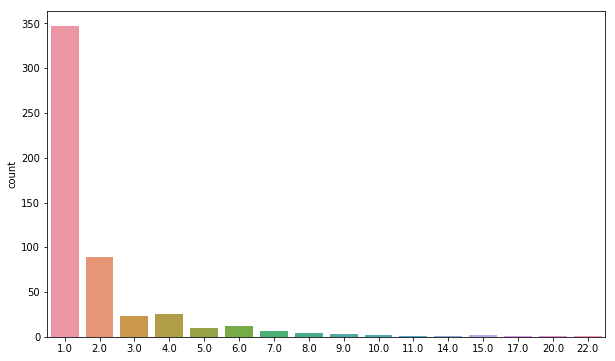

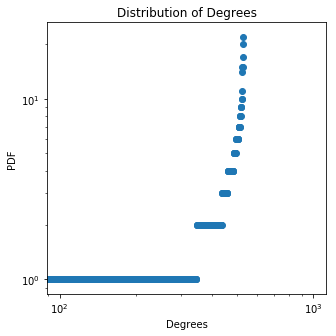

The clustering coefficient is 0.004219409282700422
Node with highest degree is: 14 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.39998576005696
451
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6572450934859115
number of closed triangles is 1
number of open triangles is 137
average distance is 0.6783820807302613


<Figure size 432x288 with 0 Axes>

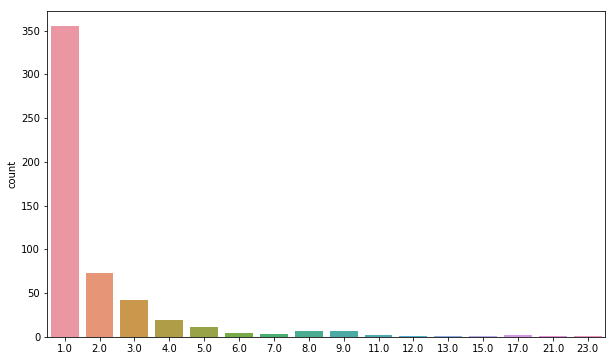

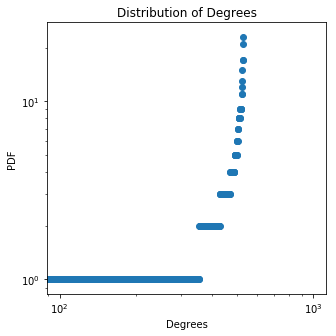

The clustering coefficient is 0.0072992700729927005
Node with highest degree is: 12 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.867910288358846
450
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6341527360346567
number of closed triangles is 1
number of open triangles is 214
average distance is 0.6516536425544752


<Figure size 432x288 with 0 Axes>

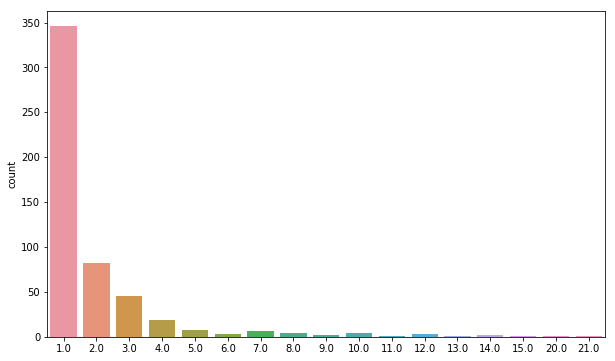

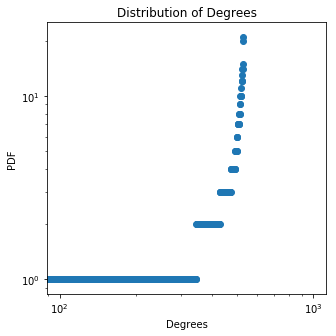

The clustering coefficient is 0.004672897196261682
Node with highest degree is: 16 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.479231043075828
449
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7059837792867353
number of closed triangles is 1
number of open triangles is 249
average distance is 0.6871457343321333


<Figure size 432x288 with 0 Axes>

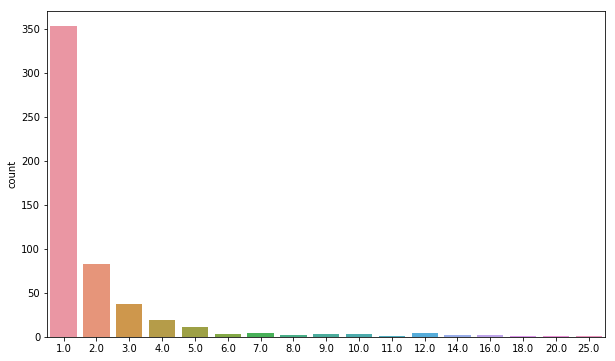

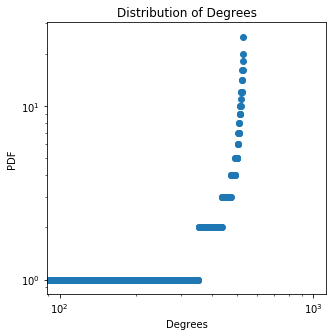

The clustering coefficient is 0.004016064257028112
Node with highest degree is: 3 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.40375934496262
448
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7596073275102543
number of closed triangles is 1
number of open triangles is 217
average distance is 0.6532995934533515


<Figure size 432x288 with 0 Axes>

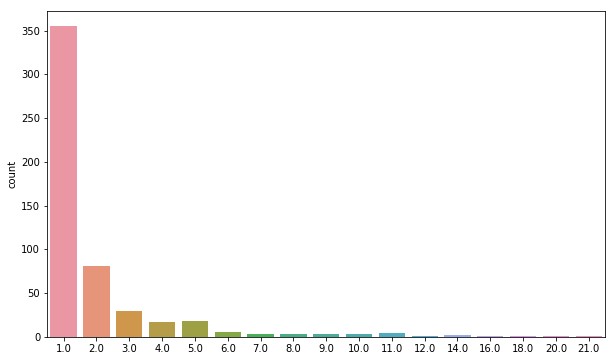

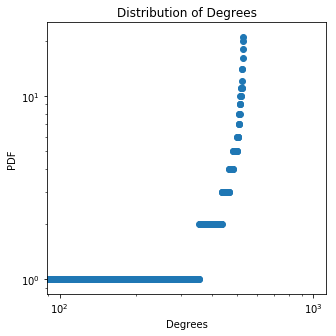

The clustering coefficient is 0.004608294930875576
Node with highest degree is: 3 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.8150800996796015
447
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7609295759838164
number of closed triangles is 1
number of open triangles is 262
average distance is 0.6713404519867532


<Figure size 432x288 with 0 Axes>

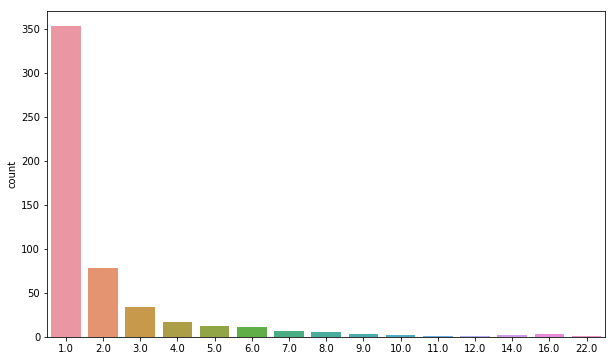

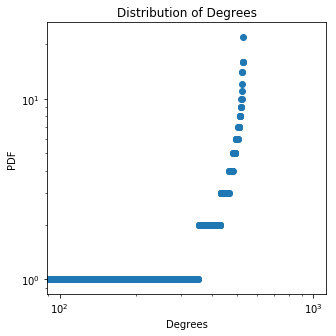

The clustering coefficient is 0.003816793893129771
Node with highest degree is: 16 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.332061231755073
446
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6137539440609229
number of closed triangles is 1
number of open triangles is 208
average distance is 0.6512947239668888


<Figure size 432x288 with 0 Axes>

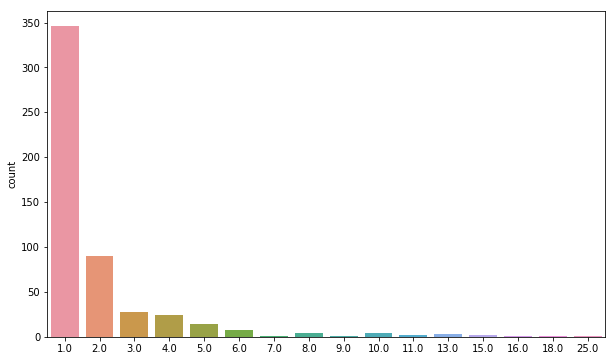

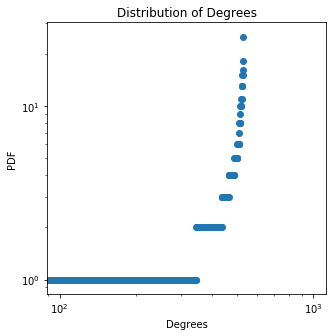

The clustering coefficient is 0.004807692307692308
Node with highest degree is: 15 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.739608401566393
445
number of closed triangles is 1
number of open triangles is 0
average distance is 0.633968457234867
number of closed triangles is 1
number of open triangles is 182
average distance is 0.645159192656453


<Figure size 432x288 with 0 Axes>

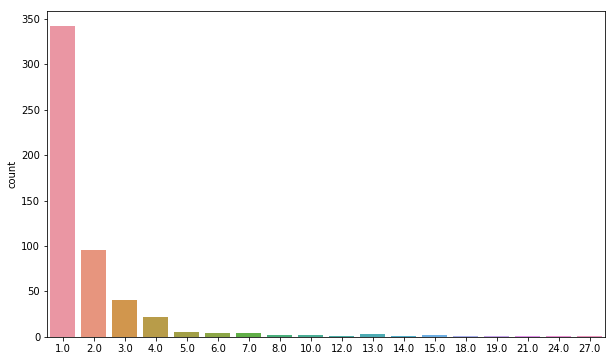

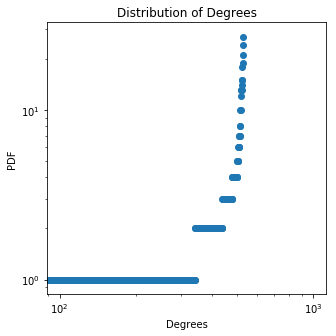

The clustering coefficient is 0.005494505494505495
Node with highest degree is: 1 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 7.245268778924885
444
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7202422499740386
number of closed triangles is 1
number of open triangles is 259
average distance is 0.650344785868628


<Figure size 432x288 with 0 Axes>

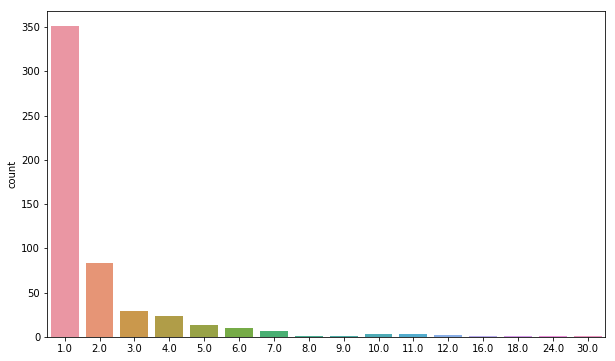

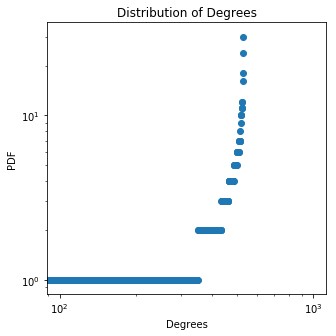

The clustering coefficient is 0.003861003861003861
Node with highest degree is: 4 with a degree of: 30.0 , the mean is 2.0037735849056606 , the variance is 6.347155571377715
443
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5807322828932033
number of closed triangles is 1
number of open triangles is 194
average distance is 0.645180843690475


<Figure size 432x288 with 0 Axes>

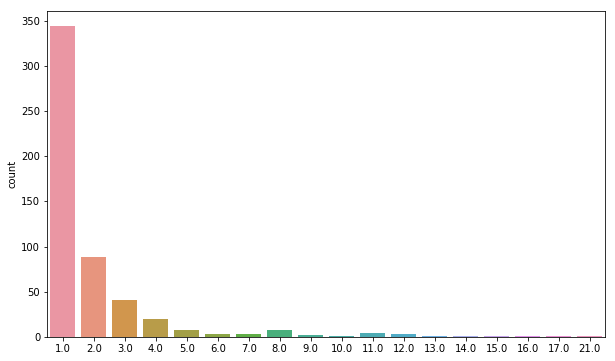

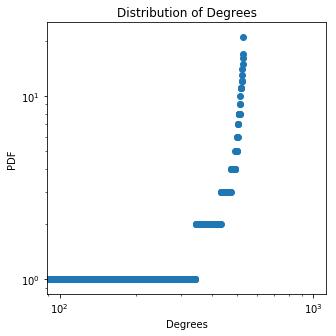

The clustering coefficient is 0.005154639175257732
Node with highest degree is: 6 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.498098967604131
442
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5569432155045407
number of closed triangles is 1
number of open triangles is 189
average distance is 0.6427272050352465


<Figure size 432x288 with 0 Axes>

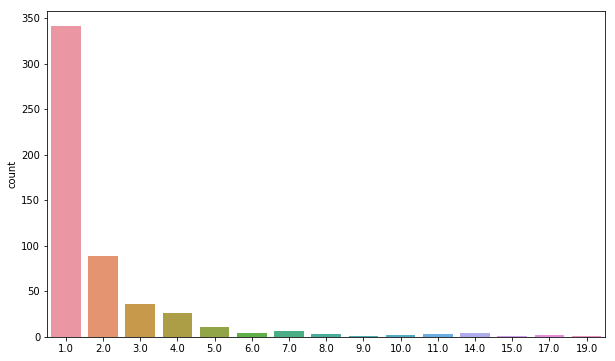

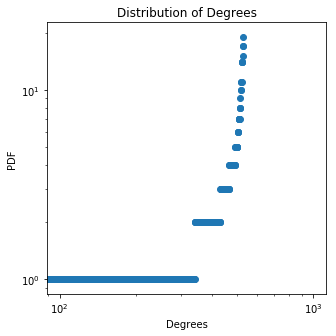

The clustering coefficient is 0.005291005291005291
Node with highest degree is: 22 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.29432538269847
441
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6364721917668867
number of closed triangles is 1
number of open triangles is 195
average distance is 0.6547197745005712


<Figure size 432x288 with 0 Axes>

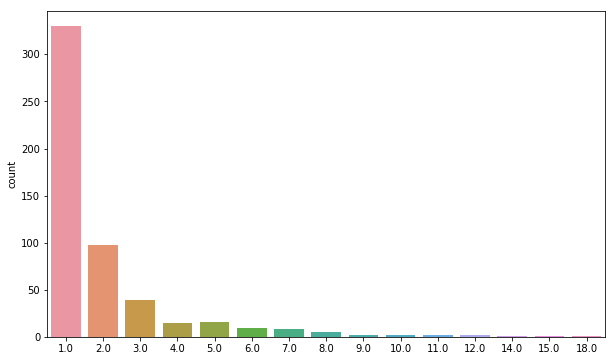

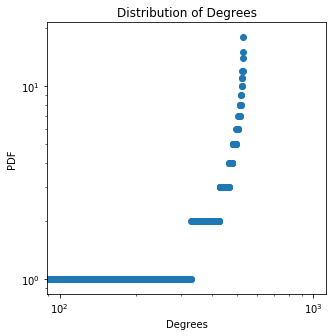

The clustering coefficient is 0.005128205128205128
Node with highest degree is: 8 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 4.252815948736204
440
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6612495156782294
number of closed triangles is 1
number of open triangles is 158
average distance is 0.6798488156717929


<Figure size 432x288 with 0 Axes>

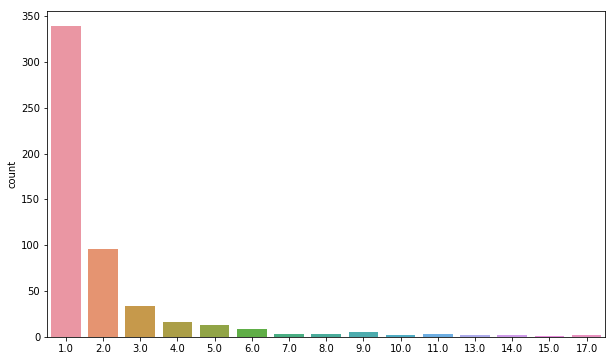

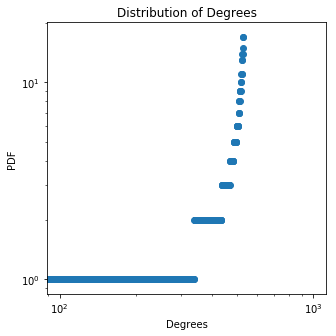

The clustering coefficient is 0.006329113924050633
Node with highest degree is: 15 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 4.99243859024564
439
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6466009023011502
number of closed triangles is 1
number of open triangles is 162
average distance is 0.6851652882114113


<Figure size 432x288 with 0 Axes>

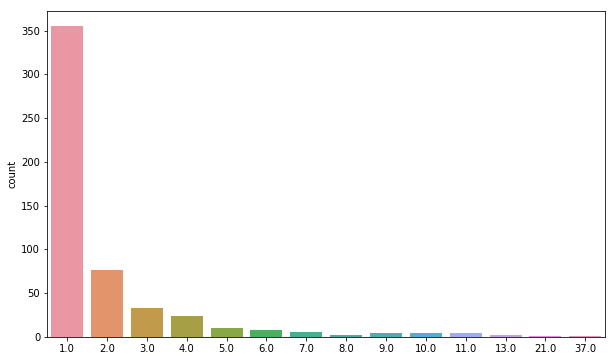

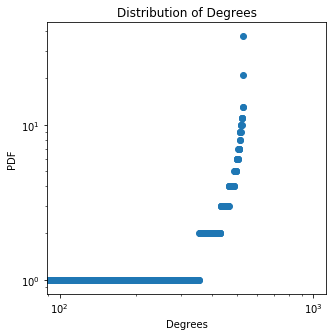

The clustering coefficient is 0.006172839506172839
Node with highest degree is: 27 with a degree of: 37.0 , the mean is 2.0037735849056606 , the variance is 6.656589533641865
438
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6740998358558443
number of closed triangles is 1
number of open triangles is 270
average distance is 0.656377738761526


<Figure size 432x288 with 0 Axes>

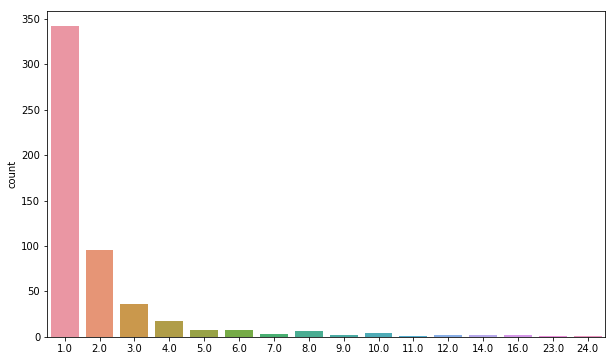

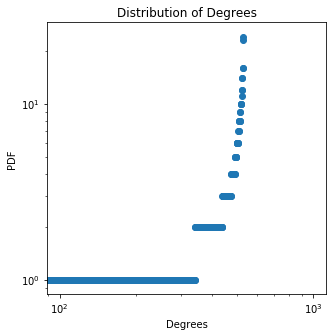

The clustering coefficient is 0.003703703703703704
Node with highest degree is: 28 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.977344250622998
437
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6142896412953124
number of closed triangles is 1
number of open triangles is 205
average distance is 0.6822078780847332


<Figure size 432x288 with 0 Axes>

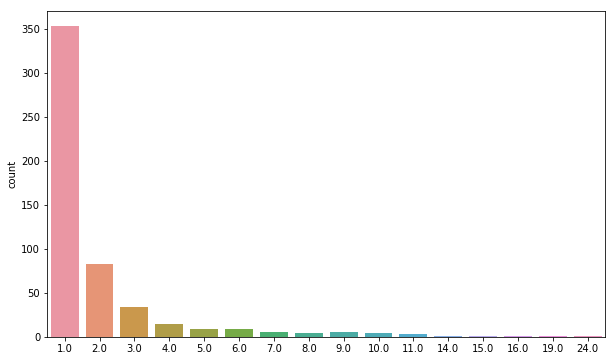

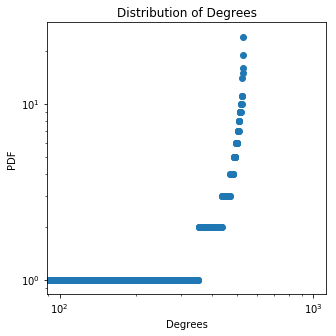

The clustering coefficient is 0.004878048780487805
Node with highest degree is: 5 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.69055179779281
436
number of closed triangles is 1
number of open triangles is 0
average distance is 0.673445515531327
number of closed triangles is 1
number of open triangles is 134
average distance is 0.6365373735437307


<Figure size 432x288 with 0 Axes>

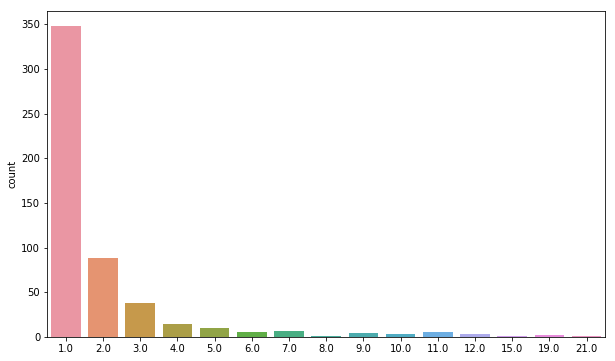

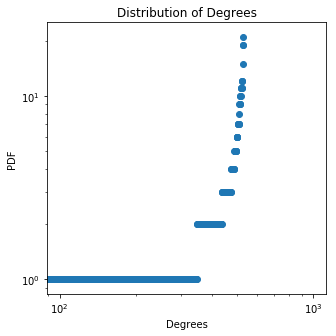

The clustering coefficient is 0.007462686567164179
Node with highest degree is: 26 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.705646137415451
435
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6516693165735862
number of closed triangles is 1
number of open triangles is 198
average distance is 0.6916419084714444


<Figure size 432x288 with 0 Axes>

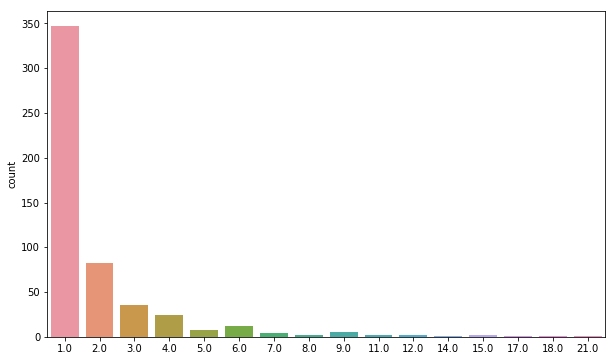

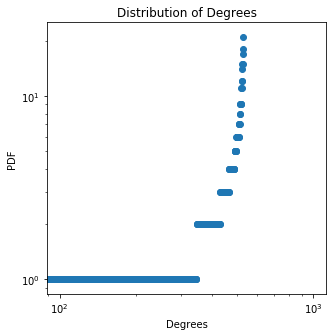

The clustering coefficient is 0.005050505050505051
Node with highest degree is: 17 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.3697970808116775
434
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6606860932204818
number of closed triangles is 1
number of open triangles is 221
average distance is 0.6749666116689117


<Figure size 432x288 with 0 Axes>

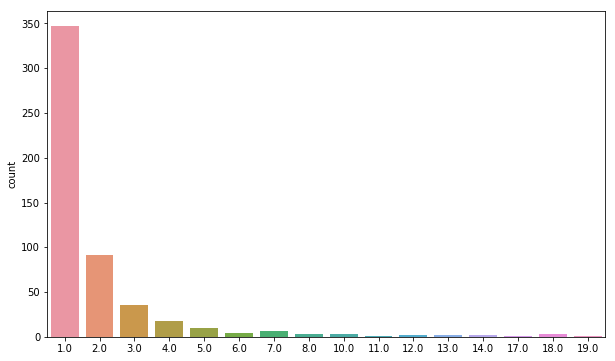

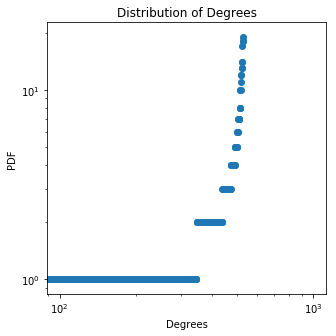

The clustering coefficient is 0.004524886877828055
Node with highest degree is: 9 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.99243859024564
433
number of closed triangles is 1
number of open triangles is 0
average distance is 0.643292969395818
number of closed triangles is 1
number of open triangles is 195
average distance is 0.6327912049801775


<Figure size 432x288 with 0 Axes>

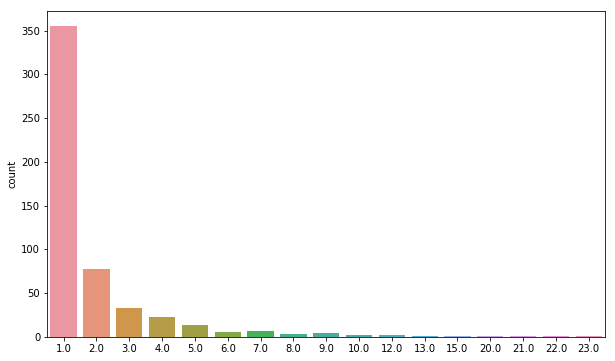

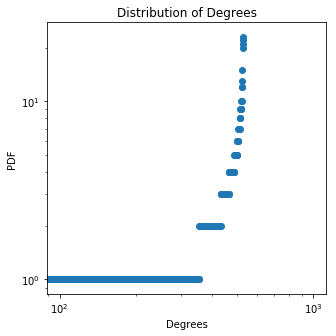

The clustering coefficient is 0.005128205128205128
Node with highest degree is: 25 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 6.226400854396583
432
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6331014195233673
number of closed triangles is 1
number of open triangles is 173
average distance is 0.6554154578410795


<Figure size 432x288 with 0 Axes>

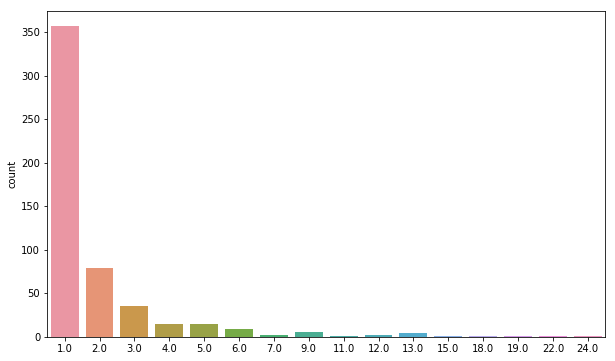

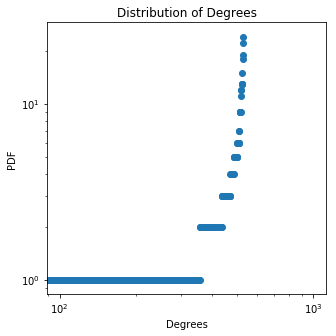

The clustering coefficient is 0.005780346820809248
Node with highest degree is: 5 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.486778212887149
431
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5664645276085519
number of closed triangles is 1
number of open triangles is 151
average distance is 0.6408308637996876


<Figure size 432x288 with 0 Axes>

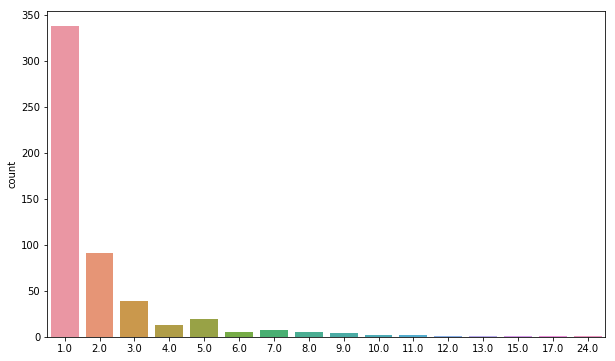

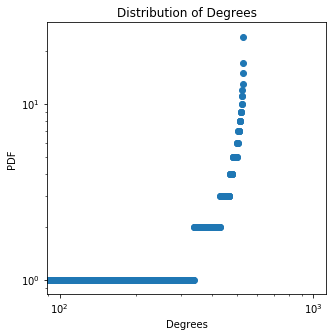

The clustering coefficient is 0.006622516556291391
Node with highest degree is: 29 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 4.943381986472055
430
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6466546746615996
number of closed triangles is 1
number of open triangles is 199
average distance is 0.6850039681501108


<Figure size 432x288 with 0 Axes>

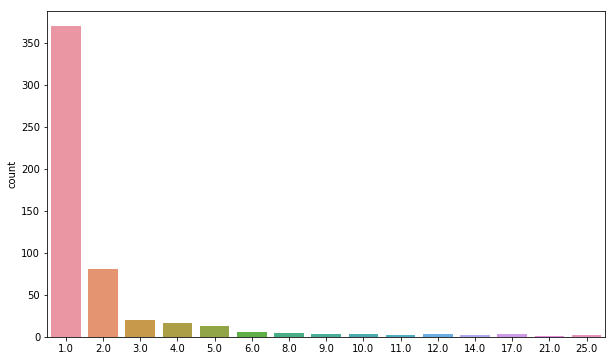

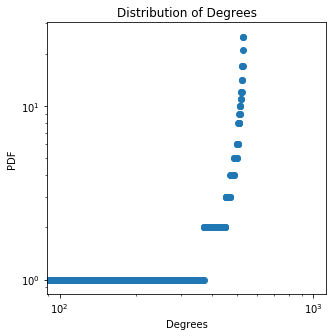

The clustering coefficient is 0.005025125628140704
Node with highest degree is: 6 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 7.603759344962619
429
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5500258662999218
number of closed triangles is 1
number of open triangles is 216
average distance is 0.6330268436005896


<Figure size 432x288 with 0 Axes>

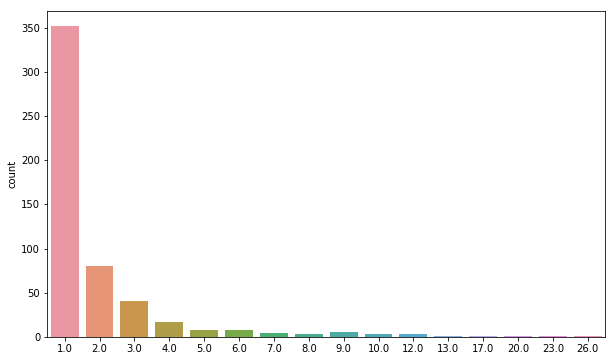

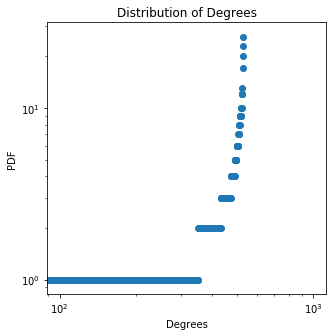

The clustering coefficient is 0.004629629629629629
Node with highest degree is: 14 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 6.30564613741545
428
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6946859042654471
number of closed triangles is 1
number of open triangles is 231
average distance is 0.676475352738041


<Figure size 432x288 with 0 Axes>

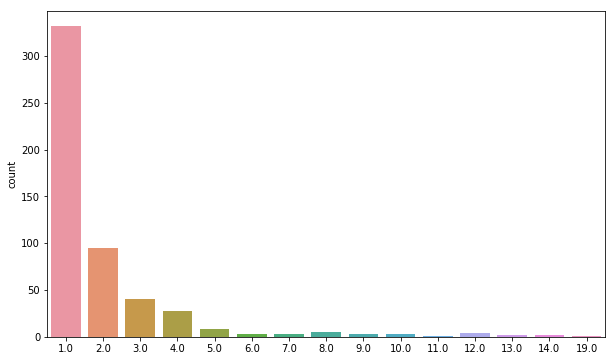

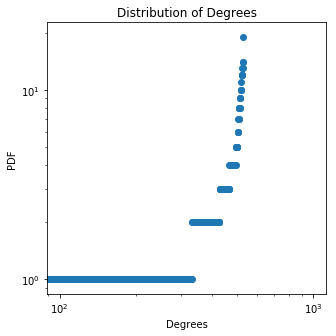

The clustering coefficient is 0.004329004329004329
Node with highest degree is: 8 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 4.7131933072267715
427
number of closed triangles is 1
number of open triangles is 0
average distance is 0.772951192768573
number of closed triangles is 1
number of open triangles is 181
average distance is 0.6659207946169226


<Figure size 432x288 with 0 Axes>

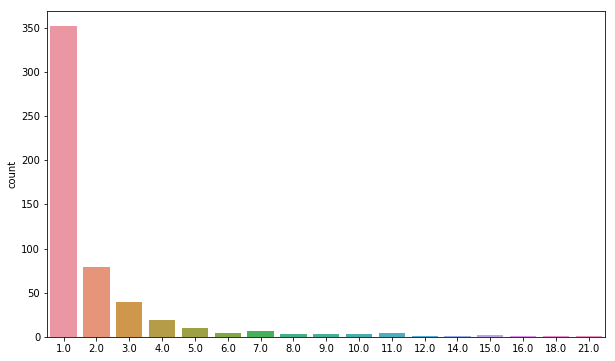

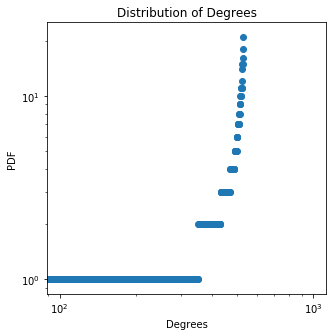

The clustering coefficient is 0.0055248618784530384
Node with highest degree is: 14 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.588665005339978
426
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7059833778282799
number of closed triangles is 1
number of open triangles is 225
average distance is 0.6419146417266799


<Figure size 432x288 with 0 Axes>

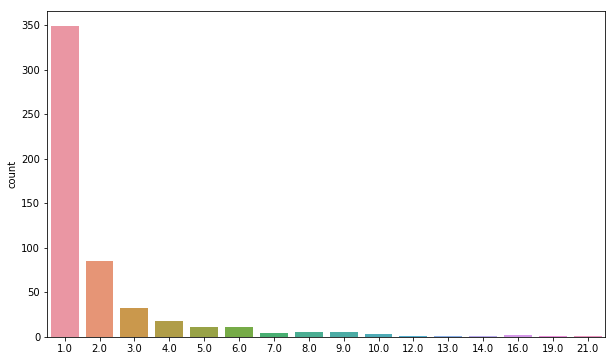

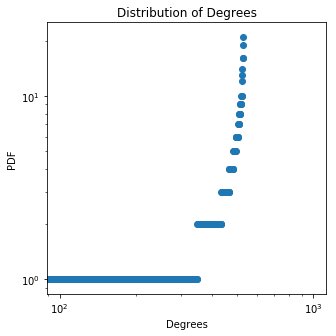

The clustering coefficient is 0.0044444444444444444
Node with highest degree is: 19 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.381117835528658
425
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6006205120379299
number of closed triangles is 1
number of open triangles is 146
average distance is 0.6706812859050113


<Figure size 432x288 with 0 Axes>

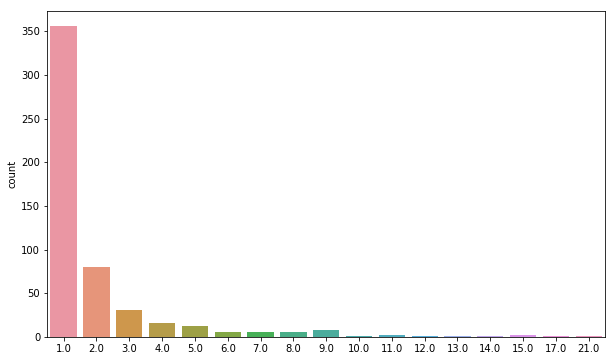

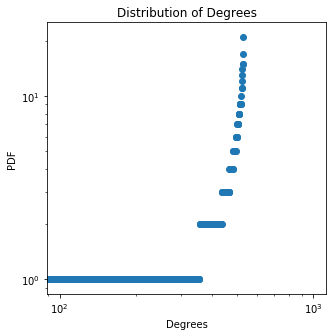

The clustering coefficient is 0.00684931506849315
Node with highest degree is: 17 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.456589533641866
424
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5976549079181831
number of closed triangles is 1
number of open triangles is 181
average distance is 0.6393007293077025


<Figure size 432x288 with 0 Axes>

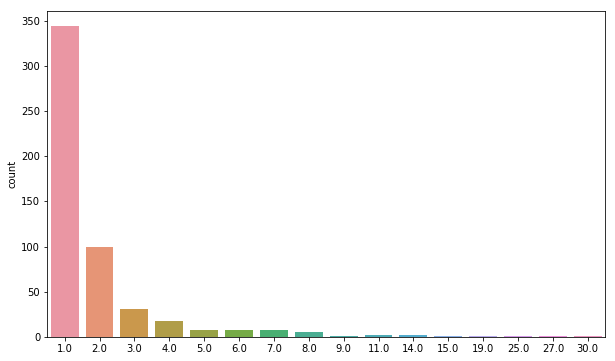

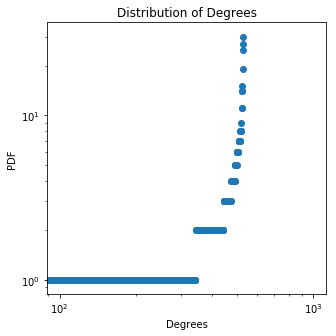

The clustering coefficient is 0.0055248618784530384
Node with highest degree is: 11 with a degree of: 30.0 , the mean is 2.0037735849056606 , the variance is 7.392438590245639
423
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6944955952701316
number of closed triangles is 1
number of open triangles is 217
average distance is 0.673357663827033


<Figure size 432x288 with 0 Axes>

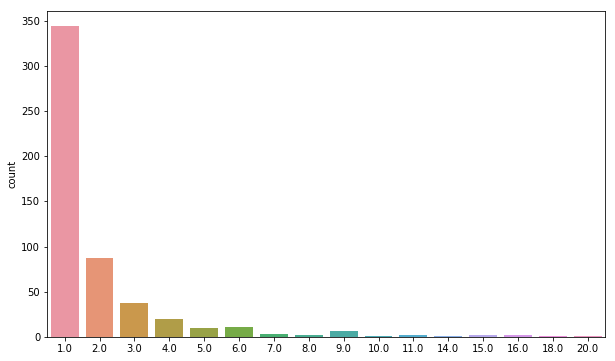

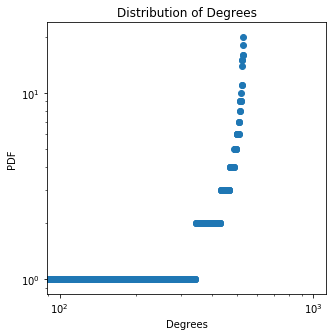

The clustering coefficient is 0.004608294930875576
Node with highest degree is: 20 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.373570665717338
422
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7059242997348705
number of closed triangles is 1
number of open triangles is 209
average distance is 0.6897721981009021


<Figure size 432x288 with 0 Axes>

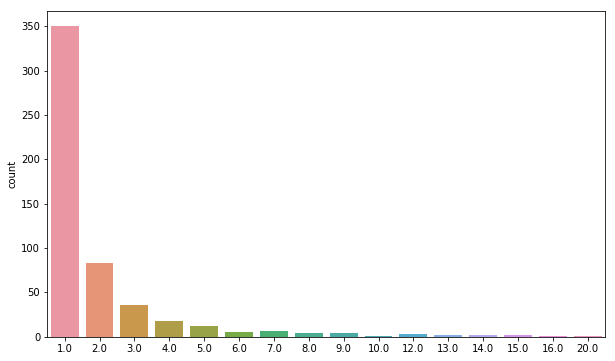

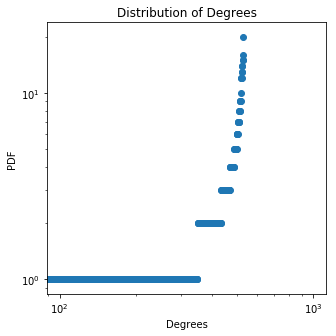

The clustering coefficient is 0.004784688995215311
Node with highest degree is: 17 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.449042363830546
421
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5410116544668029
number of closed triangles is 1
number of open triangles is 200
average distance is 0.6544802813925822


<Figure size 432x288 with 0 Axes>

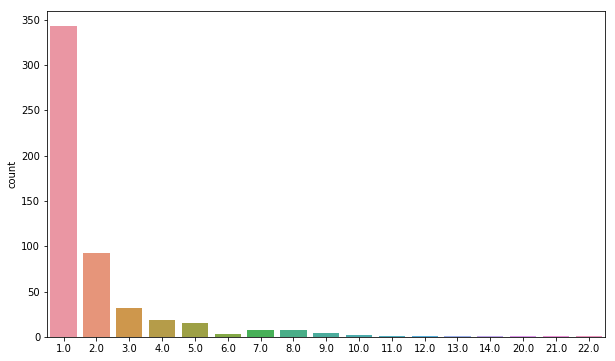

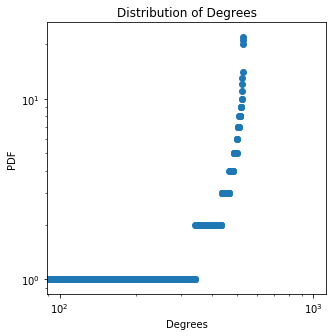

The clustering coefficient is 0.005
Node with highest degree is: 27 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.494325382698469
420
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6436555161733662
number of closed triangles is 1
number of open triangles is 215
average distance is 0.6680245557527581


<Figure size 432x288 with 0 Axes>

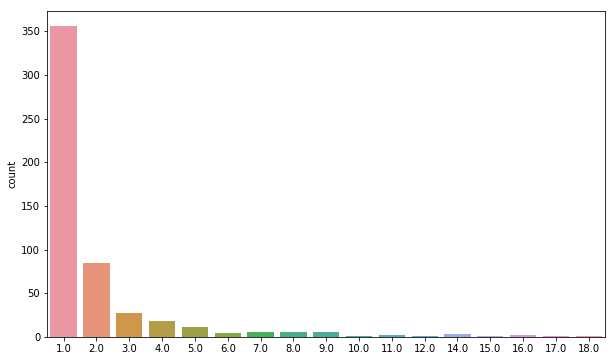

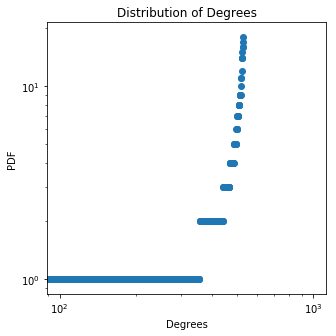

The clustering coefficient is 0.004651162790697674
Node with highest degree is: 2 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.739608401566393
419
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6786042890391538
number of closed triangles is 1
number of open triangles is 179
average distance is 0.6446443792853066


<Figure size 432x288 with 0 Axes>

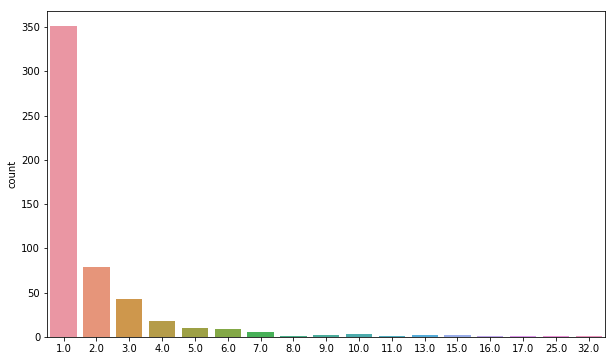

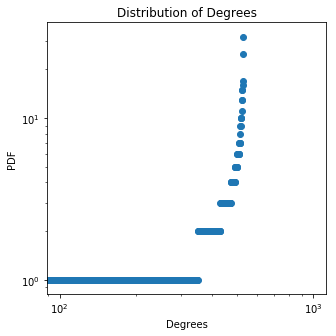

The clustering coefficient is 0.00558659217877095
Node with highest degree is: 23 with a degree of: 32.0 , the mean is 2.0037735849056606 , the variance is 6.90941972232111
418
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7068896272202818
number of closed triangles is 1
number of open triangles is 198
average distance is 0.6889395760390129


<Figure size 432x288 with 0 Axes>

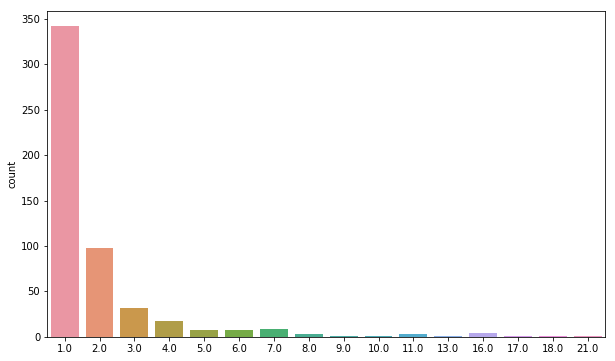

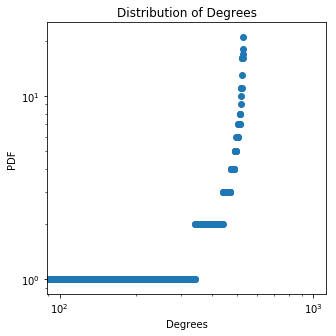

The clustering coefficient is 0.005050505050505051
Node with highest degree is: 29 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.80753292986828
417
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6751063292818813
number of closed triangles is 1
number of open triangles is 222
average distance is 0.6663522515591885


<Figure size 432x288 with 0 Axes>

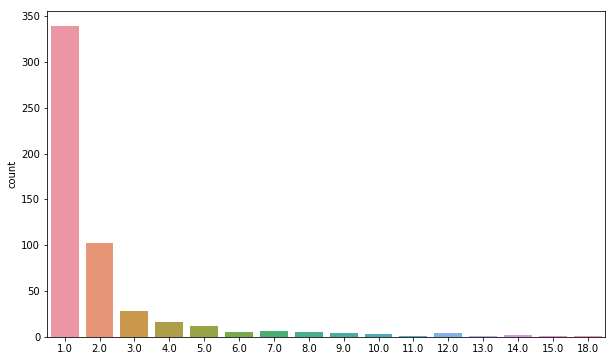

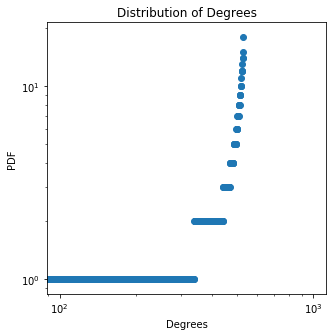

The clustering coefficient is 0.0045045045045045045
Node with highest degree is: 15 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.003759344962621
416
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6221430590558324
number of closed triangles is 1
number of open triangles is 215
average distance is 0.6558010026140813


<Figure size 432x288 with 0 Axes>

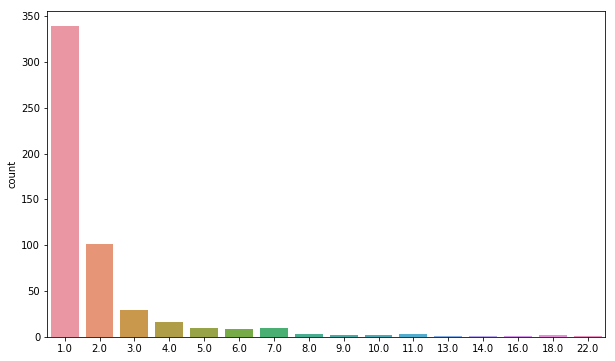

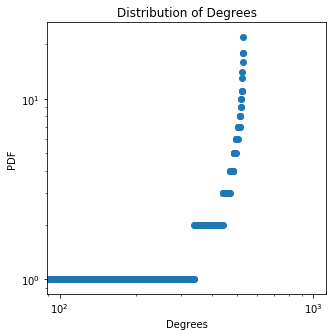

The clustering coefficient is 0.004651162790697674
Node with highest degree is: 25 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.40753292986828
415
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6844432434446196
number of closed triangles is 1
number of open triangles is 205
average distance is 0.6741043701149104


<Figure size 432x288 with 0 Axes>

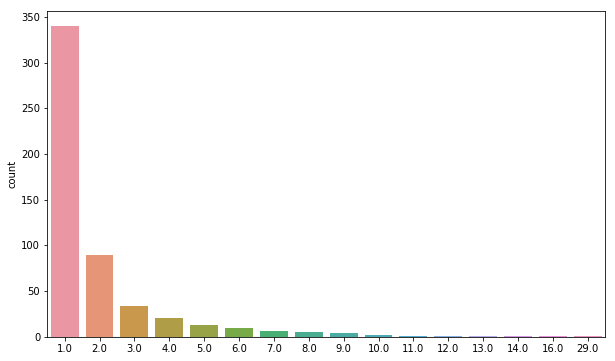

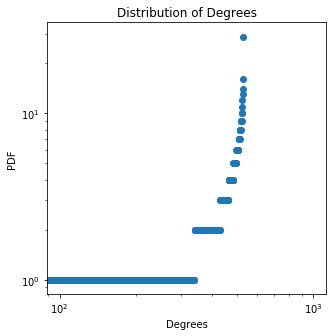

The clustering coefficient is 0.004878048780487805
Node with highest degree is: 1 with a degree of: 29.0 , the mean is 2.0037735849056606 , the variance is 5.20753292986828
414
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6988104295629779
number of closed triangles is 1
number of open triangles is 174
average distance is 0.6664601289487869


<Figure size 432x288 with 0 Axes>

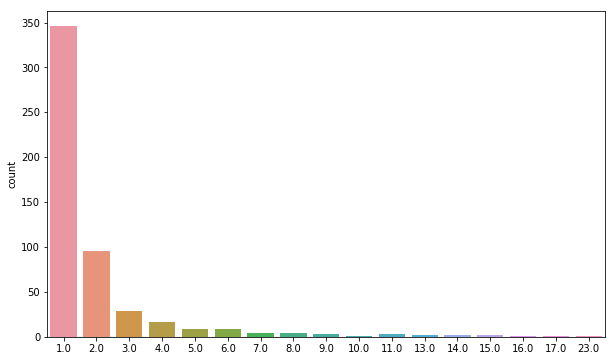

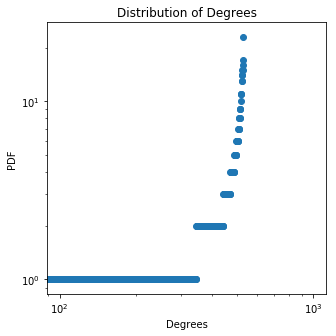

The clustering coefficient is 0.005747126436781609
Node with highest degree is: 0 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.841495194019223
413
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5705039249920479
number of closed triangles is 1
number of open triangles is 227
average distance is 0.6480661271111493


<Figure size 432x288 with 0 Axes>

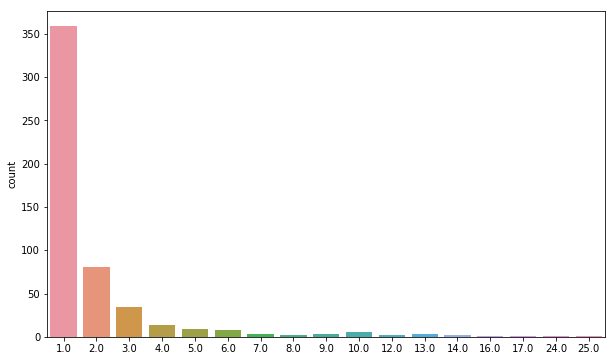

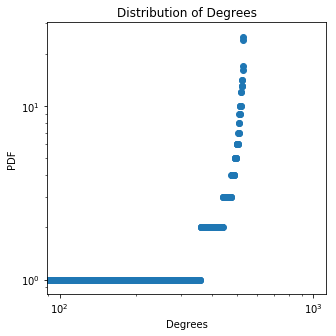

The clustering coefficient is 0.004405286343612335
Node with highest degree is: 28 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.7131933072267715
412
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6251873217327936
number of closed triangles is 1
number of open triangles is 193
average distance is 0.6493907167095561


<Figure size 432x288 with 0 Axes>

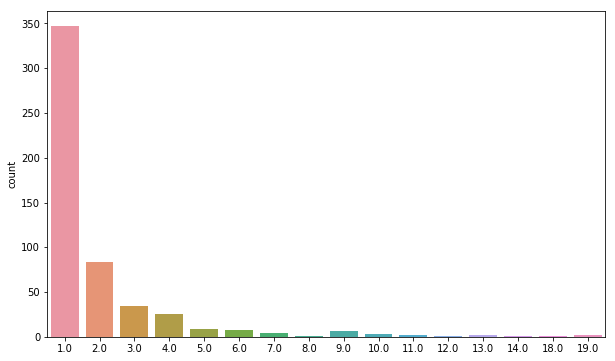

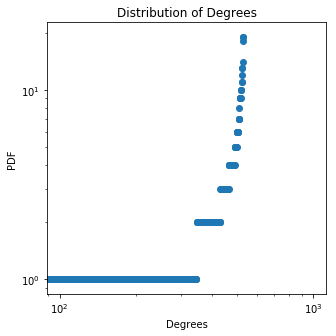

The clustering coefficient is 0.0051813471502590676
Node with highest degree is: 11 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.2792310430758285
411
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6306715311972193
number of closed triangles is 1
number of open triangles is 203
average distance is 0.6453870170459945


<Figure size 432x288 with 0 Axes>

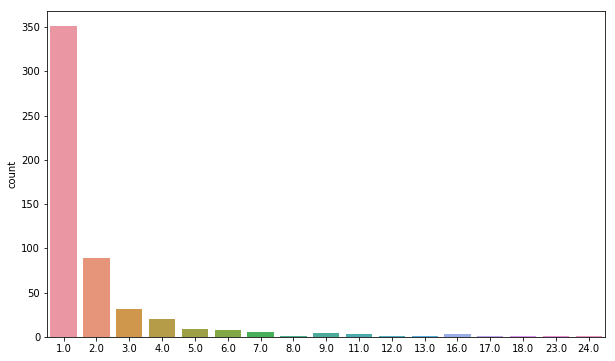

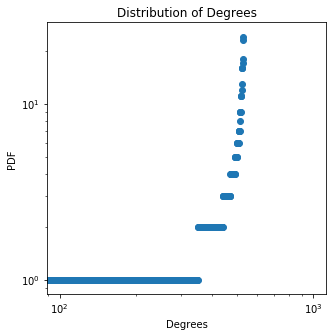

The clustering coefficient is 0.0049261083743842365
Node with highest degree is: 28 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.577344250622997
410
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6306545094482288
number of closed triangles is 1
number of open triangles is 214
average distance is 0.6742147082058794


<Figure size 432x288 with 0 Axes>

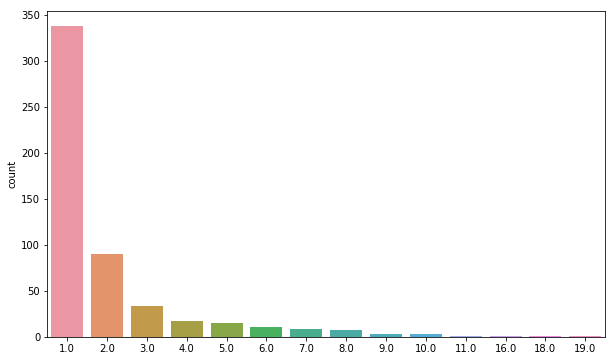

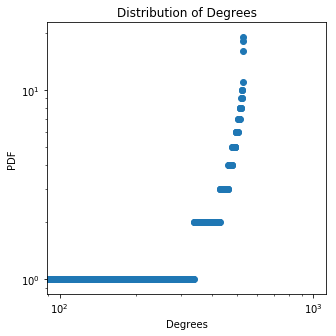

The clustering coefficient is 0.004672897196261682
Node with highest degree is: 2 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 4.4603631185475265
409
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5964594816720276
number of closed triangles is 1
number of open triangles is 198
average distance is 0.6558278271066147


<Figure size 432x288 with 0 Axes>

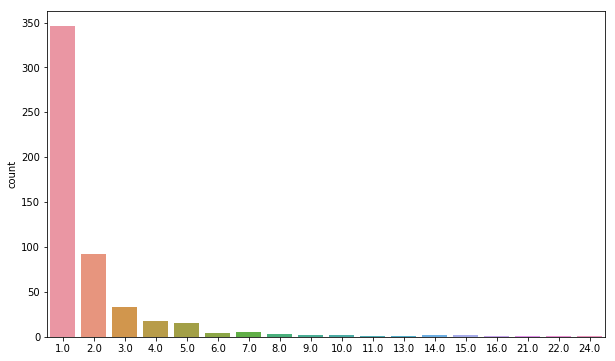

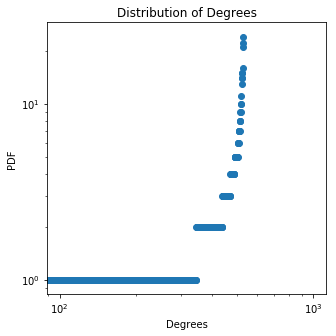

The clustering coefficient is 0.005050505050505051
Node with highest degree is: 10 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.373570665717337
408
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6408205705757425
number of closed triangles is 1
number of open triangles is 166
average distance is 0.650356498807772


<Figure size 432x288 with 0 Axes>

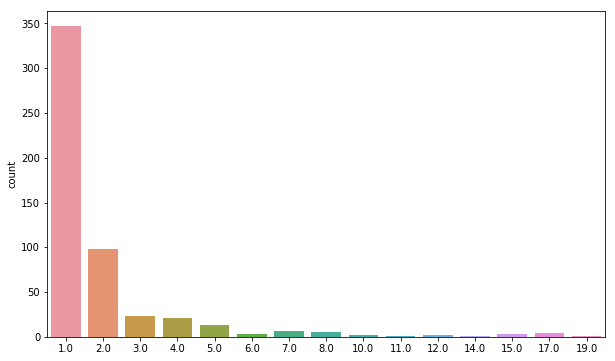

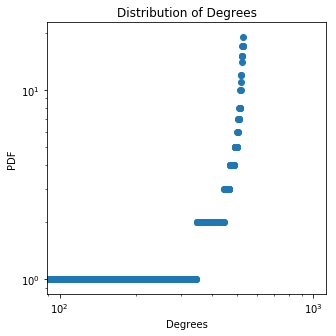

The clustering coefficient is 0.006024096385542169
Node with highest degree is: 1 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 6.033948024207904
407
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6741091135006323
number of closed triangles is 1
number of open triangles is 157
average distance is 0.6660758732184434


<Figure size 432x288 with 0 Axes>

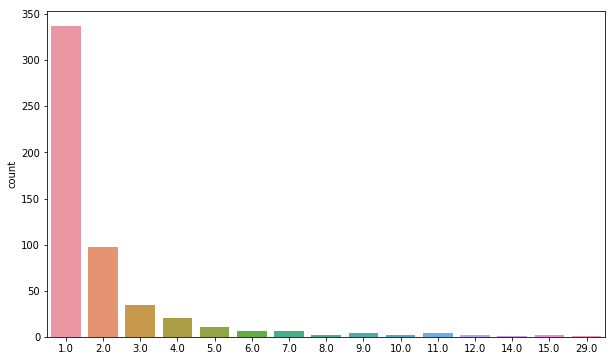

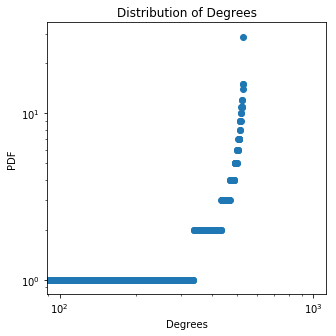

The clustering coefficient is 0.006369426751592357
Node with highest degree is: 1 with a degree of: 29.0 , the mean is 2.0037735849056606 , the variance is 5.524514061943751
406
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6262987280394438
number of closed triangles is 1
number of open triangles is 176
average distance is 0.6507782788670112


<Figure size 432x288 with 0 Axes>

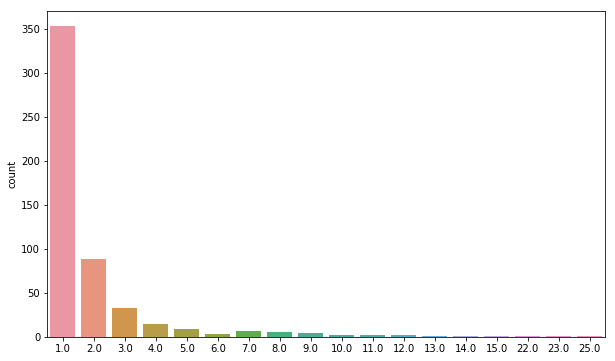

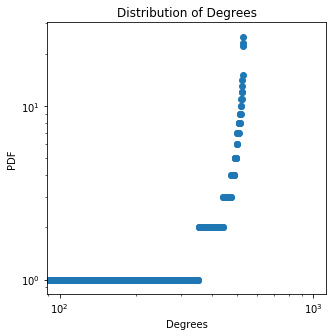

The clustering coefficient is 0.005681818181818182
Node with highest degree is: 21 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.520740477038093
405
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6760130140884433
number of closed triangles is 1
number of open triangles is 175
average distance is 0.6579601460390836


<Figure size 432x288 with 0 Axes>

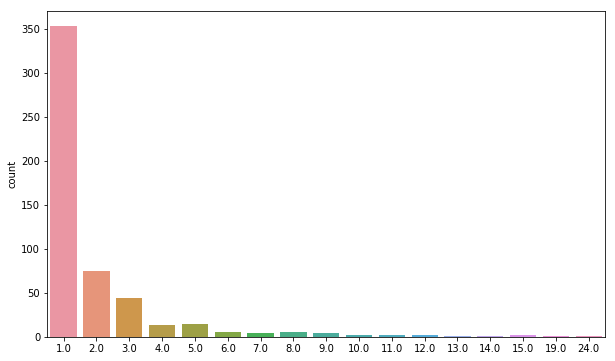

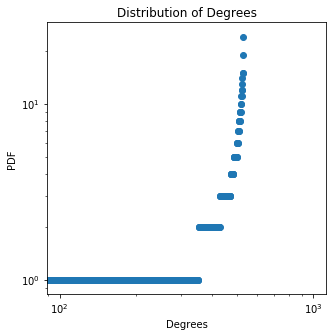

The clustering coefficient is 0.005714285714285714
Node with highest degree is: 25 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.671683873264507
404
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5994858600477908
number of closed triangles is 1
number of open triangles is 190
average distance is 0.6347032278786348


<Figure size 432x288 with 0 Axes>

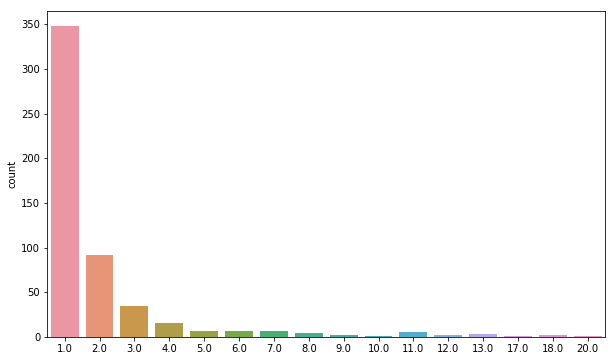

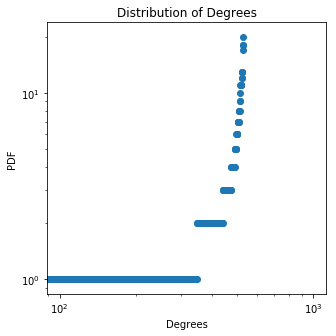

The clustering coefficient is 0.005263157894736842
Node with highest degree is: 20 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.830174439302242
403
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6861299928938228
number of closed triangles is 1
number of open triangles is 189
average distance is 0.6755276354991875


<Figure size 432x288 with 0 Axes>

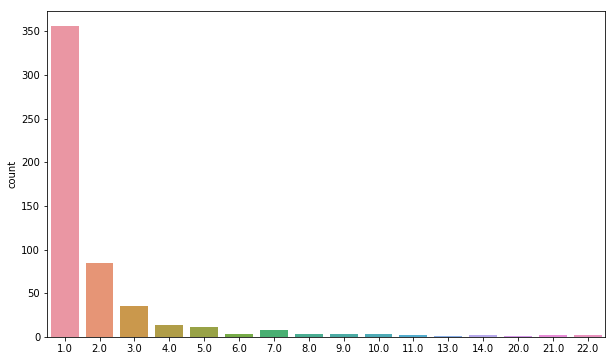

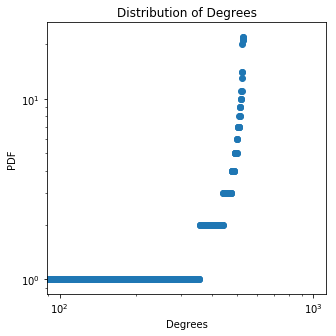

The clustering coefficient is 0.005291005291005291
Node with highest degree is: 16 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 6.89432538269847
402
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7086399642980565
number of closed triangles is 1
number of open triangles is 216
average distance is 0.64521903855452


<Figure size 432x288 with 0 Axes>

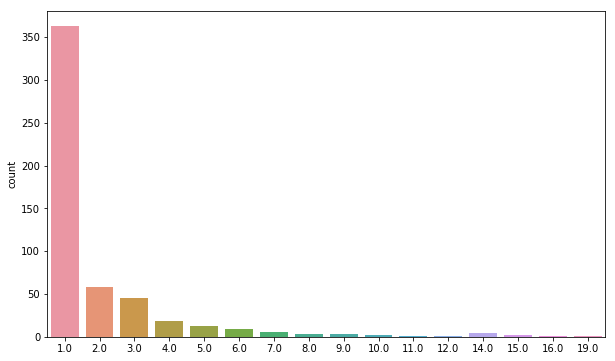

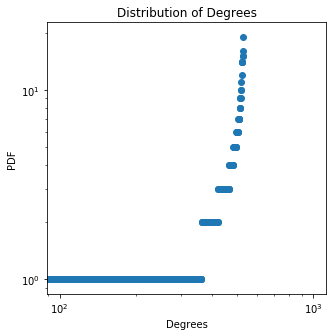

The clustering coefficient is 0.004629629629629629
Node with highest degree is: 14 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.384891420434319
401
number of closed triangles is 1
number of open triangles is 0
average distance is 0.702415761056063
number of closed triangles is 1
number of open triangles is 155
average distance is 0.6542158195595296


<Figure size 432x288 with 0 Axes>

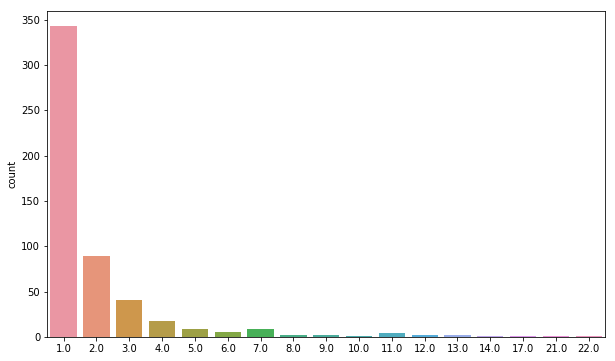

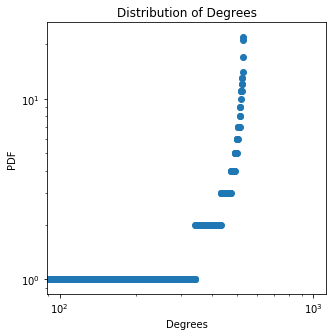

The clustering coefficient is 0.0064516129032258064
Node with highest degree is: 12 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.599985760056961
400
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6656706777315534
number of closed triangles is 1
number of open triangles is 233
average distance is 0.6788306860671472


<Figure size 432x288 with 0 Axes>

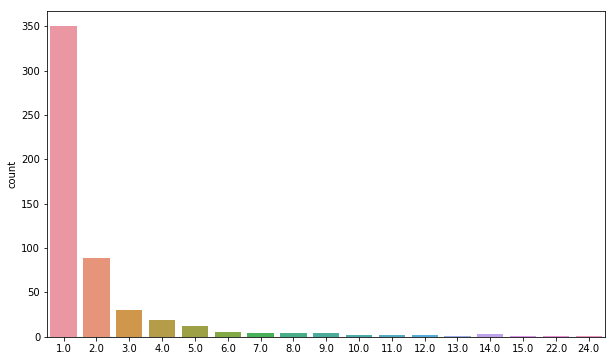

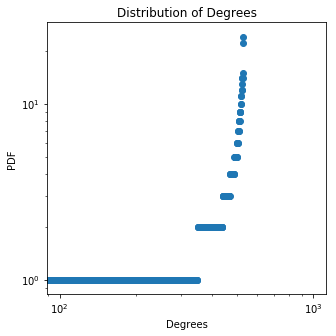

The clustering coefficient is 0.004291845493562232
Node with highest degree is: 8 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.99998576005696
399
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7031586995486665
number of closed triangles is 1
number of open triangles is 247
average distance is 0.6816134064407715


<Figure size 432x288 with 0 Axes>

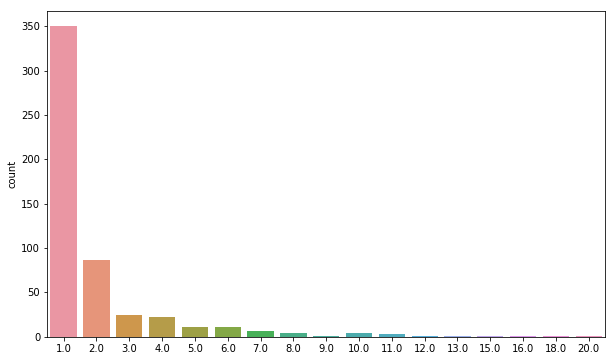

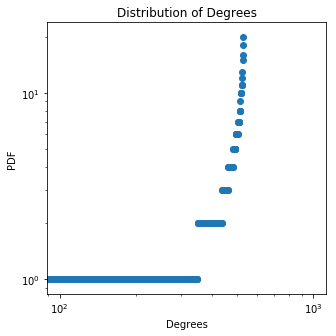

The clustering coefficient is 0.004048582995951417
Node with highest degree is: 27 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.226400854396582
398
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6118119125273473
number of closed triangles is 1
number of open triangles is 197
average distance is 0.6591185869458106


<Figure size 432x288 with 0 Axes>

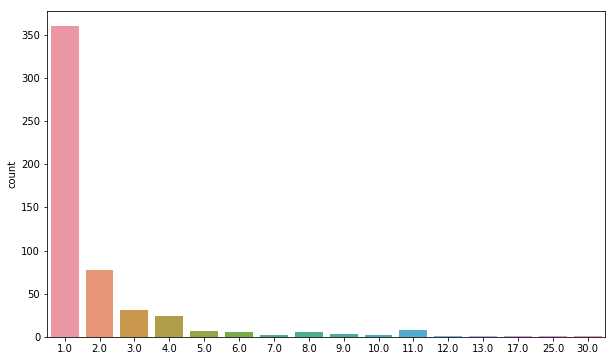

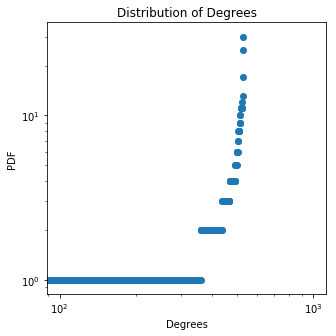

The clustering coefficient is 0.005076142131979695
Node with highest degree is: 24 with a degree of: 30.0 , the mean is 2.0037735849056606 , the variance is 6.750929156283376
397
number of closed triangles is 1
number of open triangles is 0
average distance is 0.667117707629094
number of closed triangles is 1
number of open triangles is 151
average distance is 0.6918757985027439


<Figure size 432x288 with 0 Axes>

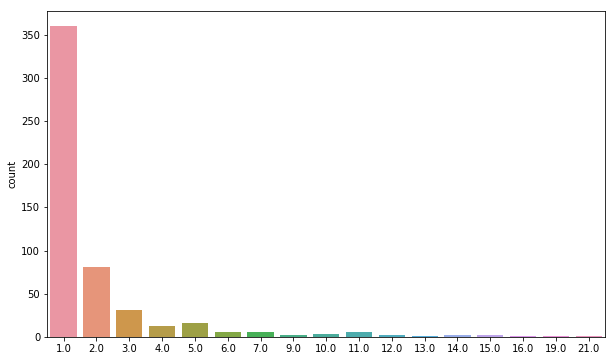

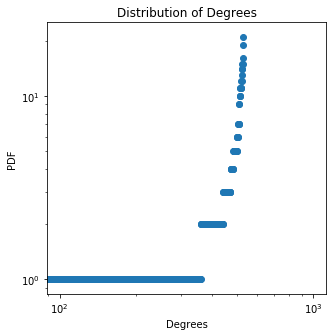

The clustering coefficient is 0.006622516556291391
Node with highest degree is: 27 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 6.181117835528658
396
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6462196392066576
number of closed triangles is 1
number of open triangles is 216
average distance is 0.6806824182793366


<Figure size 432x288 with 0 Axes>

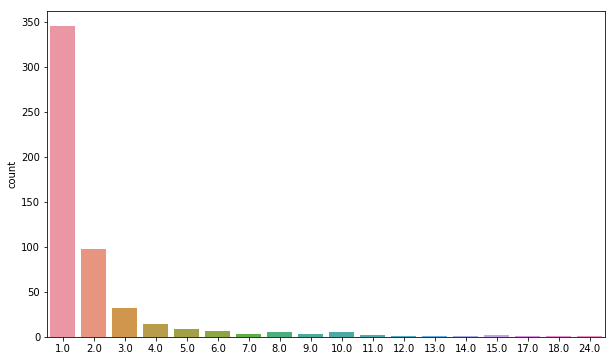

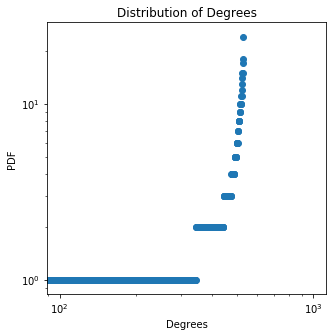

The clustering coefficient is 0.004629629629629629
Node with highest degree is: 2 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.9660234959060165
395
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6645865423374278
number of closed triangles is 1
number of open triangles is 220
average distance is 0.6522762311736598


<Figure size 432x288 with 0 Axes>

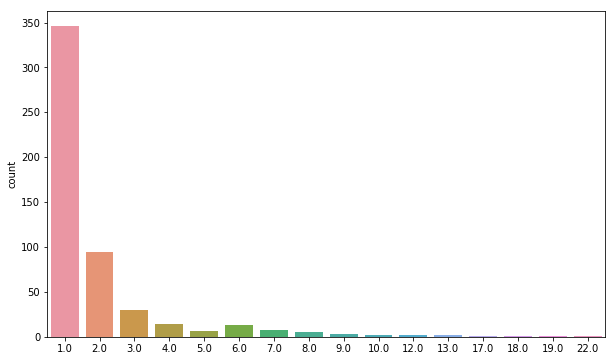

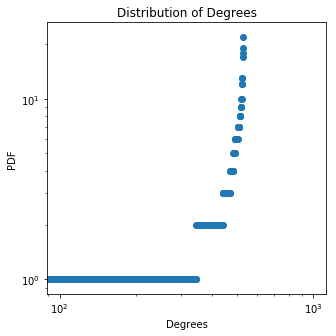

The clustering coefficient is 0.004545454545454545
Node with highest degree is: 1 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.60375934496262
394
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6109702438907889
number of closed triangles is 1
number of open triangles is 169
average distance is 0.6389044183454623


<Figure size 432x288 with 0 Axes>

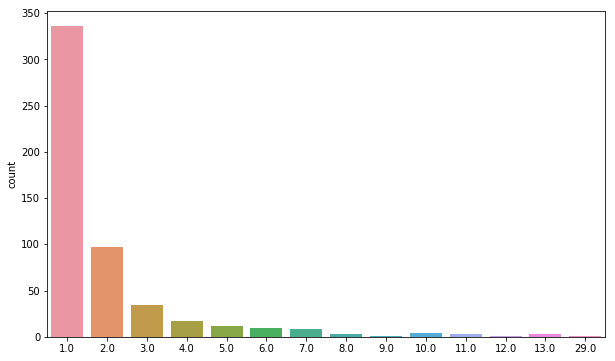

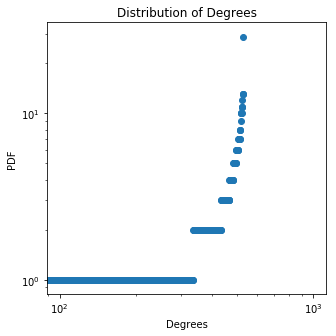

The clustering coefficient is 0.005917159763313609
Node with highest degree is: 20 with a degree of: 29.0 , the mean is 2.0037735849056606 , the variance is 5.1962121751513
393
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6457448513444727
number of closed triangles is 1
number of open triangles is 198
average distance is 0.6495059972196373


<Figure size 432x288 with 0 Axes>

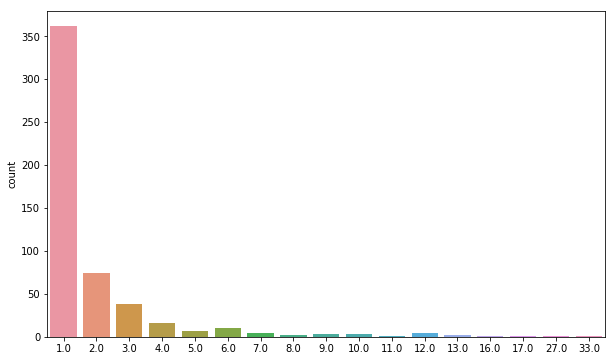

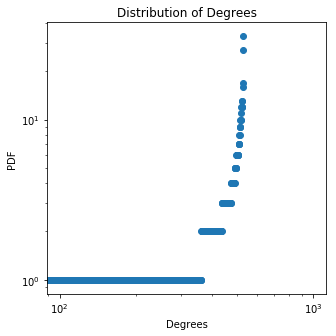

The clustering coefficient is 0.005050505050505051
Node with highest degree is: 7 with a degree of: 33.0 , the mean is 2.0037735849056606 , the variance is 7.4113065147739405
392
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5758265966202133
number of closed triangles is 1
number of open triangles is 206
average distance is 0.6478754479241542


<Figure size 432x288 with 0 Axes>

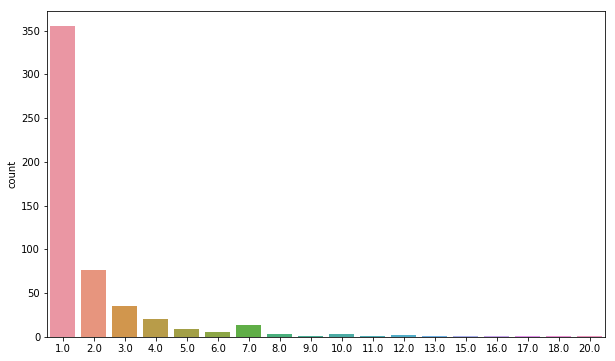

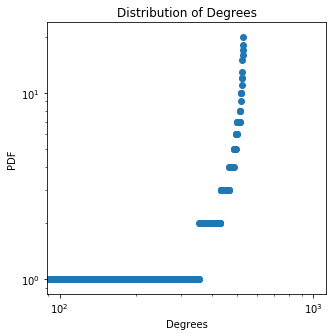

The clustering coefficient is 0.0048543689320388345
Node with highest degree is: 11 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.475457458170169
391
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7328797405447088
number of closed triangles is 1
number of open triangles is 177
average distance is 0.6622807596519134


<Figure size 432x288 with 0 Axes>

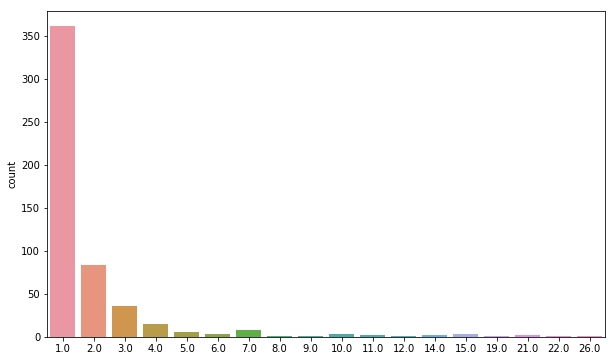

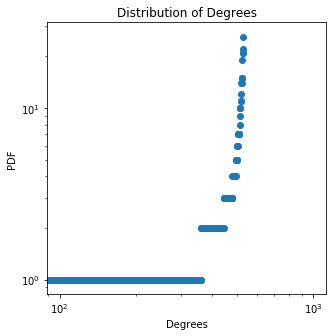

The clustering coefficient is 0.005649717514124294
Node with highest degree is: 25 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 7.69809896760413
390
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6253473211874943
number of closed triangles is 1
number of open triangles is 195
average distance is 0.6651774896876288


<Figure size 432x288 with 0 Axes>

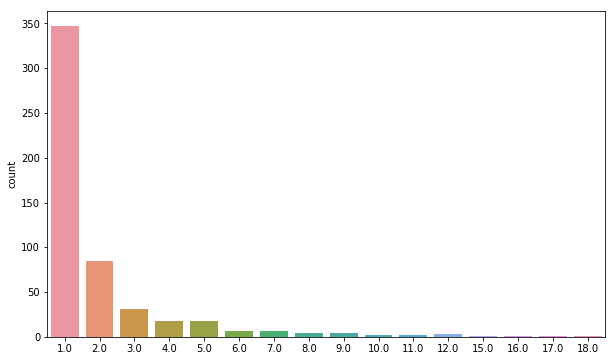

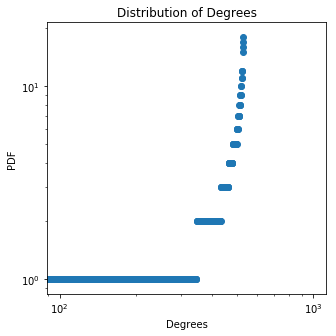

The clustering coefficient is 0.005128205128205128
Node with highest degree is: 31 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 4.969797080811677
389
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6918639214793129
number of closed triangles is 1
number of open triangles is 161
average distance is 0.655656450850489


<Figure size 432x288 with 0 Axes>

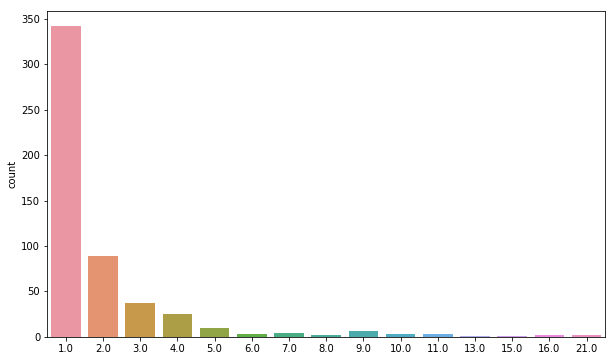

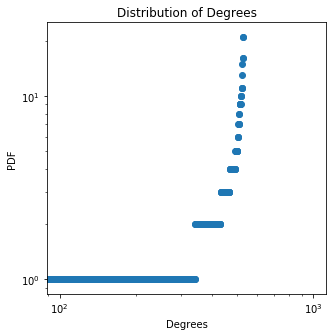

The clustering coefficient is 0.006211180124223602
Node with highest degree is: 11 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.5131933072267705
388
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5778301521063515
number of closed triangles is 1
number of open triangles is 175
average distance is 0.635773416132479


<Figure size 432x288 with 0 Axes>

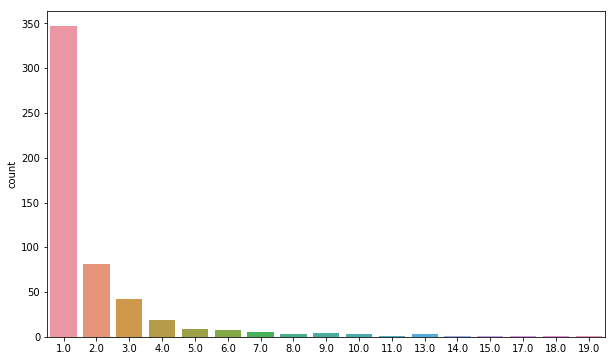

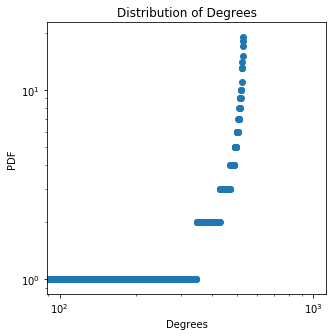

The clustering coefficient is 0.005714285714285714
Node with highest degree is: 1 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.324514061943753
387
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6193257249710629
number of closed triangles is 1
number of open triangles is 242
average distance is 0.6525506572811353


<Figure size 432x288 with 0 Axes>

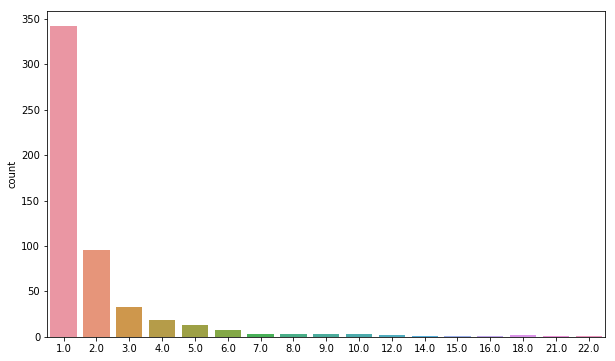

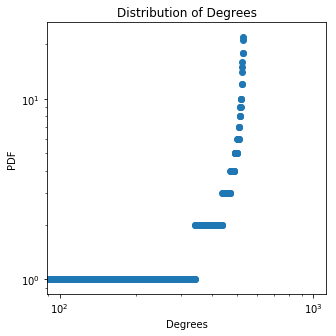

The clustering coefficient is 0.004132231404958678
Node with highest degree is: 0 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.99998576005696
386
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7473268530704237
number of closed triangles is 1
number of open triangles is 207
average distance is 0.6754745870319705


<Figure size 432x288 with 0 Axes>

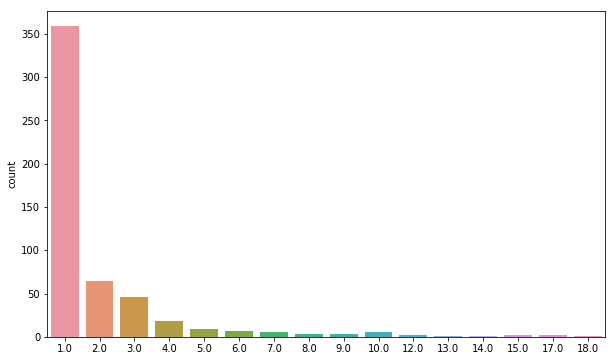

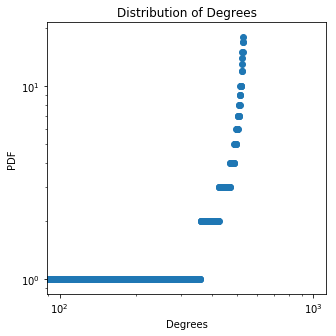

The clustering coefficient is 0.004830917874396135
Node with highest degree is: 13 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.479231043075828
385
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7191914205026233
number of closed triangles is 1
number of open triangles is 200
average distance is 0.6812290791728753


<Figure size 432x288 with 0 Axes>

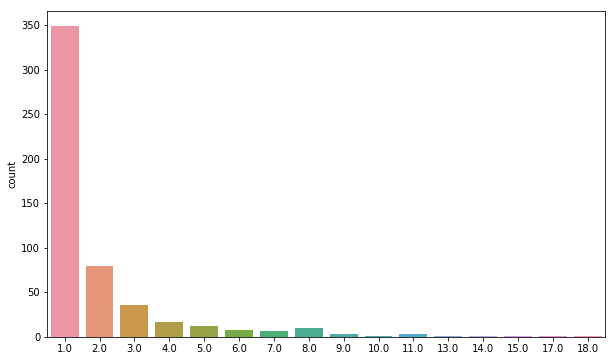

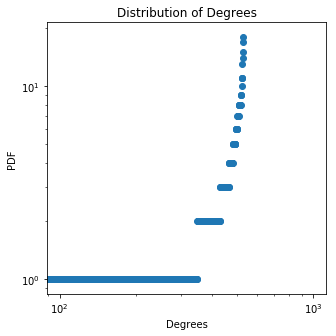

The clustering coefficient is 0.005
Node with highest degree is: 39 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 4.845268778924884
384
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7439632776803483
number of closed triangles is 1
number of open triangles is 240
average distance is 0.6829577161600353


<Figure size 432x288 with 0 Axes>

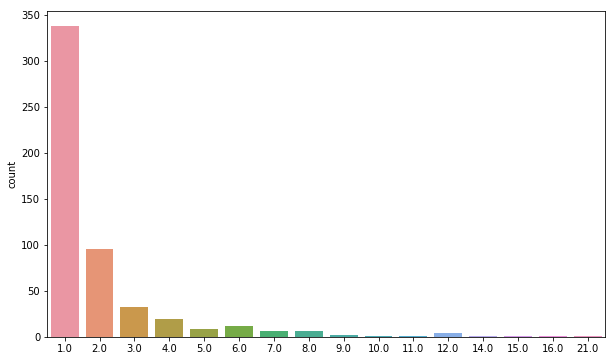

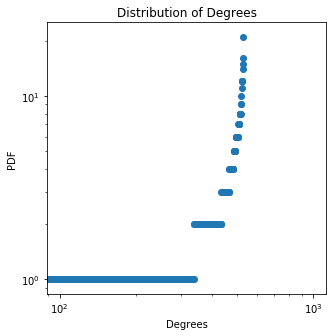

The clustering coefficient is 0.004166666666666667
Node with highest degree is: 26 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 4.901872552509791
383
number of closed triangles is 1
number of open triangles is 0
average distance is 0.660705917442831
number of closed triangles is 1
number of open triangles is 197
average distance is 0.6484463421722004


<Figure size 432x288 with 0 Axes>

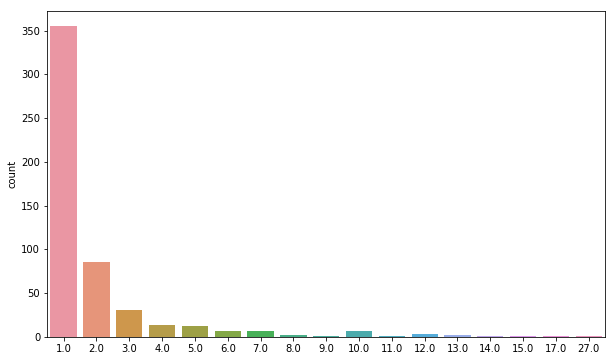

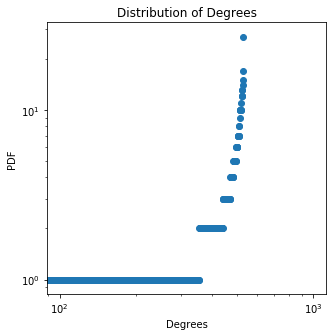

The clustering coefficient is 0.005076142131979695
Node with highest degree is: 29 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 6.015080099679602
382
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6158228145265421
number of closed triangles is 1
number of open triangles is 171
average distance is 0.6699398056826028


<Figure size 432x288 with 0 Axes>

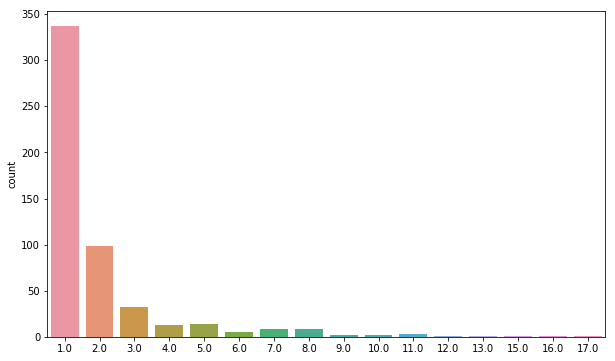

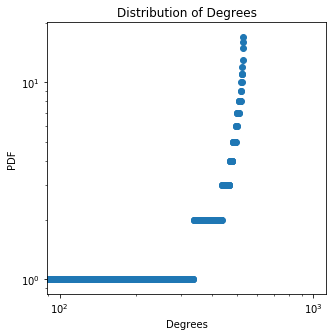

The clustering coefficient is 0.005847953216374269
Node with highest degree is: 20 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 4.633948024207903
381
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6686839140033984
number of closed triangles is 1
number of open triangles is 180
average distance is 0.6474078857188041


<Figure size 432x288 with 0 Axes>

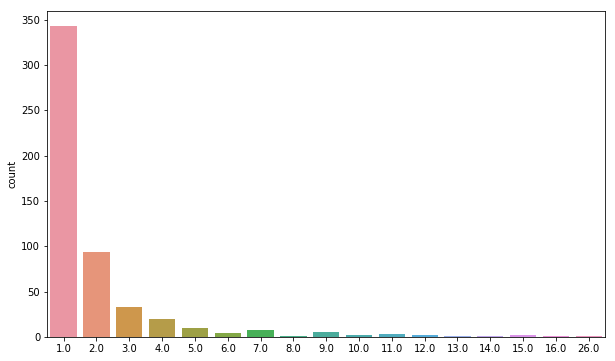

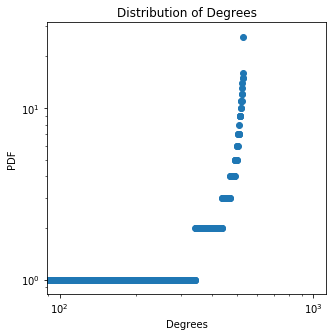

The clustering coefficient is 0.005555555555555556
Node with highest degree is: 19 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 5.683004627981489
380
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6211384667860228
number of closed triangles is 1
number of open triangles is 221
average distance is 0.6583395786565002


<Figure size 432x288 with 0 Axes>

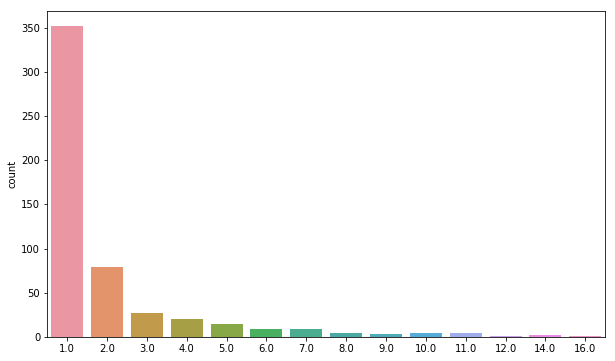

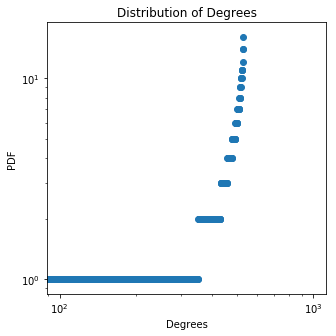

The clustering coefficient is 0.004524886877828055
Node with highest degree is: 27 with a degree of: 16.0 , the mean is 2.0037735849056606 , the variance is 4.562249911000356
379
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6086226539483488
number of closed triangles is 1
number of open triangles is 254
average distance is 0.6537945217123842


<Figure size 432x288 with 0 Axes>

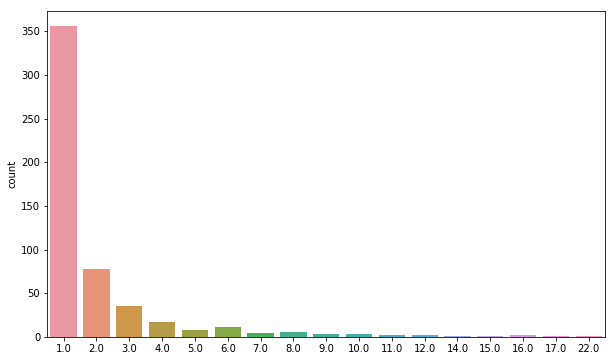

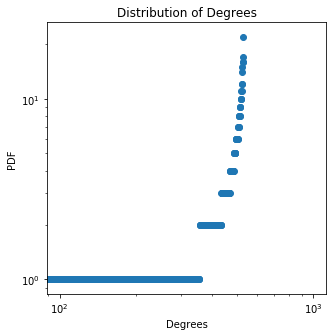

The clustering coefficient is 0.003937007874015748
Node with highest degree is: 14 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.694325382698469
378
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6395290184244021
number of closed triangles is 1
number of open triangles is 153
average distance is 0.6555905020039108


<Figure size 432x288 with 0 Axes>

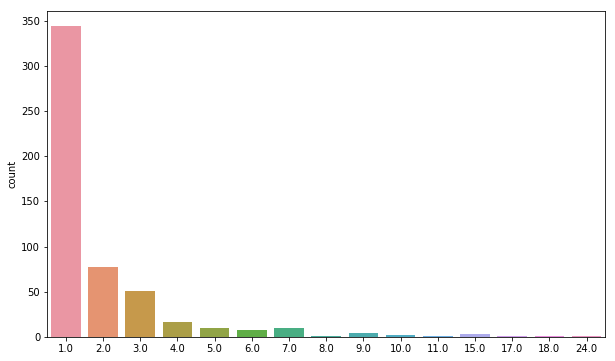

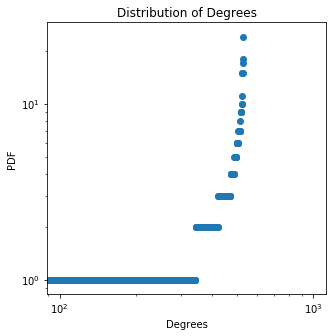

The clustering coefficient is 0.006535947712418301
Node with highest degree is: 21 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.358476326094697
377
number of closed triangles is 1
number of open triangles is 0
average distance is 0.618322113007838
number of closed triangles is 1
number of open triangles is 222
average distance is 0.6563025715946339


<Figure size 432x288 with 0 Axes>

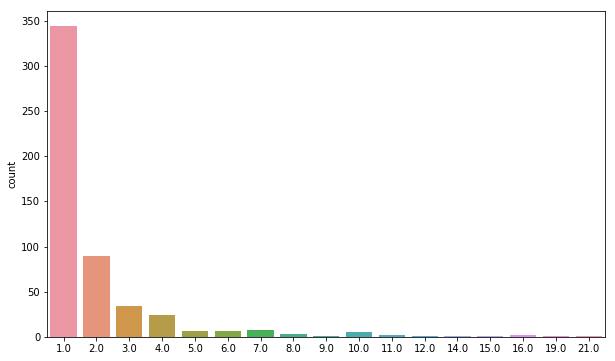

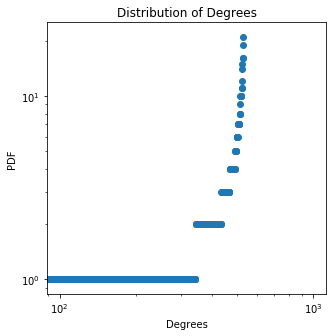

The clustering coefficient is 0.0045045045045045045
Node with highest degree is: 16 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.50564613741545
376
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6242682700145286
number of closed triangles is 1
number of open triangles is 208
average distance is 0.6447402983463467


<Figure size 432x288 with 0 Axes>

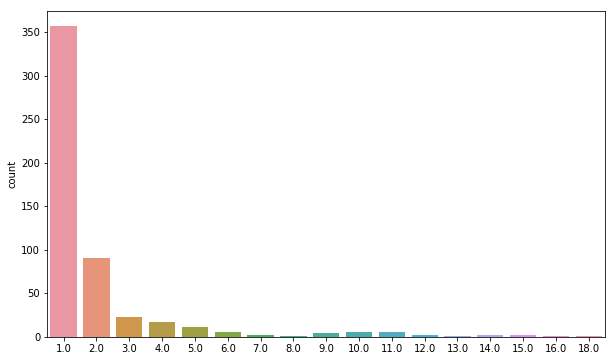

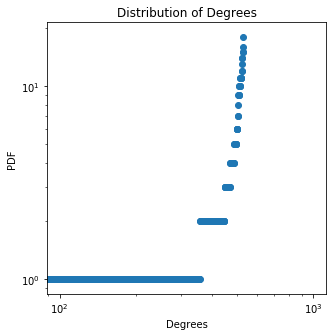

The clustering coefficient is 0.004807692307692308
Node with highest degree is: 22 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.875457458170167
375
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6110648518231673
number of closed triangles is 1
number of open triangles is 188
average distance is 0.6815821441002773


<Figure size 432x288 with 0 Axes>

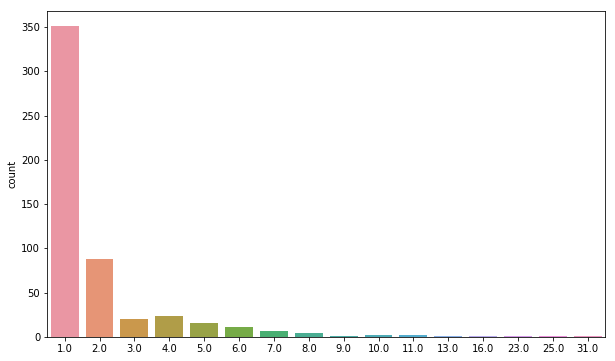

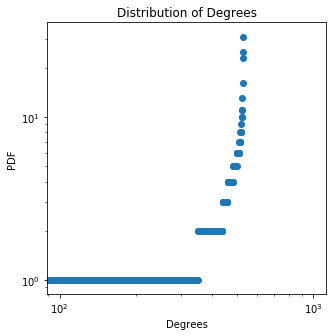

The clustering coefficient is 0.005319148936170213
Node with highest degree is: 5 with a degree of: 31.0 , the mean is 2.0037735849056606 , the variance is 6.694325382698468
374
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6039879578524592
number of closed triangles is 1
number of open triangles is 176
average distance is 0.6334998679828646


<Figure size 432x288 with 0 Axes>

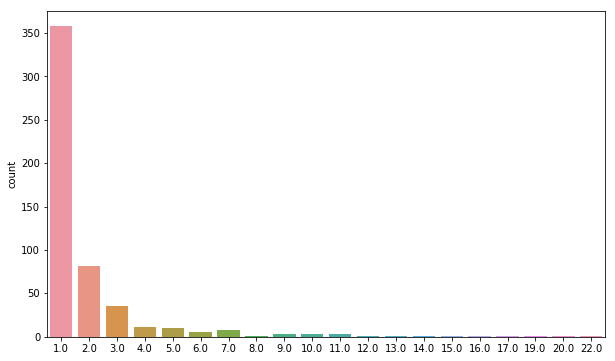

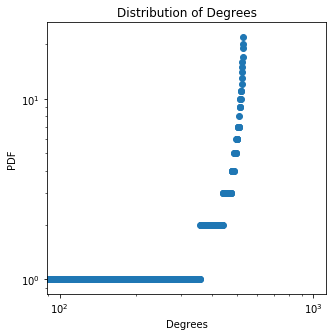

The clustering coefficient is 0.005681818181818182
Node with highest degree is: 10 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 6.433948024207905
373
number of closed triangles is 1
number of open triangles is 0
average distance is 0.698201823617326
number of closed triangles is 1
number of open triangles is 160
average distance is 0.656743774175787


<Figure size 432x288 with 0 Axes>

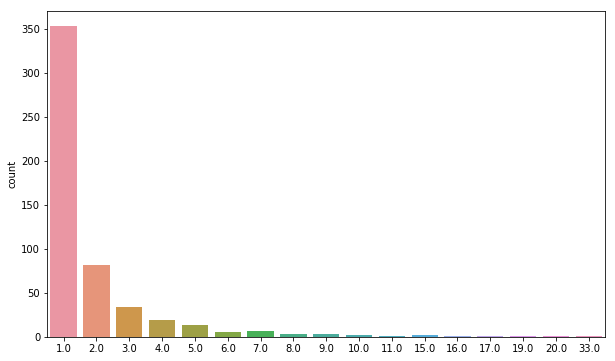

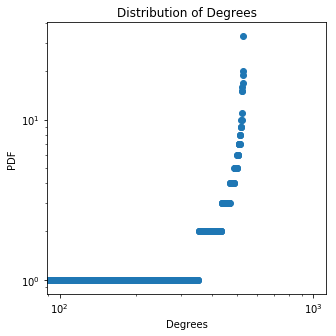

The clustering coefficient is 0.00625
Node with highest degree is: 27 with a degree of: 33.0 , the mean is 2.0037735849056606 , the variance is 6.883004627981489
372
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6356208180604118
number of closed triangles is 1
number of open triangles is 164
average distance is 0.6610666270922397


<Figure size 432x288 with 0 Axes>

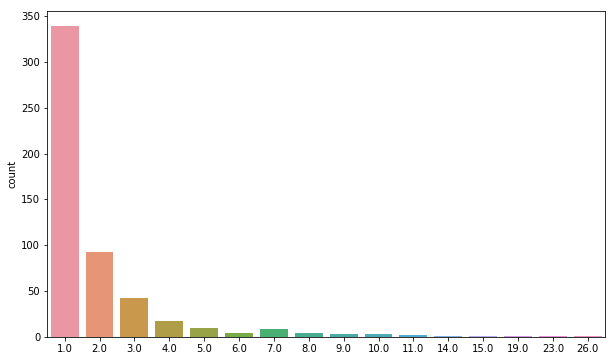

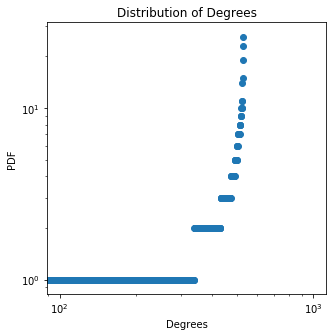

The clustering coefficient is 0.006097560975609756
Node with highest degree is: 26 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 5.833948024207904
371
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6653922766059239
number of closed triangles is 1
number of open triangles is 131
average distance is 0.6716015190951251


<Figure size 432x288 with 0 Axes>

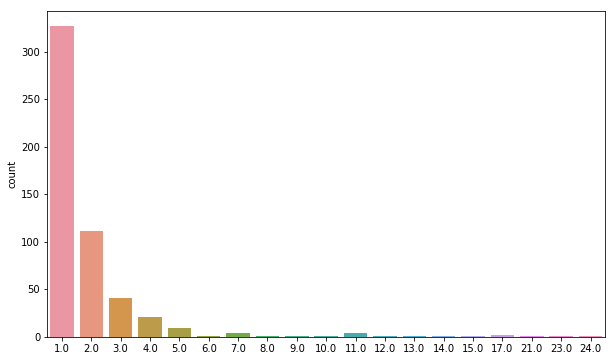

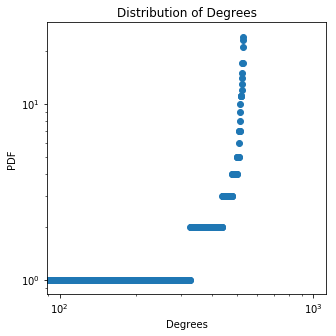

The clustering coefficient is 0.007633587786259542
Node with highest degree is: 1 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.399985760056961
370
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5978711431066301
number of closed triangles is 1
number of open triangles is 212
average distance is 0.6566470690847946


<Figure size 432x288 with 0 Axes>

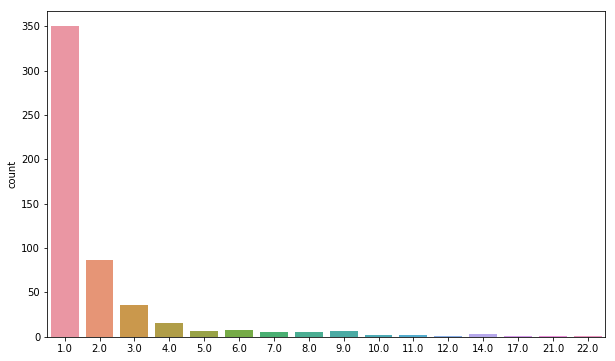

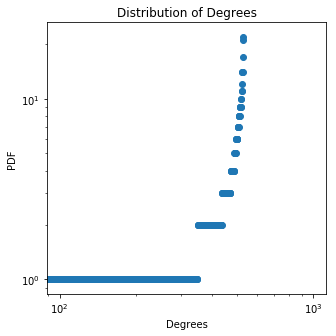

The clustering coefficient is 0.0047169811320754715
Node with highest degree is: 22 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.750929156283376
369
number of closed triangles is 1
number of open triangles is 0
average distance is 0.70583802048847
number of closed triangles is 1
number of open triangles is 274
average distance is 0.6721908757178099


<Figure size 432x288 with 0 Axes>

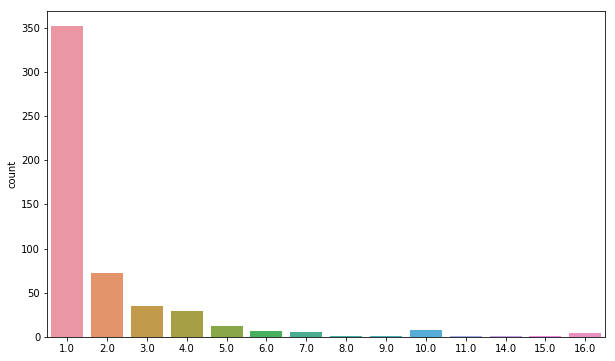

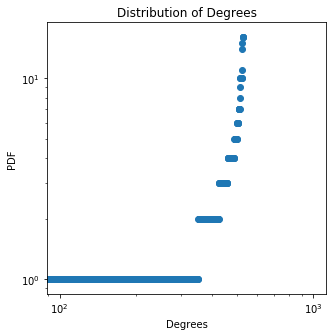

The clustering coefficient is 0.0036496350364963502
Node with highest degree is: 20 with a degree of: 16.0 , the mean is 2.0037735849056606 , the variance is 4.9962121751513
368
number of closed triangles is 1
number of open triangles is 0
average distance is 0.60308190571582
number of closed triangles is 1
number of open triangles is 199
average distance is 0.6781533052979212


<Figure size 432x288 with 0 Axes>

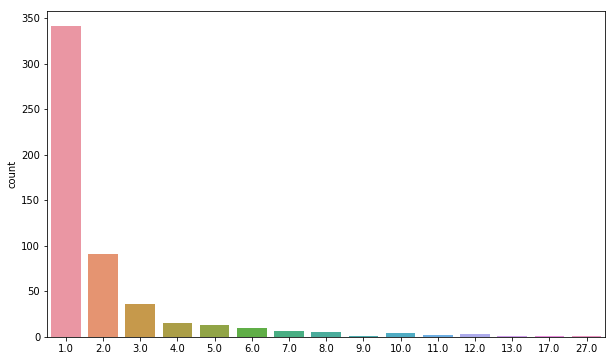

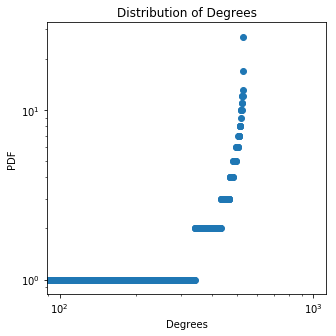

The clustering coefficient is 0.005025125628140704
Node with highest degree is: 29 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 5.2490423638305455
367
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7490105373548777
number of closed triangles is 1
number of open triangles is 262
average distance is 0.6822394710913209


<Figure size 432x288 with 0 Axes>

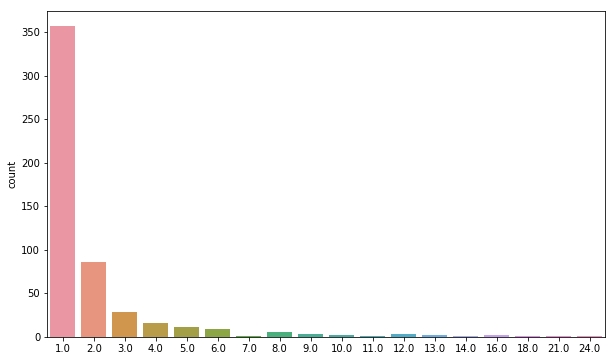

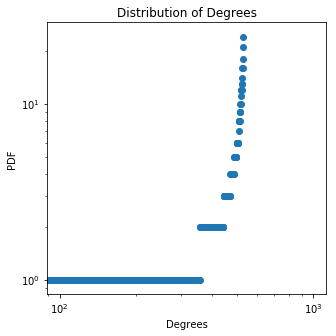

The clustering coefficient is 0.003816793893129771
Node with highest degree is: 19 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.475457458170168
366
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5708957070392647
number of closed triangles is 1
number of open triangles is 199
average distance is 0.6645786880560839


<Figure size 432x288 with 0 Axes>

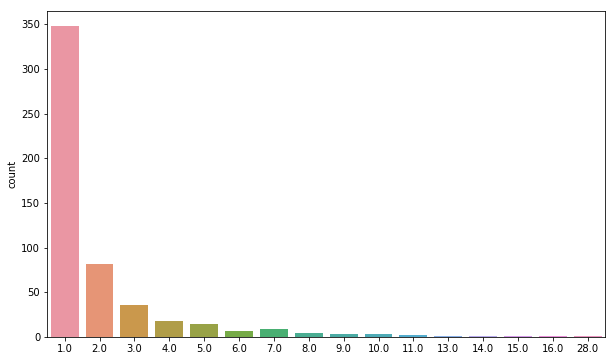

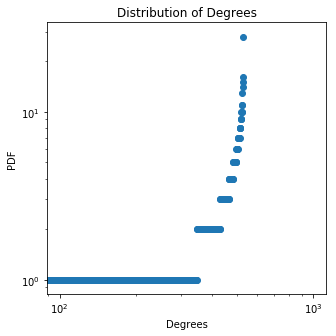

The clustering coefficient is 0.005025125628140704
Node with highest degree is: 27 with a degree of: 28.0 , the mean is 2.0037735849056606 , the variance is 5.415080099679602
365
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7296386411149228
number of closed triangles is 1
number of open triangles is 170
average distance is 0.6651983765962868


<Figure size 432x288 with 0 Axes>

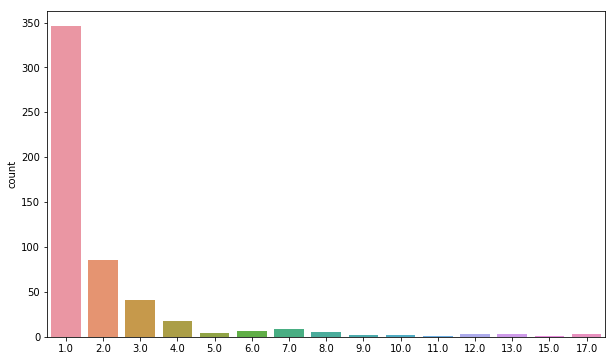

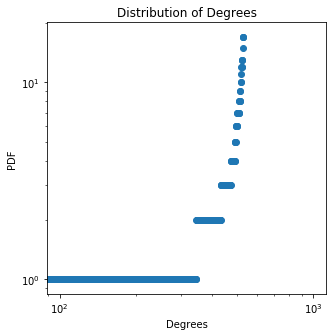

The clustering coefficient is 0.0058823529411764705
Node with highest degree is: 3 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 5.30187255250979
364
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6218163243217448
number of closed triangles is 1
number of open triangles is 207
average distance is 0.6522846178081653


<Figure size 432x288 with 0 Axes>

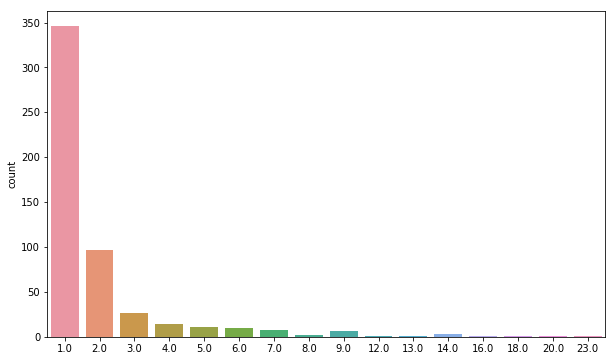

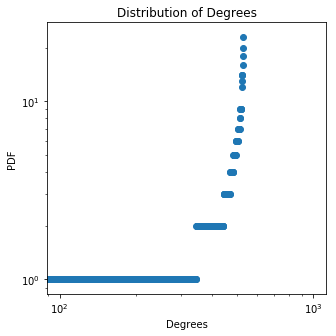

The clustering coefficient is 0.004830917874396135
Node with highest degree is: 29 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.894325382698469
363
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7432154253452237
number of closed triangles is 1
number of open triangles is 205
average distance is 0.65164423168803


<Figure size 432x288 with 0 Axes>

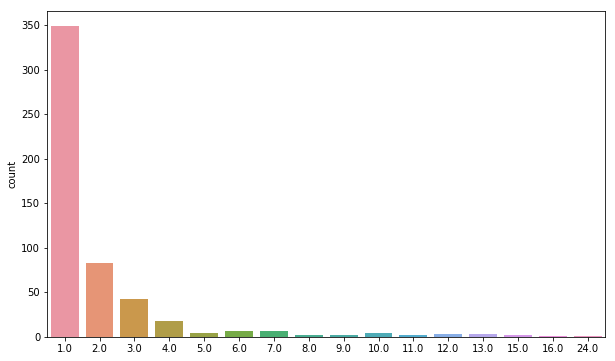

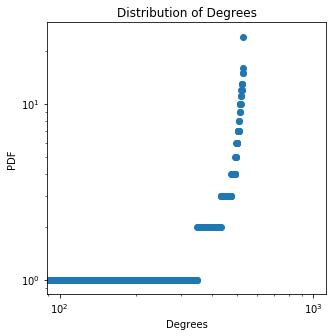

The clustering coefficient is 0.004878048780487805
Node with highest degree is: 15 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.7358348166607325
362
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6133742081500198
number of closed triangles is 1
number of open triangles is 250
average distance is 0.6278263031686386


<Figure size 432x288 with 0 Axes>

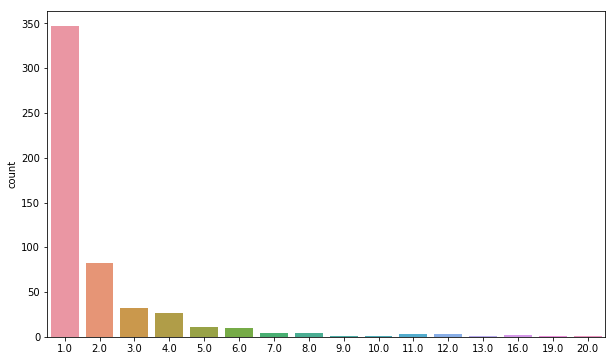

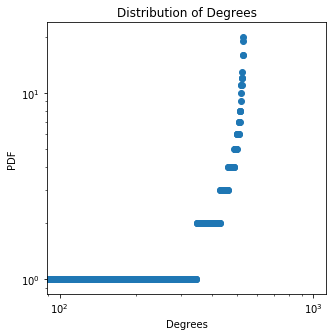

The clustering coefficient is 0.004
Node with highest degree is: 18 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.230174439302243
361
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6181454745768548
number of closed triangles is 1
number of open triangles is 134
average distance is 0.6553892401022325


<Figure size 432x288 with 0 Axes>

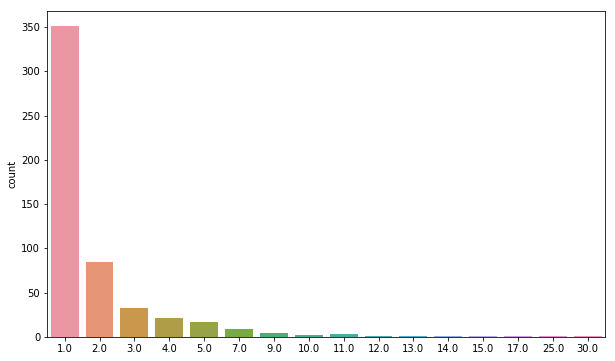

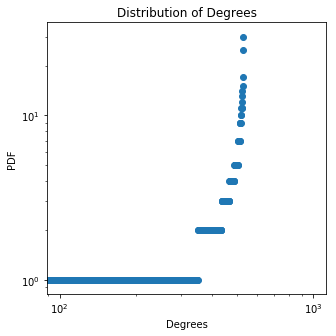

The clustering coefficient is 0.007462686567164179
Node with highest degree is: 14 with a degree of: 30.0 , the mean is 2.0037735849056606 , the variance is 6.5735706657173365
360
number of closed triangles is 1
number of open triangles is 0
average distance is 0.693289705244497
number of closed triangles is 1
number of open triangles is 263
average distance is 0.6993694107570536


<Figure size 432x288 with 0 Axes>

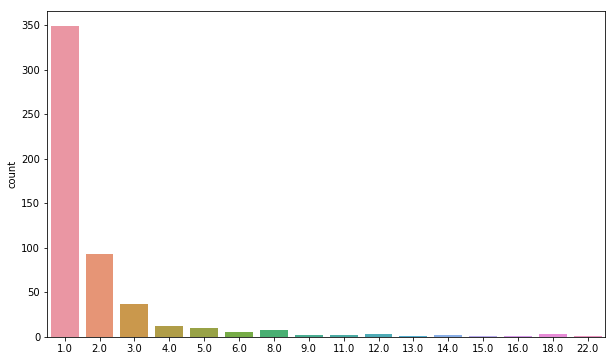

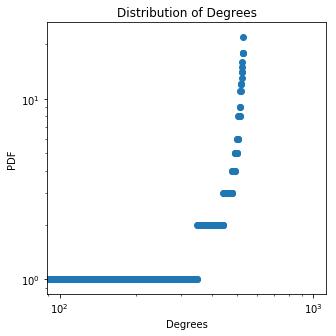

The clustering coefficient is 0.0038022813688212928
Node with highest degree is: 16 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 6.40375934496262
359
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7322770504507584
number of closed triangles is 1
number of open triangles is 226
average distance is 0.6770691011571546


<Figure size 432x288 with 0 Axes>

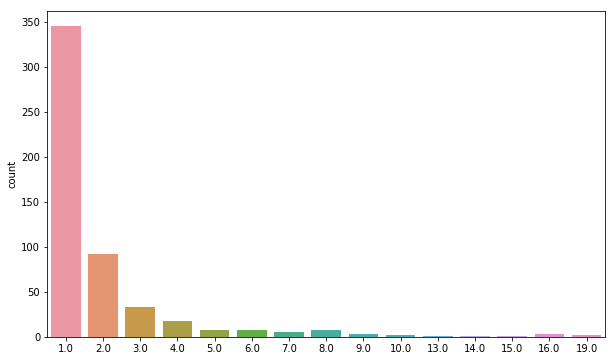

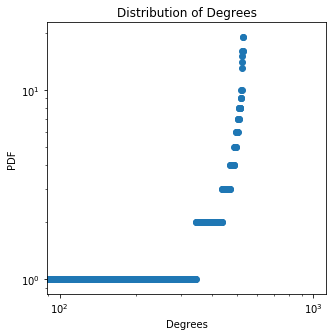

The clustering coefficient is 0.004424778761061947
Node with highest degree is: 16 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.5433819864720535
358
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6442815921367249
number of closed triangles is 1
number of open triangles is 225
average distance is 0.664317516912907


<Figure size 432x288 with 0 Axes>

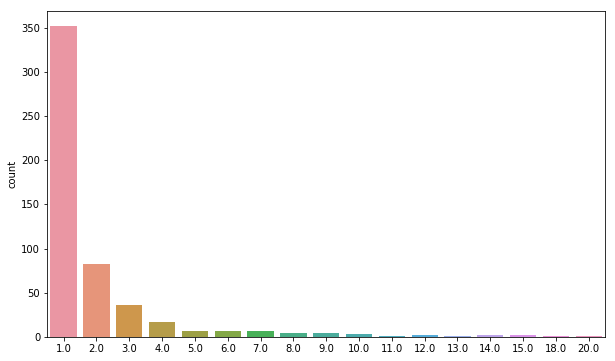

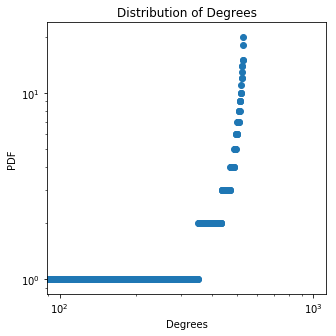

The clustering coefficient is 0.0044444444444444444
Node with highest degree is: 12 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.558476326094696
357
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7515259679103227
number of closed triangles is 1
number of open triangles is 184
average distance is 0.694939247013062


<Figure size 432x288 with 0 Axes>

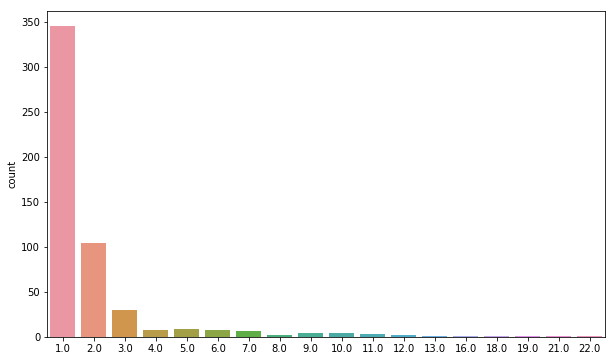

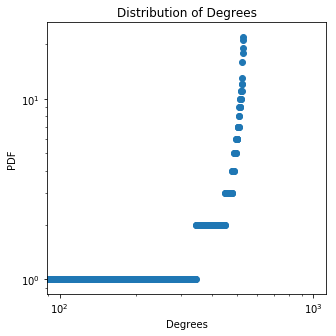

The clustering coefficient is 0.005434782608695652
Node with highest degree is: 1 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 6.301872552509791
356
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7159253100040518
number of closed triangles is 1
number of open triangles is 191
average distance is 0.6705608998100586


<Figure size 432x288 with 0 Axes>

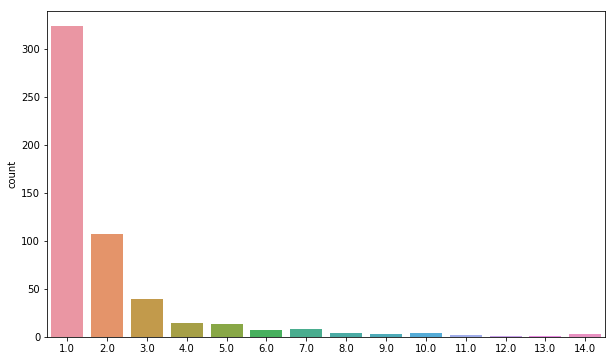

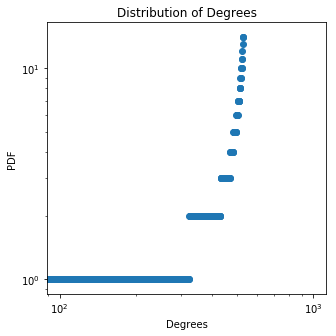

The clustering coefficient is 0.005235602094240838
Node with highest degree is: 2 with a degree of: 14.0 , the mean is 2.0037735849056606 , the variance is 4.169797080811677
355
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7533514213984657
number of closed triangles is 1
number of open triangles is 200
average distance is 0.6784131568921348


<Figure size 432x288 with 0 Axes>

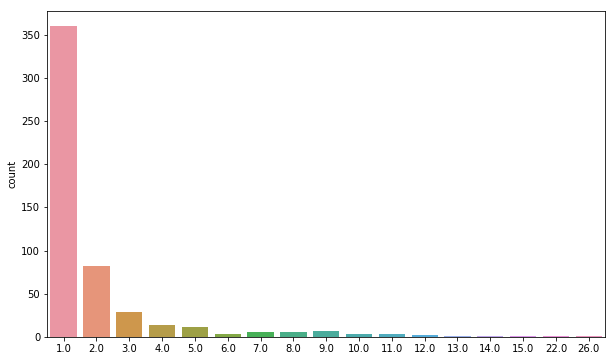

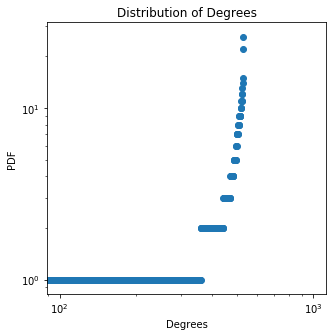

The clustering coefficient is 0.005
Node with highest degree is: 16 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 6.245268778924885
354
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6684113974809305
number of closed triangles is 1
number of open triangles is 246
average distance is 0.6380298458491219


<Figure size 432x288 with 0 Axes>

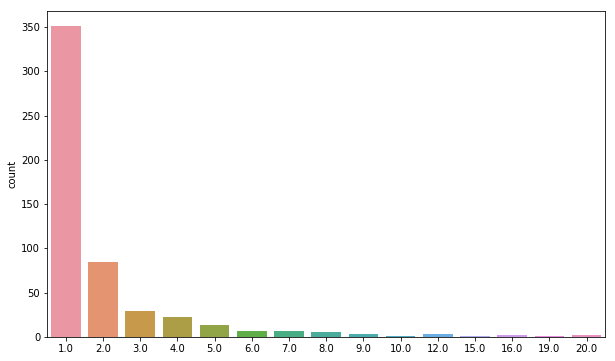

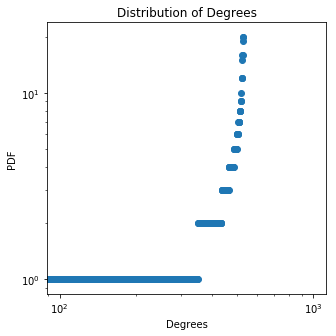

The clustering coefficient is 0.0040650406504065045
Node with highest degree is: 11 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.728287646849411
353
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6793526622882731
number of closed triangles is 1
number of open triangles is 189
average distance is 0.6647768550513113


<Figure size 432x288 with 0 Axes>

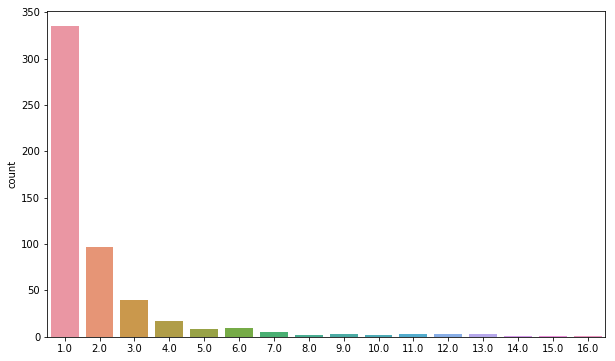

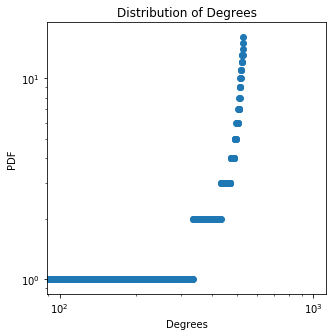

The clustering coefficient is 0.005291005291005291
Node with highest degree is: 6 with a degree of: 16.0 , the mean is 2.0037735849056606 , the variance is 4.803759344962621
352
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6983072388255586
number of closed triangles is 1
number of open triangles is 189
average distance is 0.6696851281348232


<Figure size 432x288 with 0 Axes>

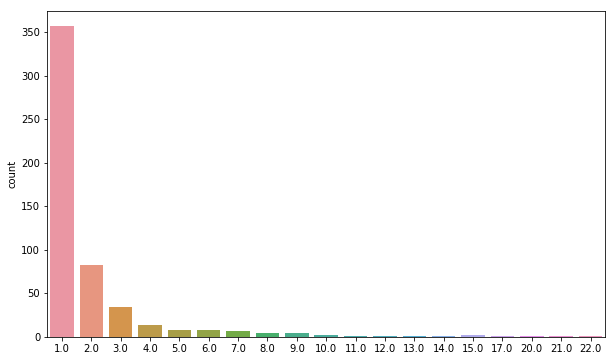

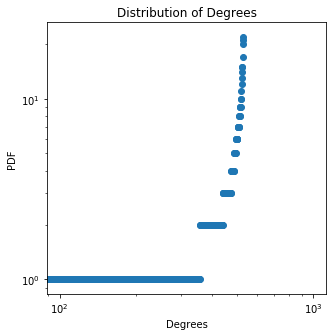

The clustering coefficient is 0.005291005291005291
Node with highest degree is: 16 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 6.377344250622997
351
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6899148382304608
number of closed triangles is 1
number of open triangles is 257
average distance is 0.674238650815344


<Figure size 432x288 with 0 Axes>

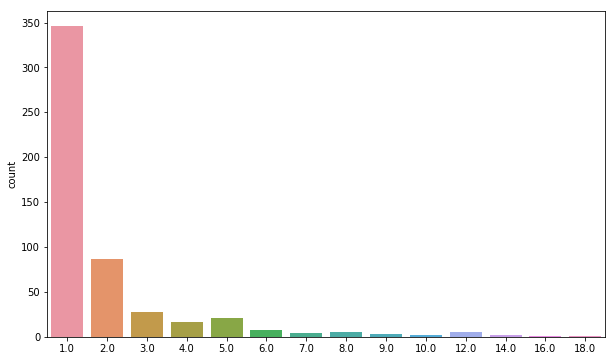

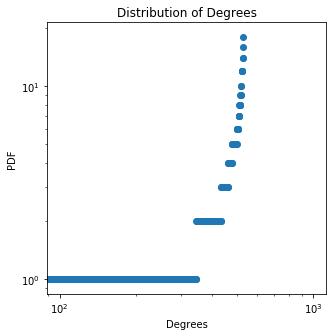

The clustering coefficient is 0.0038910505836575876
Node with highest degree is: 26 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 4.818853684585262
350
number of closed triangles is 1
number of open triangles is 0
average distance is 0.648354160778503
number of closed triangles is 1
number of open triangles is 218
average distance is 0.6666226519762687


<Figure size 432x288 with 0 Axes>

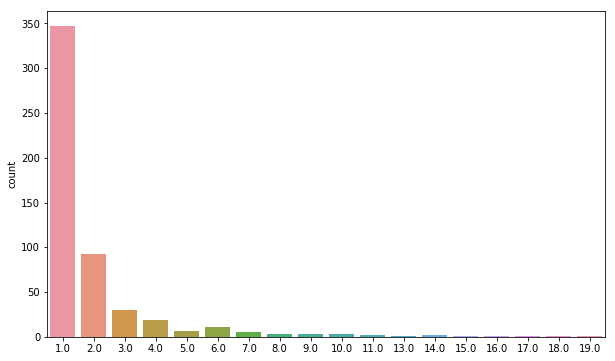

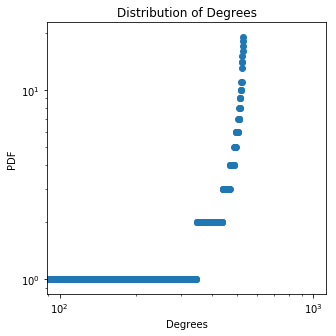

The clustering coefficient is 0.0045871559633027525
Node with highest degree is: 2 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.60375934496262
349
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7214792589822435
number of closed triangles is 1
number of open triangles is 200
average distance is 0.6612583920367597


<Figure size 432x288 with 0 Axes>

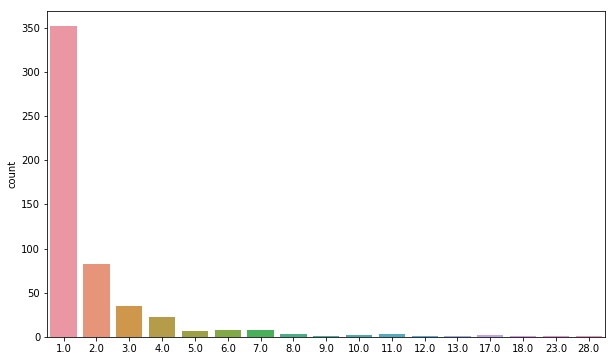

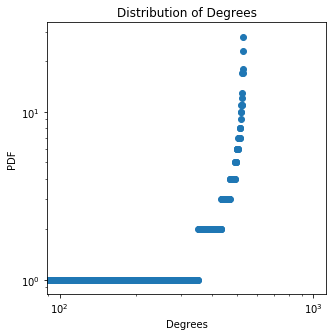

The clustering coefficient is 0.005
Node with highest degree is: 27 with a degree of: 28.0 , the mean is 2.0037735849056606 , the variance is 6.486778212887147
348
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6632064675637482
number of closed triangles is 1
number of open triangles is 218
average distance is 0.6456930880653279


<Figure size 432x288 with 0 Axes>

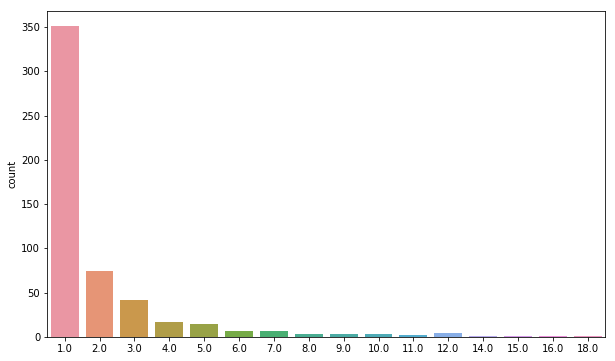

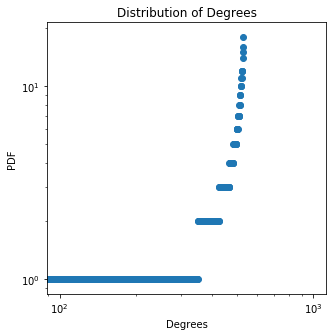

The clustering coefficient is 0.0045871559633027525
Node with highest degree is: 13 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 4.966023495906017
347
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6354884993068951
number of closed triangles is 1
number of open triangles is 176
average distance is 0.6469758151188573


<Figure size 432x288 with 0 Axes>

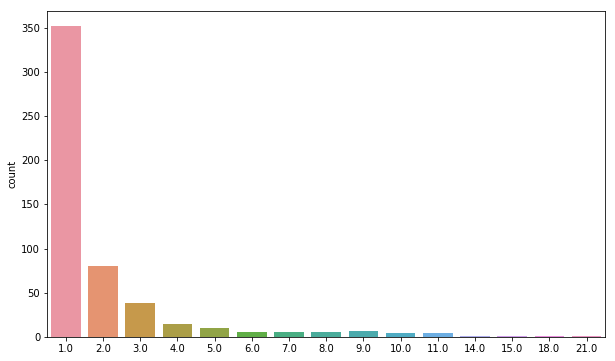

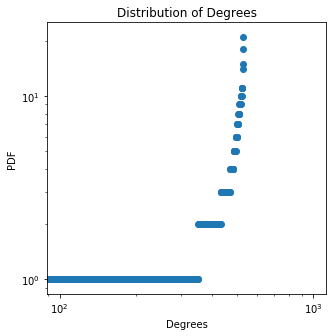

The clustering coefficient is 0.005681818181818182
Node with highest degree is: 0 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.271683873264508
346
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6467067617000072
number of closed triangles is 1
number of open triangles is 198
average distance is 0.6616791244234513


<Figure size 432x288 with 0 Axes>

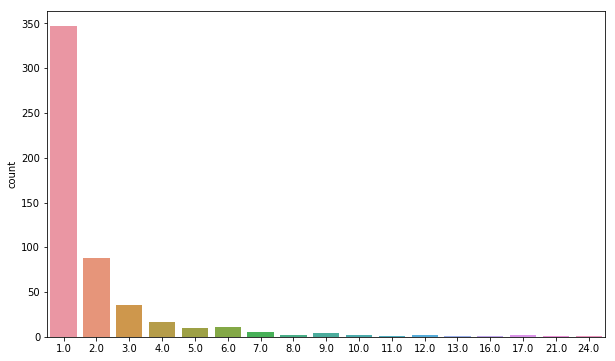

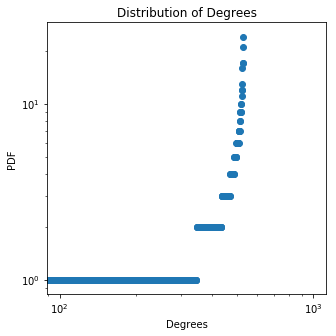

The clustering coefficient is 0.005050505050505051
Node with highest degree is: 27 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.90564613741545
345
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7116845652197363
number of closed triangles is 1
number of open triangles is 212
average distance is 0.6748372499578669


<Figure size 432x288 with 0 Axes>

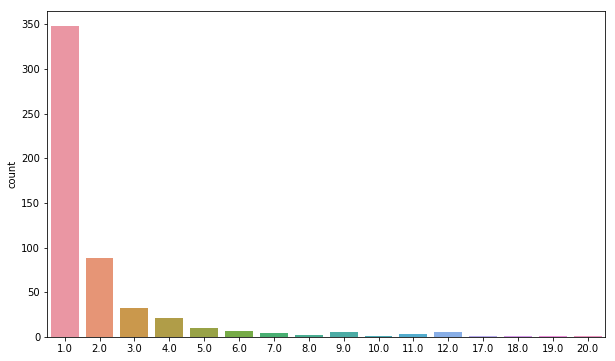

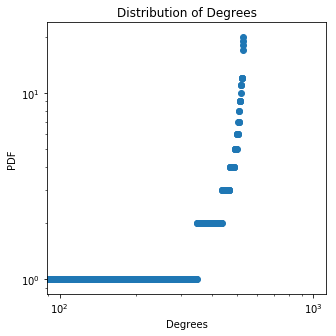

The clustering coefficient is 0.0047169811320754715
Node with highest degree is: 49 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.630174439302243
344
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7383010005079081
number of closed triangles is 1
number of open triangles is 240
average distance is 0.6907788529964768


<Figure size 432x288 with 0 Axes>

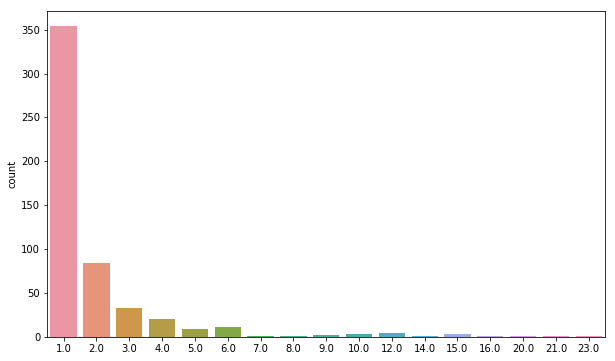

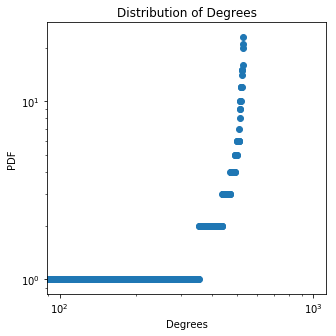

The clustering coefficient is 0.004166666666666667
Node with highest degree is: 29 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 6.50564613741545
343
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6848567652710339
number of closed triangles is 1
number of open triangles is 165
average distance is 0.6784162942029274


<Figure size 432x288 with 0 Axes>

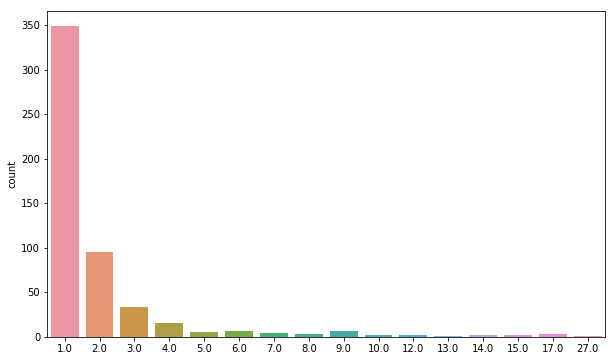

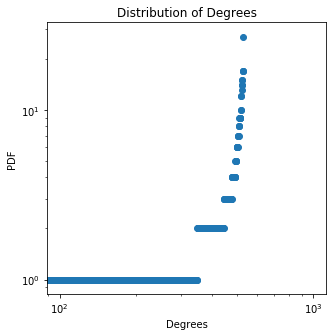

The clustering coefficient is 0.006060606060606061
Node with highest degree is: 25 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 6.535834816660733
342
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6694916583682607
number of closed triangles is 1
number of open triangles is 177
average distance is 0.6697416637055355


<Figure size 432x288 with 0 Axes>

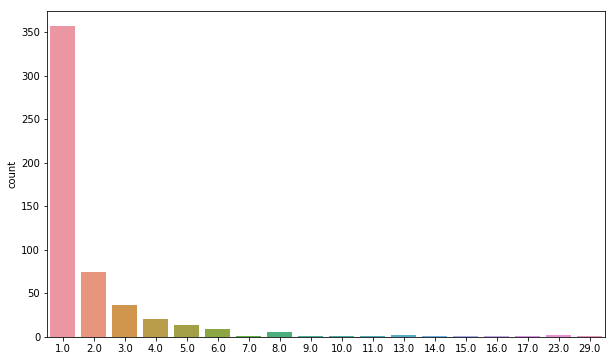

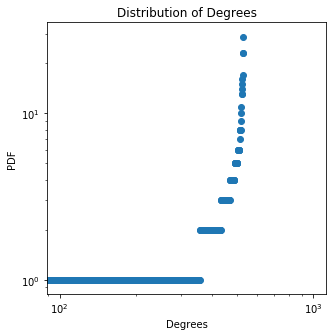

The clustering coefficient is 0.005649717514124294
Node with highest degree is: 21 with a degree of: 29.0 , the mean is 2.0037735849056606 , the variance is 7.0377216091135635
341
number of closed triangles is 1
number of open triangles is 0
average distance is 0.621035178158197
number of closed triangles is 1
number of open triangles is 236
average distance is 0.6306324659662524


<Figure size 432x288 with 0 Axes>

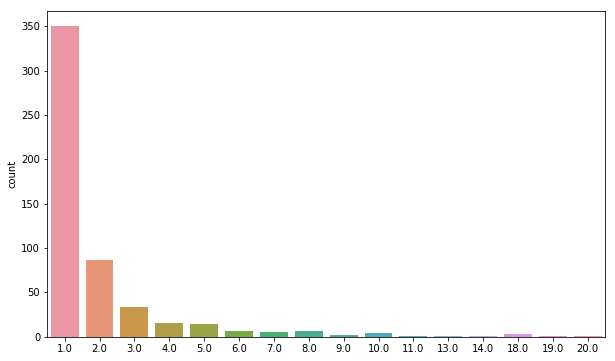

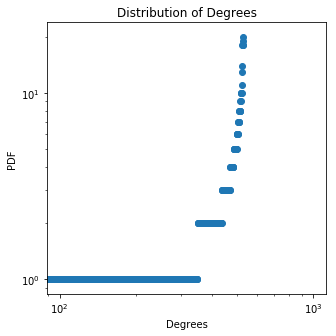

The clustering coefficient is 0.00423728813559322
Node with highest degree is: 6 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.826400854396583
340
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5771488557609755
number of closed triangles is 1
number of open triangles is 197
average distance is 0.6472498607752302


<Figure size 432x288 with 0 Axes>

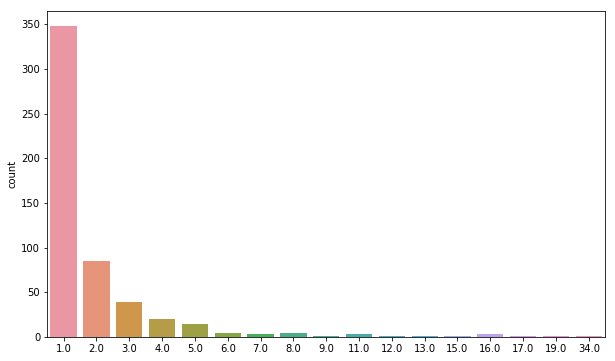

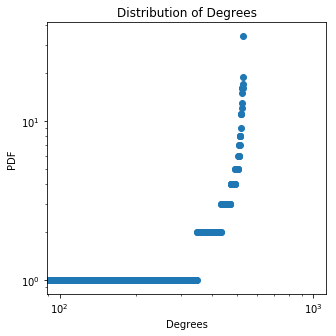

The clustering coefficient is 0.005076142131979695
Node with highest degree is: 25 with a degree of: 34.0 , the mean is 2.0037735849056606 , the variance is 6.950929156283375
339
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7201587146411725
number of closed triangles is 1
number of open triangles is 174
average distance is 0.701332287441735


<Figure size 432x288 with 0 Axes>

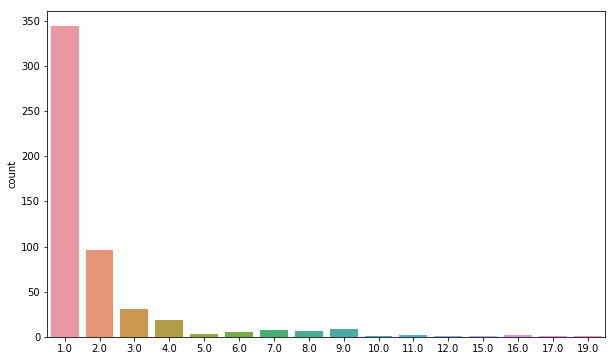

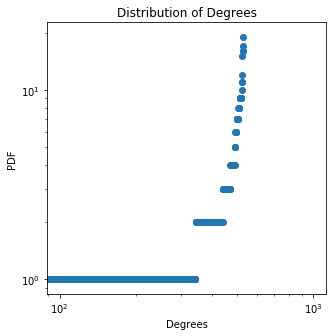

The clustering coefficient is 0.005747126436781609
Node with highest degree is: 27 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.313193307226771
338
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6674015047359454
number of closed triangles is 1
number of open triangles is 224
average distance is 0.6609356642137135


<Figure size 432x288 with 0 Axes>

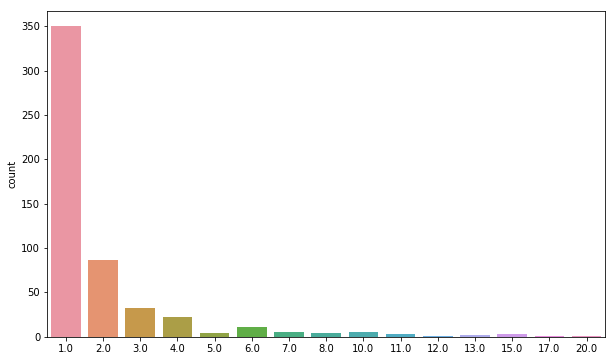

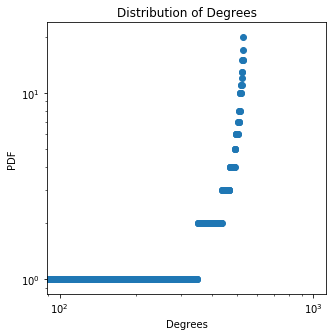

The clustering coefficient is 0.004464285714285714
Node with highest degree is: 10 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.494325382698469
337
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6092845405136493
number of closed triangles is 1
number of open triangles is 210
average distance is 0.6440795652603651


<Figure size 432x288 with 0 Axes>

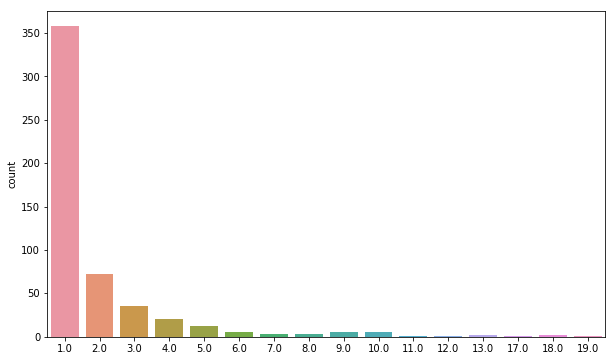

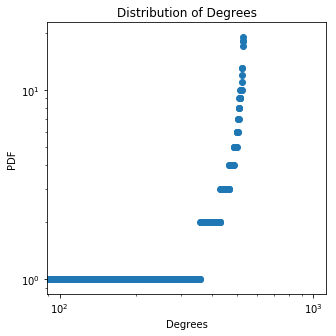

The clustering coefficient is 0.004761904761904762
Node with highest degree is: 23 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.562249911000357
336
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6193096100443373
number of closed triangles is 1
number of open triangles is 204
average distance is 0.6649646274917779


<Figure size 432x288 with 0 Axes>

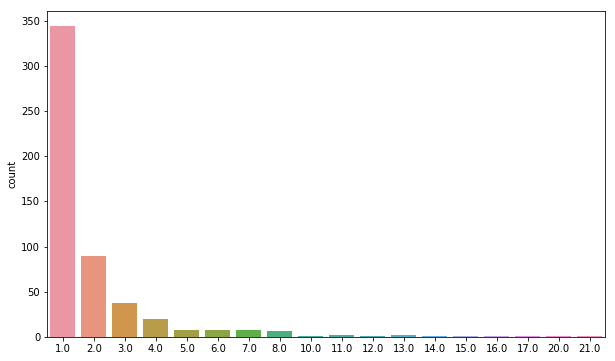

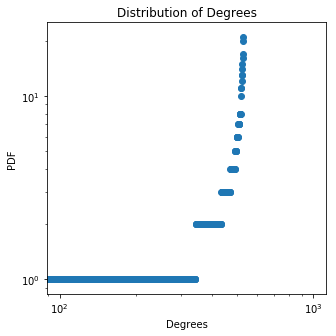

The clustering coefficient is 0.004901960784313725
Node with highest degree is: 1 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.68677821288715
335
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7052273737095597
number of closed triangles is 1
number of open triangles is 231
average distance is 0.6892755336128348


<Figure size 432x288 with 0 Axes>

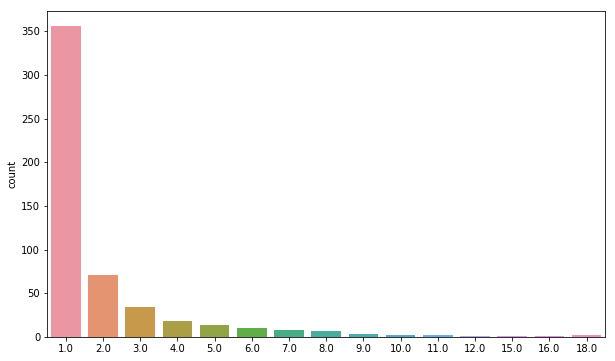

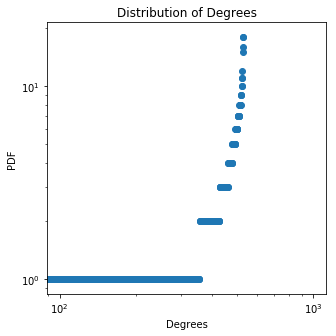

The clustering coefficient is 0.004329004329004329
Node with highest degree is: 22 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 4.932061231755073
334
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6480856185625048
number of closed triangles is 1
number of open triangles is 228
average distance is 0.6608305199979834


<Figure size 432x288 with 0 Axes>

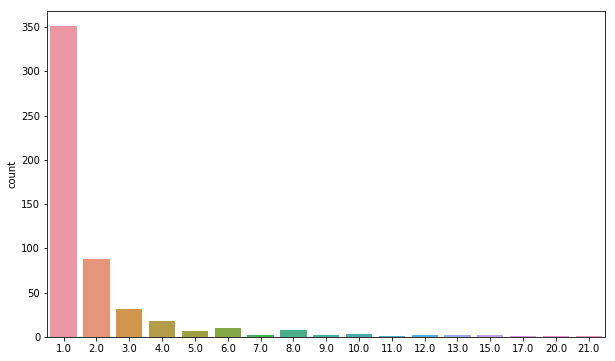

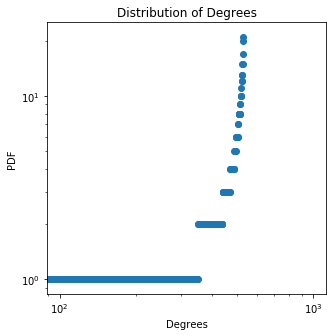

The clustering coefficient is 0.0043859649122807015
Node with highest degree is: 26 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.80375934496262
333
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6092494396583201
number of closed triangles is 1
number of open triangles is 199
average distance is 0.6529531713027105


<Figure size 432x288 with 0 Axes>

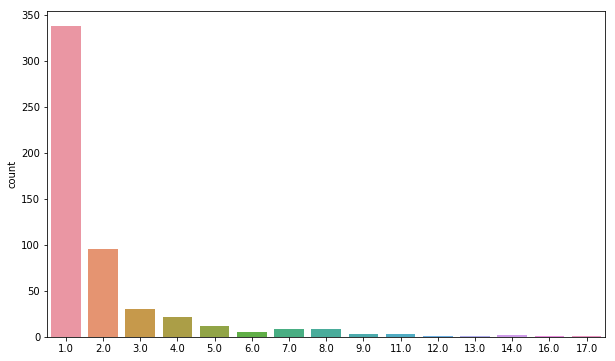

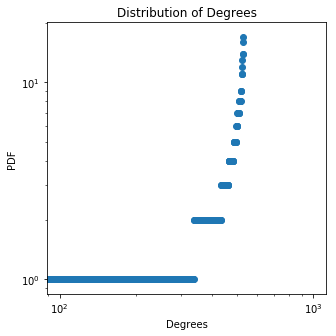

The clustering coefficient is 0.005025125628140704
Node with highest degree is: 20 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 4.626400854396582
332
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6794074056319046
number of closed triangles is 1
number of open triangles is 138
average distance is 0.6425601732778612


<Figure size 432x288 with 0 Axes>

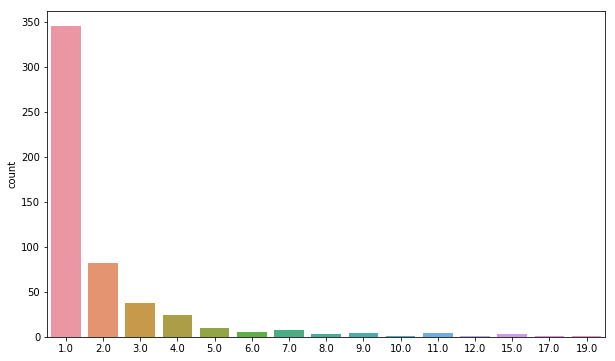

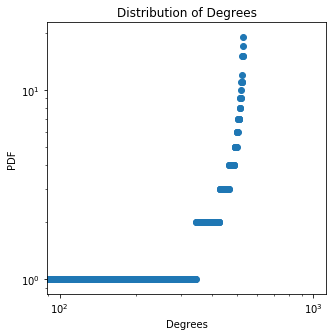

The clustering coefficient is 0.007246376811594203
Node with highest degree is: 15 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.022627269490922
331
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6917278870780241
number of closed triangles is 1
number of open triangles is 219
average distance is 0.6734246817325129


<Figure size 432x288 with 0 Axes>

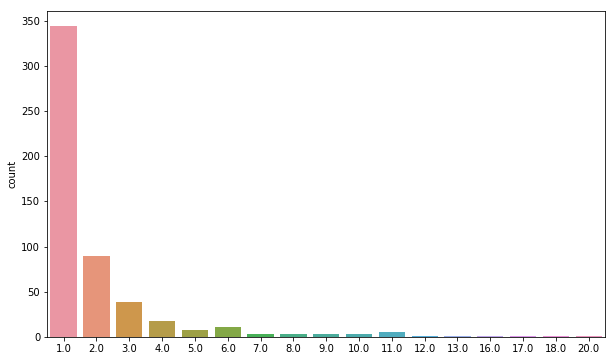

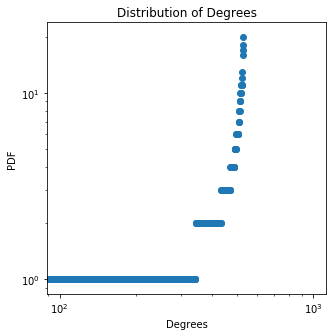

The clustering coefficient is 0.0045662100456621
Node with highest degree is: 57 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.362249911000356
330
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6348023355296507
number of closed triangles is 1
number of open triangles is 210
average distance is 0.6770334312439801


<Figure size 432x288 with 0 Axes>

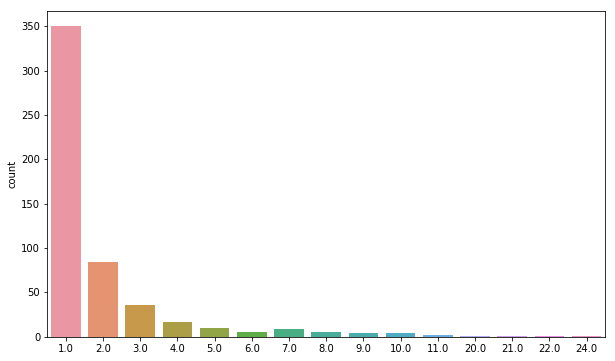

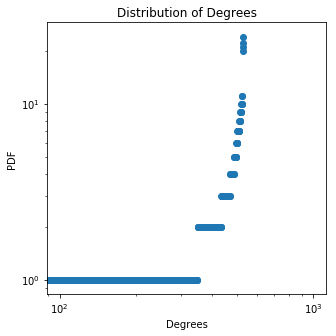

The clustering coefficient is 0.004761904761904762
Node with highest degree is: 16 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.060363118547526
329
number of closed triangles is 1
number of open triangles is 0
average distance is 0.653982326417819
number of closed triangles is 1
number of open triangles is 228
average distance is 0.6653256783337729


<Figure size 432x288 with 0 Axes>

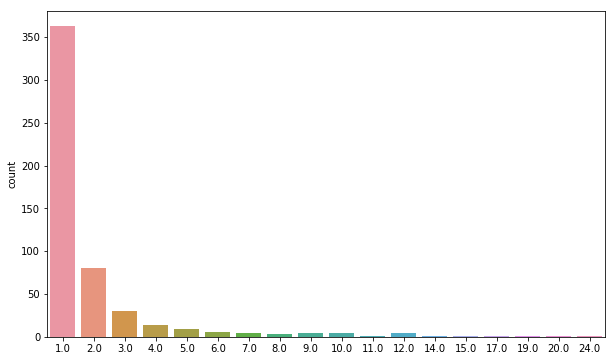

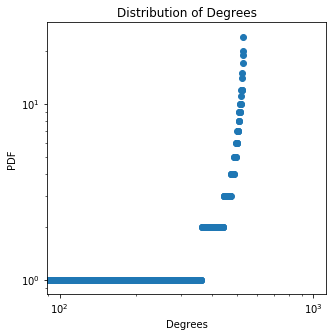

The clustering coefficient is 0.0043859649122807015
Node with highest degree is: 5 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.558476326094695
328
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6638976737242179
number of closed triangles is 1
number of open triangles is 218
average distance is 0.6276797852663688


<Figure size 432x288 with 0 Axes>

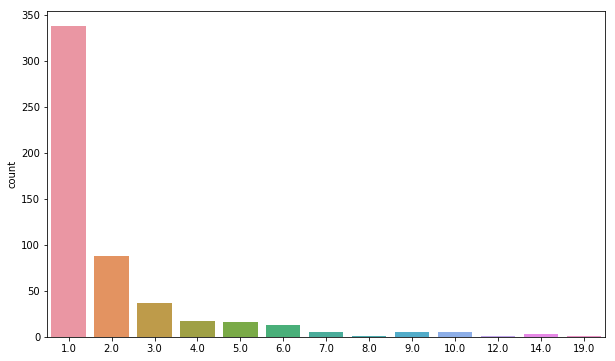

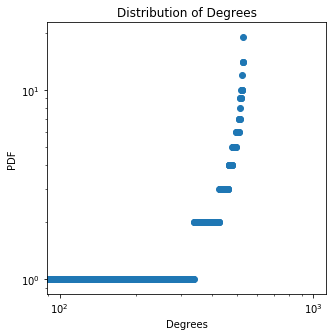

The clustering coefficient is 0.0045871559633027525
Node with highest degree is: 12 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 4.418853684585263
327
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6910439845497831
number of closed triangles is 1
number of open triangles is 224
average distance is 0.6559422126074889


<Figure size 432x288 with 0 Axes>

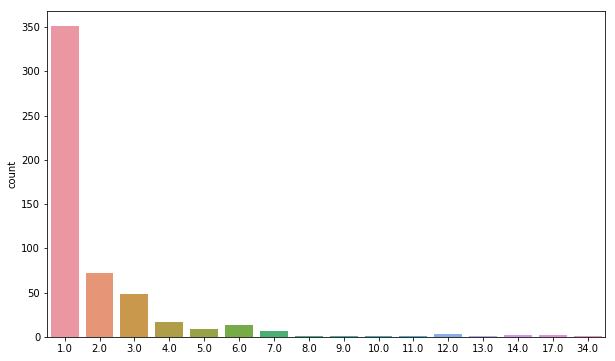

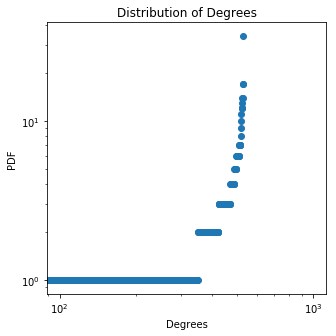

The clustering coefficient is 0.004464285714285714
Node with highest degree is: 8 with a degree of: 34.0 , the mean is 2.0037735849056606 , the variance is 6.30941972232111
326
number of closed triangles is 1
number of open triangles is 0
average distance is 0.594114321309746
number of closed triangles is 1
number of open triangles is 211
average distance is 0.6635388814623199


<Figure size 432x288 with 0 Axes>

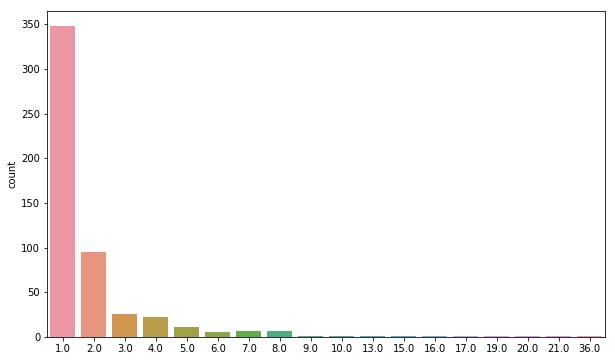

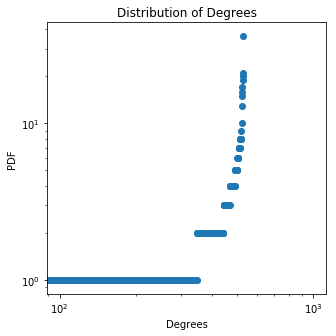

The clustering coefficient is 0.004739336492890996
Node with highest degree is: 1 with a degree of: 36.0 , the mean is 2.0037735849056606 , the variance is 7.520740477038093
325
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6760921922089034
number of closed triangles is 1
number of open triangles is 174
average distance is 0.6403865403648412


<Figure size 432x288 with 0 Axes>

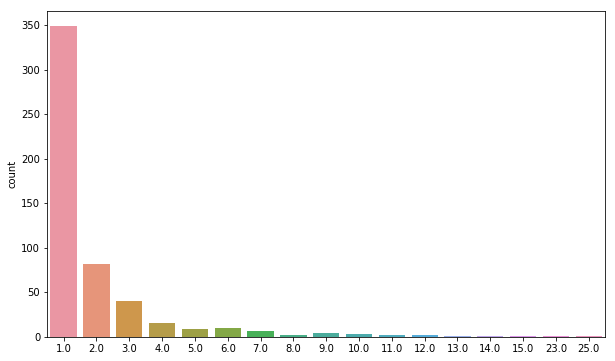

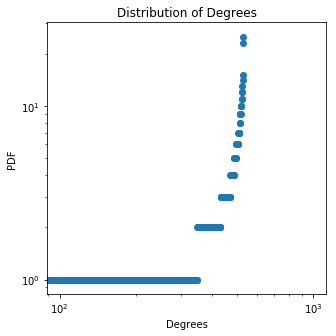

The clustering coefficient is 0.005747126436781609
Node with highest degree is: 10 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.79243859024564
324
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5914875523051978
number of closed triangles is 1
number of open triangles is 238
average distance is 0.6621186256326866


<Figure size 432x288 with 0 Axes>

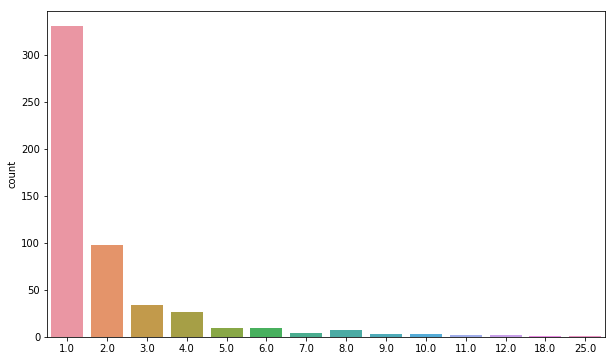

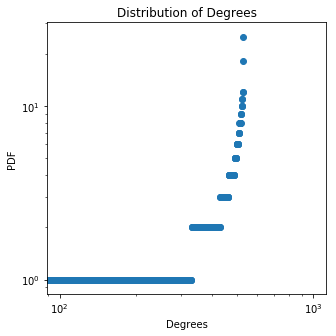

The clustering coefficient is 0.004201680672268907
Node with highest degree is: 28 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 4.777344250622996
323
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6132032459939157
number of closed triangles is 1
number of open triangles is 257
average distance is 0.6368165792292525


<Figure size 432x288 with 0 Axes>

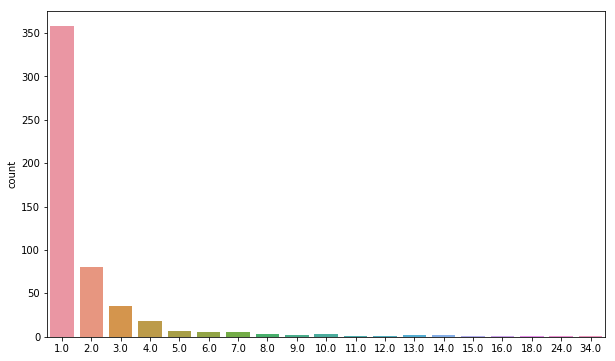

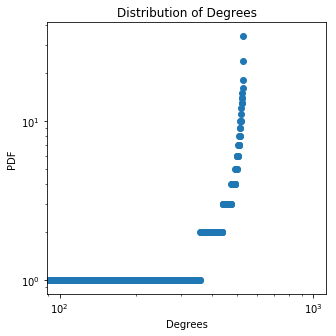

The clustering coefficient is 0.0038910505836575876
Node with highest degree is: 17 with a degree of: 34.0 , the mean is 2.0037735849056606 , the variance is 7.524514061943753
322
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6094820194020858
number of closed triangles is 1
number of open triangles is 202
average distance is 0.6620358870856176


<Figure size 432x288 with 0 Axes>

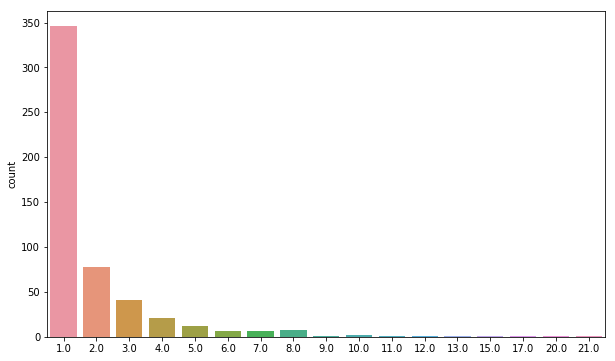

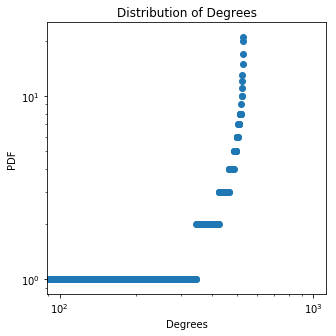

The clustering coefficient is 0.0049504950495049506
Node with highest degree is: 16 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.1169668921324325
321
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6741071338987505
number of closed triangles is 1
number of open triangles is 160
average distance is 0.6620320240391032


<Figure size 432x288 with 0 Axes>

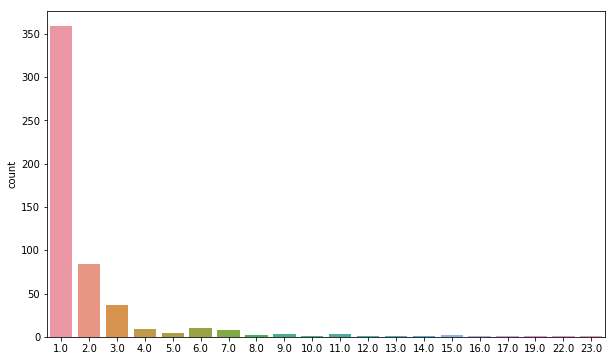

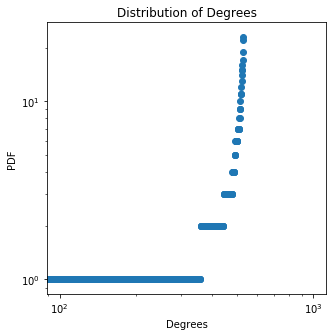

The clustering coefficient is 0.00625
Node with highest degree is: 6 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 6.80753292986828
320
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6539847247126698
number of closed triangles is 1
number of open triangles is 201
average distance is 0.6451500513294366


<Figure size 432x288 with 0 Axes>

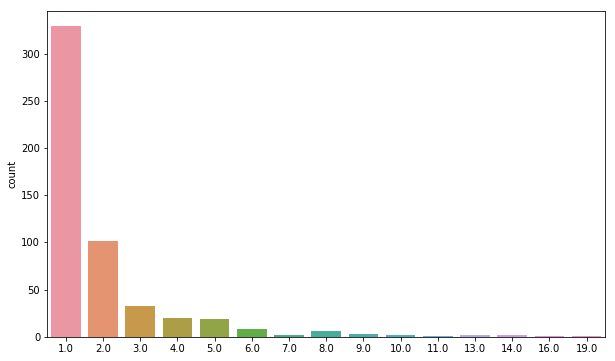

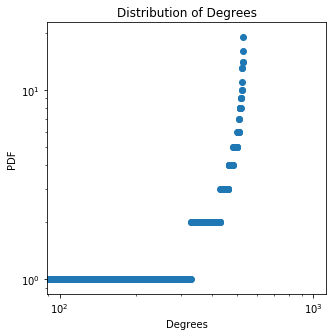

The clustering coefficient is 0.004975124378109453
Node with highest degree is: 16 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 4.486778212887148
319
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6619896475905079
number of closed triangles is 1
number of open triangles is 187
average distance is 0.6606956140066582


<Figure size 432x288 with 0 Axes>

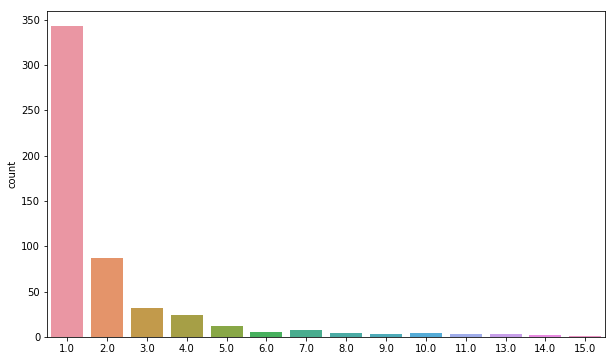

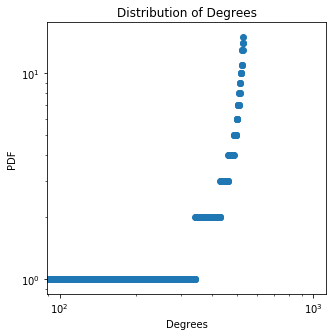

The clustering coefficient is 0.0053475935828877
Node with highest degree is: 11 with a degree of: 15.0 , the mean is 2.0037735849056606 , the variance is 4.611306514773942
318
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6564705849048464
number of closed triangles is 1
number of open triangles is 223
average distance is 0.6560237777514433


<Figure size 432x288 with 0 Axes>

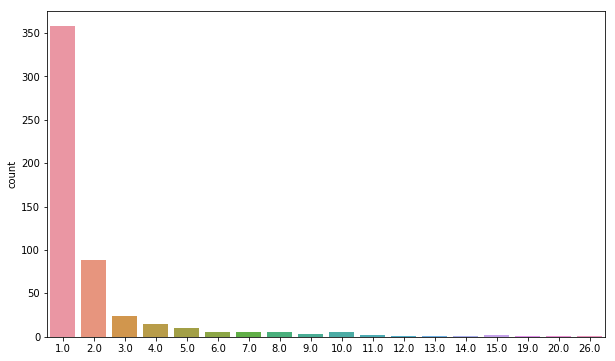

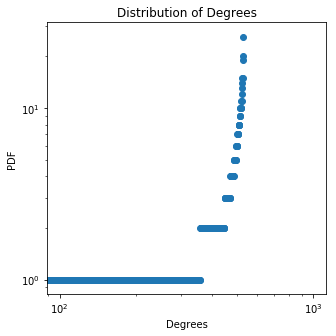

The clustering coefficient is 0.004484304932735426
Node with highest degree is: 43 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 6.516966892132433
317
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5872684470597728
number of closed triangles is 1
number of open triangles is 172
average distance is 0.6464434436151686


<Figure size 432x288 with 0 Axes>

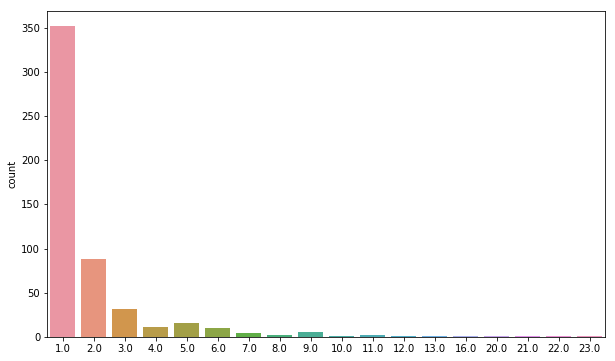

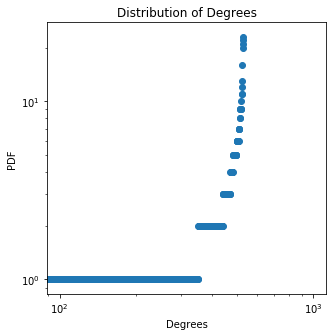

The clustering coefficient is 0.005813953488372093
Node with highest degree is: 11 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 6.350929156283375
316
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6890499706464251
number of closed triangles is 1
number of open triangles is 186
average distance is 0.6605755996295397


<Figure size 432x288 with 0 Axes>

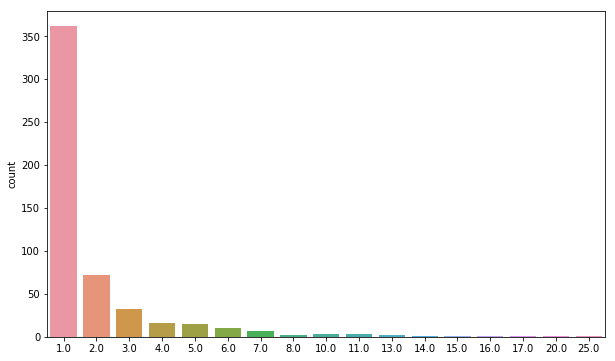

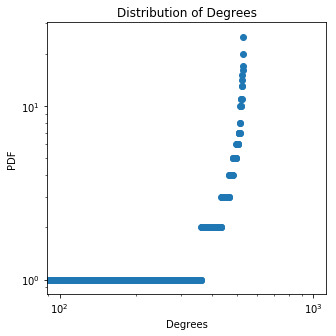

The clustering coefficient is 0.005376344086021506
Node with highest degree is: 1 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.158476326094696
315
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5714836773404958
number of closed triangles is 1
number of open triangles is 230
average distance is 0.6579337965739056


<Figure size 432x288 with 0 Axes>

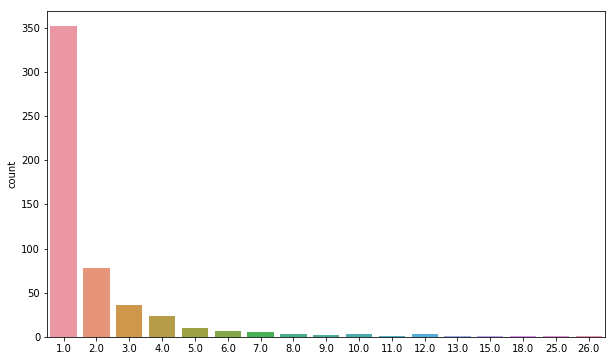

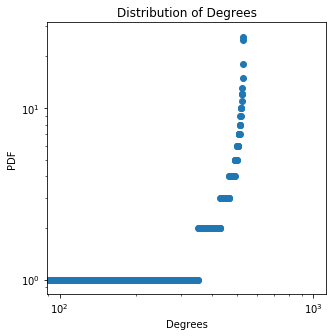

The clustering coefficient is 0.004347826086956522
Node with highest degree is: 16 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 6.162249911000356
314
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5995665120510535
number of closed triangles is 1
number of open triangles is 193
average distance is 0.6421125739447686


<Figure size 432x288 with 0 Axes>

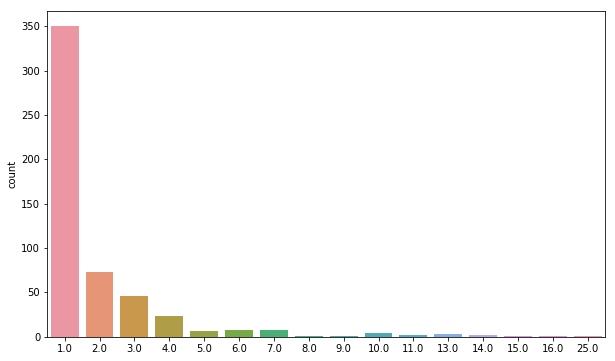

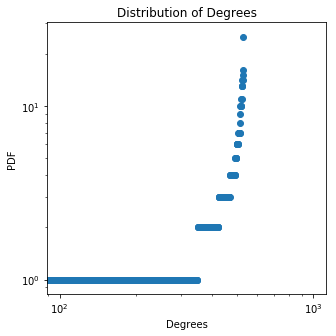

The clustering coefficient is 0.0051813471502590676
Node with highest degree is: 7 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.50564613741545
313
number of closed triangles is 1
number of open triangles is 0
average distance is 0.624148145494762
number of closed triangles is 1
number of open triangles is 222
average distance is 0.6578651312795655


<Figure size 432x288 with 0 Axes>

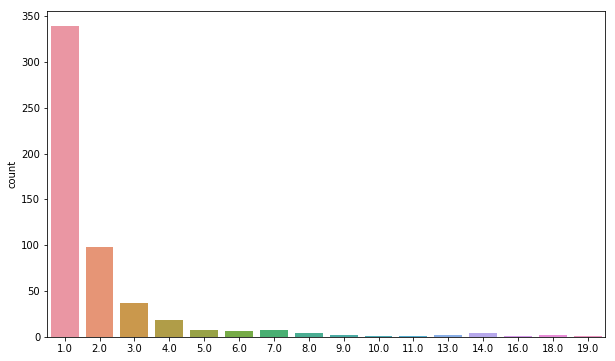

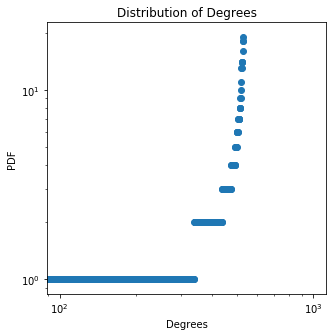

The clustering coefficient is 0.0045045045045045045
Node with highest degree is: 7 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.630174439302244
312
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7049462414722977
number of closed triangles is 1
number of open triangles is 149
average distance is 0.646990615718809


<Figure size 432x288 with 0 Axes>

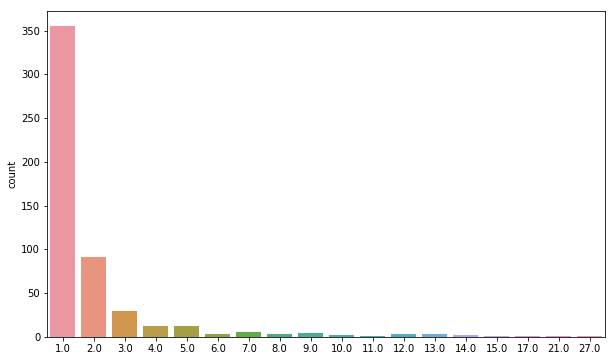

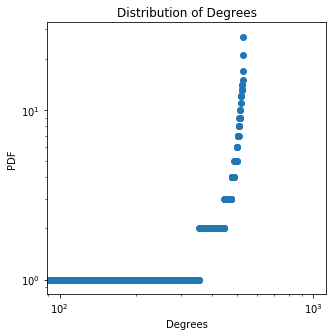

The clustering coefficient is 0.006711409395973154
Node with highest degree is: 16 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 6.713193307226771
311
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6719874337846454
number of closed triangles is 1
number of open triangles is 184
average distance is 0.6698818903010882


<Figure size 432x288 with 0 Axes>

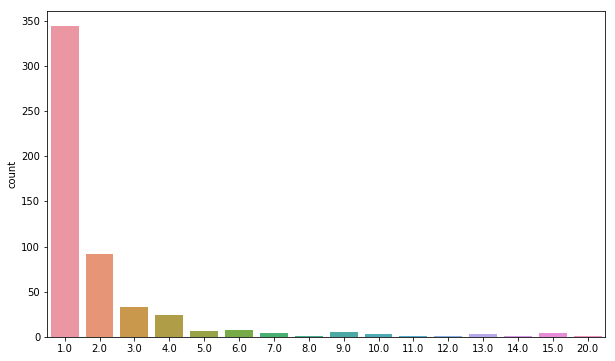

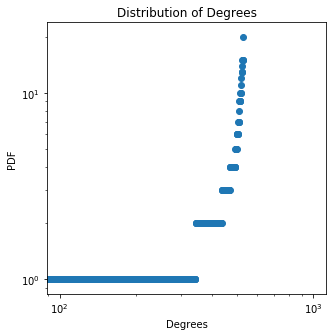

The clustering coefficient is 0.005434782608695652
Node with highest degree is: 27 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.4716838732645074
310
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6528077206545798
number of closed triangles is 1
number of open triangles is 214
average distance is 0.665782826683174


<Figure size 432x288 with 0 Axes>

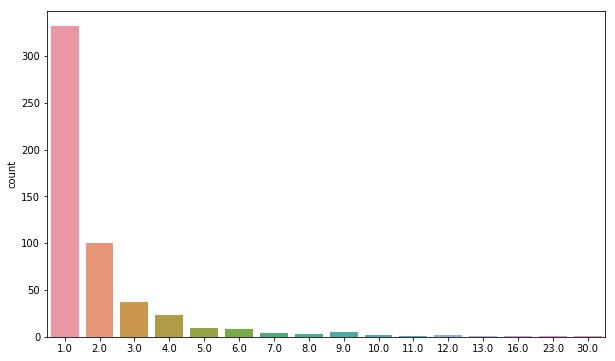

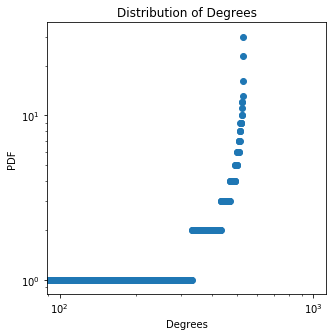

The clustering coefficient is 0.004672897196261682
Node with highest degree is: 8 with a degree of: 30.0 , the mean is 2.0037735849056606 , the variance is 5.799985760056959
309
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7263313948423715
number of closed triangles is 1
number of open triangles is 190
average distance is 0.6638787676441232


<Figure size 432x288 with 0 Axes>

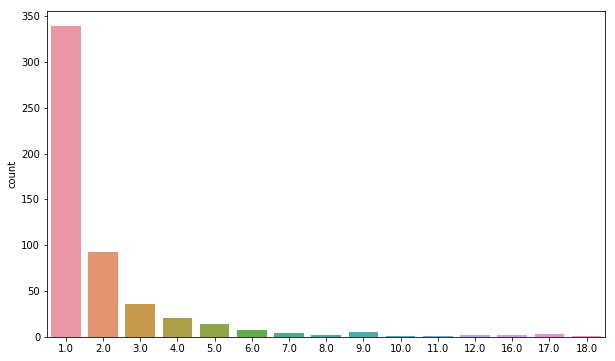

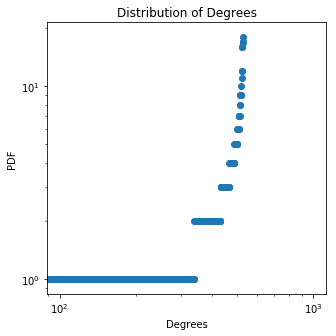

The clustering coefficient is 0.005263157894736842
Node with highest degree is: 17 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.249042363830545
308
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5986487555145371
number of closed triangles is 1
number of open triangles is 224
average distance is 0.6251170343767122


<Figure size 432x288 with 0 Axes>

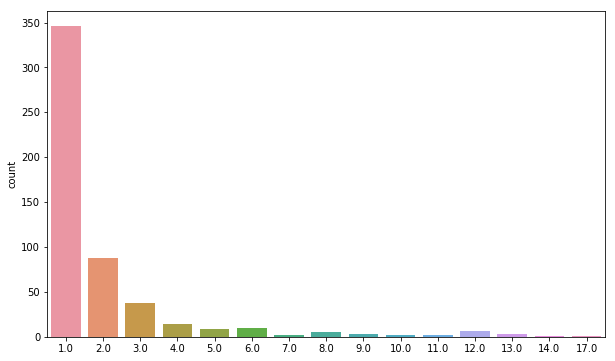

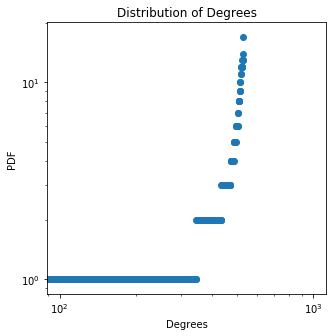

The clustering coefficient is 0.004464285714285714
Node with highest degree is: 16 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 5.0565895336418665
307
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6271682449545369
number of closed triangles is 1
number of open triangles is 228
average distance is 0.6554845839847224


<Figure size 432x288 with 0 Axes>

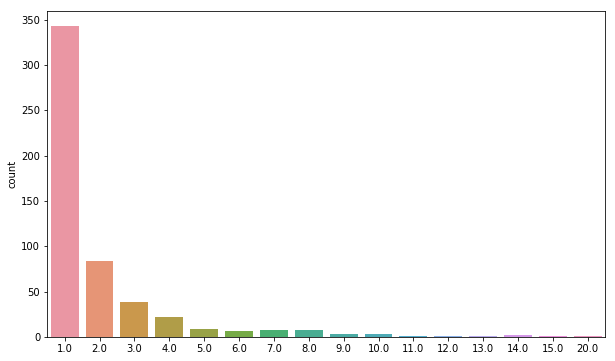

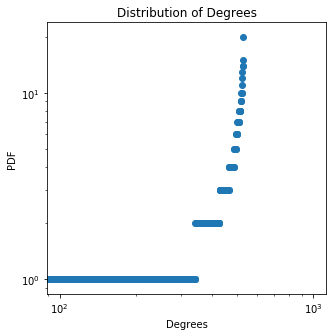

The clustering coefficient is 0.0043859649122807015
Node with highest degree is: 24 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 4.754702741189036
306
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7000628730597712
number of closed triangles is 1
number of open triangles is 235
average distance is 0.699156758763987


<Figure size 432x288 with 0 Axes>

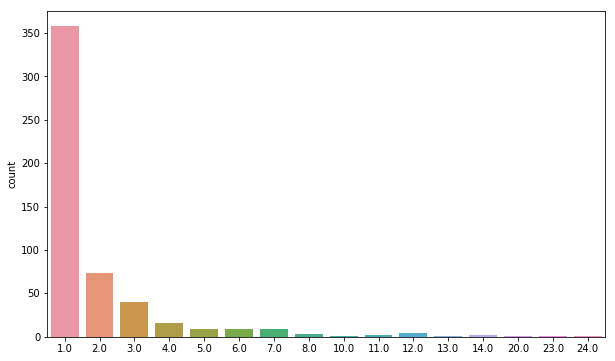

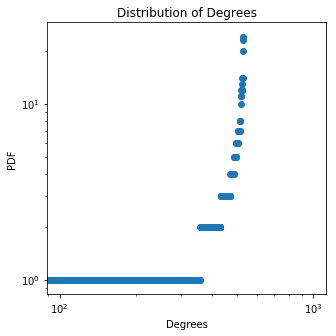

The clustering coefficient is 0.00425531914893617
Node with highest degree is: 27 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.233948024207904
305
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6999446310500381
number of closed triangles is 1
number of open triangles is 221
average distance is 0.6637136218651726


<Figure size 432x288 with 0 Axes>

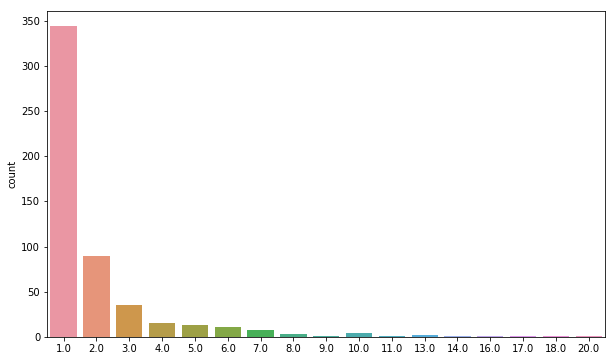

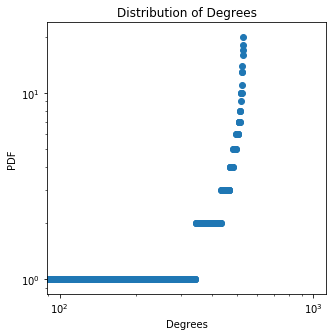

The clustering coefficient is 0.004524886877828055
Node with highest degree is: 12 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.2603631185475255
304
number of closed triangles is 1
number of open triangles is 0
average distance is 0.640267888377075
number of closed triangles is 1
number of open triangles is 206
average distance is 0.6933324541500121


<Figure size 432x288 with 0 Axes>

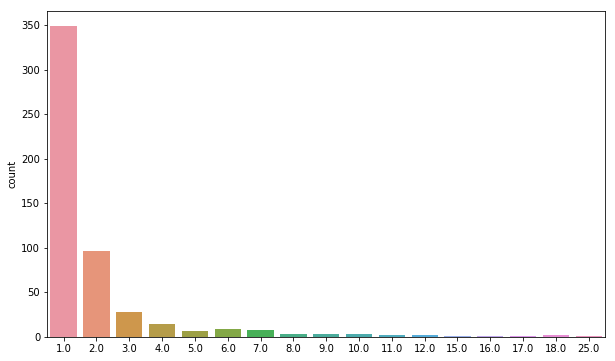

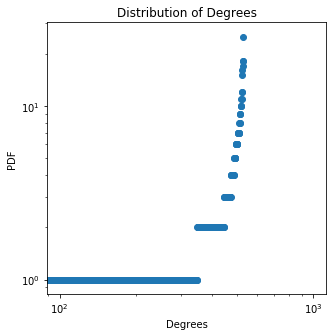

The clustering coefficient is 0.0048543689320388345
Node with highest degree is: 7 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.1886650053399785
303
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6473941390147093
number of closed triangles is 1
number of open triangles is 190
average distance is 0.6562209198415972


<Figure size 432x288 with 0 Axes>

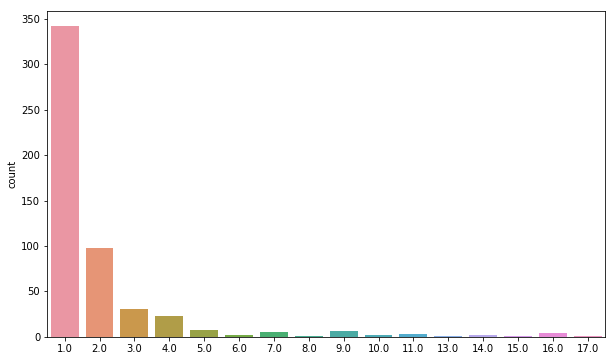

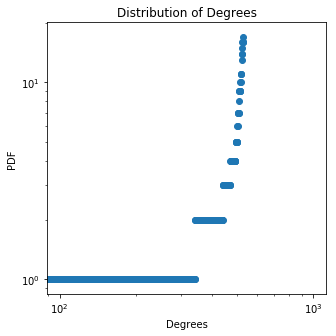

The clustering coefficient is 0.005263157894736842
Node with highest degree is: 16 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 5.626400854396583
302
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7055351945689642
number of closed triangles is 1
number of open triangles is 213
average distance is 0.6689728360277115


<Figure size 432x288 with 0 Axes>

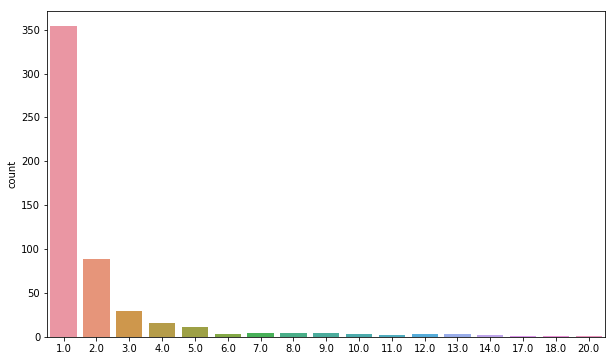

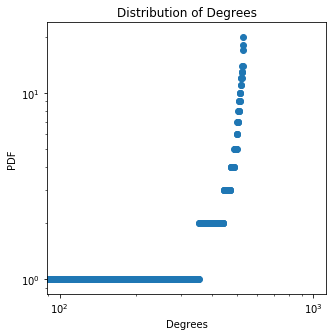

The clustering coefficient is 0.004694835680751174
Node with highest degree is: 27 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.932061231755074
301
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6241406208831849
number of closed triangles is 1
number of open triangles is 140
average distance is 0.6530262009665324


<Figure size 432x288 with 0 Axes>

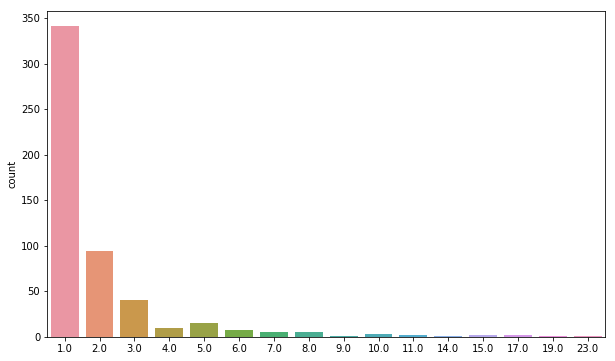

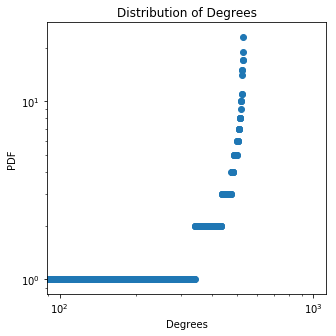

The clustering coefficient is 0.007142857142857143
Node with highest degree is: 27 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.732061231755074
300
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5989235880453876
number of closed triangles is 1
number of open triangles is 190
average distance is 0.6419137281244865


<Figure size 432x288 with 0 Axes>

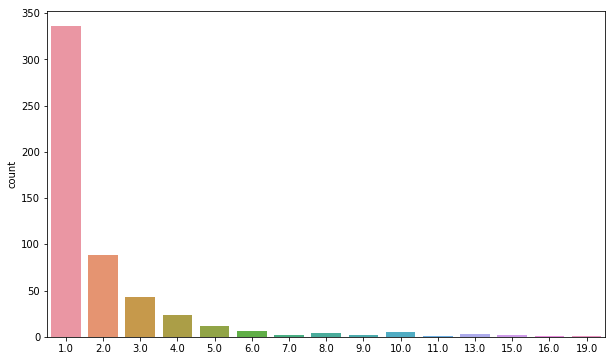

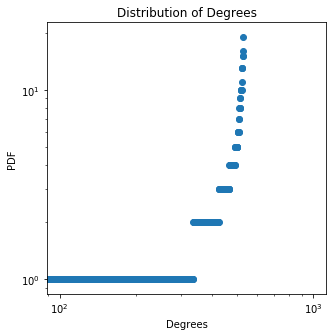

The clustering coefficient is 0.005263157894736842
Node with highest degree is: 23 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 4.826400854396583
299
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7046403591016012
number of closed triangles is 1
number of open triangles is 185
average distance is 0.6821806561686321


<Figure size 432x288 with 0 Axes>

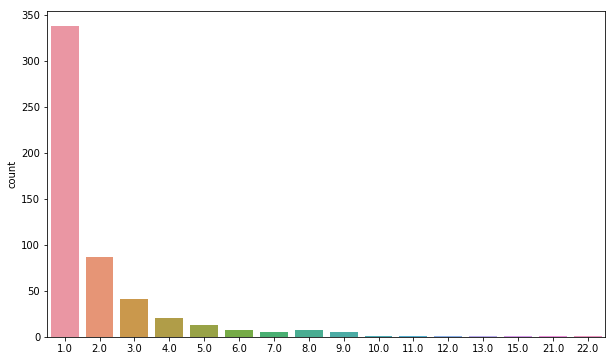

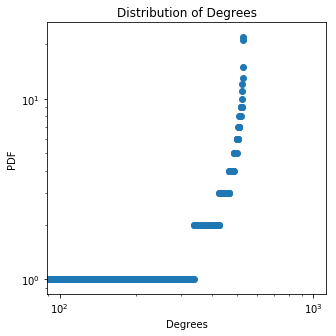

The clustering coefficient is 0.005405405405405406
Node with highest degree is: 12 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 4.916966892132432
298
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7108594398937389
number of closed triangles is 1
number of open triangles is 189
average distance is 0.6735883963661141


<Figure size 432x288 with 0 Axes>

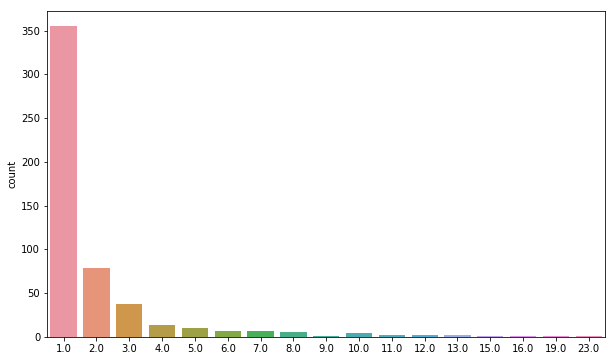

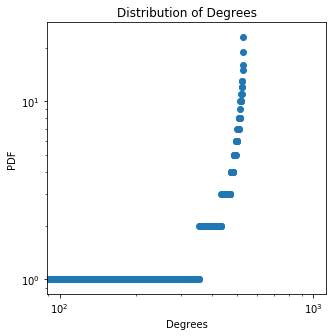

The clustering coefficient is 0.005291005291005291
Node with highest degree is: 12 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.739608401566395
297
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6446234483728065
number of closed triangles is 1
number of open triangles is 229
average distance is 0.6677207177333125


<Figure size 432x288 with 0 Axes>

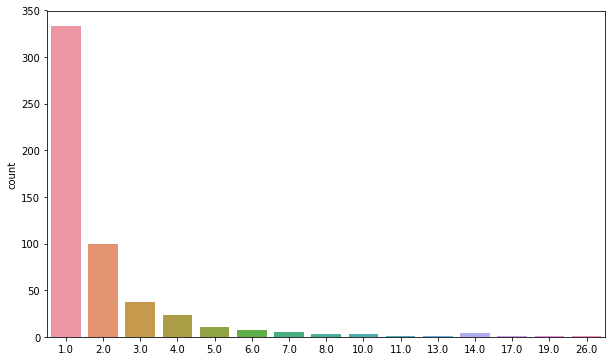

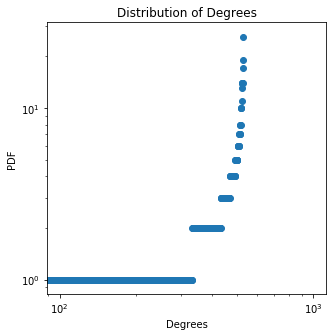

The clustering coefficient is 0.004366812227074236
Node with highest degree is: 13 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 5.596212175151299
296
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5847778949550957
number of closed triangles is 1
number of open triangles is 215
average distance is 0.6416808544567832


<Figure size 432x288 with 0 Axes>

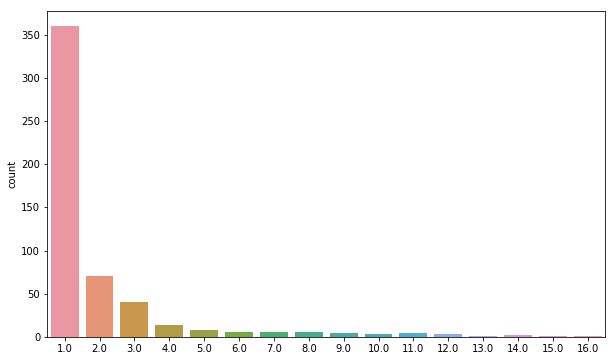

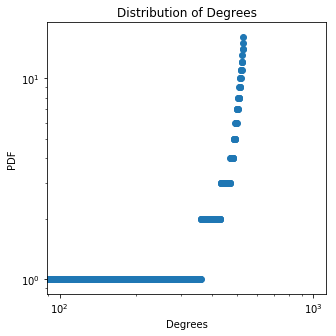

The clustering coefficient is 0.004651162790697674
Node with highest degree is: 12 with a degree of: 16.0 , the mean is 2.0037735849056606 , the variance is 5.2377216091135645
295
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6329340543075347
number of closed triangles is 1
number of open triangles is 209
average distance is 0.6533882192402874


<Figure size 432x288 with 0 Axes>

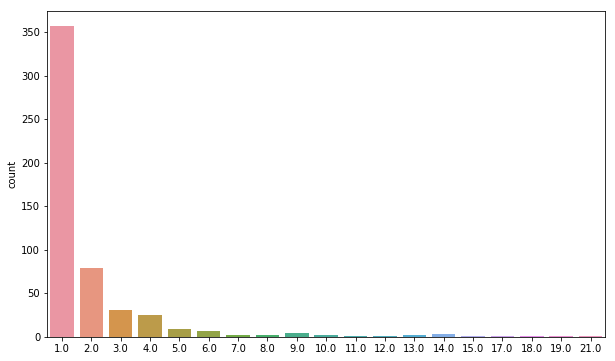

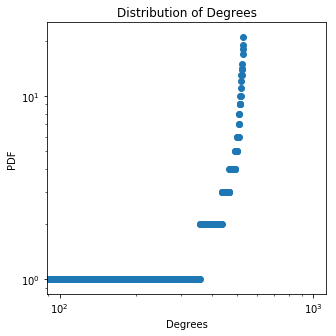

The clustering coefficient is 0.004784688995215311
Node with highest degree is: 24 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 6.192438590245638
294
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5822752810921531
number of closed triangles is 1
number of open triangles is 261
average distance is 0.640765169204536


<Figure size 432x288 with 0 Axes>

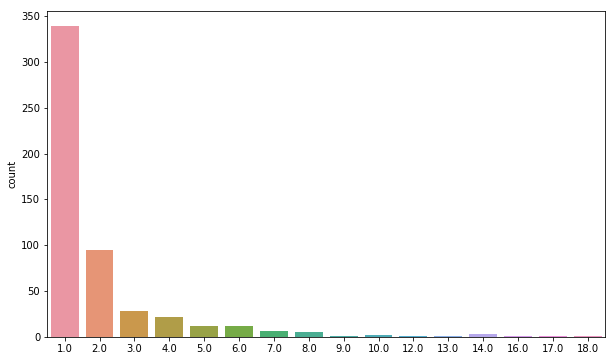

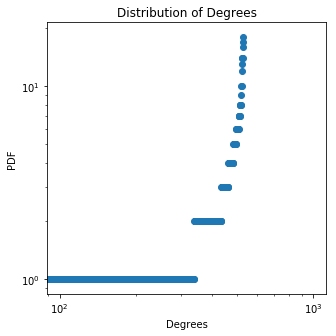

The clustering coefficient is 0.0038314176245210726
Node with highest degree is: 16 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 4.890551797792809
293
number of closed triangles is 1
number of open triangles is 0
average distance is 0.684657341958946
number of closed triangles is 1
number of open triangles is 216
average distance is 0.6705032649121706


<Figure size 432x288 with 0 Axes>

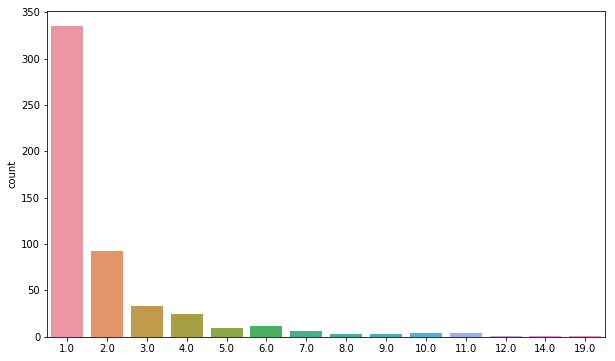

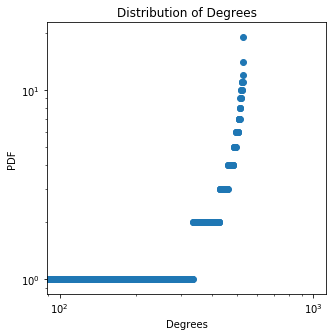

The clustering coefficient is 0.004629629629629629
Node with highest degree is: 12 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 4.279231043075828
292
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7254482837093666
number of closed triangles is 1
number of open triangles is 166
average distance is 0.6559912605937439


<Figure size 432x288 with 0 Axes>

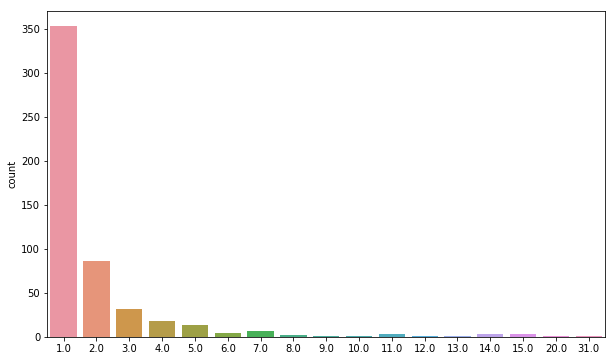

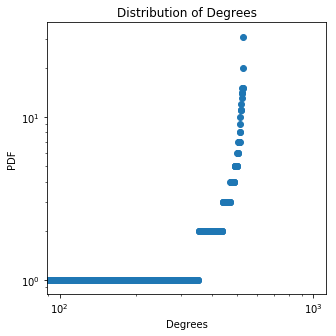

The clustering coefficient is 0.006024096385542169
Node with highest degree is: 27 with a degree of: 31.0 , the mean is 2.0037735849056606 , the variance is 6.728287646849413
291
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6190907110326767
number of closed triangles is 1
number of open triangles is 218
average distance is 0.6728556911889506


<Figure size 432x288 with 0 Axes>

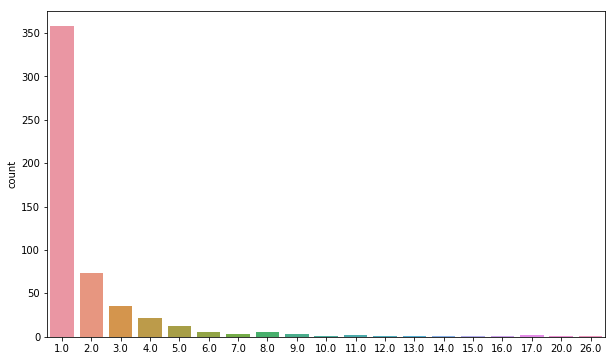

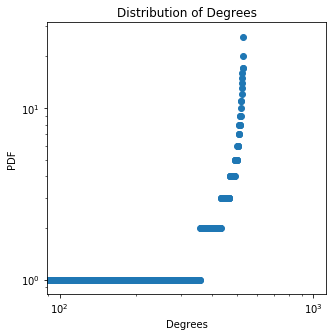

The clustering coefficient is 0.0045871559633027525
Node with highest degree is: 40 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 6.373570665717337
290
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6268267877221859
number of closed triangles is 1
number of open triangles is 155
average distance is 0.6449776859415614


<Figure size 432x288 with 0 Axes>

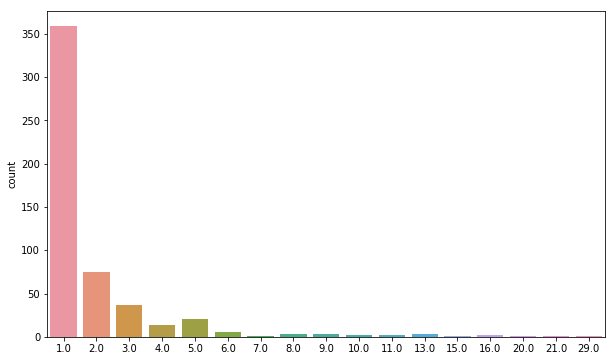

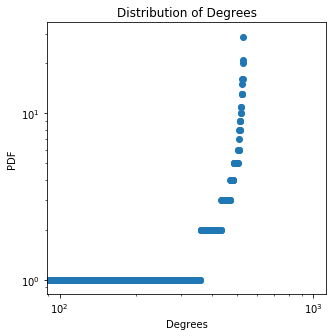

The clustering coefficient is 0.0064516129032258064
Node with highest degree is: 21 with a degree of: 29.0 , the mean is 2.0037735849056606 , the variance is 6.830174439302242
289
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6902224005094101
number of closed triangles is 1
number of open triangles is 197
average distance is 0.6566123068863141


<Figure size 432x288 with 0 Axes>

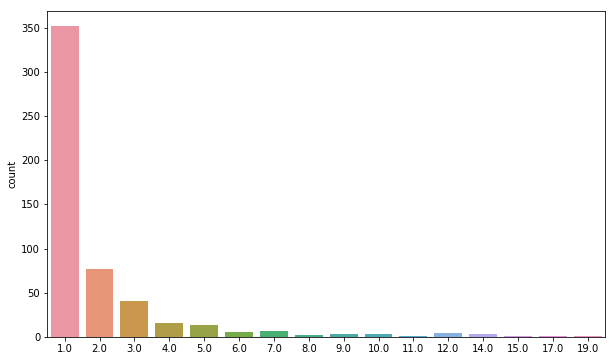

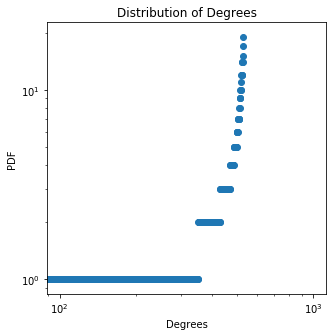

The clustering coefficient is 0.005076142131979695
Node with highest degree is: 7 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.350929156283376
288
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7070262099926883
number of closed triangles is 1
number of open triangles is 250
average distance is 0.6479388389899202


<Figure size 432x288 with 0 Axes>

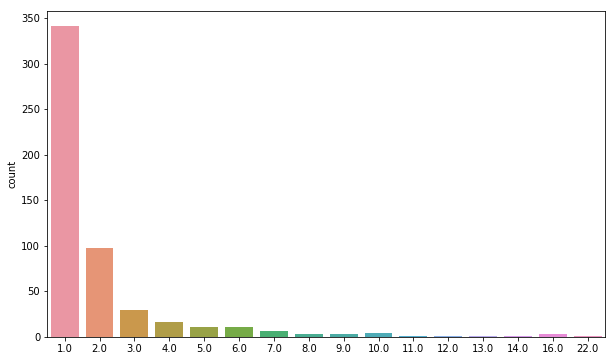

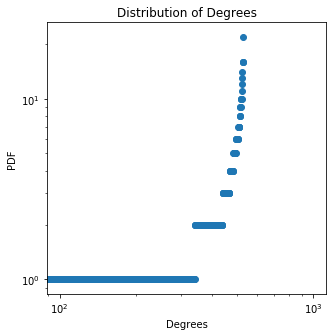

The clustering coefficient is 0.004
Node with highest degree is: 3 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.290551797792809
287
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6381288999339992
number of closed triangles is 1
number of open triangles is 194
average distance is 0.6631211807767651


<Figure size 432x288 with 0 Axes>

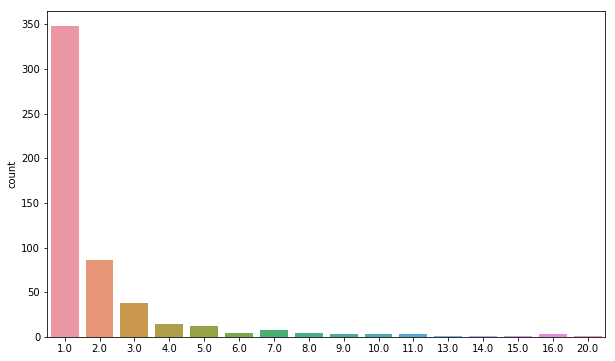

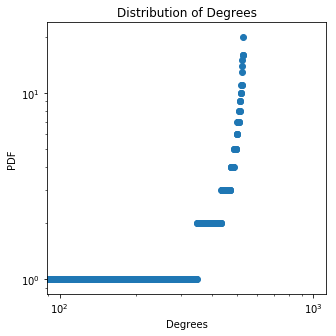

The clustering coefficient is 0.005154639175257732
Node with highest degree is: 16 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.445268778924885
286
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5698834127949229
number of closed triangles is 1
number of open triangles is 182
average distance is 0.6617651320351415


<Figure size 432x288 with 0 Axes>

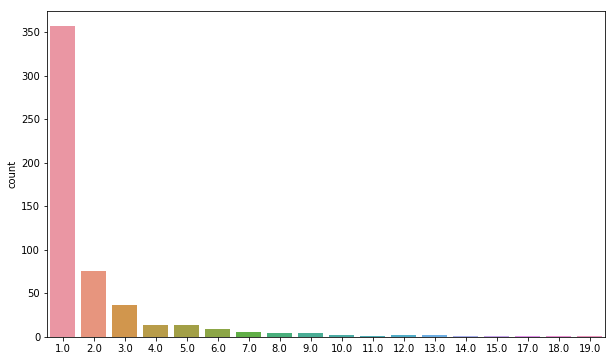

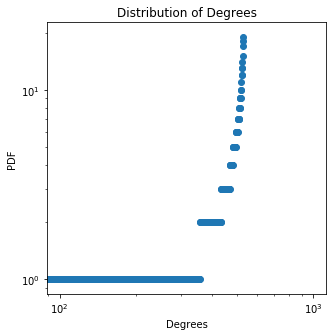

The clustering coefficient is 0.005494505494505495
Node with highest degree is: 26 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.528287646849412
285
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6556325621043634
number of closed triangles is 1
number of open triangles is 192
average distance is 0.6606017599316713


<Figure size 432x288 with 0 Axes>

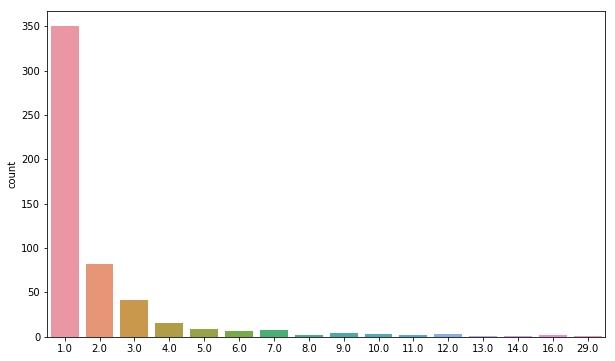

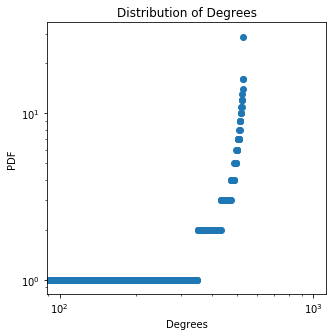

The clustering coefficient is 0.005208333333333333
Node with highest degree is: 16 with a degree of: 29.0 , the mean is 2.0037735849056606 , the variance is 5.916966892132431
284
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6724936499943197
number of closed triangles is 1
number of open triangles is 237
average distance is 0.665449895301826


<Figure size 432x288 with 0 Axes>

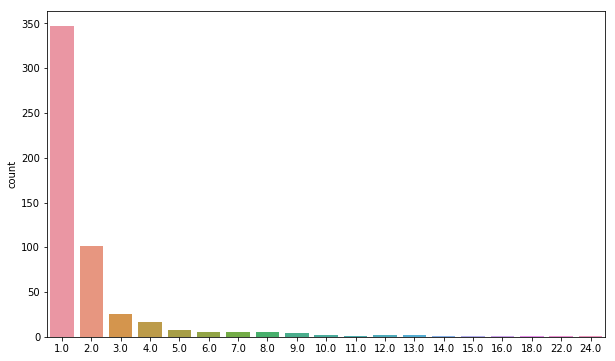

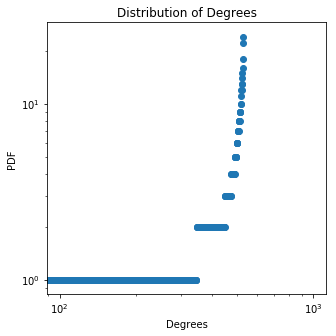

The clustering coefficient is 0.004219409282700422
Node with highest degree is: 5 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.3962121751513
283
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7407130293140464
number of closed triangles is 1
number of open triangles is 171
average distance is 0.6429657077851022


<Figure size 432x288 with 0 Axes>

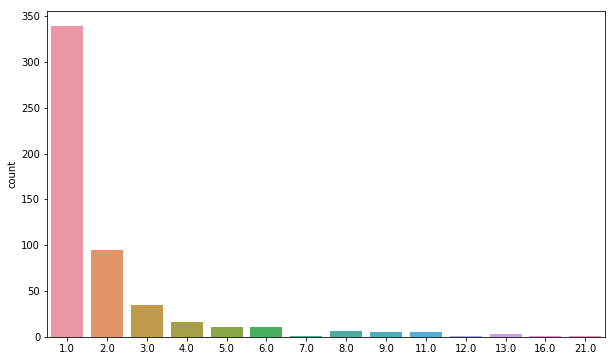

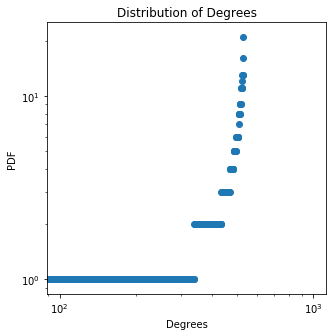

The clustering coefficient is 0.005847953216374269
Node with highest degree is: 20 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 4.950929156283375
282
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6555621600006944
number of closed triangles is 1
number of open triangles is 183
average distance is 0.6357847969906104


<Figure size 432x288 with 0 Axes>

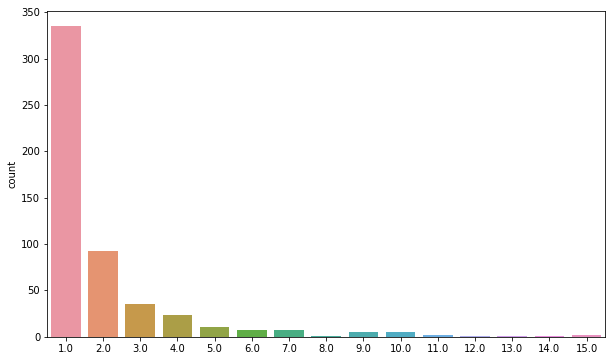

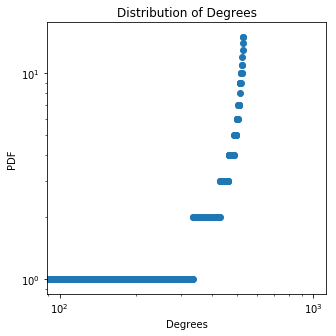

The clustering coefficient is 0.00546448087431694
Node with highest degree is: 8 with a degree of: 15.0 , the mean is 2.0037735849056606 , the variance is 4.373570665717337
281
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6276142173106852
number of closed triangles is 1
number of open triangles is 176
average distance is 0.6575364980592071


<Figure size 432x288 with 0 Axes>

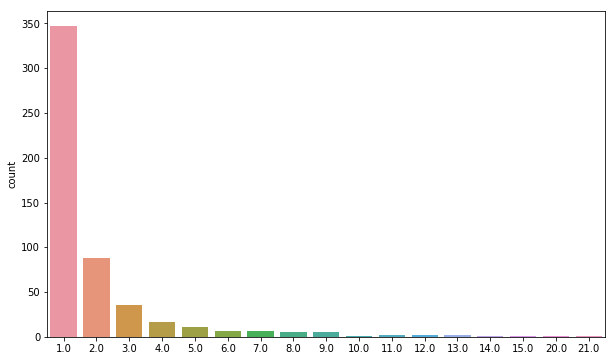

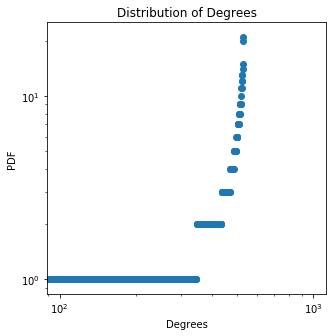

The clustering coefficient is 0.005681818181818182
Node with highest degree is: 20 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.437721609113565
280
number of closed triangles is 1
number of open triangles is 0
average distance is 0.61237731216223
number of closed triangles is 1
number of open triangles is 202
average distance is 0.6547105048581952


<Figure size 432x288 with 0 Axes>

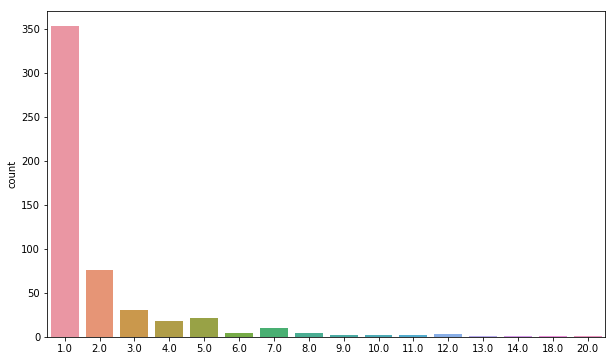

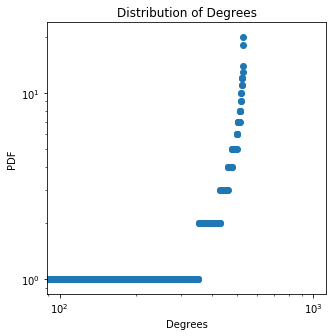

The clustering coefficient is 0.0049504950495049506
Node with highest degree is: 8 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 4.973570665717338
279
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6872112357462629
number of closed triangles is 1
number of open triangles is 193
average distance is 0.6790706025947912


<Figure size 432x288 with 0 Axes>

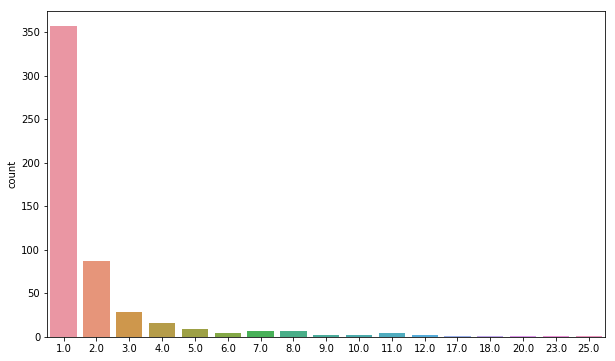

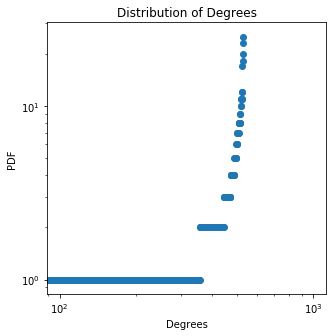

The clustering coefficient is 0.0051813471502590676
Node with highest degree is: 7 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.690551797792808
278
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7178485740772887
number of closed triangles is 1
number of open triangles is 210
average distance is 0.6706900955230979


<Figure size 432x288 with 0 Axes>

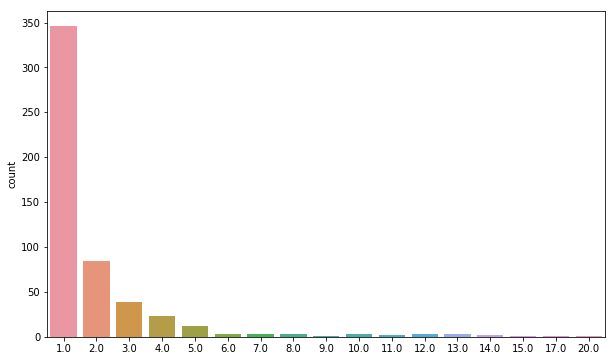

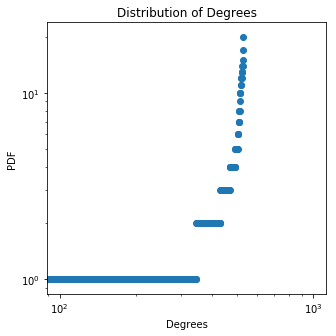

The clustering coefficient is 0.004761904761904762
Node with highest degree is: 2 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.449042363830546
277
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6683044075663005
number of closed triangles is 1
number of open triangles is 139
average distance is 0.652596250645507


<Figure size 432x288 with 0 Axes>

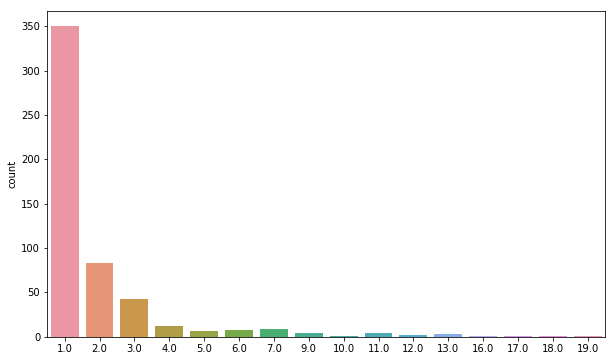

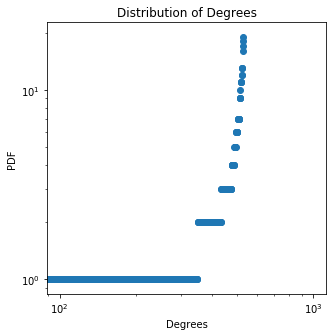

The clustering coefficient is 0.007194244604316547
Node with highest degree is: 0 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.60375934496262
276
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6504426262621534
number of closed triangles is 1
number of open triangles is 220
average distance is 0.6615025470874979


<Figure size 432x288 with 0 Axes>

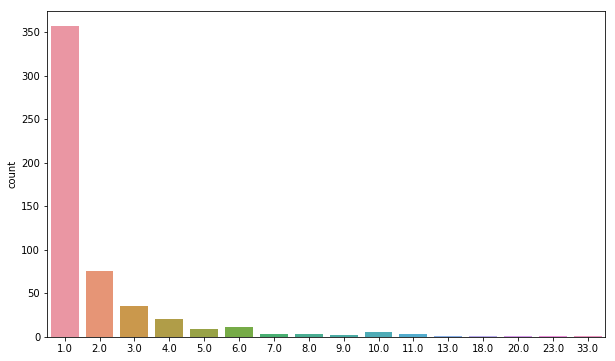

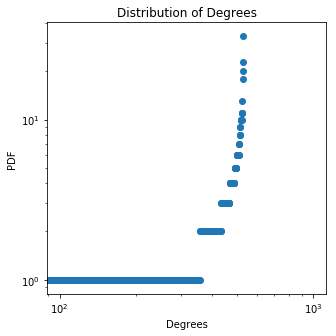

The clustering coefficient is 0.004545454545454545
Node with highest degree is: 0 with a degree of: 33.0 , the mean is 2.0037735849056606 , the variance is 6.943381986472053
275
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7101819463218689
number of closed triangles is 1
number of open triangles is 245
average distance is 0.6552986236643025


<Figure size 432x288 with 0 Axes>

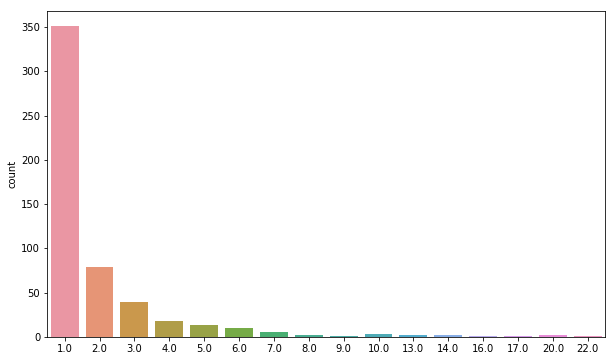

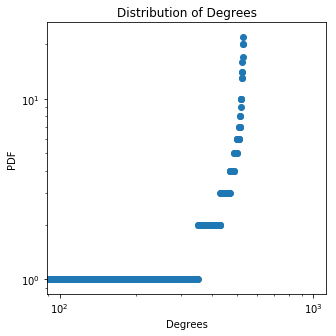

The clustering coefficient is 0.004081632653061225
Node with highest degree is: 19 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.992438590245639
274
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7259852504121381
number of closed triangles is 1
number of open triangles is 176
average distance is 0.6862877552191065


<Figure size 432x288 with 0 Axes>

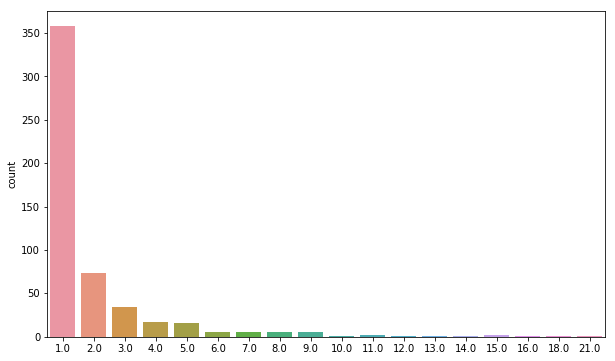

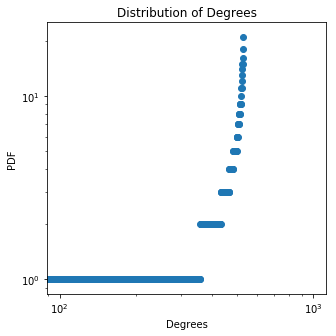

The clustering coefficient is 0.005681818181818182
Node with highest degree is: 9 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.615080099679603
273
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6146170966434231
number of closed triangles is 1
number of open triangles is 246
average distance is 0.669854428213825


<Figure size 432x288 with 0 Axes>

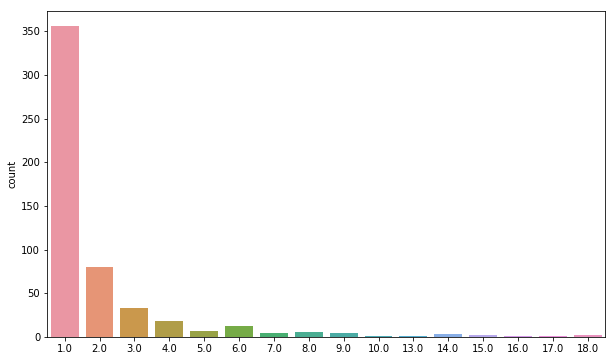

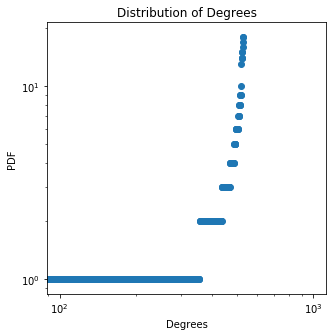

The clustering coefficient is 0.0040650406504065045
Node with highest degree is: 0 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.811306514773941
272
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6614661924200135
number of closed triangles is 1
number of open triangles is 175
average distance is 0.6801397874264169


<Figure size 432x288 with 0 Axes>

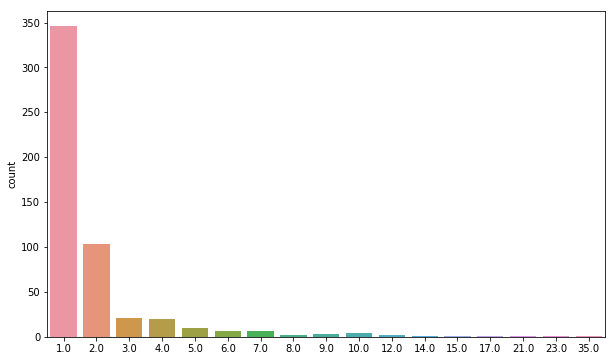

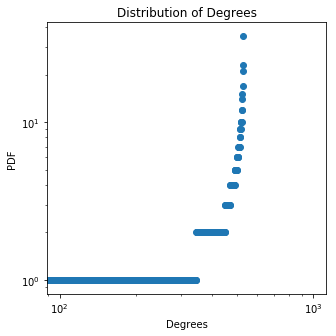

The clustering coefficient is 0.005714285714285714
Node with highest degree is: 23 with a degree of: 35.0 , the mean is 2.0037735849056606 , the variance is 7.3811178355286575
271
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6305664235189802
number of closed triangles is 1
number of open triangles is 192
average distance is 0.6804189237969593


<Figure size 432x288 with 0 Axes>

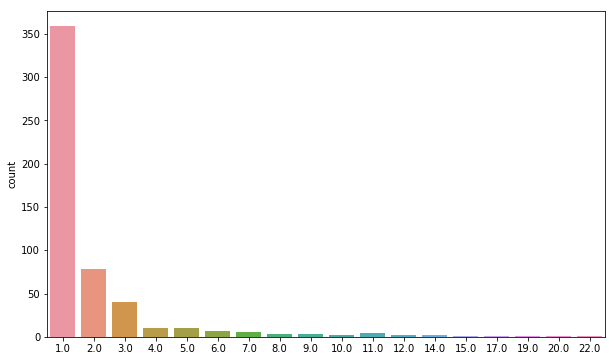

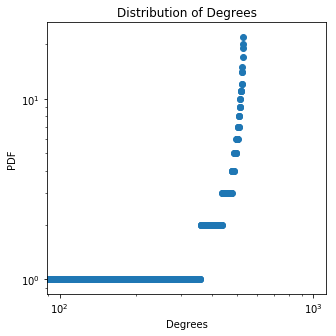

The clustering coefficient is 0.005208333333333333
Node with highest degree is: 3 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 6.354702741189034
270
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6045398263943668
number of closed triangles is 1
number of open triangles is 181
average distance is 0.6360956801416512


<Figure size 432x288 with 0 Axes>

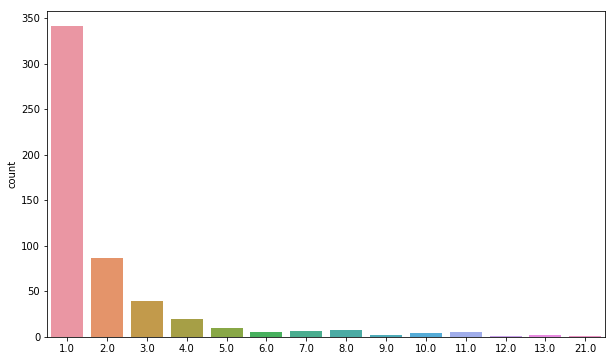

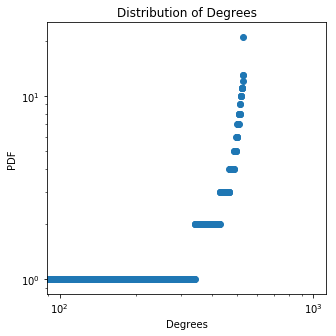

The clustering coefficient is 0.0055248618784530384
Node with highest degree is: 5 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 4.705646137415451
269
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7143261950304656
number of closed triangles is 1
number of open triangles is 186
average distance is 0.6881084045993361


<Figure size 432x288 with 0 Axes>

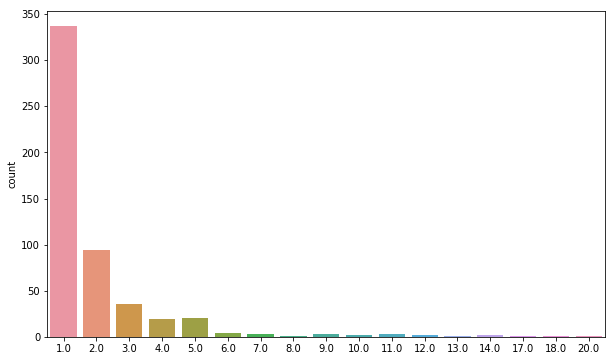

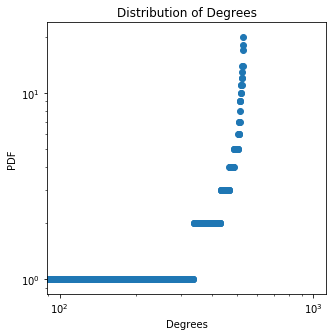

The clustering coefficient is 0.005376344086021506
Node with highest degree is: 24 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.162249911000357
268
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7247563722951026
number of closed triangles is 1
number of open triangles is 161
average distance is 0.6801965582756486


<Figure size 432x288 with 0 Axes>

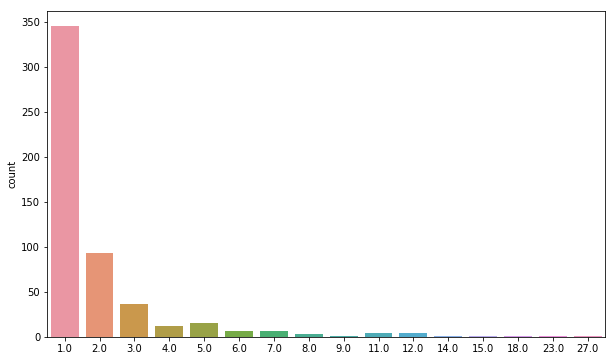

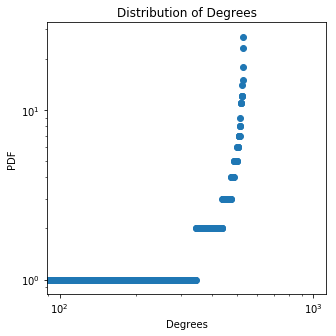

The clustering coefficient is 0.006211180124223602
Node with highest degree is: 17 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 6.275457458170168
267
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6555384779264171
number of closed triangles is 1
number of open triangles is 179
average distance is 0.6608029067944654


<Figure size 432x288 with 0 Axes>

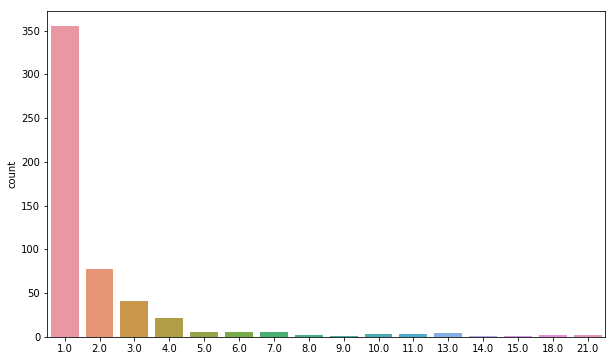

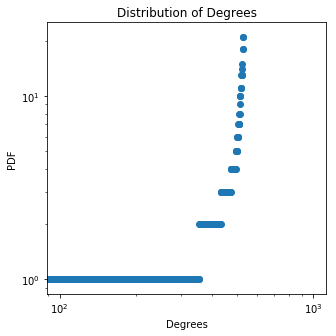

The clustering coefficient is 0.00558659217877095
Node with highest degree is: 6 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 6.283004627981489
266
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7500621565992848
number of closed triangles is 1
number of open triangles is 144
average distance is 0.6752838757832564


<Figure size 432x288 with 0 Axes>

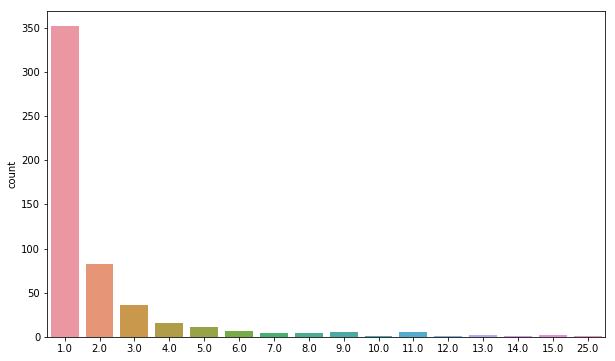

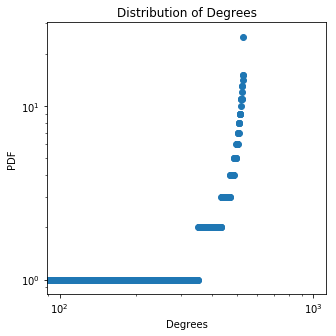

The clustering coefficient is 0.006944444444444444
Node with highest degree is: 13 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.611306514773941
265
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6611325993410466
number of closed triangles is 1
number of open triangles is 207
average distance is 0.662281982141245


<Figure size 432x288 with 0 Axes>

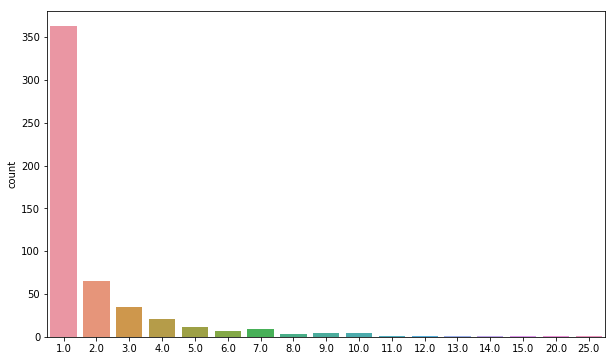

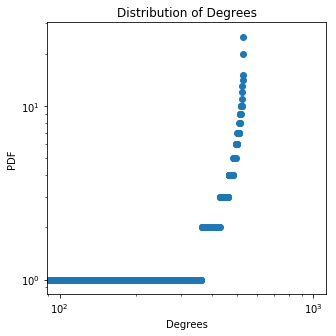

The clustering coefficient is 0.004830917874396135
Node with highest degree is: 4 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.679231043075826
264
number of closed triangles is 1
number of open triangles is 0
average distance is 0.610653347306497
number of closed triangles is 1
number of open triangles is 175
average distance is 0.6632934604297447


<Figure size 432x288 with 0 Axes>

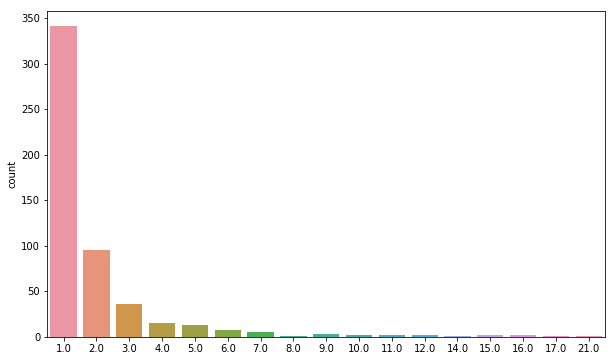

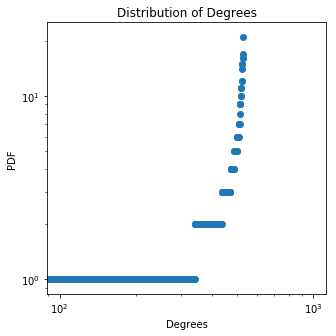

The clustering coefficient is 0.005714285714285714
Node with highest degree is: 2 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.547155571377715
263
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5960988257023035
number of closed triangles is 1
number of open triangles is 204
average distance is 0.6725562999102329


<Figure size 432x288 with 0 Axes>

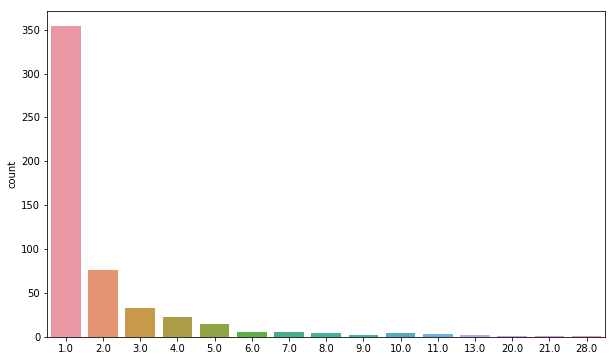

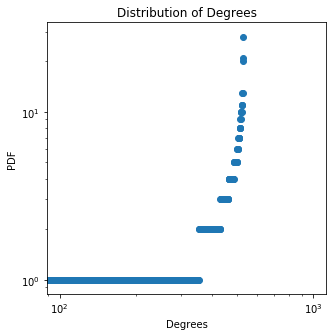

The clustering coefficient is 0.004901960784313725
Node with highest degree is: 16 with a degree of: 28.0 , the mean is 2.0037735849056606 , the variance is 6.015080099679602
262
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6835816401278801
number of closed triangles is 1
number of open triangles is 240
average distance is 0.6869617422655748


<Figure size 432x288 with 0 Axes>

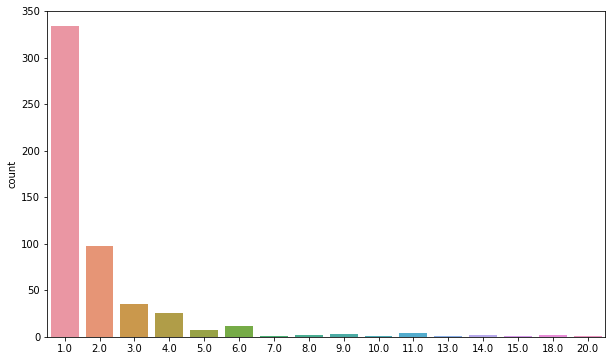

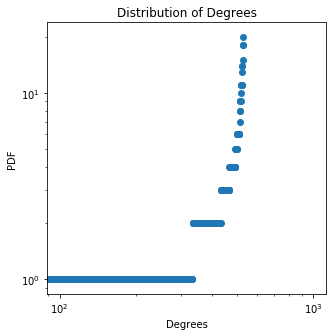

The clustering coefficient is 0.004166666666666667
Node with highest degree is: 18 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.233948024207904
261
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6751596142499321
number of closed triangles is 1
number of open triangles is 223
average distance is 0.6319417626949734


<Figure size 432x288 with 0 Axes>

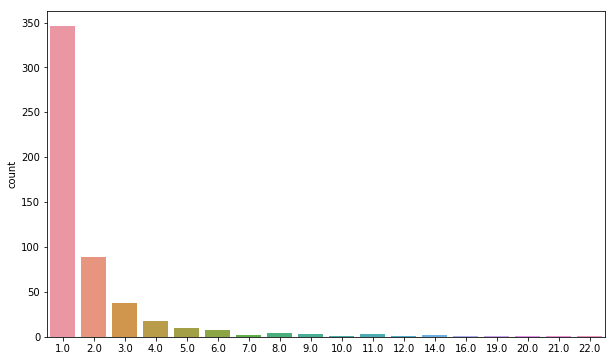

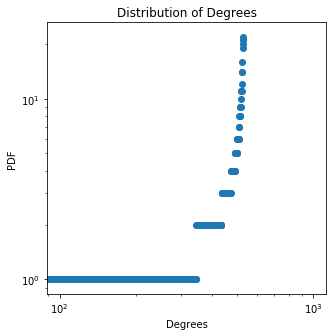

The clustering coefficient is 0.004484304932735426
Node with highest degree is: 5 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 6.188665005339979
260
number of closed triangles is 1
number of open triangles is 0
average distance is 0.631683655854292
number of closed triangles is 1
number of open triangles is 196
average distance is 0.6697401991483305


<Figure size 432x288 with 0 Axes>

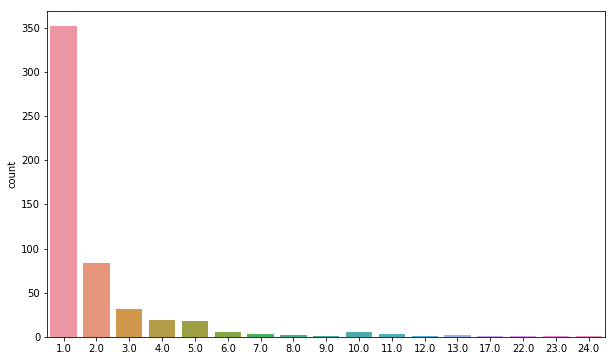

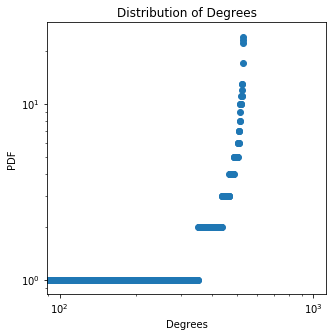

The clustering coefficient is 0.00510204081632653
Node with highest degree is: 5 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.324514061943751
259
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6924890786962903
number of closed triangles is 1
number of open triangles is 177
average distance is 0.651721277687569


<Figure size 432x288 with 0 Axes>

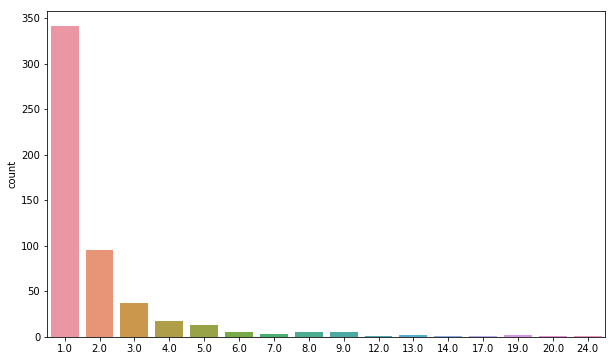

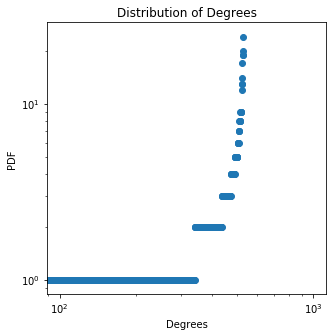

The clustering coefficient is 0.005649717514124294
Node with highest degree is: 11 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.113193307226772
258
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7029800753966758
number of closed triangles is 1
number of open triangles is 171
average distance is 0.6733470654680808


<Figure size 432x288 with 0 Axes>

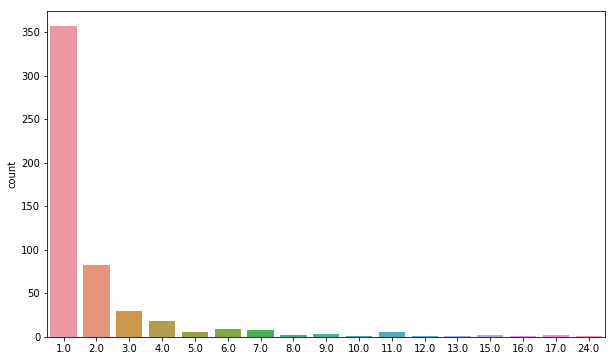

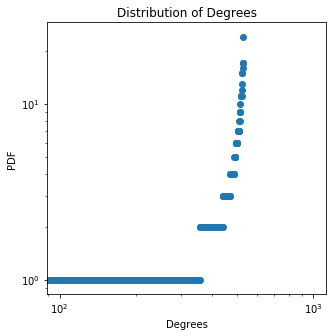

The clustering coefficient is 0.005847953216374269
Node with highest degree is: 8 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.10187255250979
257
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6058437152689958
number of closed triangles is 1
number of open triangles is 190
average distance is 0.6597830841050828


<Figure size 432x288 with 0 Axes>

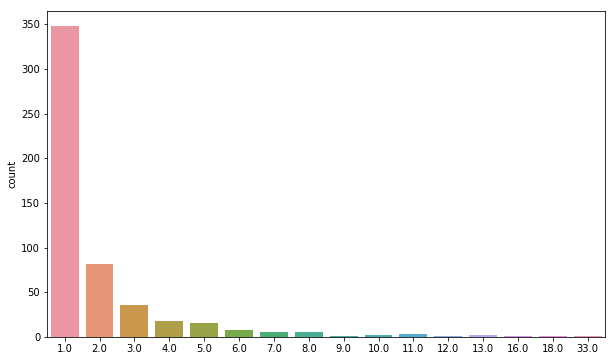

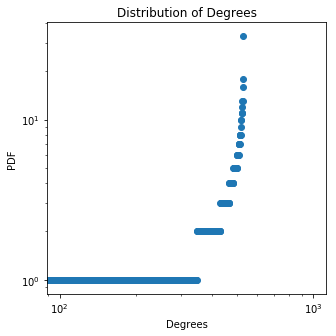

The clustering coefficient is 0.005263157894736842
Node with highest degree is: 16 with a degree of: 33.0 , the mean is 2.0037735849056606 , the variance is 6.052815948736204
256
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6893839115997175
number of closed triangles is 1
number of open triangles is 161
average distance is 0.6553785083812006


<Figure size 432x288 with 0 Axes>

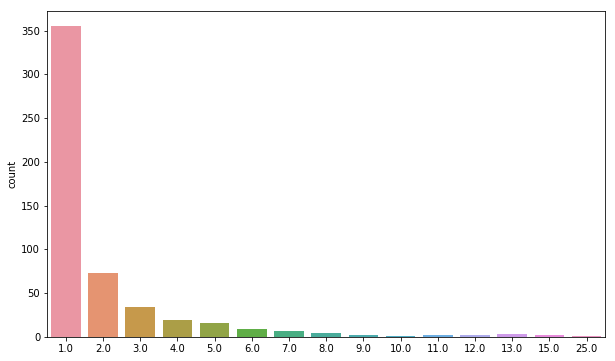

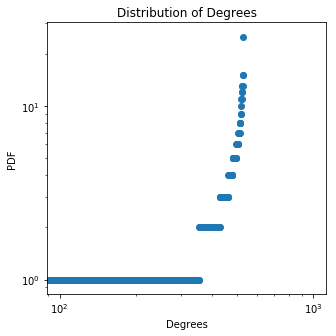

The clustering coefficient is 0.006211180124223602
Node with highest degree is: 14 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.332061231755072
255
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6028135700845749
number of closed triangles is 1
number of open triangles is 257
average distance is 0.6652212365008074


<Figure size 432x288 with 0 Axes>

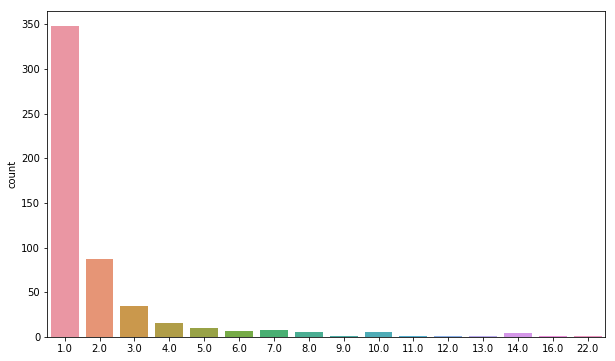

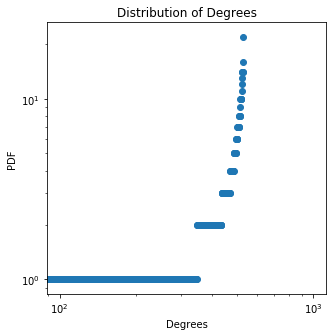

The clustering coefficient is 0.0038910505836575876
Node with highest degree is: 19 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.38866500533998
254
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6604505639650073
number of closed triangles is 1
number of open triangles is 188
average distance is 0.6514752935174386


<Figure size 432x288 with 0 Axes>

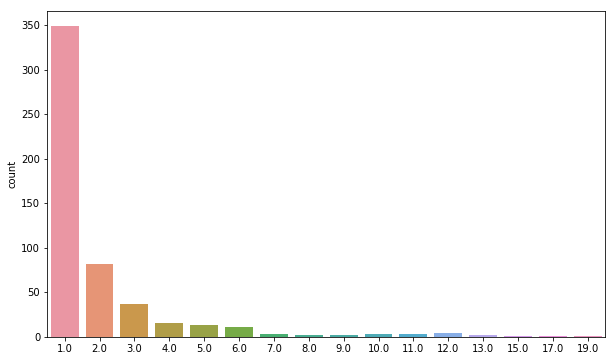

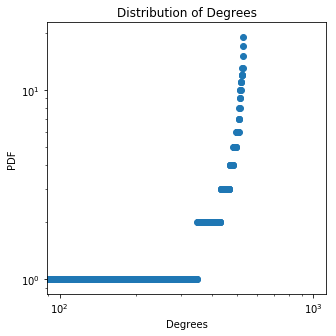

The clustering coefficient is 0.005319148936170213
Node with highest degree is: 29 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.184891420434319
253
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7022517011344439
number of closed triangles is 1
number of open triangles is 251
average distance is 0.6769032242300753


<Figure size 432x288 with 0 Axes>

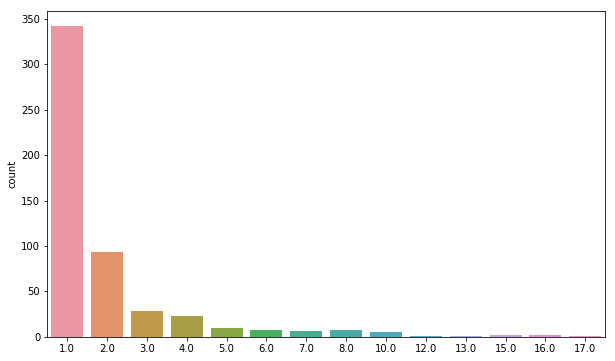

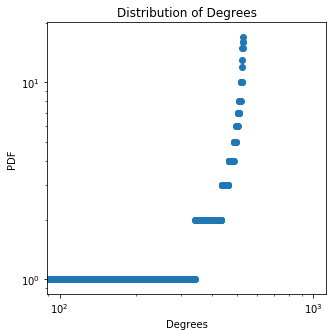

The clustering coefficient is 0.00398406374501992
Node with highest degree is: 14 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 4.932061231755074
252
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5894191879809243
number of closed triangles is 1
number of open triangles is 178
average distance is 0.6387257689523018


<Figure size 432x288 with 0 Axes>

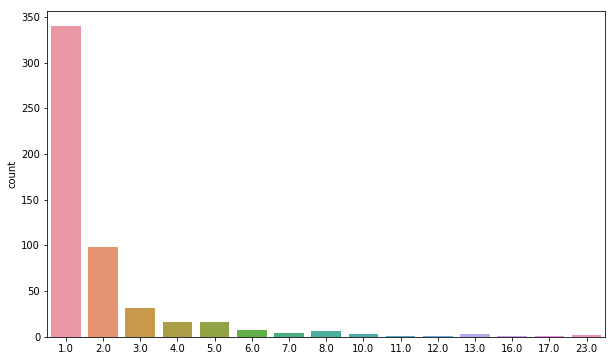

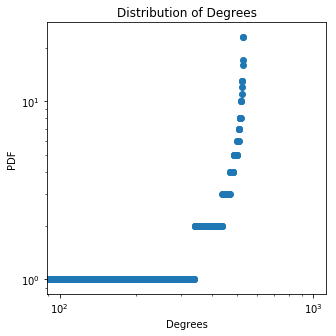

The clustering coefficient is 0.0056179775280898875
Node with highest degree is: 7 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.747155571377715
251
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7108956662236182
number of closed triangles is 1
number of open triangles is 236
average distance is 0.6596488752610052


<Figure size 432x288 with 0 Axes>

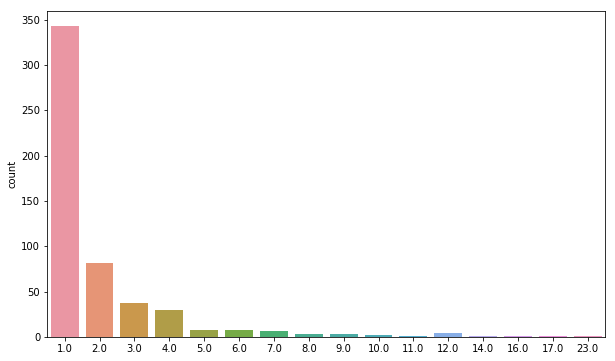

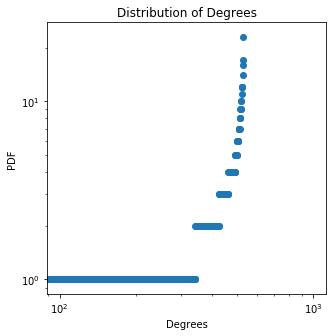

The clustering coefficient is 0.00423728813559322
Node with highest degree is: 21 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.101872552509791
250
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7249949452797532
number of closed triangles is 1
number of open triangles is 218
average distance is 0.6439513977287161


<Figure size 432x288 with 0 Axes>

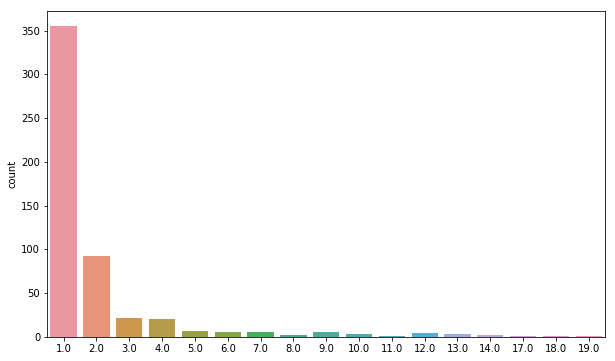

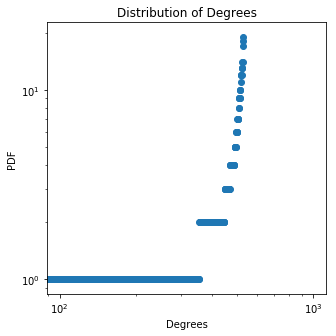

The clustering coefficient is 0.0045871559633027525
Node with highest degree is: 25 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.947155571377715
249
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6652373291925914
number of closed triangles is 1
number of open triangles is 183
average distance is 0.662969015565978


<Figure size 432x288 with 0 Axes>

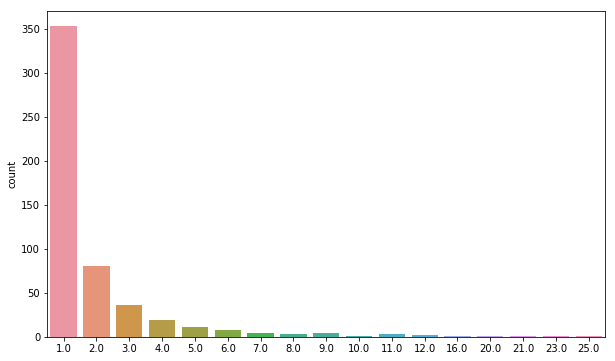

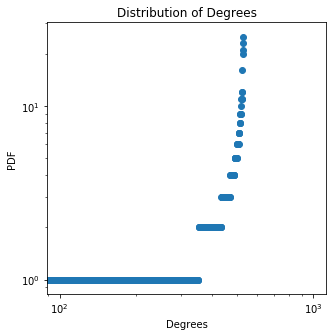

The clustering coefficient is 0.00546448087431694
Node with highest degree is: 16 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.51696689213243
248
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6615949484768964
number of closed triangles is 1
number of open triangles is 225
average distance is 0.6806449038068767


<Figure size 432x288 with 0 Axes>

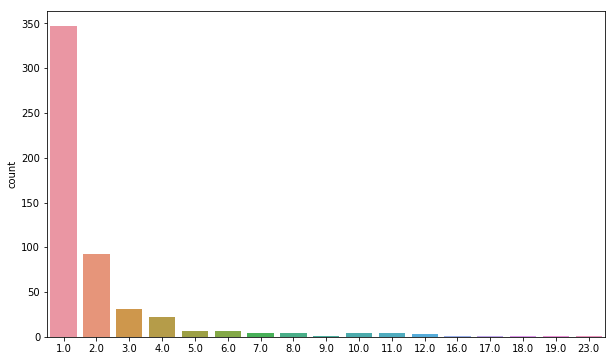

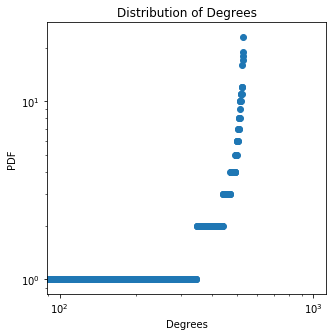

The clustering coefficient is 0.0044444444444444444
Node with highest degree is: 21 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 6.030174439302242
247
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6266090348591398
number of closed triangles is 1
number of open triangles is 244
average distance is 0.6481511543658669


<Figure size 432x288 with 0 Axes>

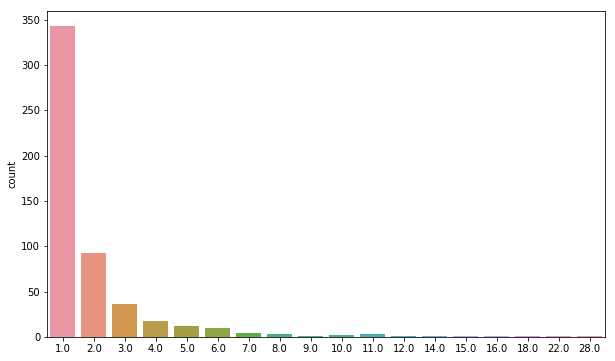

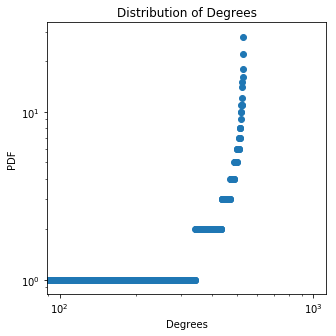

The clustering coefficient is 0.004098360655737705
Node with highest degree is: 28 with a degree of: 28.0 , the mean is 2.0037735849056606 , the variance is 6.196212175151298
246
number of closed triangles is 1
number of open triangles is 0
average distance is 0.584385888572615
number of closed triangles is 1
number of open triangles is 223
average distance is 0.6625706606976693


<Figure size 432x288 with 0 Axes>

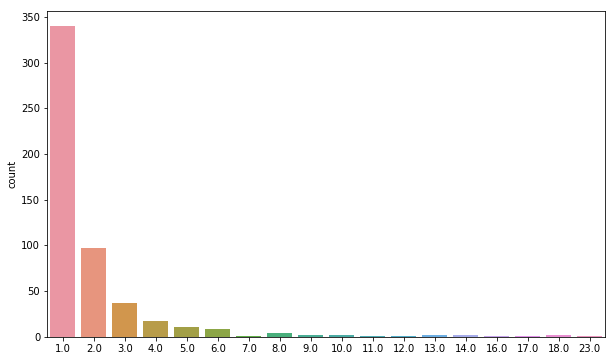

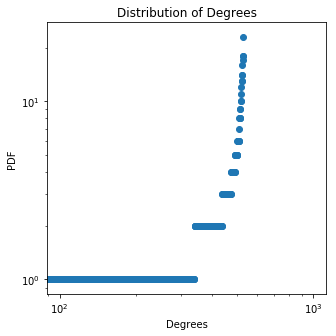

The clustering coefficient is 0.004484304932735426
Node with highest degree is: 20 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.947155571377715
245
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6438518217249828
number of closed triangles is 1
number of open triangles is 242
average distance is 0.6409279216636007


<Figure size 432x288 with 0 Axes>

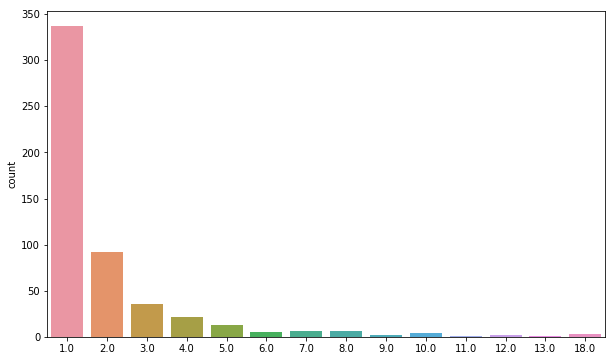

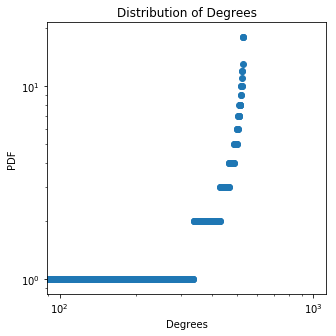

The clustering coefficient is 0.004132231404958678
Node with highest degree is: 14 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 4.80753292986828
244
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7265780159503054
number of closed triangles is 1
number of open triangles is 209
average distance is 0.669427450116138


<Figure size 432x288 with 0 Axes>

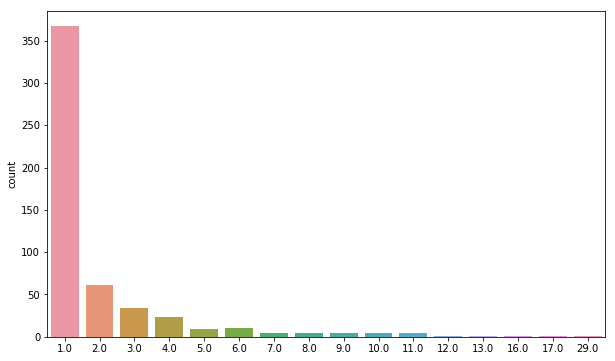

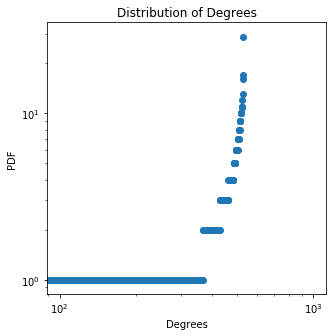

The clustering coefficient is 0.004784688995215311
Node with highest degree is: 27 with a degree of: 29.0 , the mean is 2.0037735849056606 , the variance is 5.943381986472053
243
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6374123846008228
number of closed triangles is 1
number of open triangles is 168
average distance is 0.674709468074913


<Figure size 432x288 with 0 Axes>

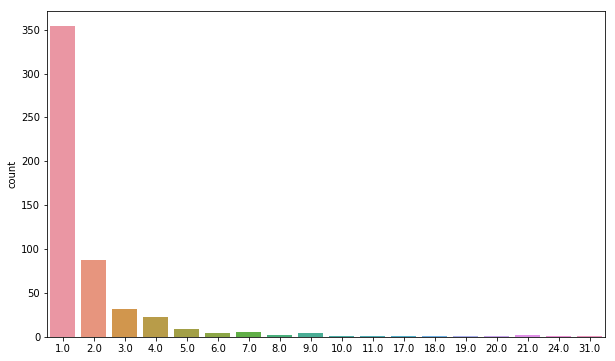

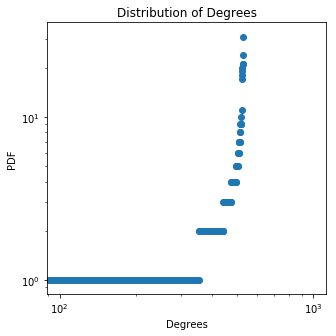

The clustering coefficient is 0.005952380952380952
Node with highest degree is: 16 with a degree of: 31.0 , the mean is 2.0037735849056606 , the variance is 8.109419722321112
242
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6578856017535682
number of closed triangles is 1
number of open triangles is 221
average distance is 0.6867026448874121


<Figure size 432x288 with 0 Axes>

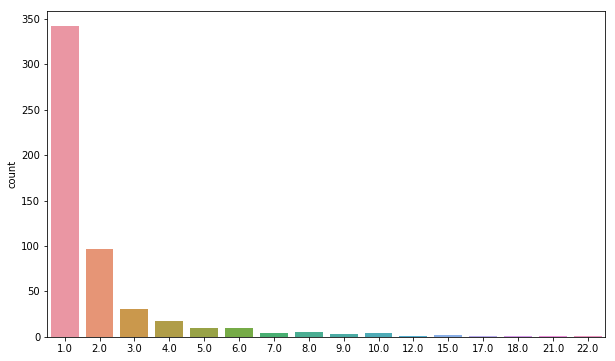

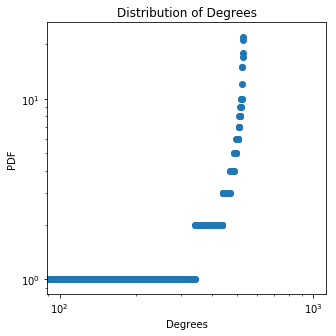

The clustering coefficient is 0.004524886877828055
Node with highest degree is: 11 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.762249911000357
241
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6292904077467857
number of closed triangles is 1
number of open triangles is 176
average distance is 0.6542378274976959


<Figure size 432x288 with 0 Axes>

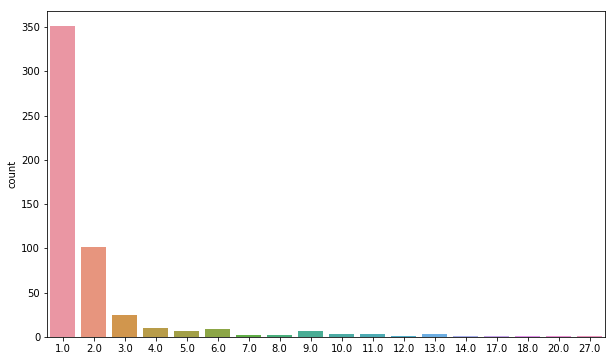

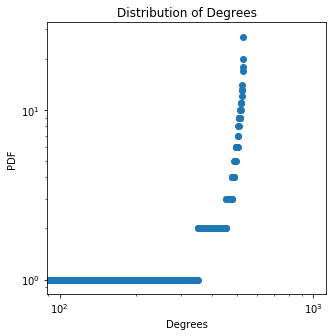

The clustering coefficient is 0.005681818181818182
Node with highest degree is: 38 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 6.716966892132432
240
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7675219337527813
number of closed triangles is 1
number of open triangles is 200
average distance is 0.6651225189780635


<Figure size 432x288 with 0 Axes>

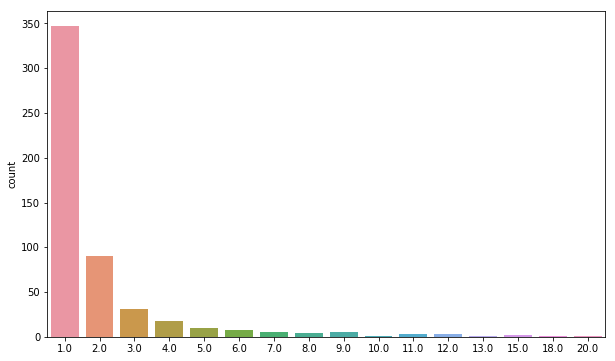

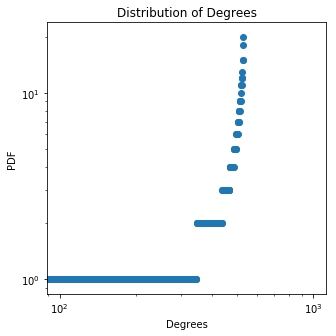

The clustering coefficient is 0.005
Node with highest degree is: 27 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.335834816660734
239
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6799568796331265
number of closed triangles is 1
number of open triangles is 234
average distance is 0.6313295007888612


<Figure size 432x288 with 0 Axes>

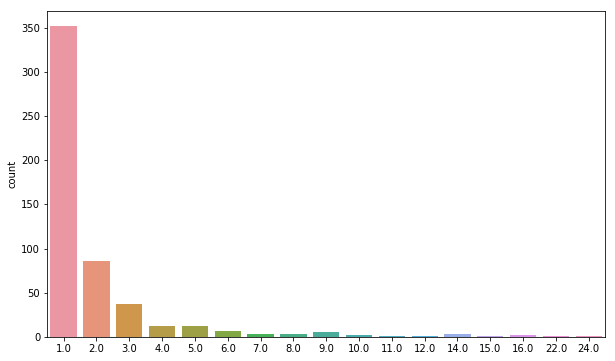

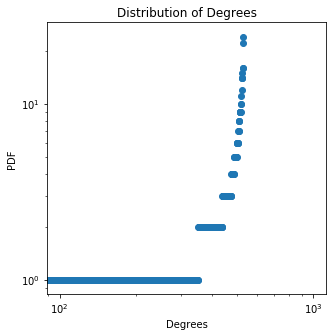

The clustering coefficient is 0.004273504273504274
Node with highest degree is: 6 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.264136703453186
238
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7122123095989971
number of closed triangles is 1
number of open triangles is 171
average distance is 0.6726920455567568


<Figure size 432x288 with 0 Axes>

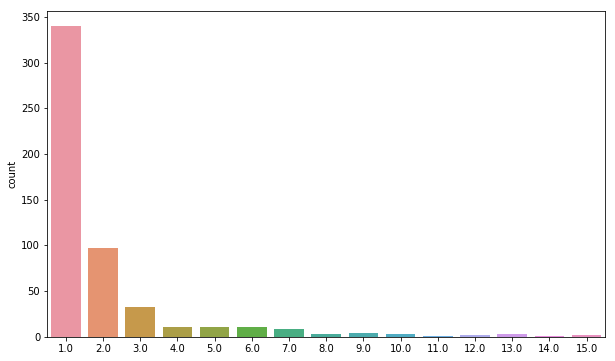

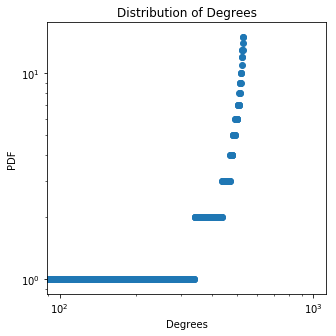

The clustering coefficient is 0.005847953216374269
Node with highest degree is: 3 with a degree of: 15.0 , the mean is 2.0037735849056606 , the variance is 4.743381986472055
237
number of closed triangles is 1
number of open triangles is 0
average distance is 0.697029319290804
number of closed triangles is 1
number of open triangles is 250
average distance is 0.6705250470055061


<Figure size 432x288 with 0 Axes>

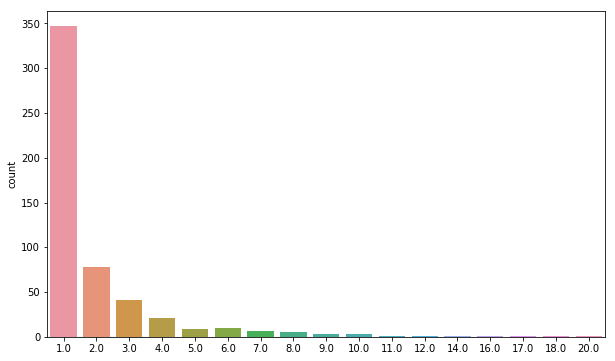

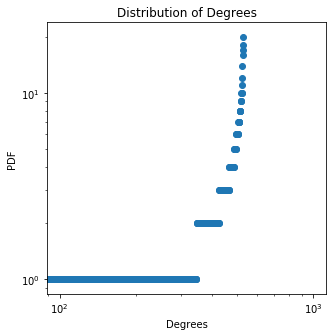

The clustering coefficient is 0.004
Node with highest degree is: 1 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.109419722321112
236
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6429697851183621
number of closed triangles is 1
number of open triangles is 190
average distance is 0.6605952505574252


<Figure size 432x288 with 0 Axes>

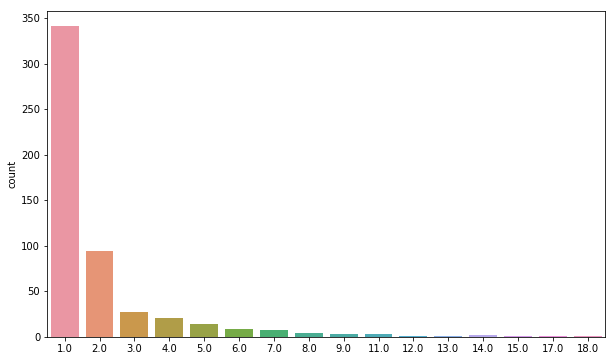

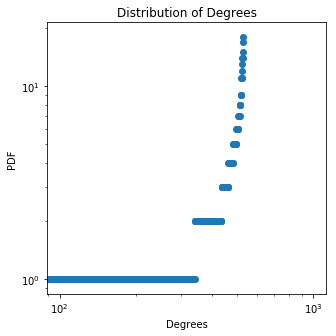

The clustering coefficient is 0.005263157894736842
Node with highest degree is: 10 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 4.886778212887148
235
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6676091526067727
number of closed triangles is 1
number of open triangles is 209
average distance is 0.6674616751806618


<Figure size 432x288 with 0 Axes>

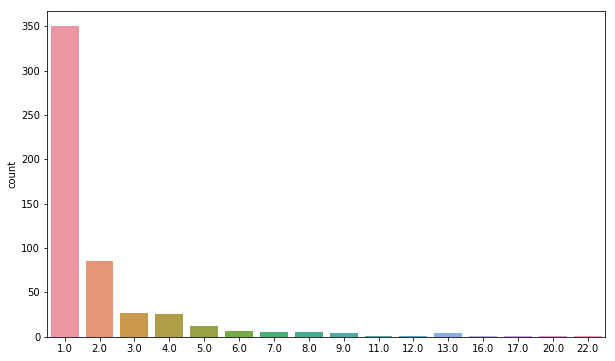

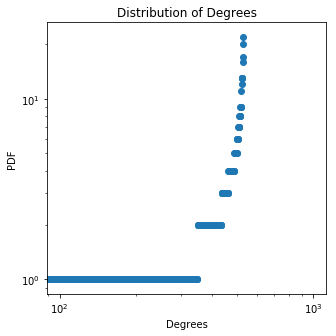

The clustering coefficient is 0.004784688995215311
Node with highest degree is: 28 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.652815948736205
234
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6508799356382622
number of closed triangles is 1
number of open triangles is 209
average distance is 0.6404551827072958


<Figure size 432x288 with 0 Axes>

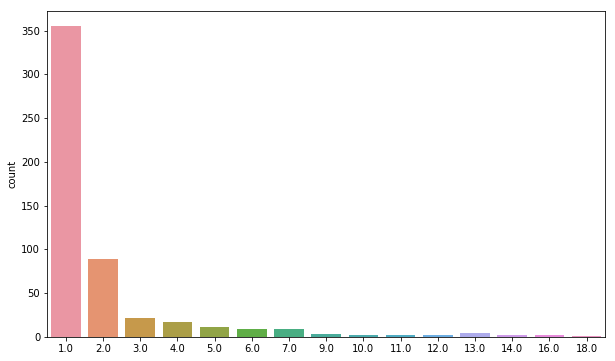

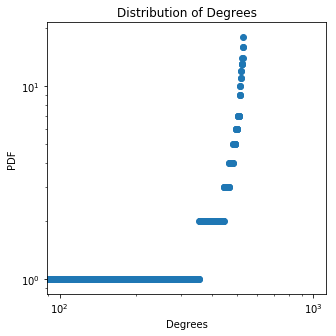

The clustering coefficient is 0.004784688995215311
Node with highest degree is: 29 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.6037593449626195
233
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5978791525786803
number of closed triangles is 1
number of open triangles is 153
average distance is 0.6308820406154911


<Figure size 432x288 with 0 Axes>

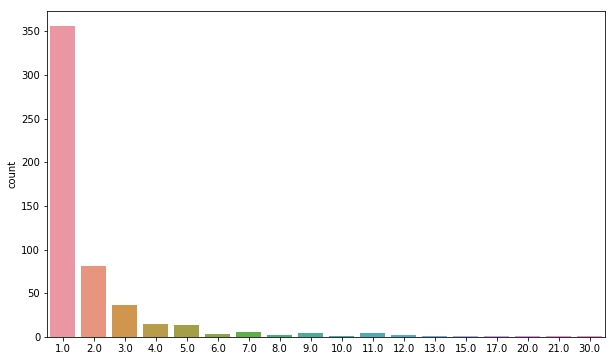

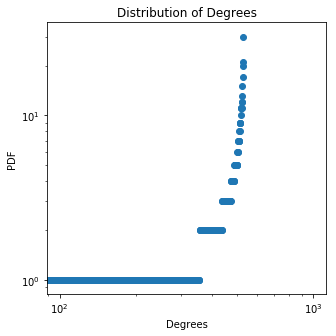

The clustering coefficient is 0.006535947712418301
Node with highest degree is: 21 with a degree of: 30.0 , the mean is 2.0037735849056606 , the variance is 6.822627269490922
232
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6179300568952332
number of closed triangles is 1
number of open triangles is 220
average distance is 0.6484582470744359


<Figure size 432x288 with 0 Axes>

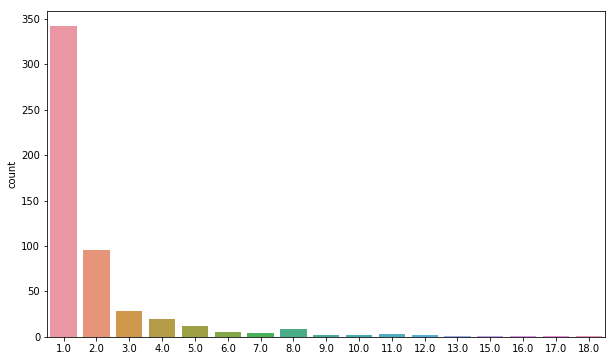

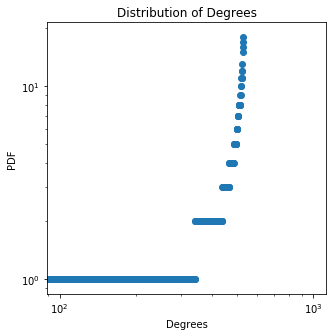

The clustering coefficient is 0.004545454545454545
Node with highest degree is: 56 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.090551797792809
231
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6962510439781736
number of closed triangles is 1
number of open triangles is 169
average distance is 0.6758884901254931


<Figure size 432x288 with 0 Axes>

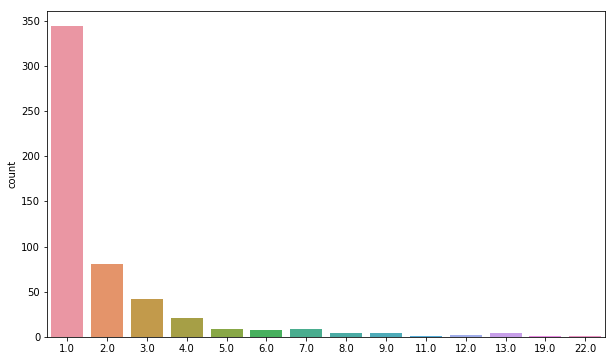

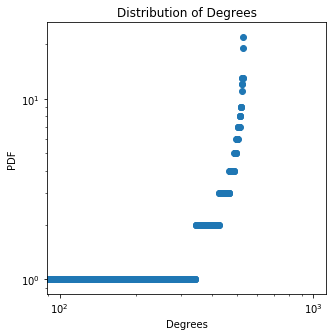

The clustering coefficient is 0.005917159763313609
Node with highest degree is: 16 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.060363118547525
230
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6867752738261369
number of closed triangles is 1
number of open triangles is 225
average distance is 0.6522859827264279


<Figure size 432x288 with 0 Axes>

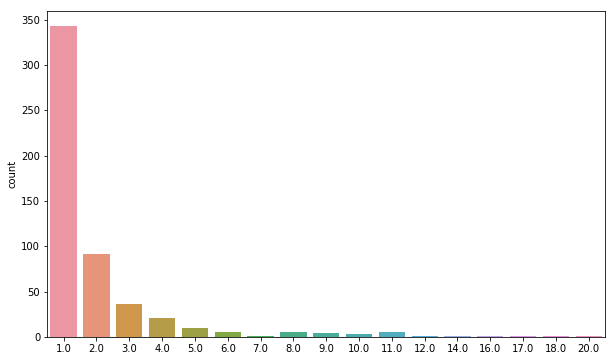

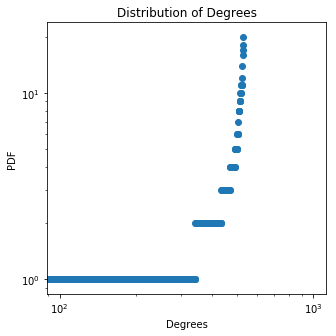

The clustering coefficient is 0.0044444444444444444
Node with highest degree is: 14 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.426400854396582
229
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6341718558577741
number of closed triangles is 1
number of open triangles is 178
average distance is 0.6780477735482725


<Figure size 432x288 with 0 Axes>

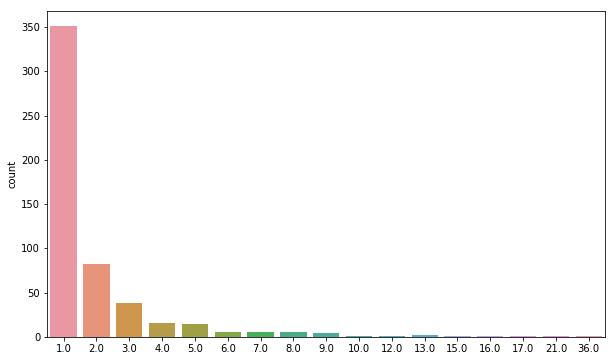

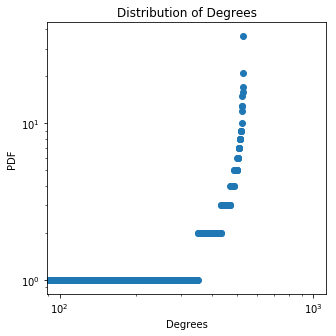

The clustering coefficient is 0.0056179775280898875
Node with highest degree is: 8 with a degree of: 36.0 , the mean is 2.0037735849056606 , the variance is 6.947155571377714
228
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7615581888624924
number of closed triangles is 1
number of open triangles is 182
average distance is 0.6745266268136353


<Figure size 432x288 with 0 Axes>

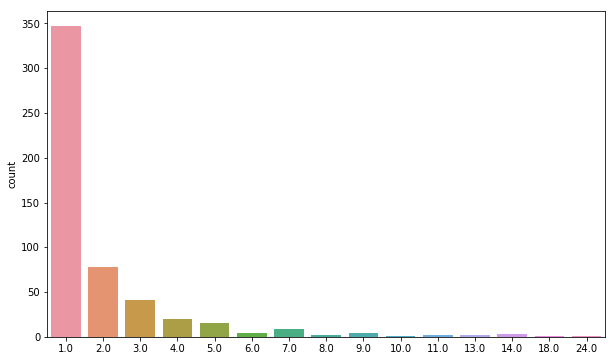

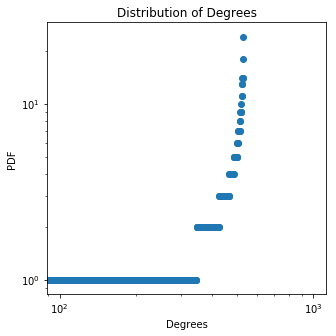

The clustering coefficient is 0.005494505494505495
Node with highest degree is: 17 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.283004627981489
227
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6497171957060481
number of closed triangles is 1
number of open triangles is 206
average distance is 0.6557580876413612


<Figure size 432x288 with 0 Axes>

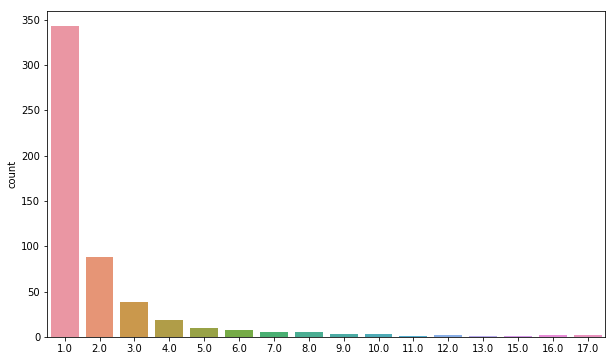

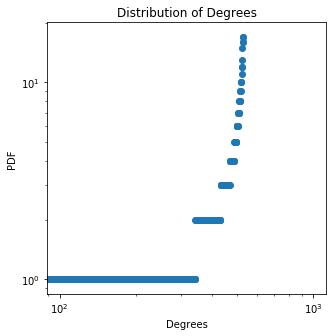

The clustering coefficient is 0.0048543689320388345
Node with highest degree is: 12 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 5.124514061943754
226
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7166457624750063
number of closed triangles is 1
number of open triangles is 197
average distance is 0.67959818725054


<Figure size 432x288 with 0 Axes>

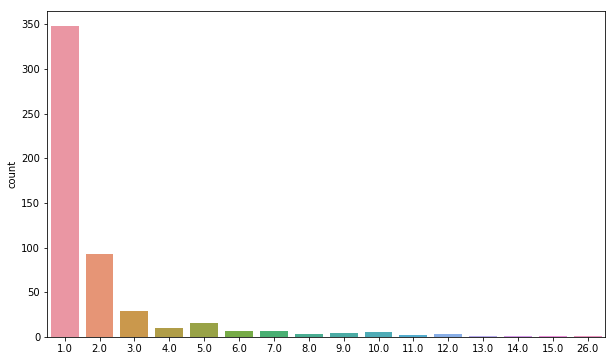

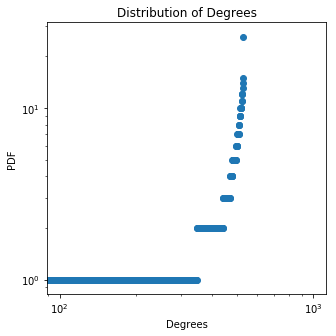

The clustering coefficient is 0.005076142131979695
Node with highest degree is: 12 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 5.524514061943753
225
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7189242156189636
number of closed triangles is 1
number of open triangles is 178
average distance is 0.6693164314803121


<Figure size 432x288 with 0 Axes>

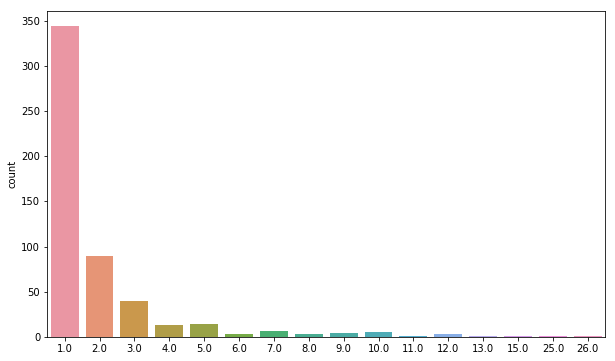

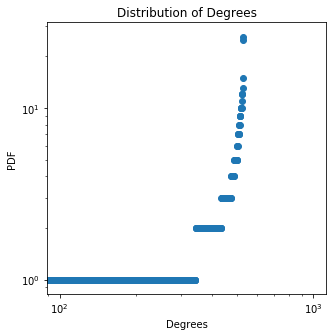

The clustering coefficient is 0.0056179775280898875
Node with highest degree is: 22 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 5.962249911000356
224
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6382324883553526
number of closed triangles is 1
number of open triangles is 212
average distance is 0.6479420865283049


<Figure size 432x288 with 0 Axes>

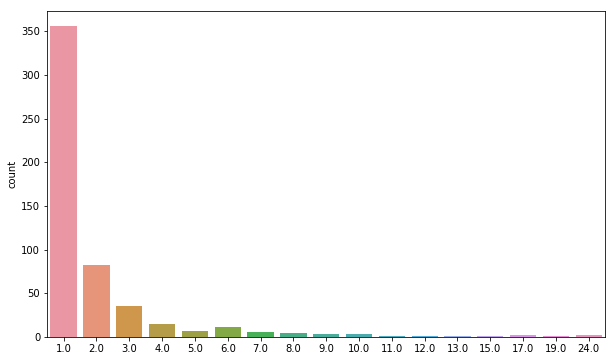

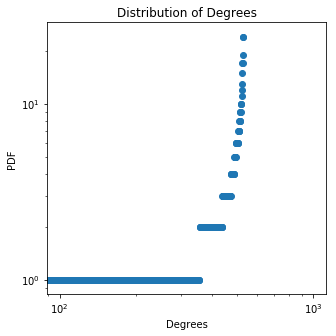

The clustering coefficient is 0.0047169811320754715
Node with highest degree is: 5 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.558476326094696
223
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6389756084072563
number of closed triangles is 1
number of open triangles is 170
average distance is 0.679697143407524


<Figure size 432x288 with 0 Axes>

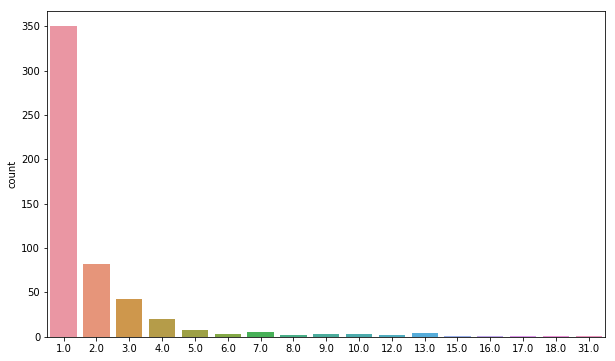

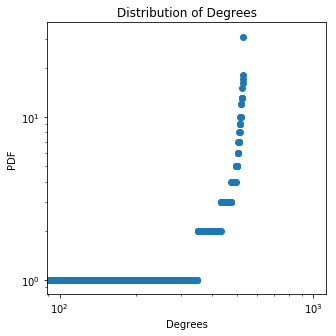

The clustering coefficient is 0.0058823529411764705
Node with highest degree is: 10 with a degree of: 31.0 , the mean is 2.0037735849056606 , the variance is 6.603759344962621
222
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6032133418014087
number of closed triangles is 1
number of open triangles is 178
average distance is 0.6664885153908595


<Figure size 432x288 with 0 Axes>

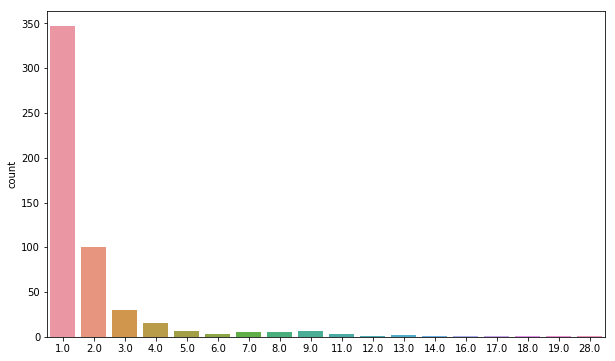

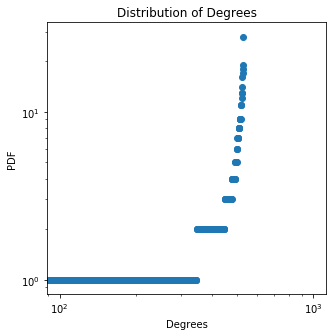

The clustering coefficient is 0.0056179775280898875
Node with highest degree is: 27 with a degree of: 28.0 , the mean is 2.0037735849056606 , the variance is 6.637721609113564
221
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6733630848264157
number of closed triangles is 1
number of open triangles is 217
average distance is 0.6716538687532753


<Figure size 432x288 with 0 Axes>

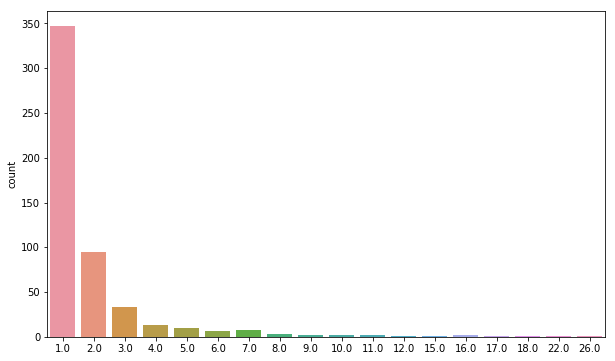

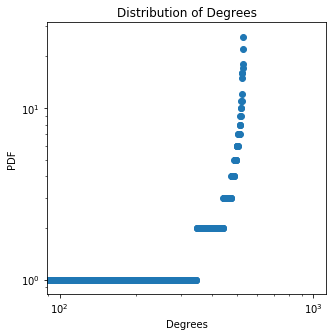

The clustering coefficient is 0.004608294930875576
Node with highest degree is: 53 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 6.505646137415452
220
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6322559944660566
number of closed triangles is 1
number of open triangles is 177
average distance is 0.6590364549239138


<Figure size 432x288 with 0 Axes>

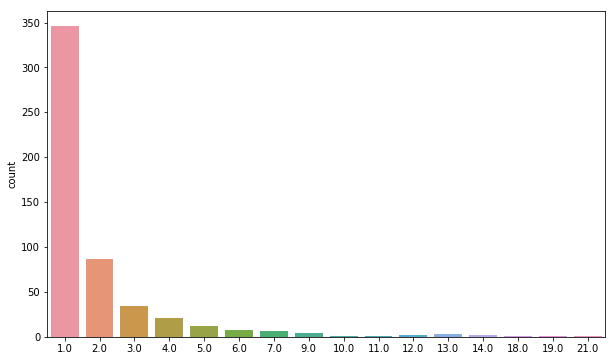

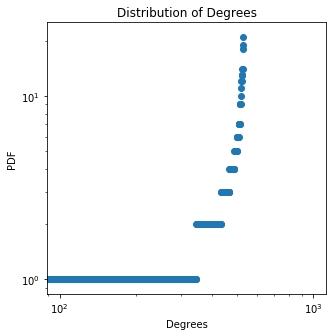

The clustering coefficient is 0.005649717514124294
Node with highest degree is: 11 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.5622499110003565
219
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5904532371899928
number of closed triangles is 1
number of open triangles is 213
average distance is 0.6528563014388107


<Figure size 432x288 with 0 Axes>

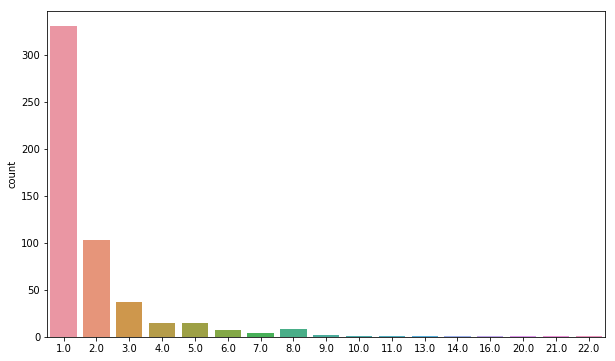

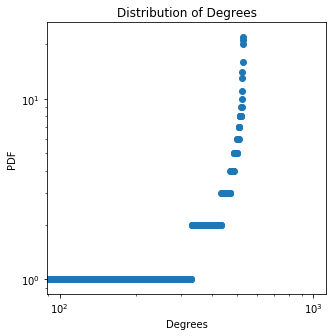

The clustering coefficient is 0.004694835680751174
Node with highest degree is: 29 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.3811178355286575
218
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6169094144418252
number of closed triangles is 1
number of open triangles is 231
average distance is 0.6433384175252751


<Figure size 432x288 with 0 Axes>

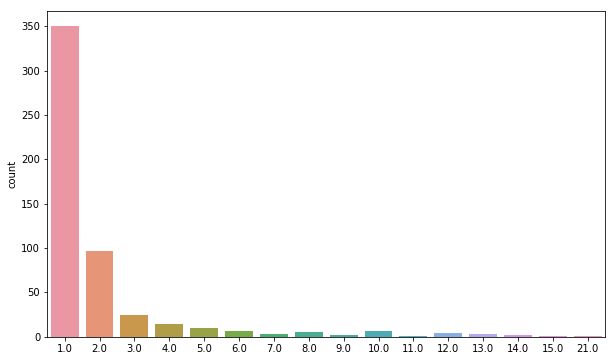

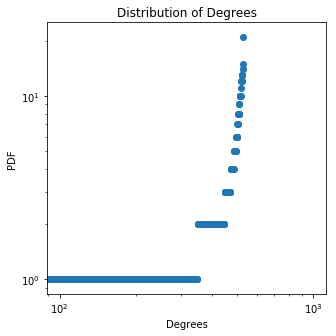

The clustering coefficient is 0.004329004329004329
Node with highest degree is: 9 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.69055179779281
217
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6786139450358741
number of closed triangles is 1
number of open triangles is 204
average distance is 0.6718794809996799


<Figure size 432x288 with 0 Axes>

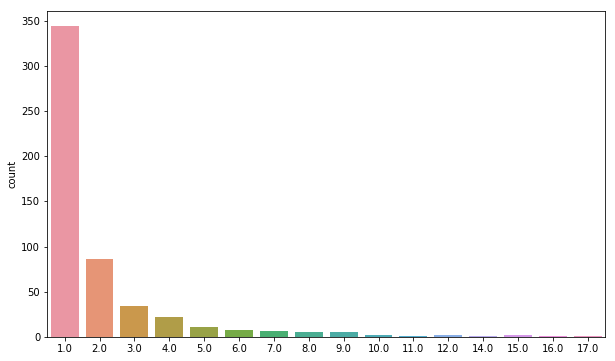

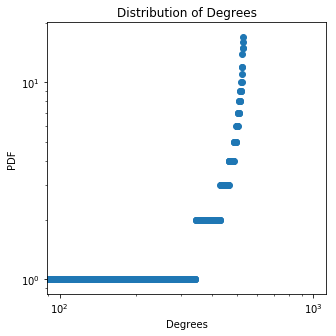

The clustering coefficient is 0.004901960784313725
Node with highest degree is: 1 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 4.837721609113563
216
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7690625356901003
number of closed triangles is 1
number of open triangles is 204
average distance is 0.6781750478488259


<Figure size 432x288 with 0 Axes>

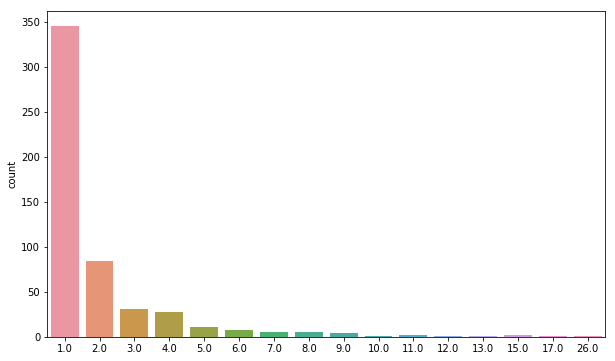

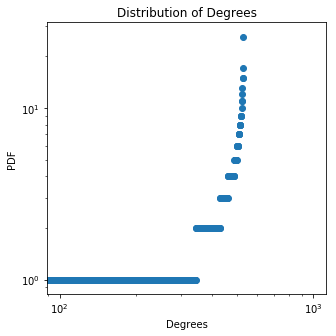

The clustering coefficient is 0.004901960784313725
Node with highest degree is: 2 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 5.286778212887149
215
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6442193761917747
number of closed triangles is 1
number of open triangles is 204
average distance is 0.6534937822196034


<Figure size 432x288 with 0 Axes>

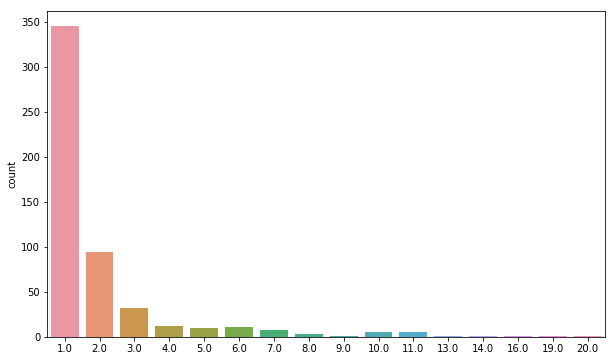

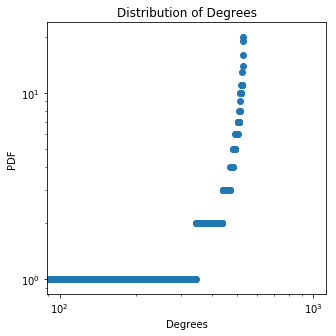

The clustering coefficient is 0.004901960784313725
Node with highest degree is: 29 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.324514061943753
214
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6458097946163015
number of closed triangles is 1
number of open triangles is 225
average distance is 0.6552004519024971


<Figure size 432x288 with 0 Axes>

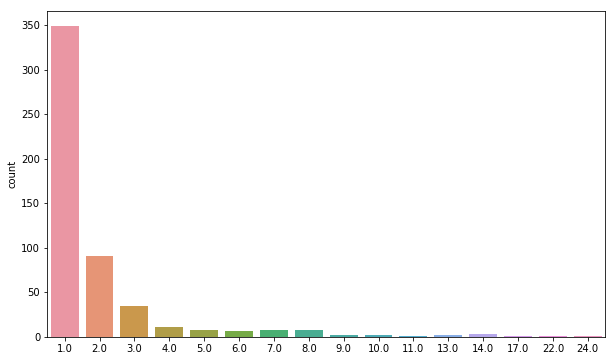

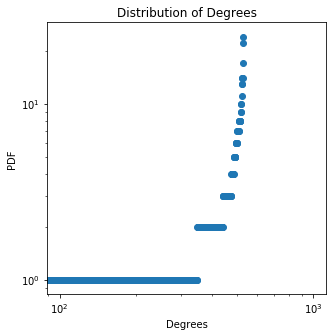

The clustering coefficient is 0.0044444444444444444
Node with highest degree is: 7 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.018853684585263
213
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6860872820694105
number of closed triangles is 1
number of open triangles is 157
average distance is 0.6706143369677622


<Figure size 432x288 with 0 Axes>

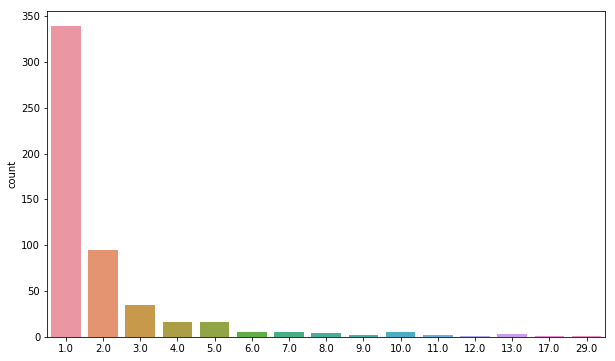

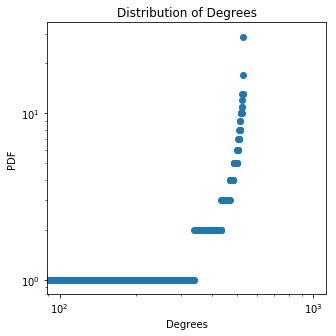

The clustering coefficient is 0.006369426751592357
Node with highest degree is: 29 with a degree of: 29.0 , the mean is 2.0037735849056606 , the variance is 5.524514061943752
212
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7578612971858166
number of closed triangles is 1
number of open triangles is 202
average distance is 0.6602419914741577


<Figure size 432x288 with 0 Axes>

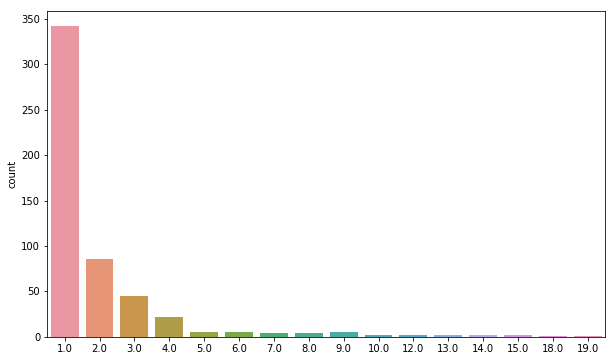

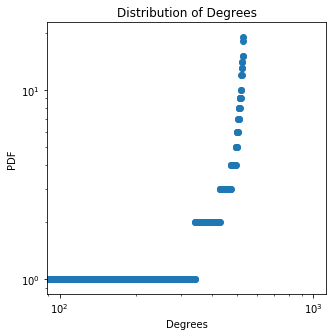

The clustering coefficient is 0.0049504950495049506
Node with highest degree is: 29 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.339608401566394
211
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6976174538865704
number of closed triangles is 1
number of open triangles is 178
average distance is 0.6629319362321785


<Figure size 432x288 with 0 Axes>

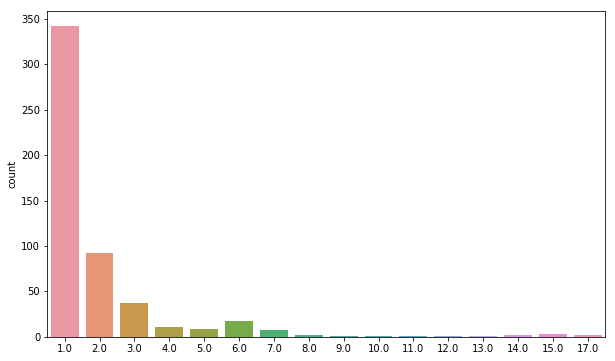

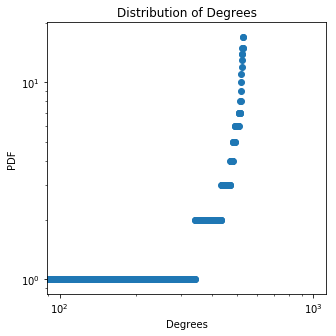

The clustering coefficient is 0.0056179775280898875
Node with highest degree is: 2 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 5.109419722321111
210
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6475466954021681
number of closed triangles is 1
number of open triangles is 220
average distance is 0.6377852918593385


<Figure size 432x288 with 0 Axes>

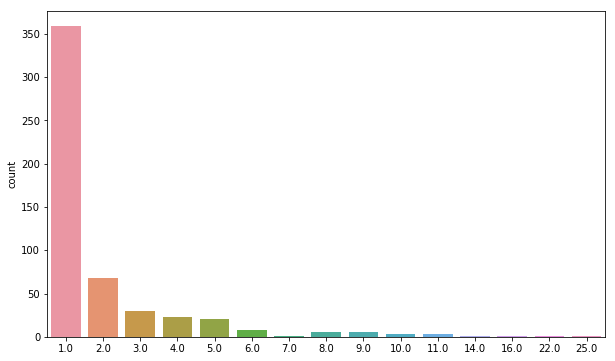

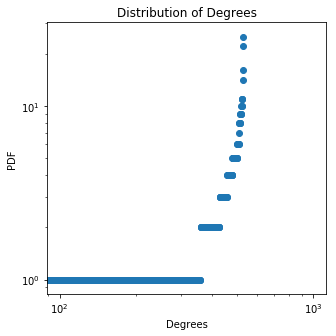

The clustering coefficient is 0.004545454545454545
Node with highest degree is: 27 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.569797080811676
209
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7015667309993868
number of closed triangles is 1
number of open triangles is 280
average distance is 0.6465273052950812


<Figure size 432x288 with 0 Axes>

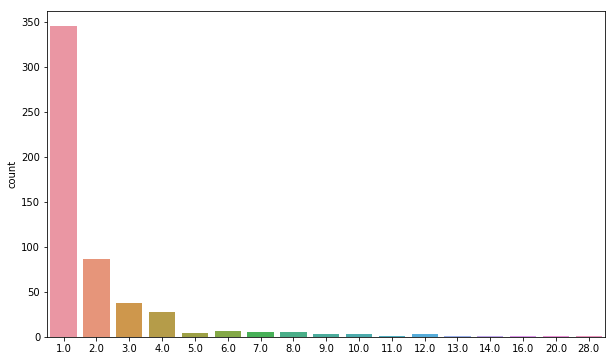

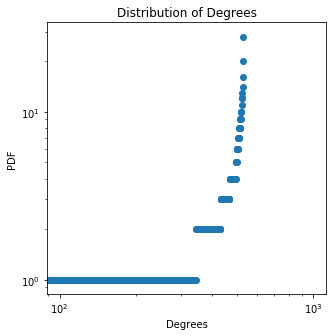

The clustering coefficient is 0.0035714285714285713
Node with highest degree is: 25 with a degree of: 28.0 , the mean is 2.0037735849056606 , the variance is 5.864136703453187
208
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7192287831322912
number of closed triangles is 1
number of open triangles is 243
average distance is 0.6564801556203768


<Figure size 432x288 with 0 Axes>

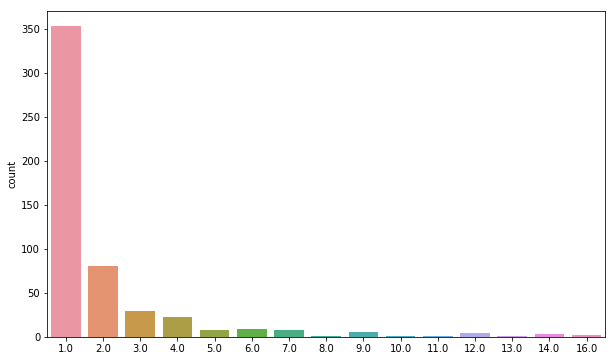

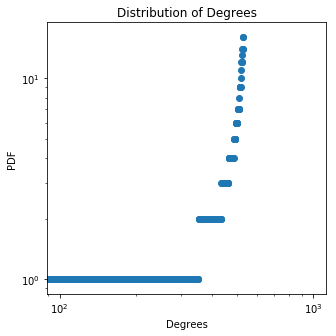

The clustering coefficient is 0.00411522633744856
Node with highest degree is: 18 with a degree of: 16.0 , the mean is 2.0037735849056606 , the variance is 5.113193307226771
207
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7827511118749122
number of closed triangles is 1
number of open triangles is 245
average distance is 0.6778435339621404


<Figure size 432x288 with 0 Axes>

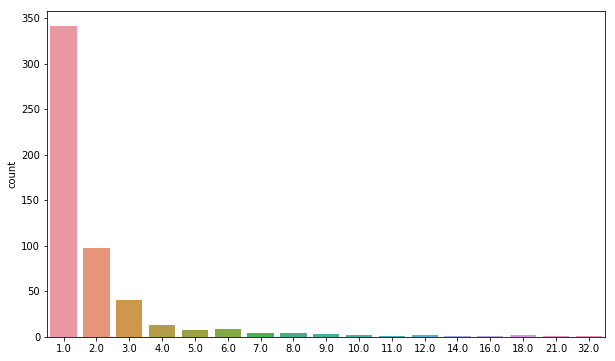

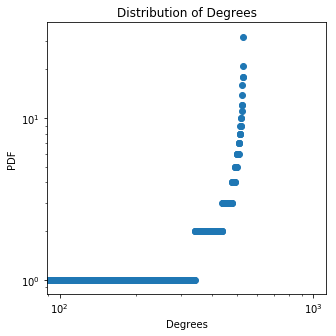

The clustering coefficient is 0.004081632653061225
Node with highest degree is: 20 with a degree of: 32.0 , the mean is 2.0037735849056606 , the variance is 6.720740477038092
206
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6285858356520528
number of closed triangles is 1
number of open triangles is 197
average distance is 0.6607277502400061


<Figure size 432x288 with 0 Axes>

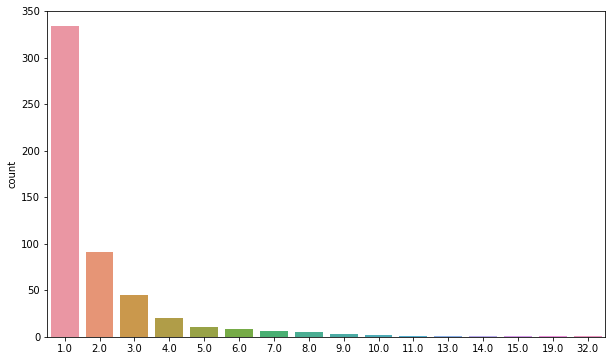

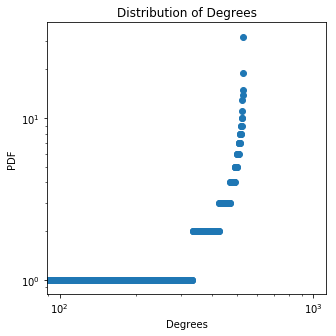

The clustering coefficient is 0.005076142131979695
Node with highest degree is: 16 with a degree of: 32.0 , the mean is 2.0037735849056606 , the variance is 5.633948024207903
205
number of closed triangles is 1
number of open triangles is 0
average distance is 0.620265008489848
number of closed triangles is 1
number of open triangles is 229
average distance is 0.6873492994348646


<Figure size 432x288 with 0 Axes>

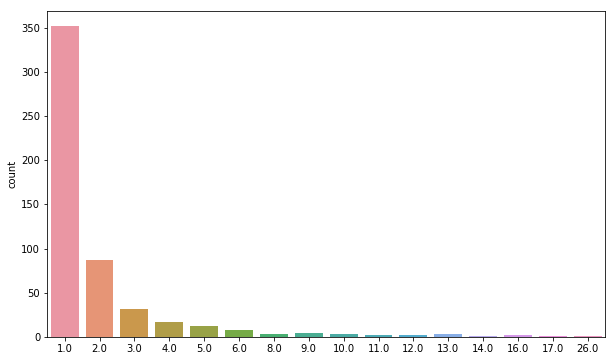

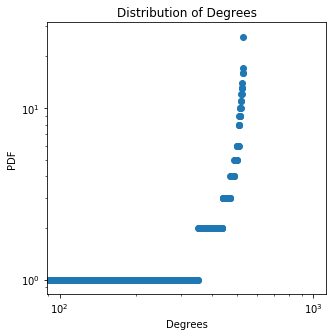

The clustering coefficient is 0.004366812227074236
Node with highest degree is: 16 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 6.124514061943751
204
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5987563729633724
number of closed triangles is 1
number of open triangles is 184
average distance is 0.6539284978693451


<Figure size 432x288 with 0 Axes>

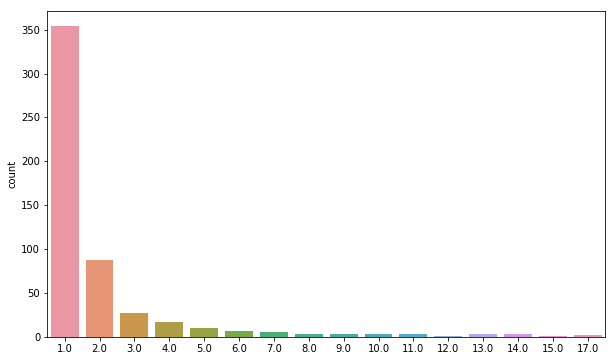

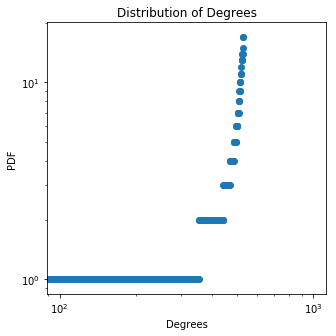

The clustering coefficient is 0.005434782608695652
Node with highest degree is: 14 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 5.6226272694909225
203
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6413954882569103
number of closed triangles is 1
number of open triangles is 241
average distance is 0.6647966665485535


<Figure size 432x288 with 0 Axes>

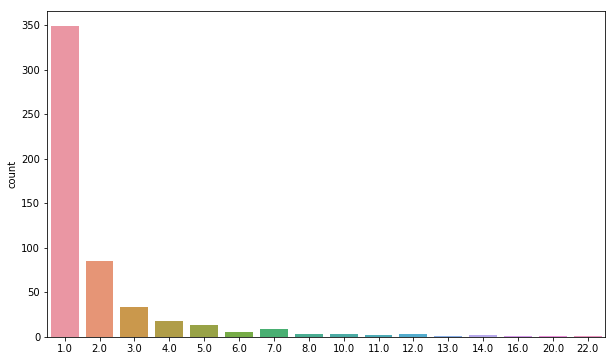

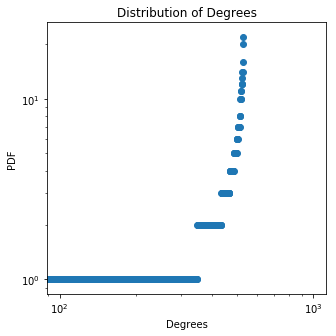

The clustering coefficient is 0.004149377593360996
Node with highest degree is: 27 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.59998576005696
202
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6223010197064274
number of closed triangles is 1
number of open triangles is 202
average distance is 0.6491095858754156


<Figure size 432x288 with 0 Axes>

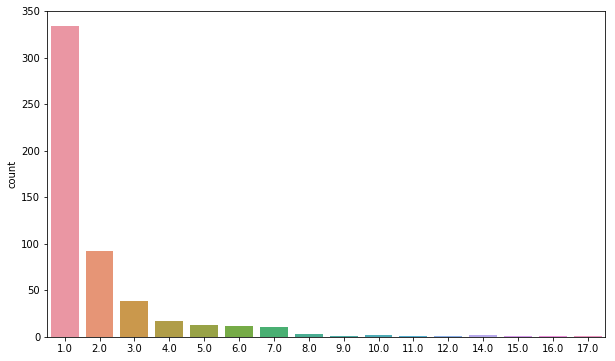

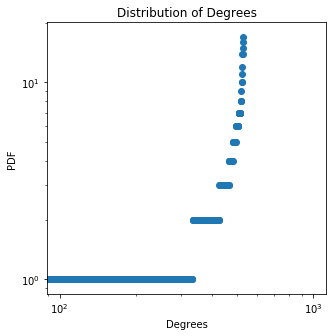

The clustering coefficient is 0.0049504950495049506
Node with highest degree is: 14 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 4.422627269490922
201
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5969863905884838
number of closed triangles is 1
number of open triangles is 193
average distance is 0.6756469434725876


<Figure size 432x288 with 0 Axes>

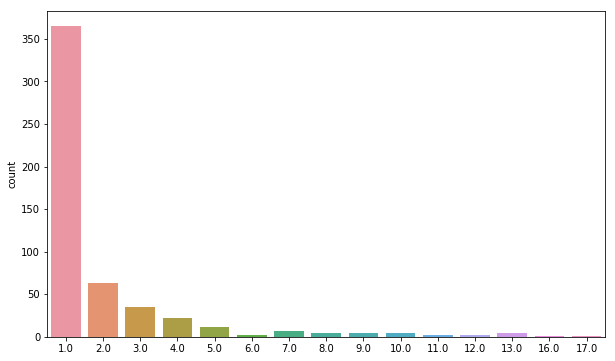

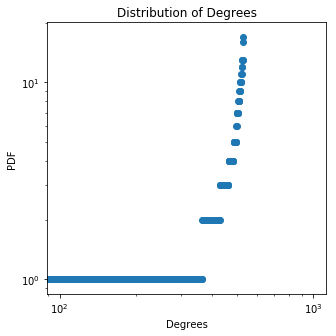

The clustering coefficient is 0.0051813471502590676
Node with highest degree is: 25 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 5.2188536845852616
200
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7673115054837792
number of closed triangles is 1
number of open triangles is 228
average distance is 0.6753401463822412


<Figure size 432x288 with 0 Axes>

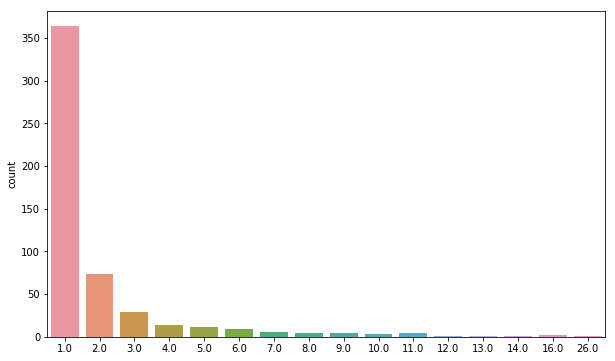

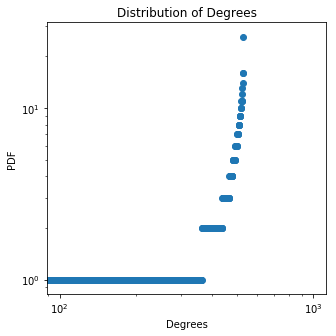

The clustering coefficient is 0.0043859649122807015
Node with highest degree is: 12 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 5.879231043075827
199
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6199587791045609
number of closed triangles is 1
number of open triangles is 222
average distance is 0.636812216074057


<Figure size 432x288 with 0 Axes>

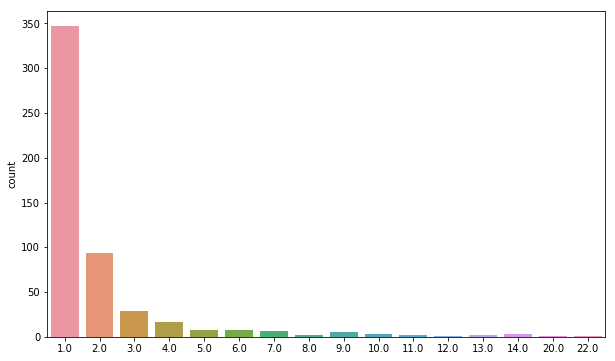

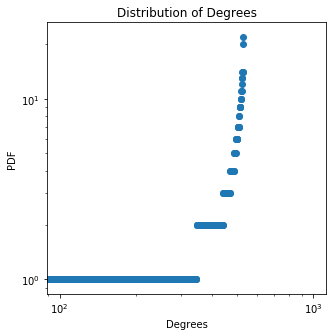

The clustering coefficient is 0.0045045045045045045
Node with highest degree is: 29 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.637721609113563
198
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6048362179273077
number of closed triangles is 1
number of open triangles is 194
average distance is 0.6660221062241338


<Figure size 432x288 with 0 Axes>

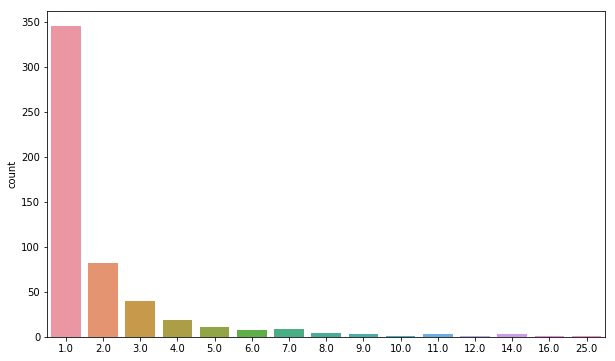

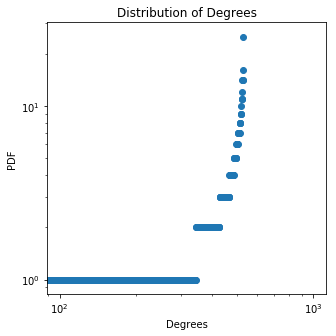

The clustering coefficient is 0.005154639175257732
Node with highest degree is: 16 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.19243859024564
197
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6695201297866941
number of closed triangles is 1
number of open triangles is 231
average distance is 0.6804446681200089


<Figure size 432x288 with 0 Axes>

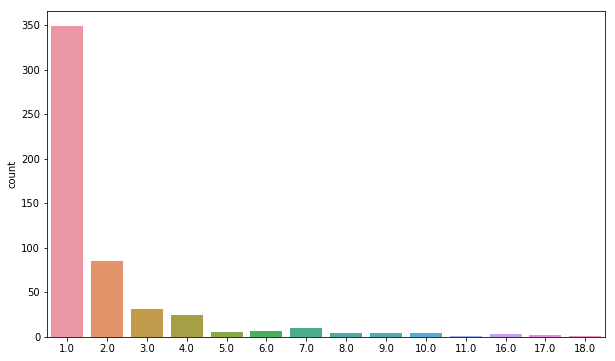

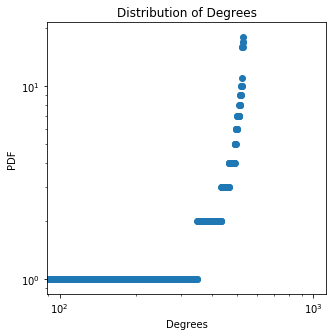

The clustering coefficient is 0.004329004329004329
Node with highest degree is: 18 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.362249911000355
196
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6193747417853461
number of closed triangles is 1
number of open triangles is 203
average distance is 0.6562915861321149


<Figure size 432x288 with 0 Axes>

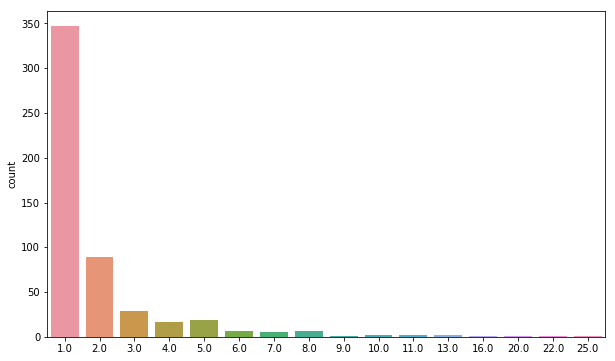

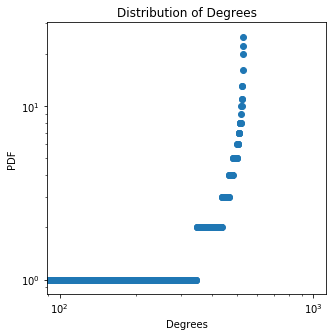

The clustering coefficient is 0.0049261083743842365
Node with highest degree is: 1 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.883004627981487
195
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7251031512068529
number of closed triangles is 1
number of open triangles is 183
average distance is 0.6769182306472263


<Figure size 432x288 with 0 Axes>

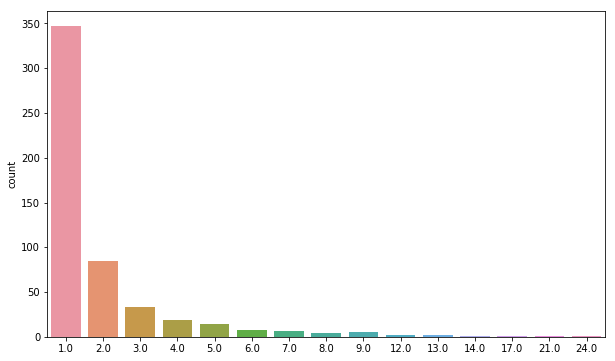

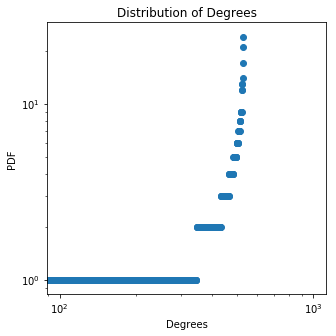

The clustering coefficient is 0.00546448087431694
Node with highest degree is: 41 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.528287646849412
194
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6563483725202066
number of closed triangles is 1
number of open triangles is 179
average distance is 0.655300476823298


<Figure size 432x288 with 0 Axes>

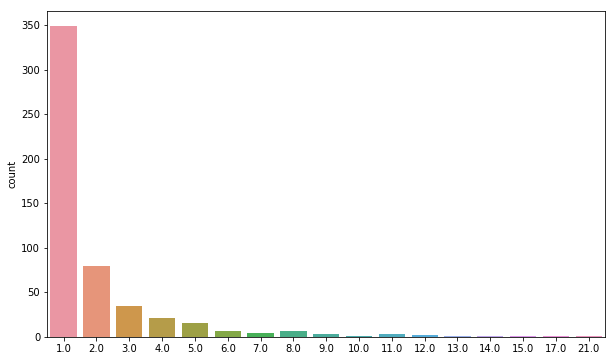

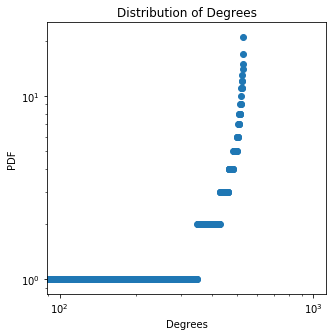

The clustering coefficient is 0.00558659217877095
Node with highest degree is: 16 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.090551797792808
193
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6310413292927223
number of closed triangles is 1
number of open triangles is 219
average distance is 0.6648111459896667


<Figure size 432x288 with 0 Axes>

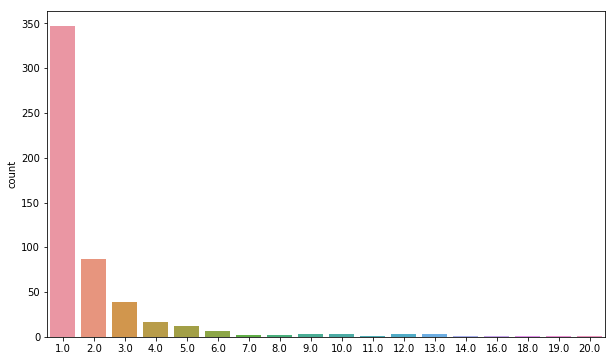

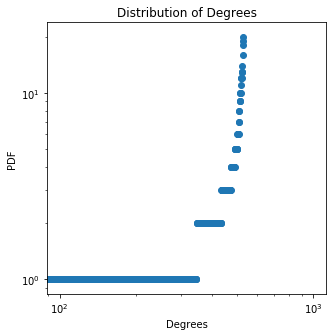

The clustering coefficient is 0.0045662100456621
Node with highest degree is: 5 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.7962121751512985
192
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6650662911544575
number of closed triangles is 1
number of open triangles is 181
average distance is 0.6819151480265686


<Figure size 432x288 with 0 Axes>

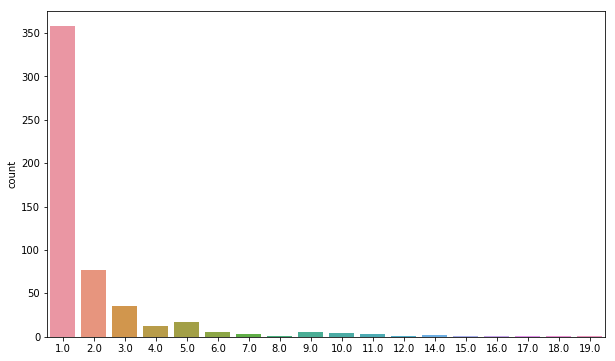

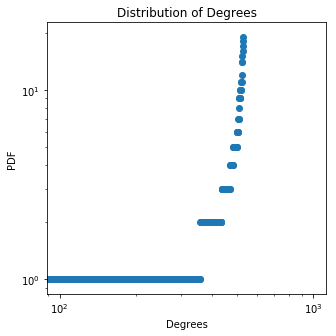

The clustering coefficient is 0.0055248618784530384
Node with highest degree is: 28 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.7962121751513
191
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7877681004129794
number of closed triangles is 1
number of open triangles is 178
average distance is 0.665430253466902


<Figure size 432x288 with 0 Axes>

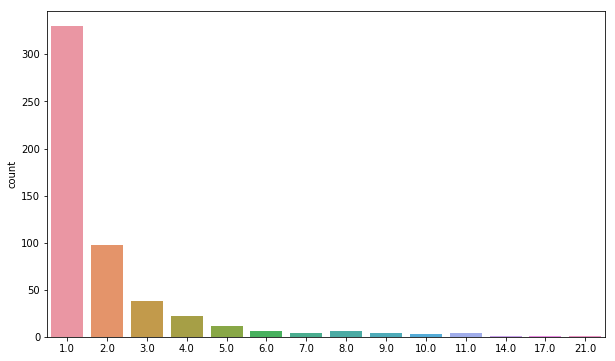

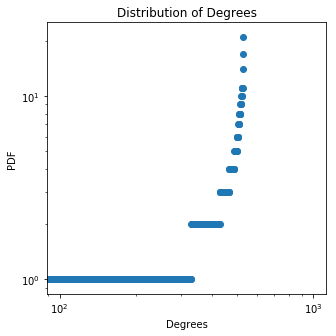

The clustering coefficient is 0.0056179775280898875
Node with highest degree is: 1 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 4.5622499110003565
190
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6527946797692986
number of closed triangles is 1
number of open triangles is 221
average distance is 0.6412109774689325


<Figure size 432x288 with 0 Axes>

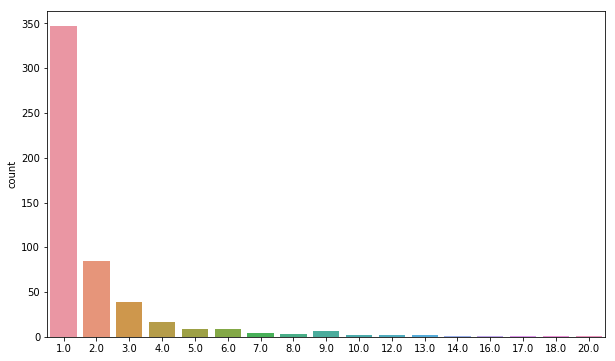

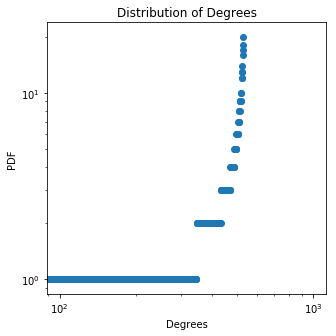

The clustering coefficient is 0.004524886877828055
Node with highest degree is: 0 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.464136703453187
189
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6875052120750003
number of closed triangles is 1
number of open triangles is 238
average distance is 0.6934986725291771


<Figure size 432x288 with 0 Axes>

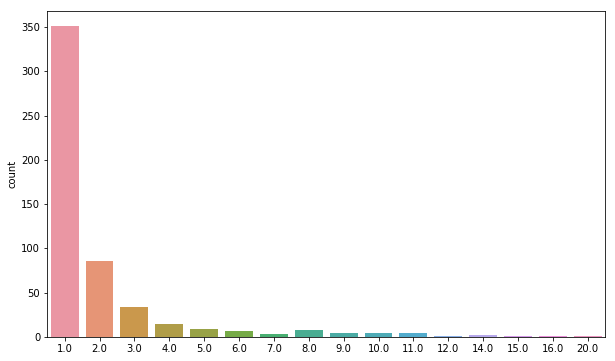

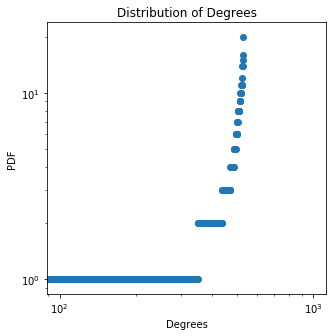

The clustering coefficient is 0.004201680672268907
Node with highest degree is: 15 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.354702741189035
188
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6526177360604041
number of closed triangles is 1
number of open triangles is 177
average distance is 0.6542708171452307


<Figure size 432x288 with 0 Axes>

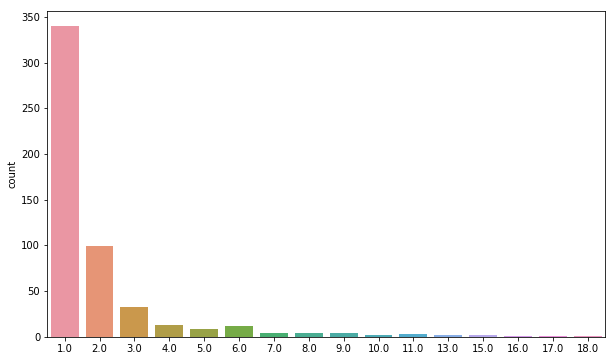

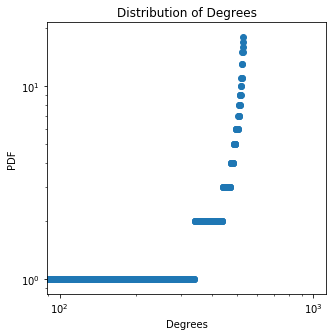

The clustering coefficient is 0.005649717514124294
Node with highest degree is: 7 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.218853684585262
187
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6982299847833587
number of closed triangles is 1
number of open triangles is 200
average distance is 0.6749249025721572


<Figure size 432x288 with 0 Axes>

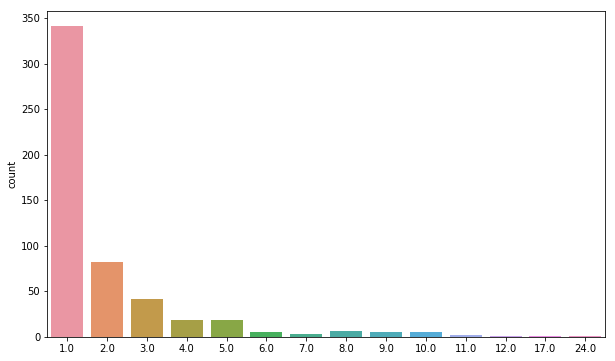

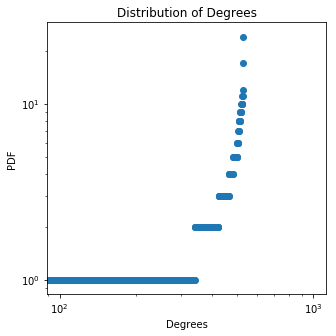

The clustering coefficient is 0.005
Node with highest degree is: 9 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 4.762249911000357
186
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6736423580679992
number of closed triangles is 1
number of open triangles is 181
average distance is 0.6637626490691149


<Figure size 432x288 with 0 Axes>

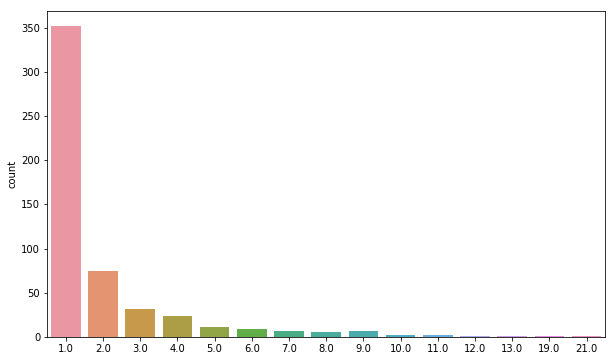

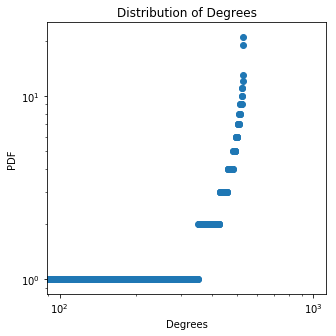

The clustering coefficient is 0.0055248618784530384
Node with highest degree is: 13 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 4.871683873264508
185
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6968507909280205
number of closed triangles is 1
number of open triangles is 200
average distance is 0.6431717015352184


<Figure size 432x288 with 0 Axes>

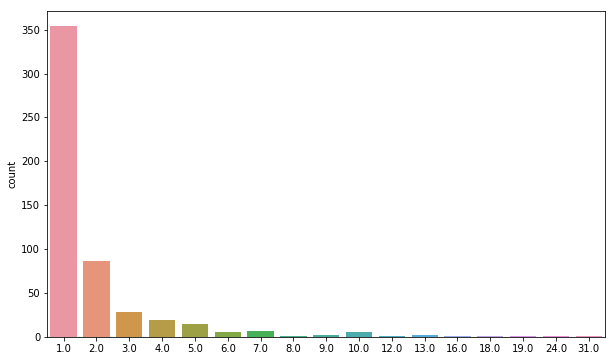

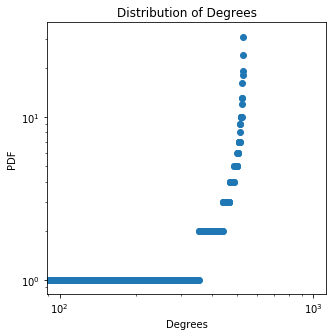

The clustering coefficient is 0.005
Node with highest degree is: 20 with a degree of: 31.0 , the mean is 2.0037735849056606 , the variance is 6.999985760056958
184
number of closed triangles is 1
number of open triangles is 0
average distance is 0.666034617845395
number of closed triangles is 1
number of open triangles is 218
average distance is 0.6605661472476956


<Figure size 432x288 with 0 Axes>

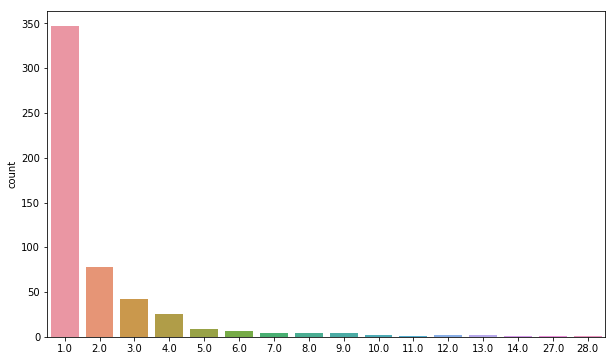

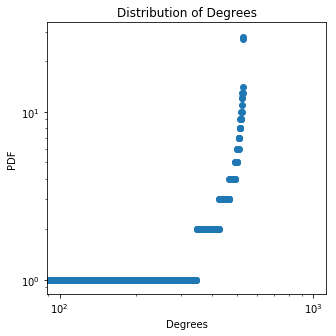

The clustering coefficient is 0.0045871559633027525
Node with highest degree is: 27 with a degree of: 28.0 , the mean is 2.0037735849056606 , the variance is 6.071683873264508
183
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6517482029566833
number of closed triangles is 1
number of open triangles is 193
average distance is 0.6608480648691888


<Figure size 432x288 with 0 Axes>

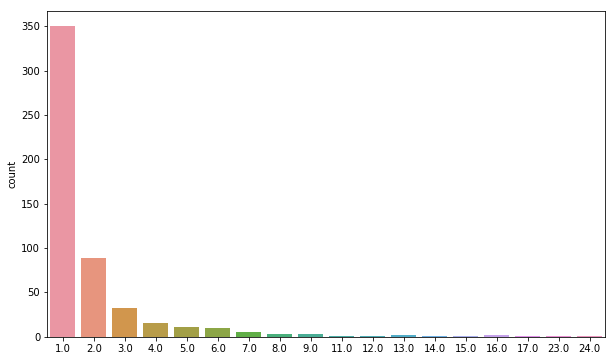

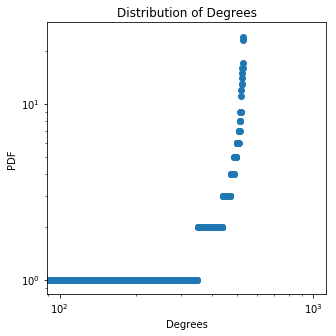

The clustering coefficient is 0.0051813471502590676
Node with highest degree is: 13 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.339608401566394
182
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6941992237349559
number of closed triangles is 1
number of open triangles is 205
average distance is 0.6532997981899149


<Figure size 432x288 with 0 Axes>

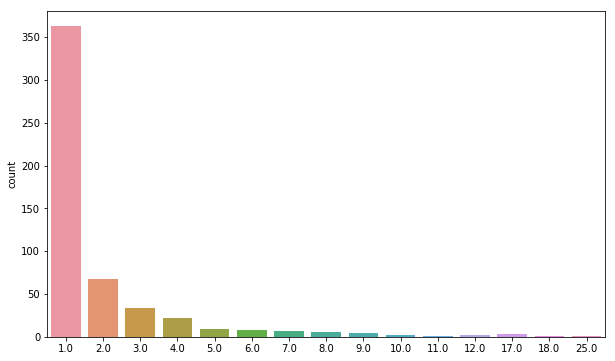

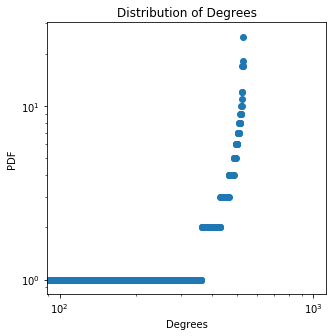

The clustering coefficient is 0.004878048780487805
Node with highest degree is: 15 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.943381986472055
181
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6093930050294162
number of closed triangles is 1
number of open triangles is 245
average distance is 0.6471547170203357


<Figure size 432x288 with 0 Axes>

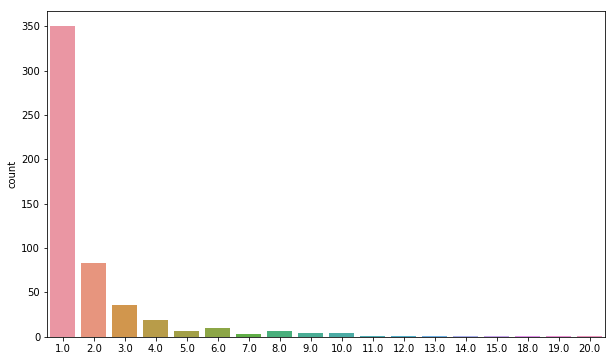

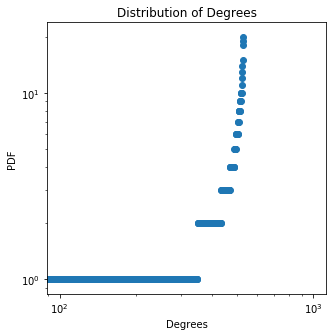

The clustering coefficient is 0.004081632653061225
Node with highest degree is: 0 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.494325382698469
180
number of closed triangles is 1
number of open triangles is 0
average distance is 0.732062706118242
number of closed triangles is 1
number of open triangles is 211
average distance is 0.6824307314821132


<Figure size 432x288 with 0 Axes>

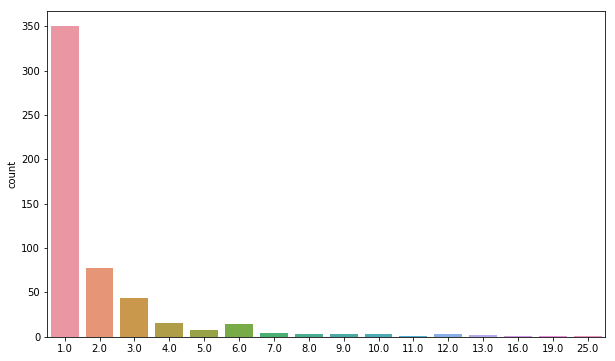

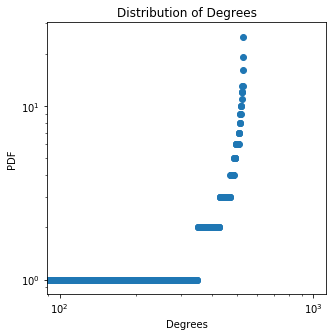

The clustering coefficient is 0.004739336492890996
Node with highest degree is: 27 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.535834816660734
179
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6914701011596947
number of closed triangles is 1
number of open triangles is 201
average distance is 0.6695388768311661


<Figure size 432x288 with 0 Axes>

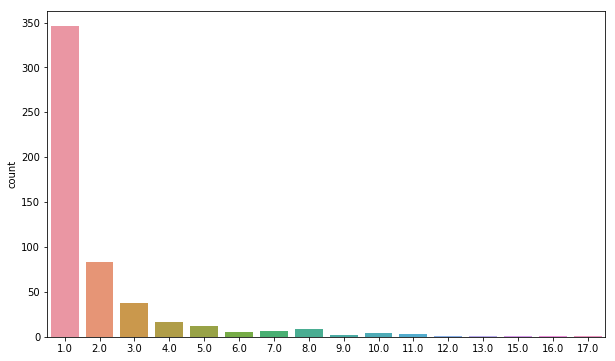

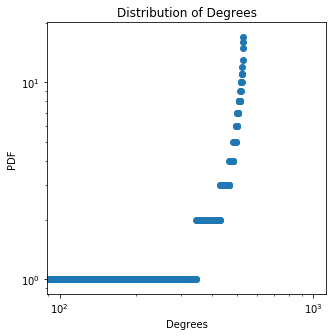

The clustering coefficient is 0.004975124378109453
Node with highest degree is: 14 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 4.758476326094696
178
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6318347732180061
number of closed triangles is 1
number of open triangles is 265
average distance is 0.6509450950921714


<Figure size 432x288 with 0 Axes>

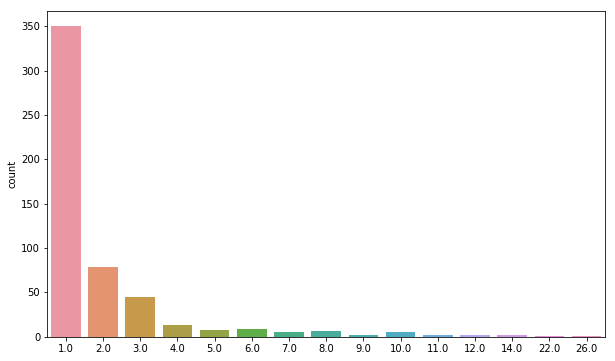

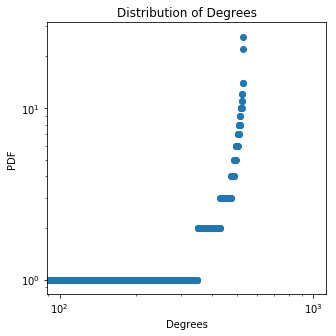

The clustering coefficient is 0.0037735849056603774
Node with highest degree is: 11 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 5.750929156283375
177
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6689883318874761
number of closed triangles is 1
number of open triangles is 216
average distance is 0.6587123570115306


<Figure size 432x288 with 0 Axes>

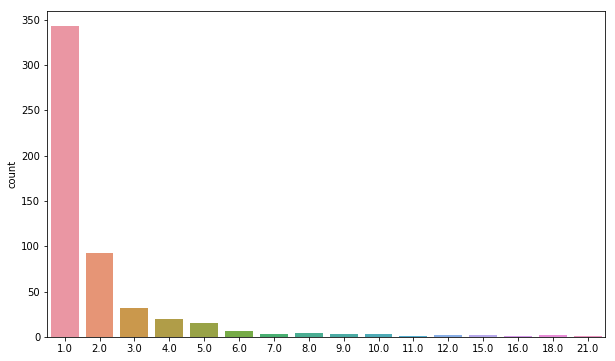

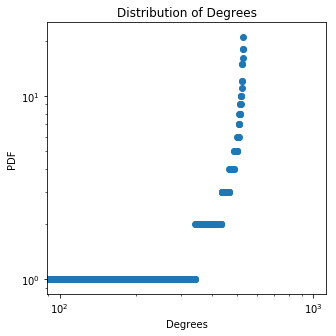

The clustering coefficient is 0.004629629629629629
Node with highest degree is: 26 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.532061231755073
176
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6902960246853549
number of closed triangles is 1
number of open triangles is 258
average distance is 0.6461144604491192


<Figure size 432x288 with 0 Axes>

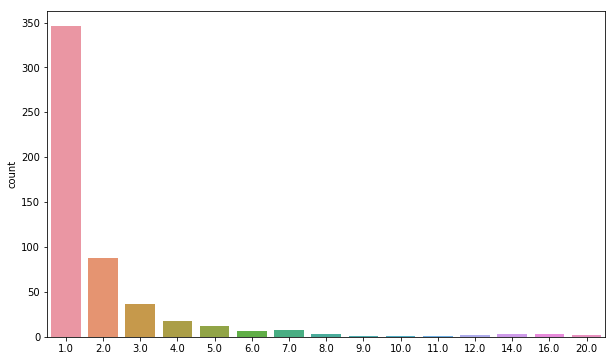

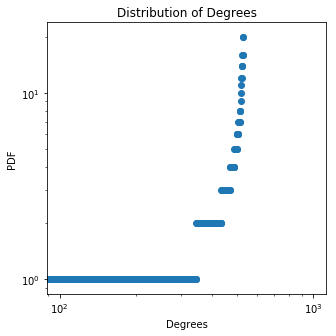

The clustering coefficient is 0.003875968992248062
Node with highest degree is: 2 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.7131933072267715
175
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6722025815992135
number of closed triangles is 1
number of open triangles is 248
average distance is 0.6737609204125097


<Figure size 432x288 with 0 Axes>

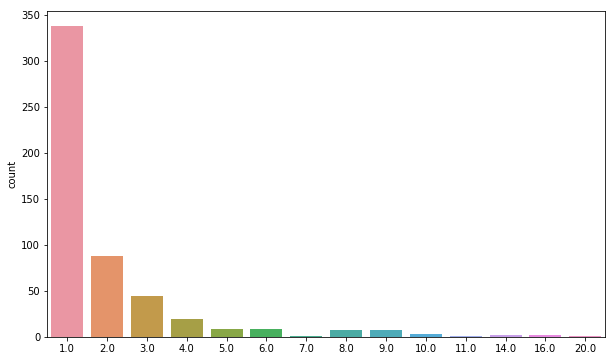

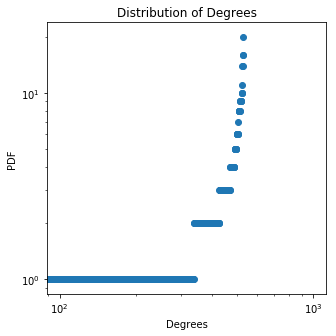

The clustering coefficient is 0.004032258064516129
Node with highest degree is: 2 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 4.837721609113563
174
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6765103321337445
number of closed triangles is 1
number of open triangles is 265
average distance is 0.6680781819369147


<Figure size 432x288 with 0 Axes>

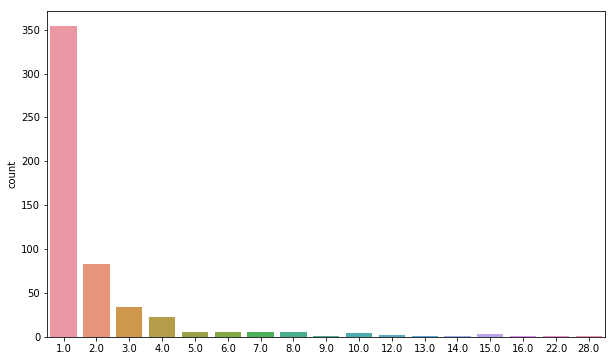

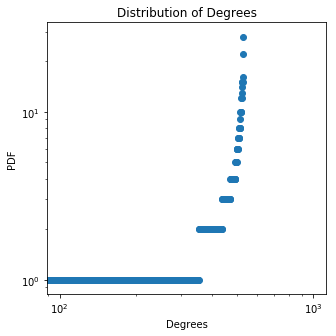

The clustering coefficient is 0.0037735849056603774
Node with highest degree is: 16 with a degree of: 28.0 , the mean is 2.0037735849056606 , the variance is 6.566023495906017
173
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6582740461075915
number of closed triangles is 1
number of open triangles is 201
average distance is 0.6402418564758445


<Figure size 432x288 with 0 Axes>

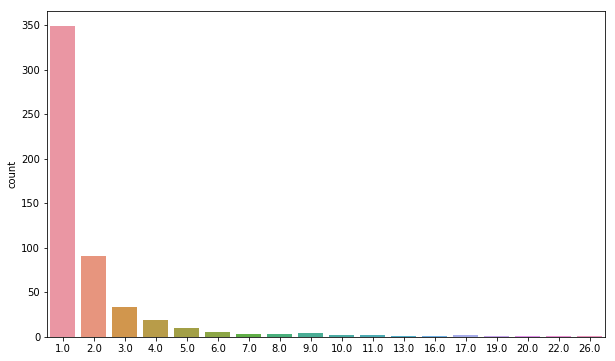

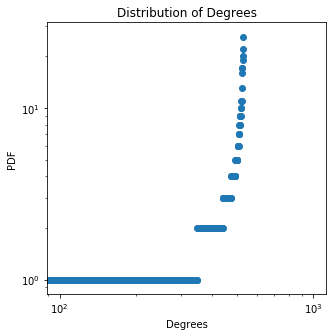

The clustering coefficient is 0.004975124378109453
Node with highest degree is: 12 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 6.89432538269847
172
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6579326245289348
number of closed triangles is 1
number of open triangles is 219
average distance is 0.6757545032747853


<Figure size 432x288 with 0 Axes>

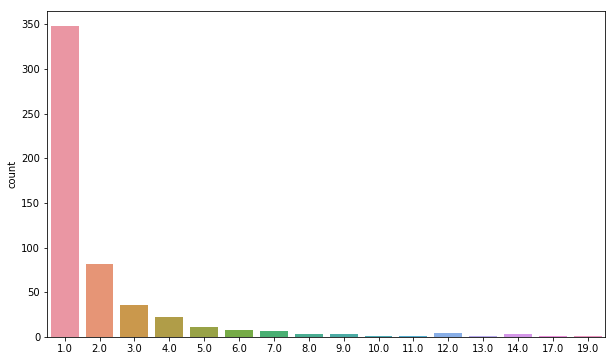

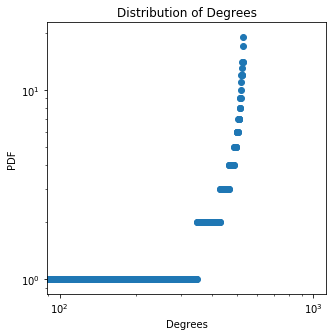

The clustering coefficient is 0.0045662100456621
Node with highest degree is: 20 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.124514061943752
171
number of closed triangles is 1
number of open triangles is 0
average distance is 0.670410182953741
number of closed triangles is 1
number of open triangles is 199
average distance is 0.6644536909687986


<Figure size 432x288 with 0 Axes>

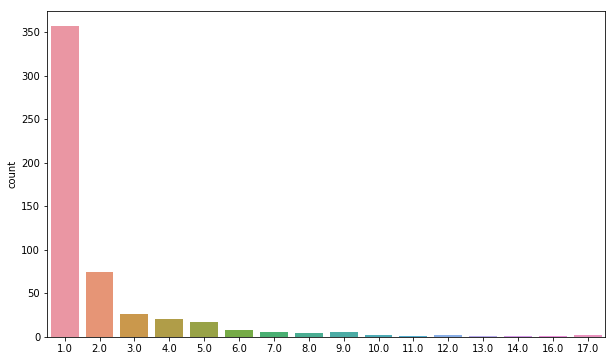

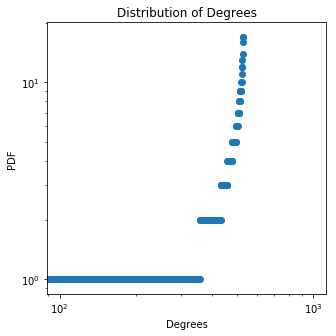

The clustering coefficient is 0.005025125628140704
Node with highest degree is: 22 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 5.011306514773941
170
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6280471496824076
number of closed triangles is 1
number of open triangles is 187
average distance is 0.6436866062297719


<Figure size 432x288 with 0 Axes>

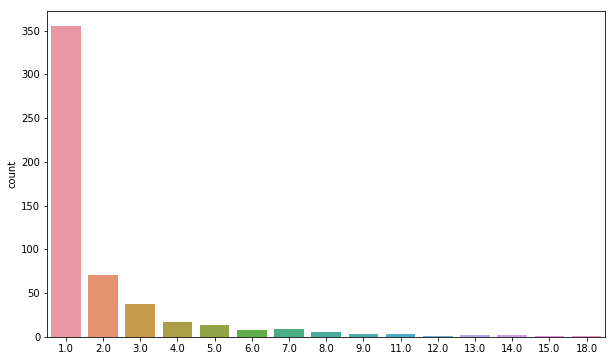

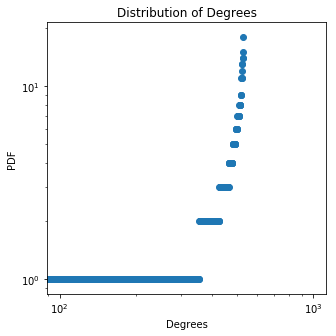

The clustering coefficient is 0.0053475935828877
Node with highest degree is: 12 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 4.890551797792809
169
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6998621907527939
number of closed triangles is 1
number of open triangles is 213
average distance is 0.6664744684050912


<Figure size 432x288 with 0 Axes>

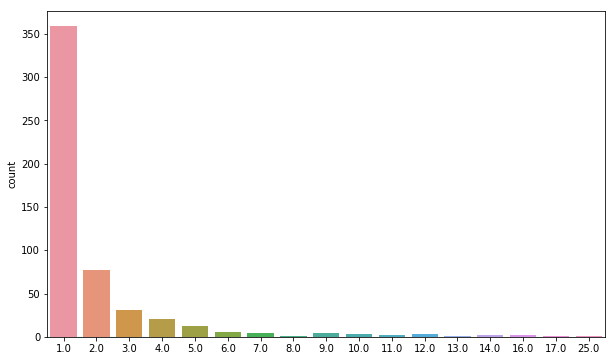

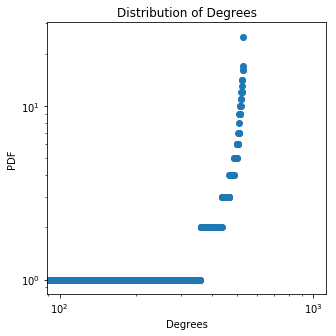

The clustering coefficient is 0.004694835680751174
Node with highest degree is: 0 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.083004627981488
168
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7136756432725576
number of closed triangles is 1
number of open triangles is 147
average distance is 0.6282748999580637


<Figure size 432x288 with 0 Axes>

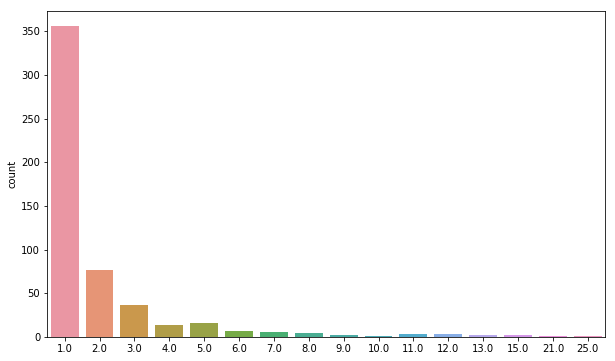

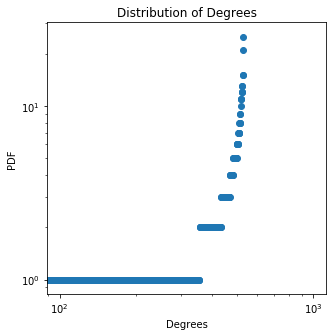

The clustering coefficient is 0.006802721088435374
Node with highest degree is: 8 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.939608401566395
167
number of closed triangles is 1
number of open triangles is 0
average distance is 0.682104335346484
number of closed triangles is 1
number of open triangles is 218
average distance is 0.6527301290231236


<Figure size 432x288 with 0 Axes>

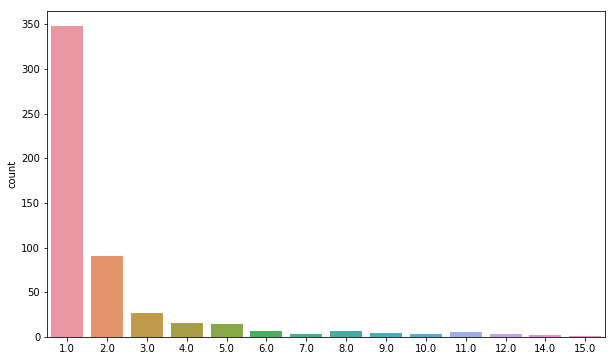

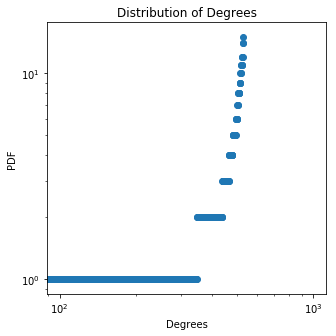

The clustering coefficient is 0.0045871559633027525
Node with highest degree is: 29 with a degree of: 15.0 , the mean is 2.0037735849056606 , the variance is 4.818853684585261
166
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5950776996185922
number of closed triangles is 1
number of open triangles is 240
average distance is 0.6518836109459536


<Figure size 432x288 with 0 Axes>

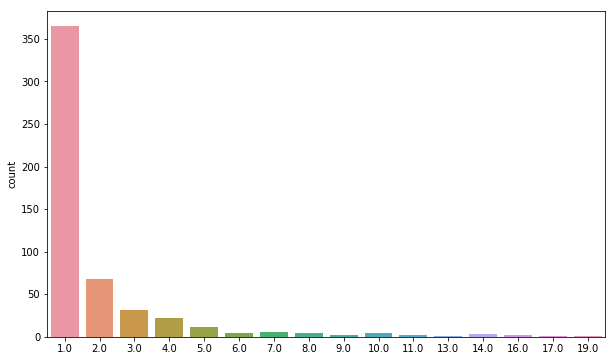

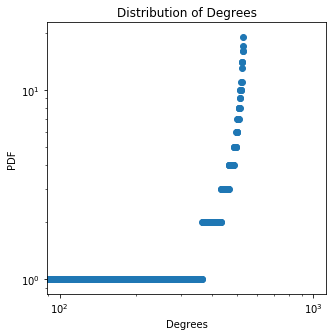

The clustering coefficient is 0.004166666666666667
Node with highest degree is: 7 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.720740477038093
165
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7004396593490171
number of closed triangles is 1
number of open triangles is 213
average distance is 0.6803494504746953


<Figure size 432x288 with 0 Axes>

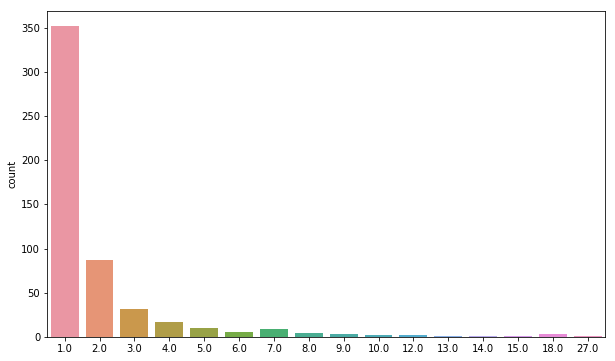

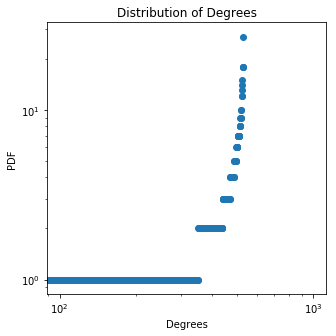

The clustering coefficient is 0.004694835680751174
Node with highest degree is: 10 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 6.2414951940192225
164
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6232981633666078
number of closed triangles is 1
number of open triangles is 173
average distance is 0.6502944569143589


<Figure size 432x288 with 0 Axes>

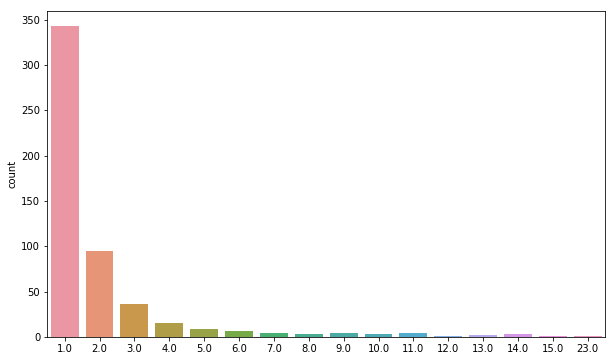

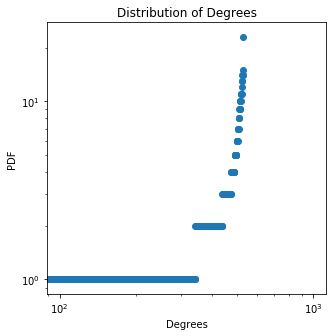

The clustering coefficient is 0.005780346820809248
Node with highest degree is: 1 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.509419722321111
163
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6802652269194893
number of closed triangles is 1
number of open triangles is 188
average distance is 0.6587995118622588


<Figure size 432x288 with 0 Axes>

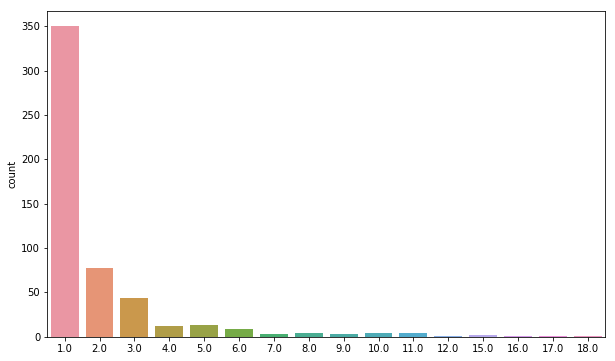

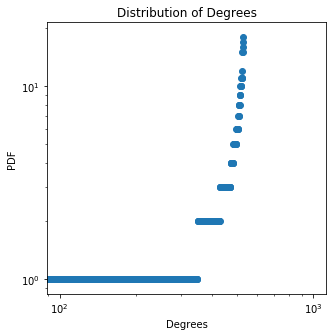

The clustering coefficient is 0.005319148936170213
Node with highest degree is: 8 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.215080099679602
162
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6195261256450315
number of closed triangles is 1
number of open triangles is 200
average distance is 0.6603797366297448


<Figure size 432x288 with 0 Axes>

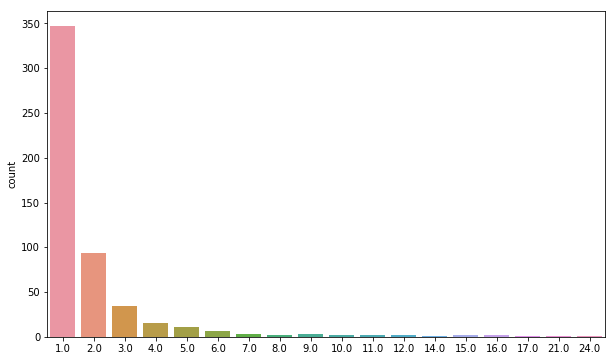

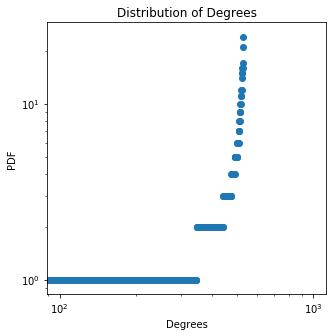

The clustering coefficient is 0.005
Node with highest degree is: 15 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.377344250622997
161
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6322503640777147
number of closed triangles is 1
number of open triangles is 226
average distance is 0.682337296607147


<Figure size 432x288 with 0 Axes>

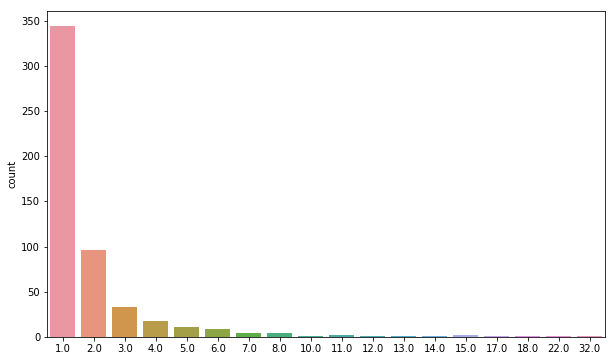

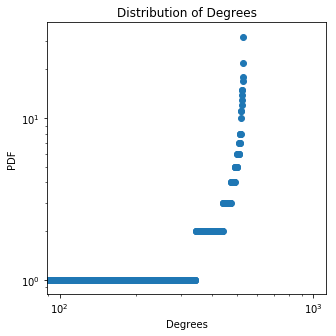

The clustering coefficient is 0.004424778761061947
Node with highest degree is: 14 with a degree of: 32.0 , the mean is 2.0037735849056606 , the variance is 6.871683873264508
160
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6417802298343335
number of closed triangles is 1
number of open triangles is 216
average distance is 0.6585189706445547


<Figure size 432x288 with 0 Axes>

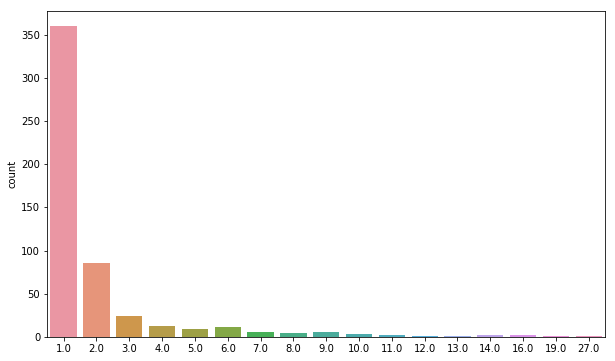

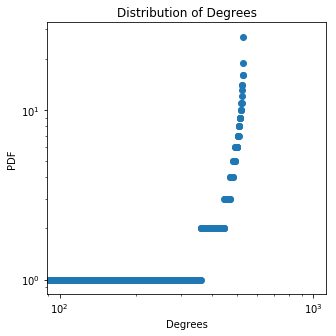

The clustering coefficient is 0.004629629629629629
Node with highest degree is: 12 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 6.3697970808116775
159
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6583533072687903
number of closed triangles is 1
number of open triangles is 182
average distance is 0.6642572088818441


<Figure size 432x288 with 0 Axes>

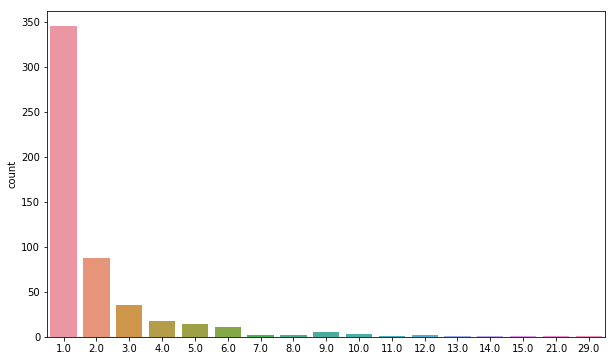

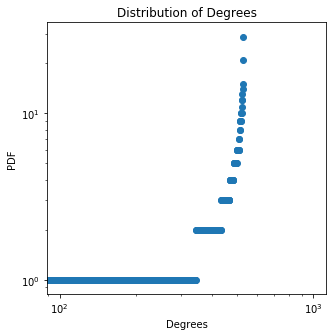

The clustering coefficient is 0.005494505494505495
Node with highest degree is: 0 with a degree of: 29.0 , the mean is 2.0037735849056606 , the variance is 5.8754574581701675
158
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7403267902584362
number of closed triangles is 1
number of open triangles is 133
average distance is 0.651258098378223


<Figure size 432x288 with 0 Axes>

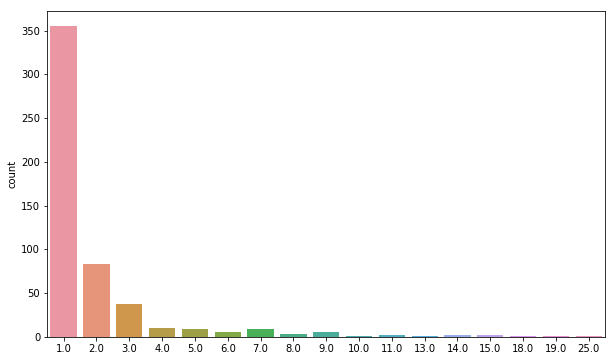

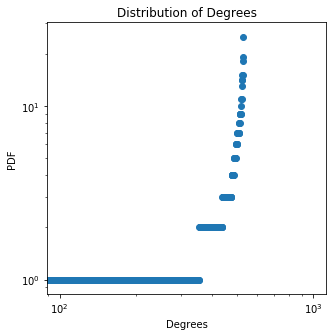

The clustering coefficient is 0.007518796992481203
Node with highest degree is: 29 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.196212175151299
157
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6165790907252027
number of closed triangles is 1
number of open triangles is 175
average distance is 0.6618405929800517


<Figure size 432x288 with 0 Axes>

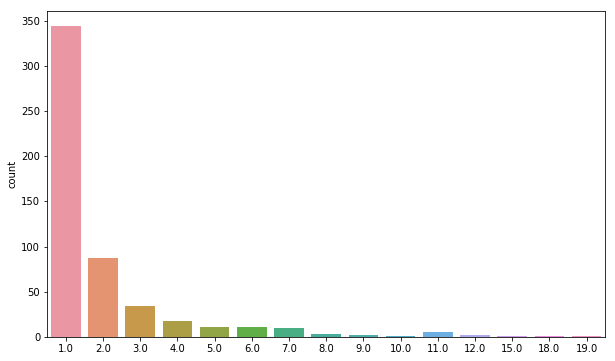

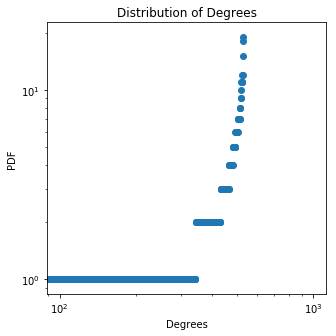

The clustering coefficient is 0.005714285714285714
Node with highest degree is: 11 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 4.830174439302242
156
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6381115803187348
number of closed triangles is 1
number of open triangles is 186
average distance is 0.6631687848941843


<Figure size 432x288 with 0 Axes>

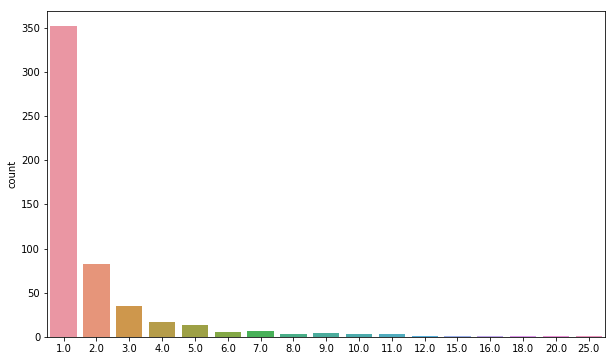

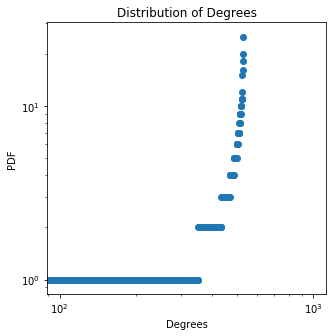

The clustering coefficient is 0.005376344086021506
Node with highest degree is: 16 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.924514061943752
155
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6652212645860721
number of closed triangles is 1
number of open triangles is 242
average distance is 0.644239534813196


<Figure size 432x288 with 0 Axes>

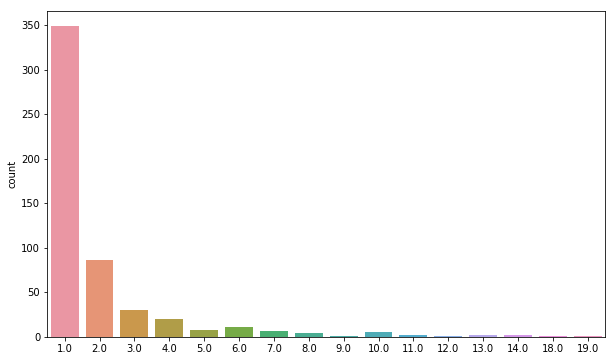

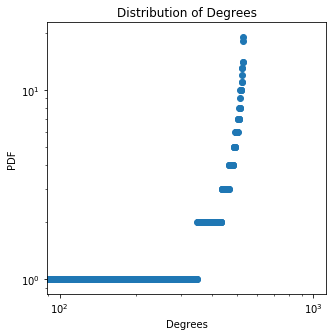

The clustering coefficient is 0.004132231404958678
Node with highest degree is: 27 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.154702741189036
154
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7321373977381178
number of closed triangles is 1
number of open triangles is 185
average distance is 0.688155395801952


<Figure size 432x288 with 0 Axes>

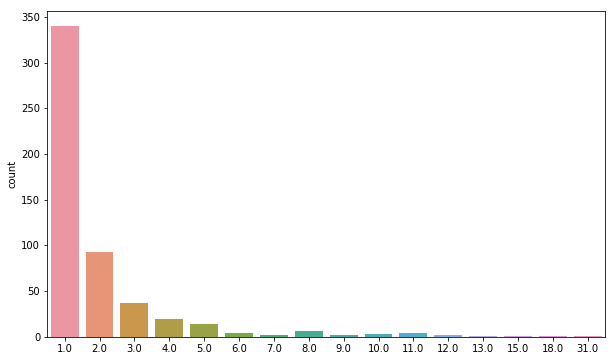

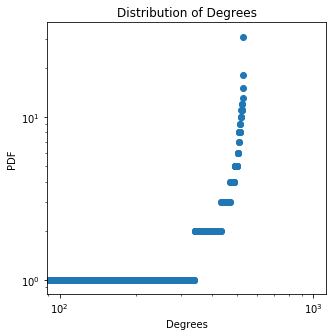

The clustering coefficient is 0.005405405405405406
Node with highest degree is: 8 with a degree of: 31.0 , the mean is 2.0037735849056606 , the variance is 5.867910288358847
153
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6902706731191602
number of closed triangles is 1
number of open triangles is 167
average distance is 0.6630924510115215


<Figure size 432x288 with 0 Axes>

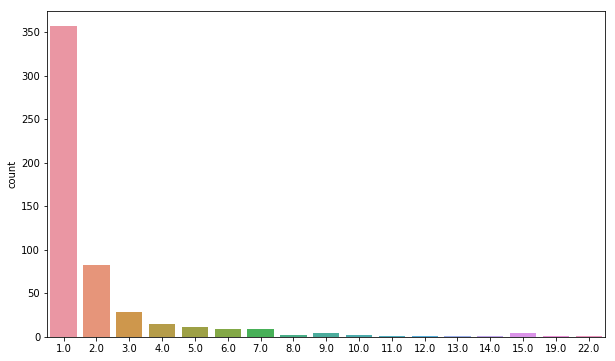

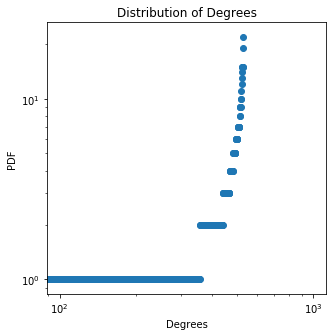

The clustering coefficient is 0.005988023952095809
Node with highest degree is: 16 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.886778212887148
152
number of closed triangles is 1
number of open triangles is 0
average distance is 0.694266774147192
number of closed triangles is 1
number of open triangles is 198
average distance is 0.6483348202784787


<Figure size 432x288 with 0 Axes>

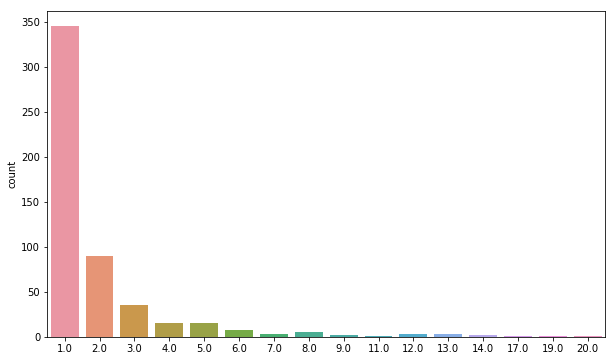

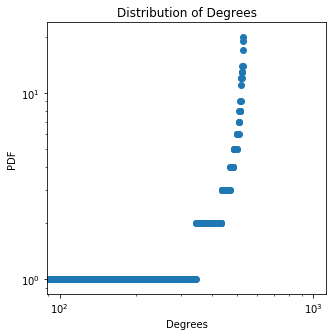

The clustering coefficient is 0.005050505050505051
Node with highest degree is: 23 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.5207404770380935
151
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6404661567962918
number of closed triangles is 1
number of open triangles is 185
average distance is 0.6329708777417344


<Figure size 432x288 with 0 Axes>

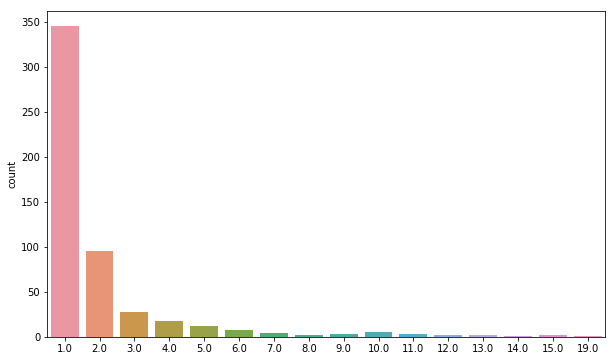

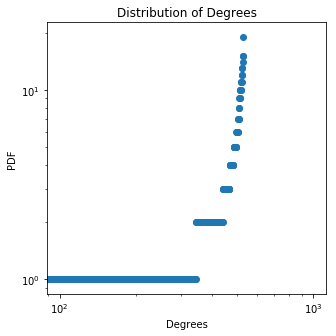

The clustering coefficient is 0.005405405405405406
Node with highest degree is: 33 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.2301744393022425
150
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6955926636190856
number of closed triangles is 1
number of open triangles is 191
average distance is 0.6705811449382582


<Figure size 432x288 with 0 Axes>

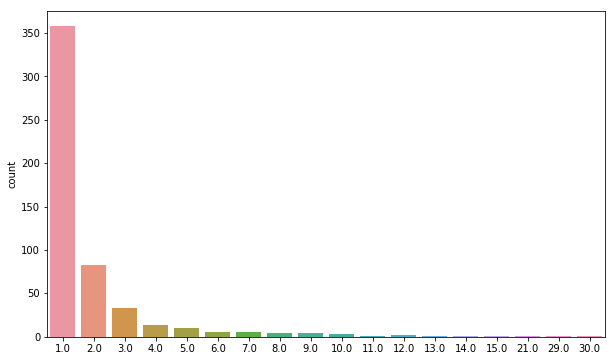

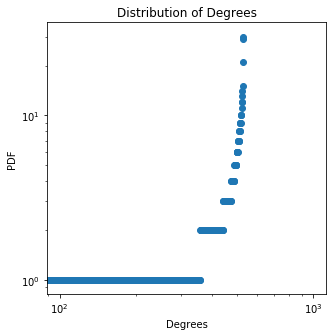

The clustering coefficient is 0.005235602094240838
Node with highest degree is: 14 with a degree of: 30.0 , the mean is 2.0037735849056606 , the variance is 7.366023495906017
149
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6533976099712289
number of closed triangles is 1
number of open triangles is 182
average distance is 0.6685879088758228


<Figure size 432x288 with 0 Axes>

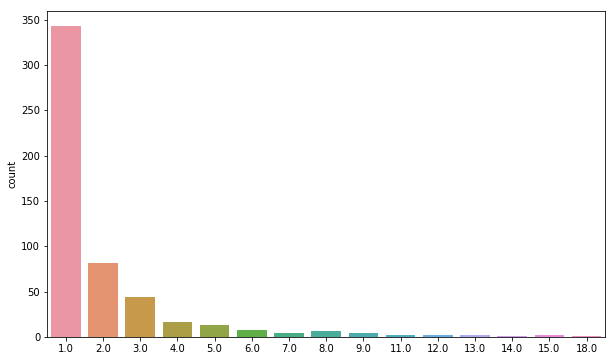

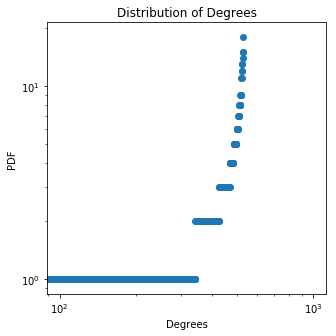

The clustering coefficient is 0.005494505494505495
Node with highest degree is: 11 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 4.811306514773942
148
number of closed triangles is 1
number of open triangles is 0
average distance is 0.646207035437218
number of closed triangles is 1
number of open triangles is 151
average distance is 0.6720376670400369


<Figure size 432x288 with 0 Axes>

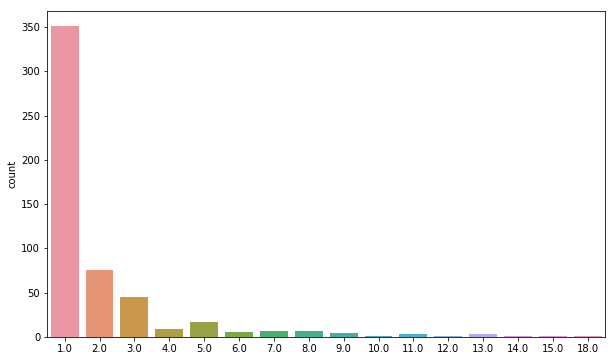

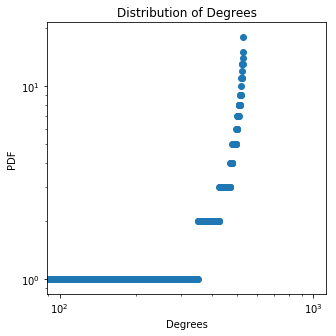

The clustering coefficient is 0.006622516556291391
Node with highest degree is: 19 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 4.90941972232111
147
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7125286808226708
number of closed triangles is 1
number of open triangles is 223
average distance is 0.660132422998235


<Figure size 432x288 with 0 Axes>

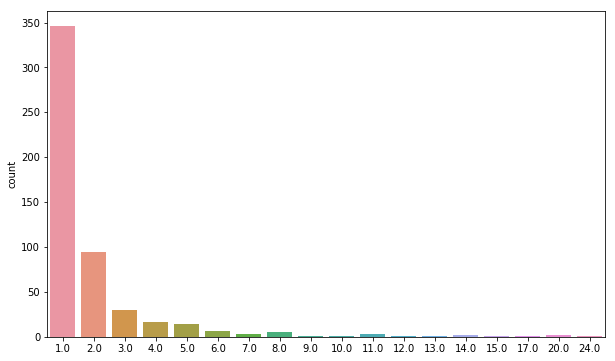

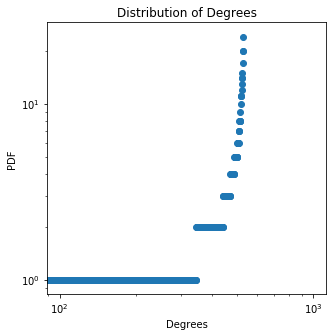

The clustering coefficient is 0.004484304932735426
Node with highest degree is: 27 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.249042363830544
146
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6597217185900016
number of closed triangles is 1
number of open triangles is 214
average distance is 0.6647024798471699


<Figure size 432x288 with 0 Axes>

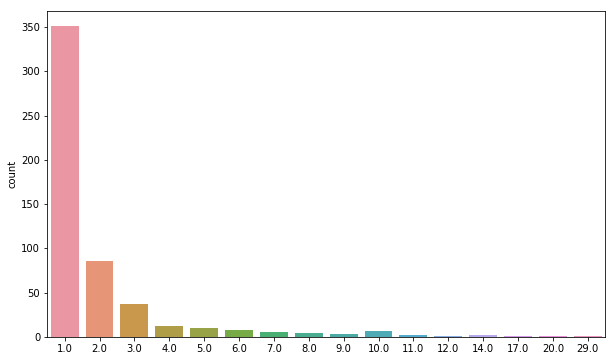

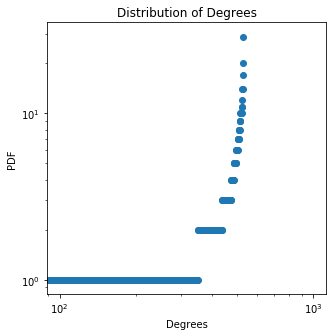

The clustering coefficient is 0.004672897196261682
Node with highest degree is: 23 with a degree of: 29.0 , the mean is 2.0037735849056606 , the variance is 6.192438590245639
145
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6096578281998554
number of closed triangles is 1
number of open triangles is 202
average distance is 0.6518024715821098


<Figure size 432x288 with 0 Axes>

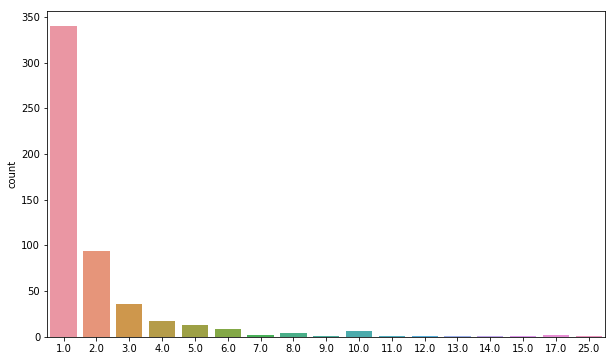

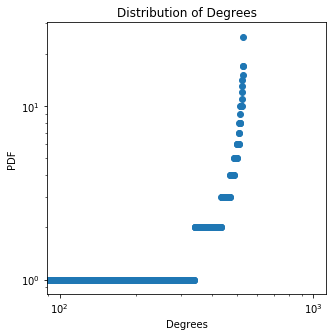

The clustering coefficient is 0.0049504950495049506
Node with highest degree is: 2 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.520740477038091
144
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6206098066993758
number of closed triangles is 1
number of open triangles is 166
average distance is 0.6700909515684209


<Figure size 432x288 with 0 Axes>

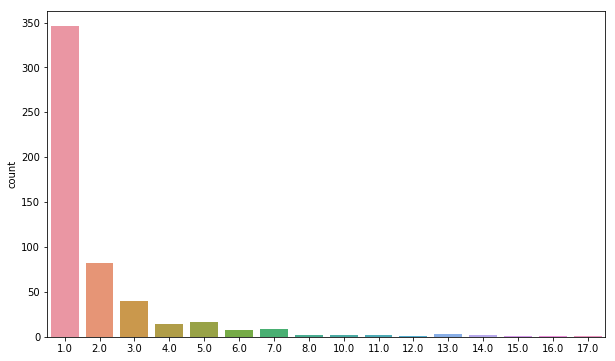

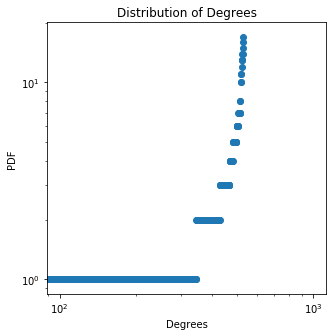

The clustering coefficient is 0.006024096385542169
Node with highest degree is: 27 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 4.984891420434319
143
number of closed triangles is 1
number of open triangles is 0
average distance is 0.699603019648337
number of closed triangles is 1
number of open triangles is 220
average distance is 0.6584067068710933


<Figure size 432x288 with 0 Axes>

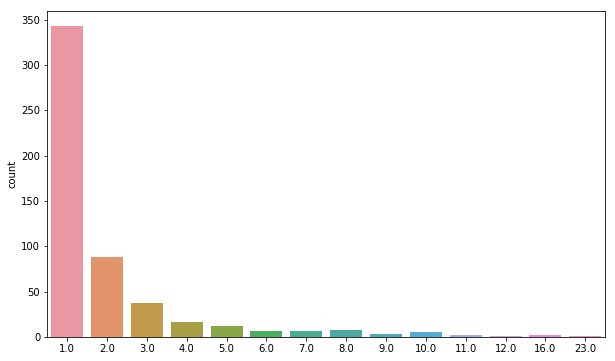

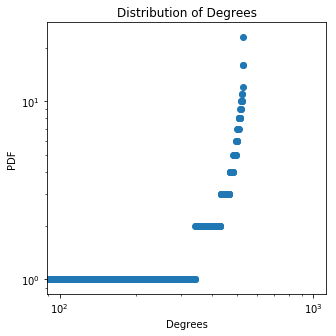

The clustering coefficient is 0.004545454545454545
Node with highest degree is: 29 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 4.9962121751513
142
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7058669829981381
number of closed triangles is 1
number of open triangles is 242
average distance is 0.664115166575207


<Figure size 432x288 with 0 Axes>

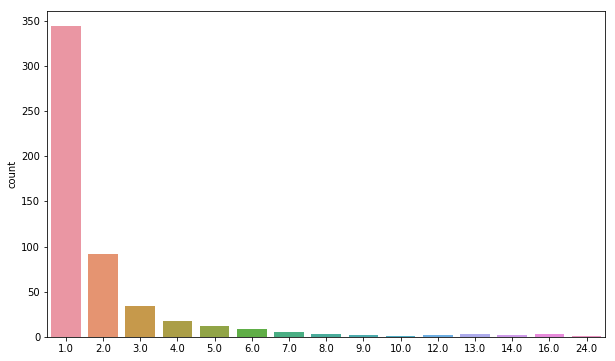

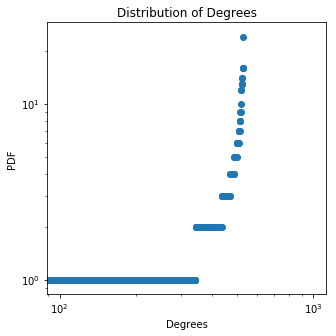

The clustering coefficient is 0.004132231404958678
Node with highest degree is: 24 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.690551797792809
141
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6729227531003042
number of closed triangles is 1
number of open triangles is 168
average distance is 0.69416643099645


<Figure size 432x288 with 0 Axes>

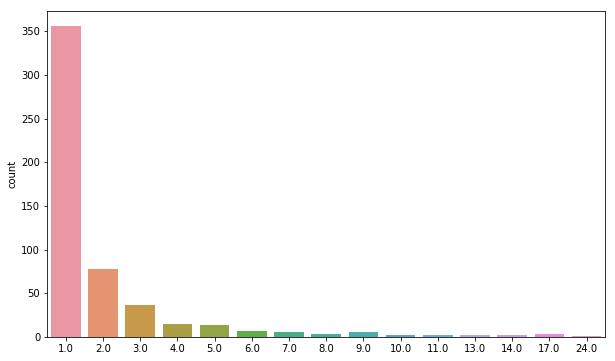

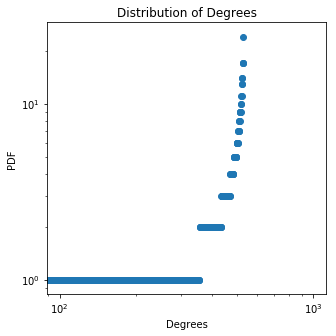

The clustering coefficient is 0.005952380952380952
Node with highest degree is: 17 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.920740477038093
140
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6640402974022053
number of closed triangles is 1
number of open triangles is 205
average distance is 0.6617771284479057


<Figure size 432x288 with 0 Axes>

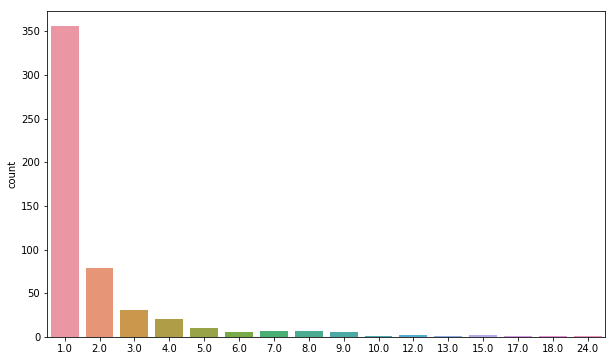

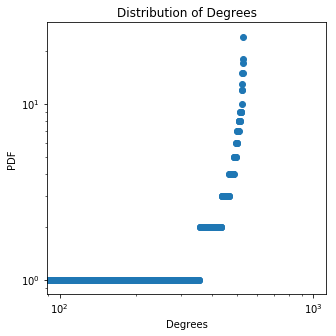

The clustering coefficient is 0.004878048780487805
Node with highest degree is: 12 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.747155571377714
139
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6773661174230696
number of closed triangles is 1
number of open triangles is 164
average distance is 0.6570441931645847


<Figure size 432x288 with 0 Axes>

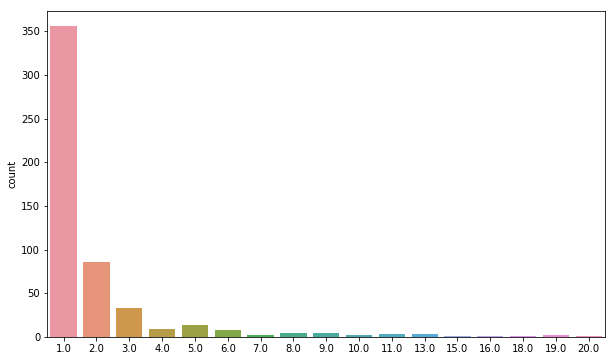

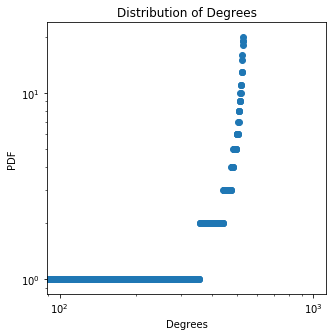

The clustering coefficient is 0.006097560975609756
Node with highest degree is: 29 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 6.275457458170167
138
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7613037262474639
number of closed triangles is 1
number of open triangles is 148
average distance is 0.6763668783445679


<Figure size 432x288 with 0 Axes>

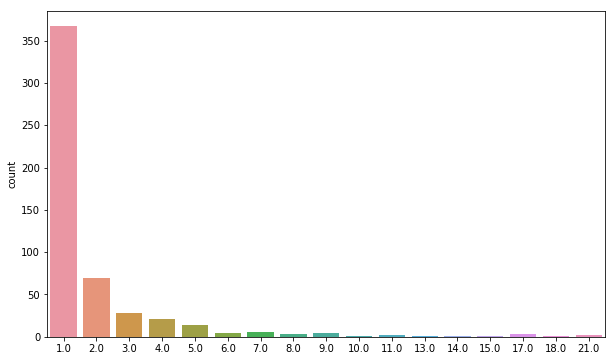

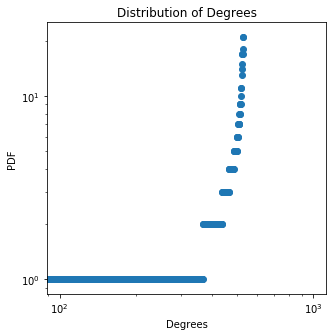

The clustering coefficient is 0.006756756756756757
Node with highest degree is: 0 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 6.513193307226772
137
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5735628370433153
number of closed triangles is 1
number of open triangles is 181
average distance is 0.6314263040389528


<Figure size 432x288 with 0 Axes>

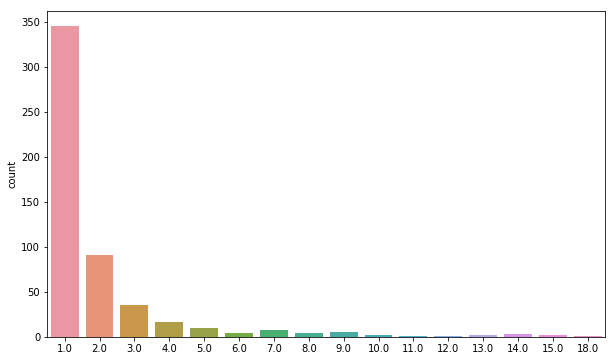

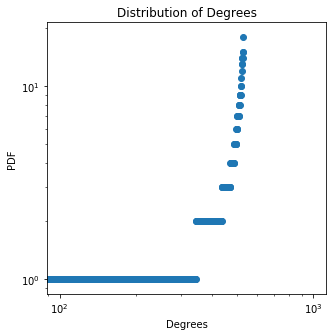

The clustering coefficient is 0.0055248618784530384
Node with highest degree is: 23 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.215080099679602
136
number of closed triangles is 1
number of open triangles is 0
average distance is 0.680596798335253
number of closed triangles is 1
number of open triangles is 247
average distance is 0.6492062377813579


<Figure size 432x288 with 0 Axes>

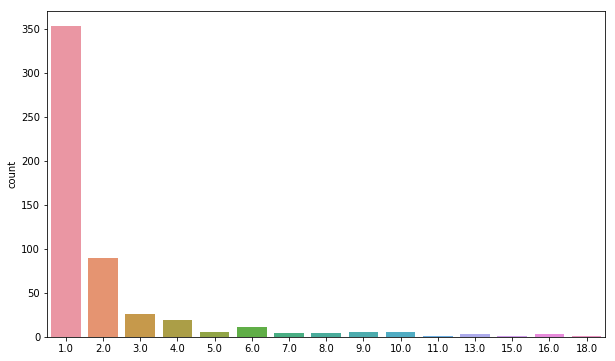

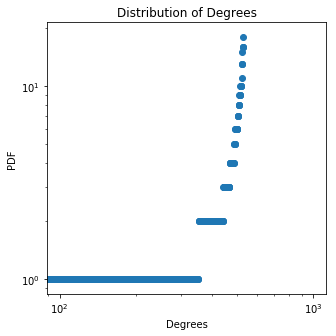

The clustering coefficient is 0.004048582995951417
Node with highest degree is: 50 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.550929156283375
135
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6090878170955026
number of closed triangles is 1
number of open triangles is 202
average distance is 0.6267899223759984


<Figure size 432x288 with 0 Axes>

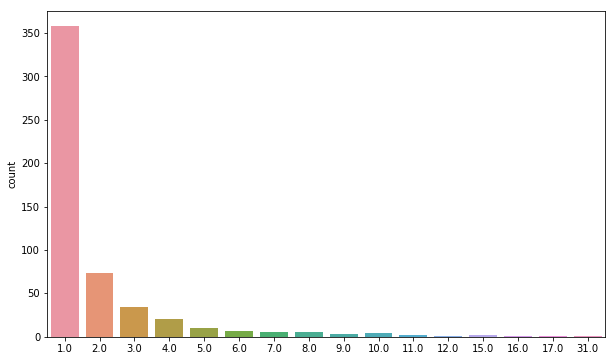

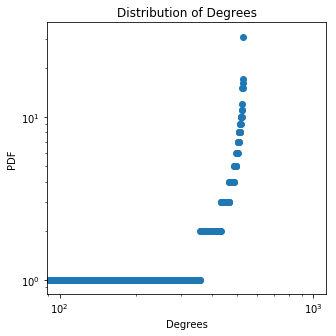

The clustering coefficient is 0.0049504950495049506
Node with highest degree is: 9 with a degree of: 31.0 , the mean is 2.0037735849056606 , the variance is 6.196212175151299
134
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6933902537131879
number of closed triangles is 1
number of open triangles is 168
average distance is 0.6676747164845449


<Figure size 432x288 with 0 Axes>

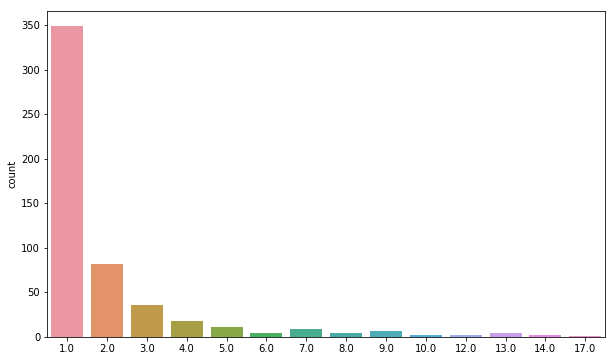

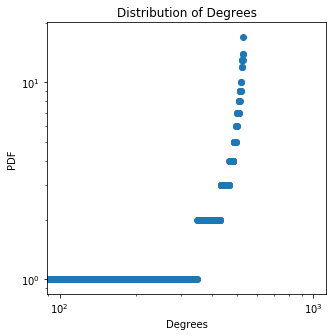

The clustering coefficient is 0.005952380952380952
Node with highest degree is: 27 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 4.920740477038092
133
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6384050755295834
number of closed triangles is 1
number of open triangles is 191
average distance is 0.6668279680812313


<Figure size 432x288 with 0 Axes>

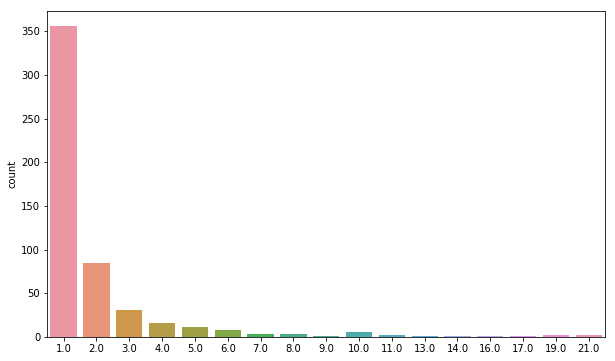

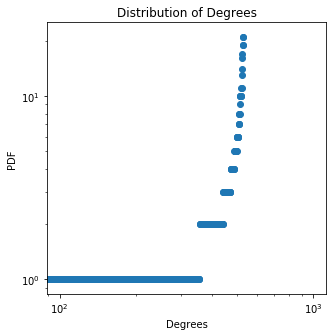

The clustering coefficient is 0.005235602094240838
Node with highest degree is: 13 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 6.49432538269847
132
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6203747099522857
number of closed triangles is 1
number of open triangles is 218
average distance is 0.658869986147163


<Figure size 432x288 with 0 Axes>

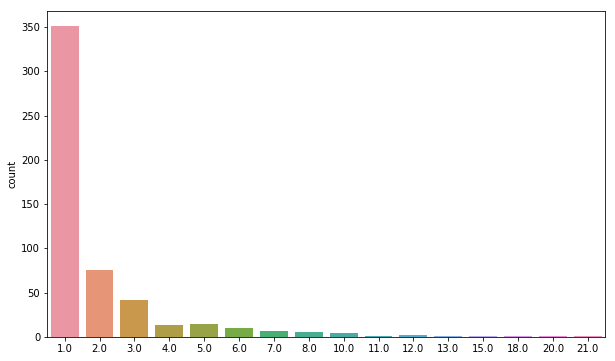

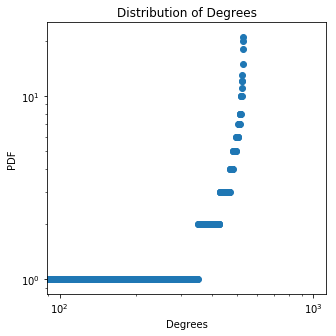

The clustering coefficient is 0.0045871559633027525
Node with highest degree is: 1 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.384891420434318
131
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6151019817446105
number of closed triangles is 1
number of open triangles is 221
average distance is 0.663214480034475


<Figure size 432x288 with 0 Axes>

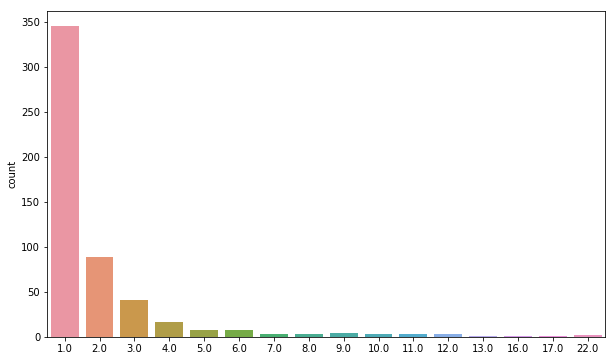

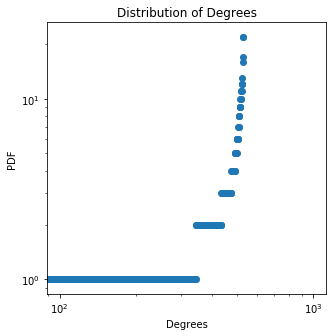

The clustering coefficient is 0.004524886877828055
Node with highest degree is: 2 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.830174439302242
130
number of closed triangles is 1
number of open triangles is 0
average distance is 0.758201179221543
number of closed triangles is 1
number of open triangles is 219
average distance is 0.6757407146809606


<Figure size 432x288 with 0 Axes>

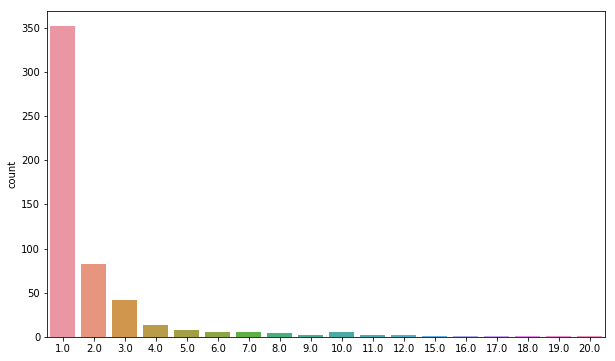

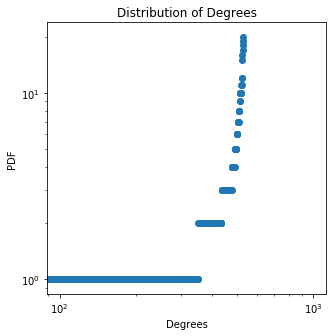

The clustering coefficient is 0.0045662100456621
Node with highest degree is: 25 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.981117835528658
129
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5782651861470811
number of closed triangles is 1
number of open triangles is 160
average distance is 0.6073309774390179


<Figure size 432x288 with 0 Axes>

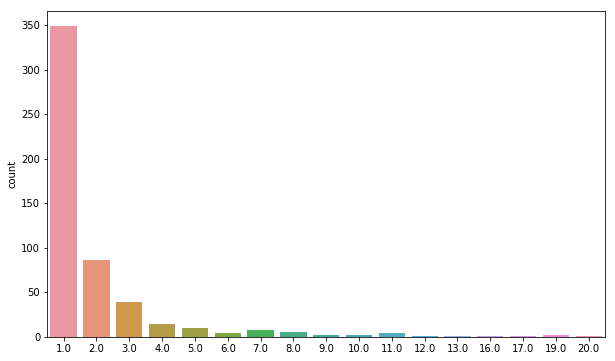

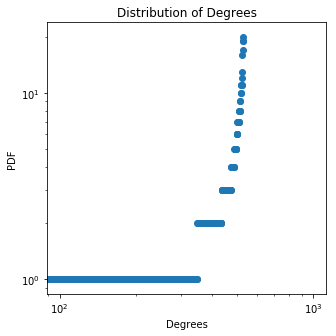

The clustering coefficient is 0.00625
Node with highest degree is: 27 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.7962121751513
128
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6014074354986205
number of closed triangles is 1
number of open triangles is 181
average distance is 0.629198457029202


<Figure size 432x288 with 0 Axes>

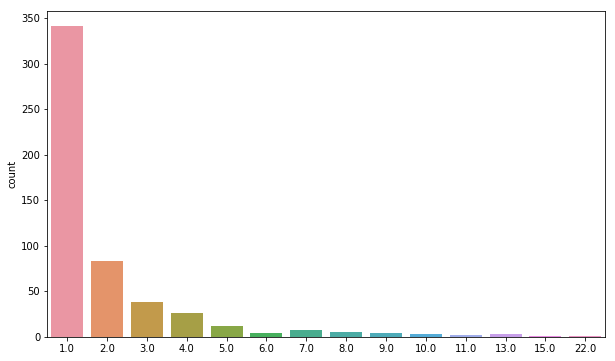

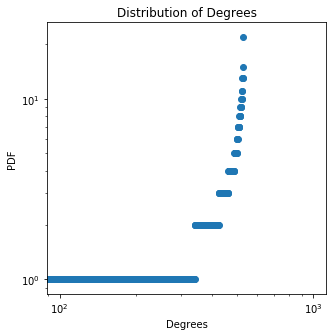

The clustering coefficient is 0.0055248618784530384
Node with highest degree is: 16 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 4.70187255250979
127
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6925070962810618
number of closed triangles is 1
number of open triangles is 199
average distance is 0.6557427175179337


<Figure size 432x288 with 0 Axes>

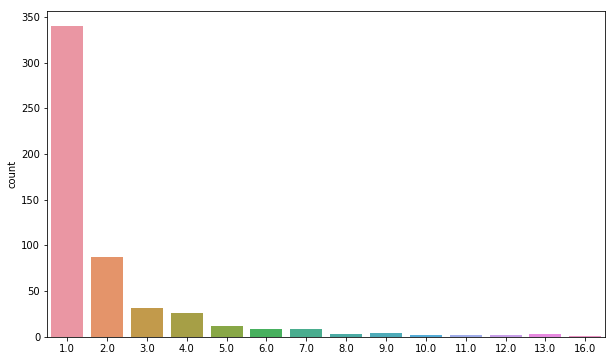

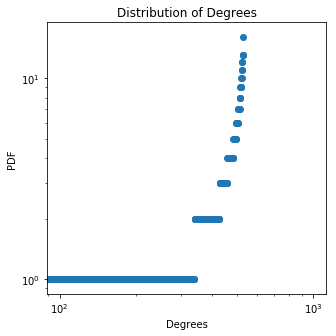

The clustering coefficient is 0.005025125628140704
Node with highest degree is: 23 with a degree of: 16.0 , the mean is 2.0037735849056606 , the variance is 4.30187255250979
126
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6911197858154955
number of closed triangles is 1
number of open triangles is 214
average distance is 0.6764276253634368


<Figure size 432x288 with 0 Axes>

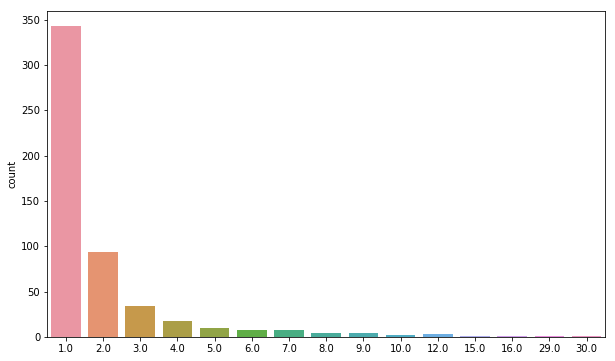

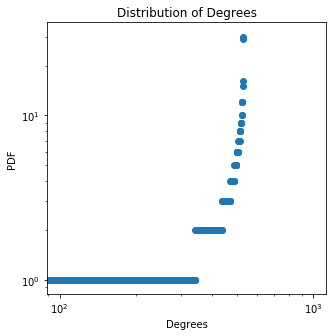

The clustering coefficient is 0.004672897196261682
Node with highest degree is: 25 with a degree of: 30.0 , the mean is 2.0037735849056606 , the variance is 6.573570665717337
125
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6570205843268894
number of closed triangles is 1
number of open triangles is 195
average distance is 0.6637662209948696


<Figure size 432x288 with 0 Axes>

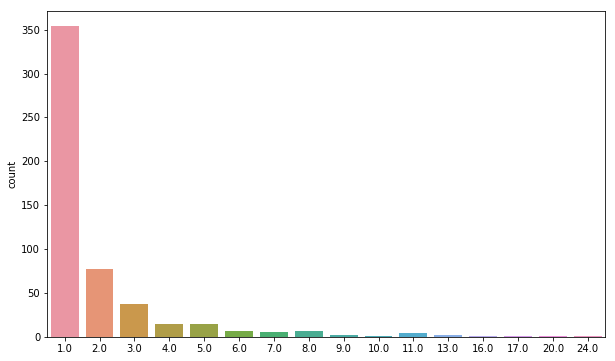

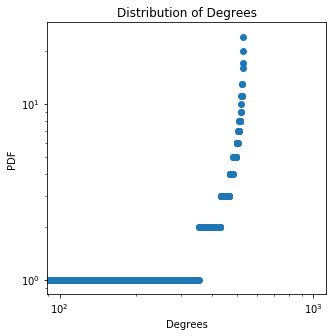

The clustering coefficient is 0.005128205128205128
Node with highest degree is: 26 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.720740477038093
124
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6215622060496481
number of closed triangles is 1
number of open triangles is 234
average distance is 0.6586139263224082


<Figure size 432x288 with 0 Axes>

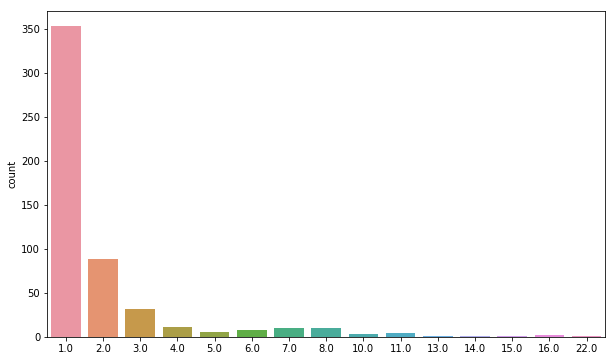

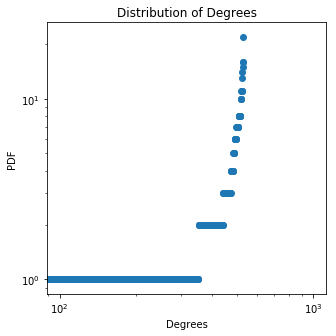

The clustering coefficient is 0.004273504273504274
Node with highest degree is: 16 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.573570665717338
123
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6772408261343674
number of closed triangles is 1
number of open triangles is 196
average distance is 0.6788758764152345


<Figure size 432x288 with 0 Axes>

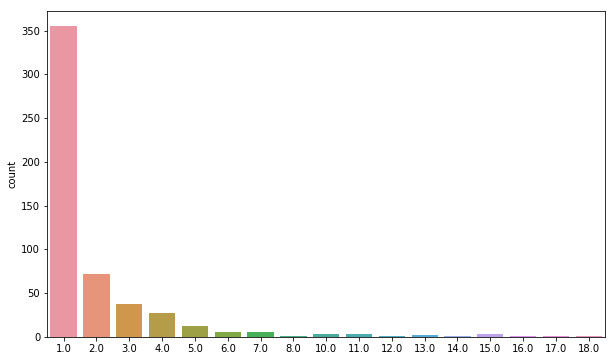

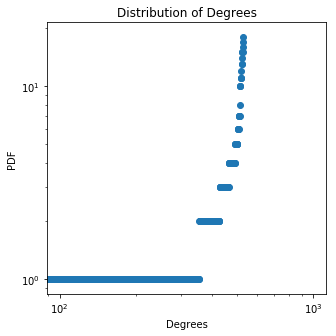

The clustering coefficient is 0.00510204081632653
Node with highest degree is: 30 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.573570665717337
122
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5813550032011963
number of closed triangles is 1
number of open triangles is 160
average distance is 0.6541838313945474


<Figure size 432x288 with 0 Axes>

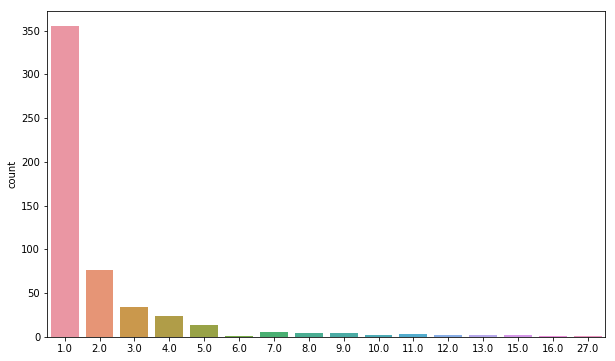

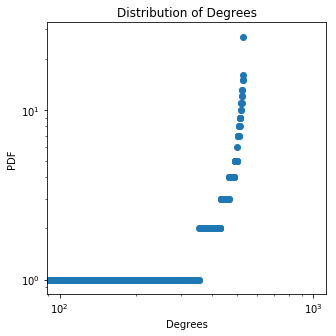

The clustering coefficient is 0.00625
Node with highest degree is: 4 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 5.811306514773942
121
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5770115375191628
number of closed triangles is 1
number of open triangles is 208
average distance is 0.619632322335384


<Figure size 432x288 with 0 Axes>

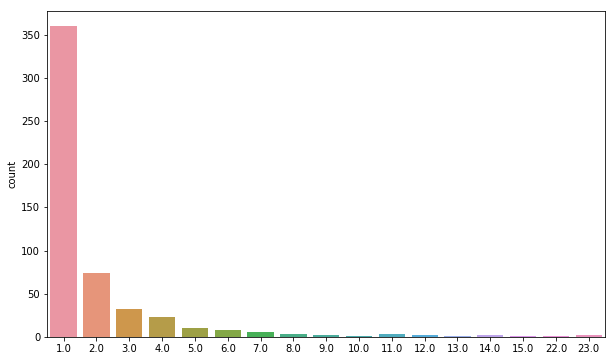

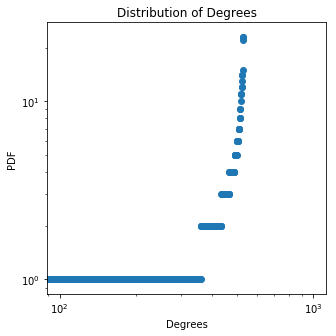

The clustering coefficient is 0.004807692307692308
Node with highest degree is: 15 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 6.415080099679602
120
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6631966811112662
number of closed triangles is 1
number of open triangles is 170
average distance is 0.6510185139021237


<Figure size 432x288 with 0 Axes>

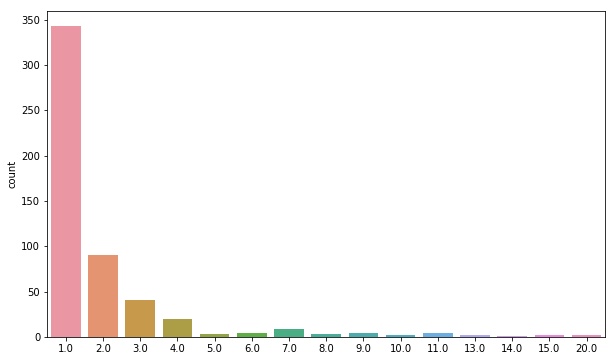

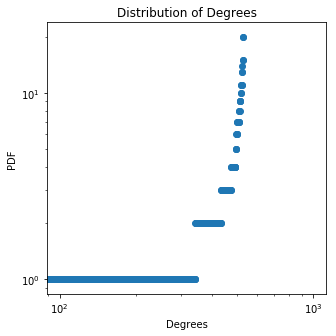

The clustering coefficient is 0.0058823529411764705
Node with highest degree is: 1 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.48677821288715
119
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6403610712657885
number of closed triangles is 1
number of open triangles is 180
average distance is 0.6595275905829172


<Figure size 432x288 with 0 Axes>

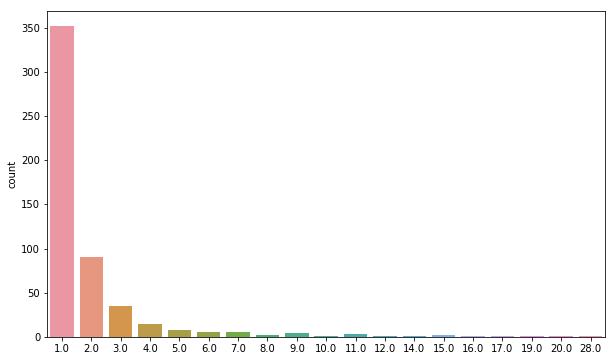

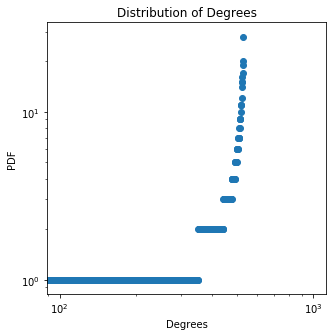

The clustering coefficient is 0.005555555555555556
Node with highest degree is: 28 with a degree of: 28.0 , the mean is 2.0037735849056606 , the variance is 6.845268778924884
118
number of closed triangles is 1
number of open triangles is 0
average distance is 0.663463620008417
number of closed triangles is 1
number of open triangles is 186
average distance is 0.639561156352791


<Figure size 432x288 with 0 Axes>

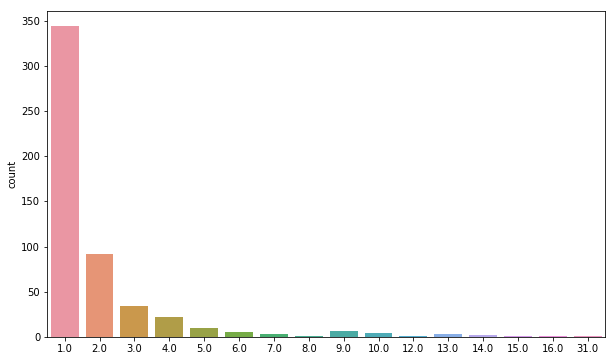

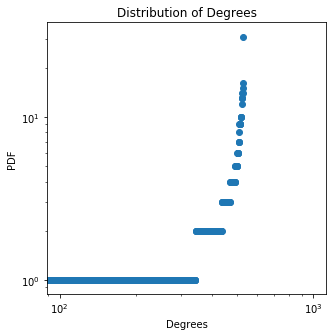

The clustering coefficient is 0.005376344086021506
Node with highest degree is: 27 with a degree of: 31.0 , the mean is 2.0037735849056606 , the variance is 6.139608401566393
117
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6289635041851455
number of closed triangles is 1
number of open triangles is 222
average distance is 0.6743548464297657


<Figure size 432x288 with 0 Axes>

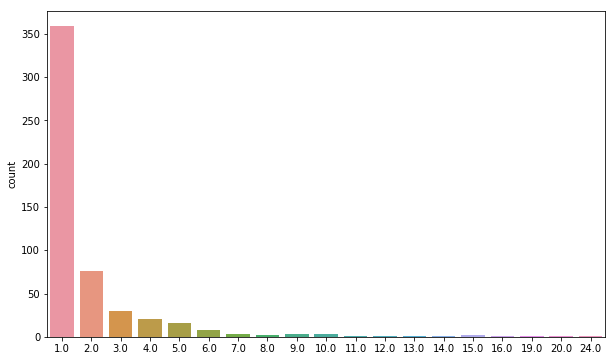

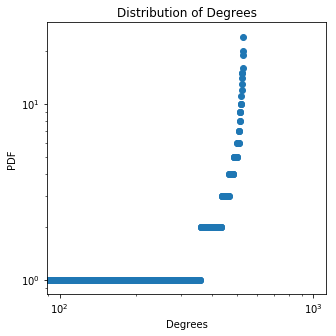

The clustering coefficient is 0.0045045045045045045
Node with highest degree is: 19 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.233948024207902
116
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5854413675031968
number of closed triangles is 1
number of open triangles is 201
average distance is 0.6573933903000949


<Figure size 432x288 with 0 Axes>

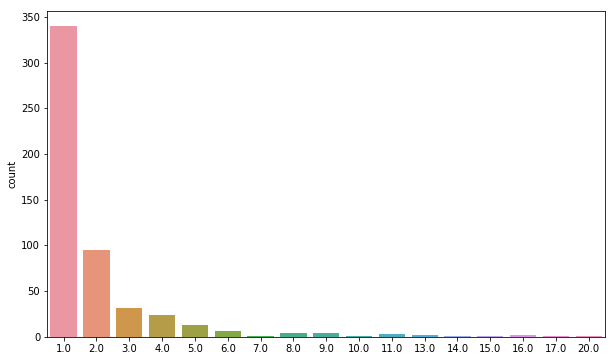

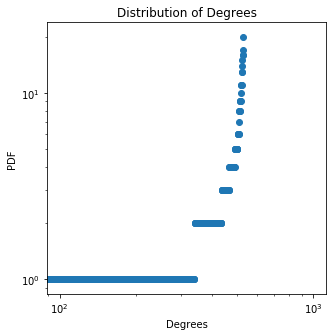

The clustering coefficient is 0.004975124378109453
Node with highest degree is: 12 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.373570665717338
115
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6303262893091578
number of closed triangles is 1
number of open triangles is 262
average distance is 0.6509556837328622


<Figure size 432x288 with 0 Axes>

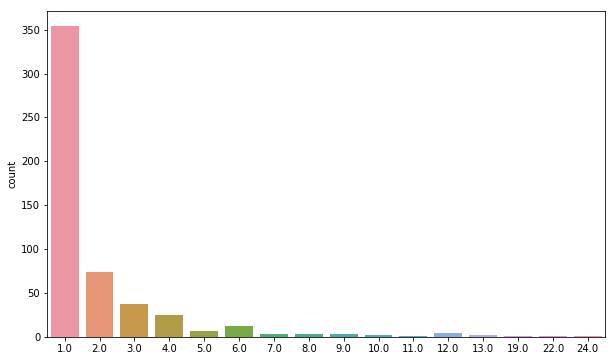

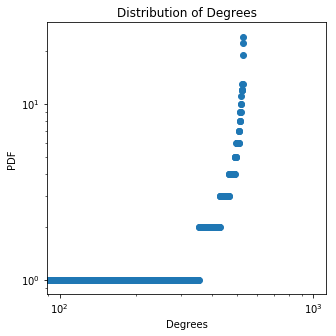

The clustering coefficient is 0.003816793893129771
Node with highest degree is: 62 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.849042363830543
114
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6515962608450354
number of closed triangles is 1
number of open triangles is 215
average distance is 0.666803921191299


<Figure size 432x288 with 0 Axes>

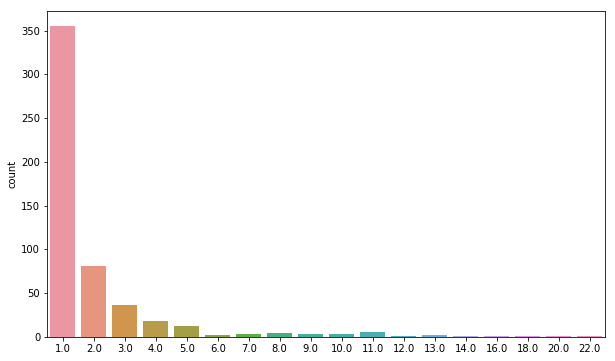

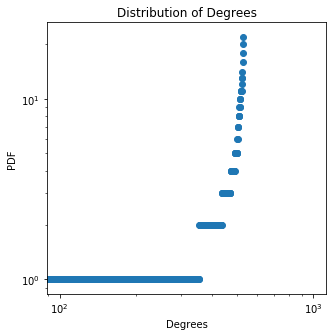

The clustering coefficient is 0.004651162790697674
Node with highest degree is: 5 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 6.090551797792809
113
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6596848122980232
number of closed triangles is 1
number of open triangles is 253
average distance is 0.677503335497516


<Figure size 432x288 with 0 Axes>

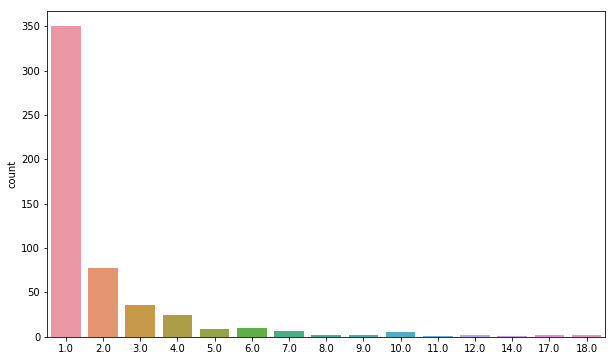

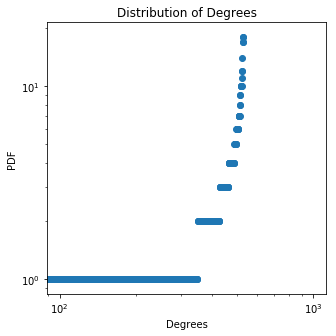

The clustering coefficient is 0.003952569169960474
Node with highest degree is: 10 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.196212175151299
112
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6079999720279877
number of closed triangles is 1
number of open triangles is 133
average distance is 0.6572872635959109


<Figure size 432x288 with 0 Axes>

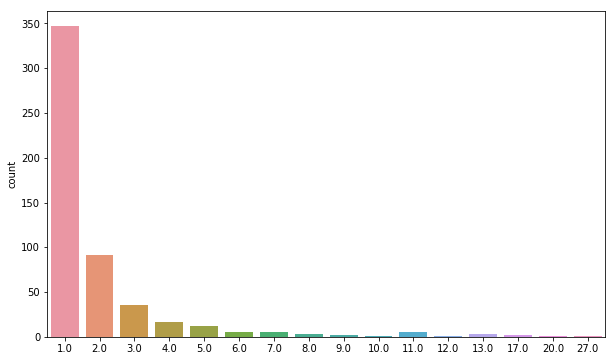

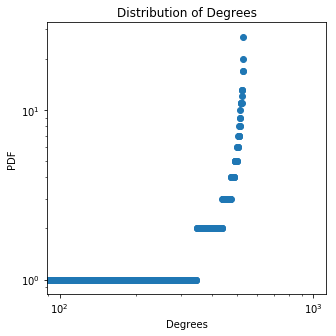

The clustering coefficient is 0.007518796992481203
Node with highest degree is: 27 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 6.218853684585262
111
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7329321212041994
number of closed triangles is 1
number of open triangles is 177
average distance is 0.6840832653664135


<Figure size 432x288 with 0 Axes>

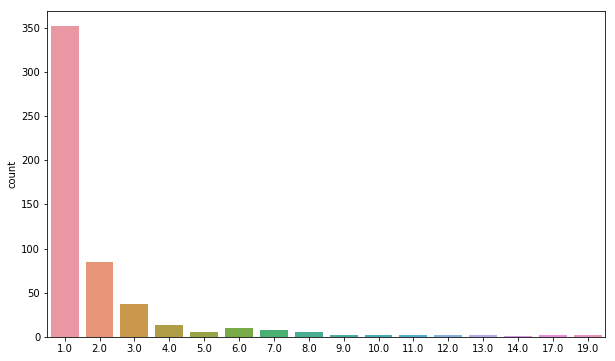

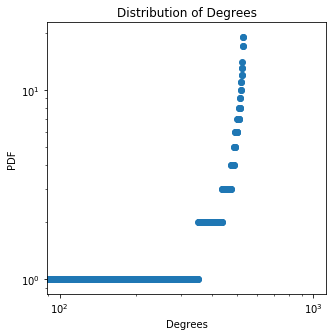

The clustering coefficient is 0.005649717514124294
Node with highest degree is: 0 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.713193307226771
110
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6321398885336922
number of closed triangles is 1
number of open triangles is 187
average distance is 0.6514355502585846


<Figure size 432x288 with 0 Axes>

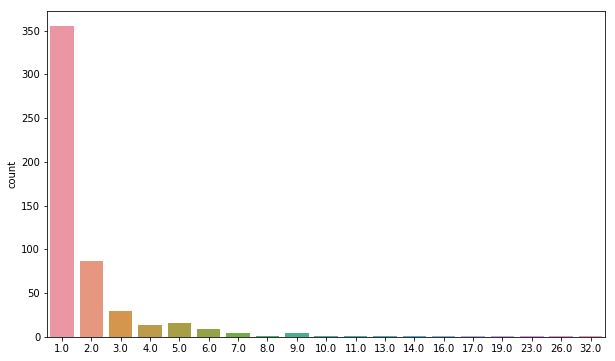

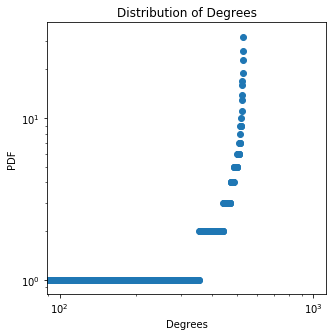

The clustering coefficient is 0.0053475935828877
Node with highest degree is: 22 with a degree of: 32.0 , the mean is 2.0037735849056606 , the variance is 7.732061231755072
109
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6053328469595026
number of closed triangles is 1
number of open triangles is 197
average distance is 0.6469684363927017


<Figure size 432x288 with 0 Axes>

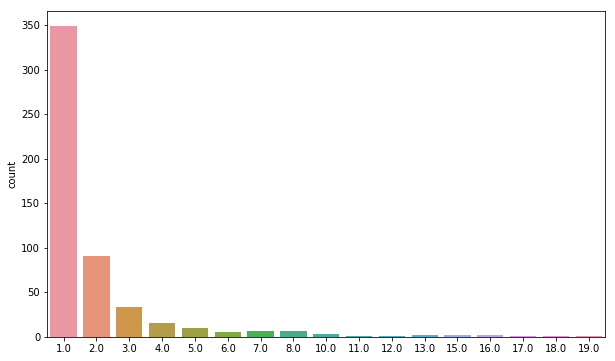

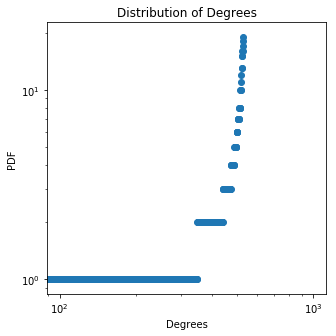

The clustering coefficient is 0.005076142131979695
Node with highest degree is: 6 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.883004627981489
108
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7320438518004778
number of closed triangles is 1
number of open triangles is 166
average distance is 0.6702245280230739


<Figure size 432x288 with 0 Axes>

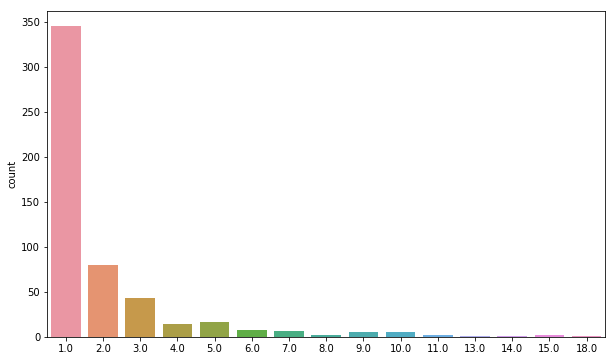

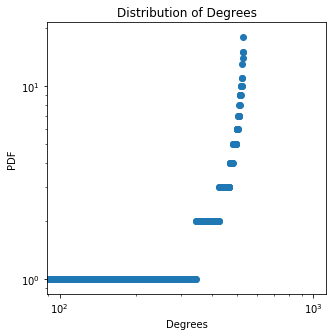

The clustering coefficient is 0.006024096385542169
Node with highest degree is: 48 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 4.732061231755074
107
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6954176614470756
number of closed triangles is 1
number of open triangles is 261
average distance is 0.673839109188409


<Figure size 432x288 with 0 Axes>

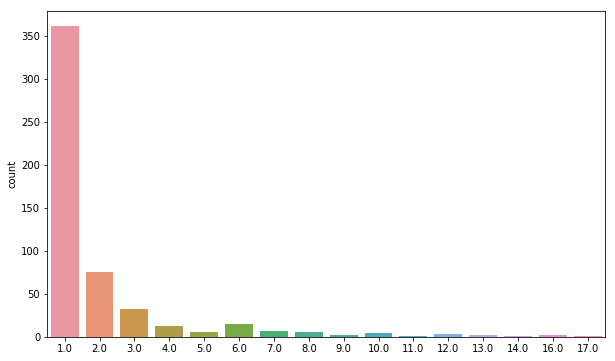

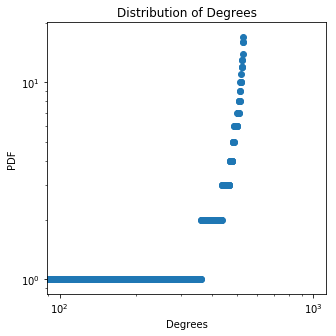

The clustering coefficient is 0.0038314176245210726
Node with highest degree is: 7 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 5.343381986472054
106
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6783380231338578
number of closed triangles is 1
number of open triangles is 205
average distance is 0.6854544185701901


<Figure size 432x288 with 0 Axes>

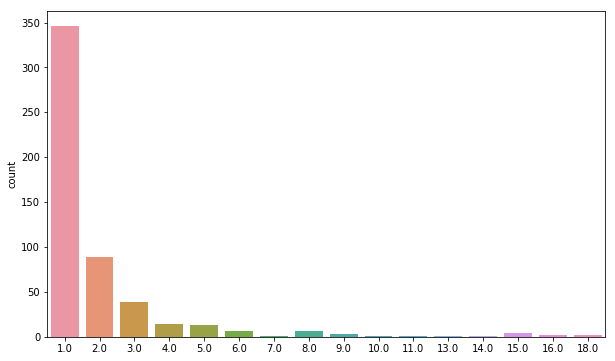

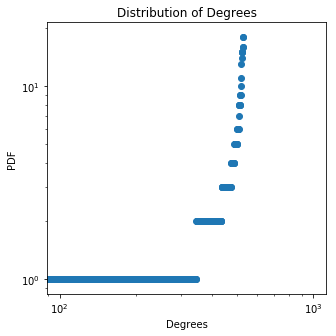

The clustering coefficient is 0.004878048780487805
Node with highest degree is: 0 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.750929156283376
105
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6312596089620264
number of closed triangles is 1
number of open triangles is 195
average distance is 0.6462150809388115


<Figure size 432x288 with 0 Axes>

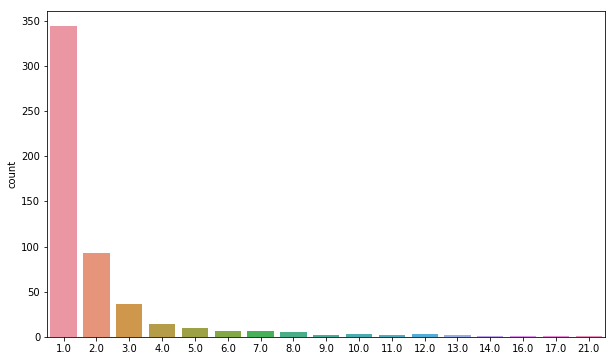

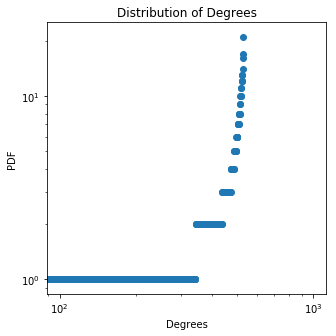

The clustering coefficient is 0.005128205128205128
Node with highest degree is: 19 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.418853684585263
104
number of closed triangles is 1
number of open triangles is 0
average distance is 0.620545321586701
number of closed triangles is 1
number of open triangles is 229
average distance is 0.6478875689115022


<Figure size 432x288 with 0 Axes>

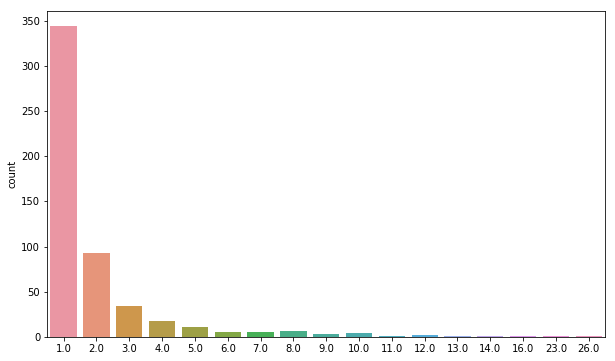

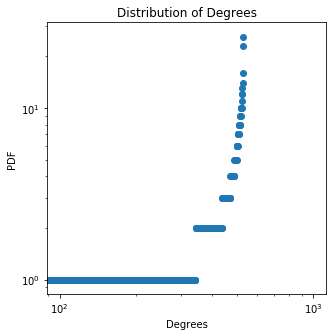

The clustering coefficient is 0.004366812227074236
Node with highest degree is: 27 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 5.901872552509791
103
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7115509161539445
number of closed triangles is 1
number of open triangles is 206
average distance is 0.6703995247969496


<Figure size 432x288 with 0 Axes>

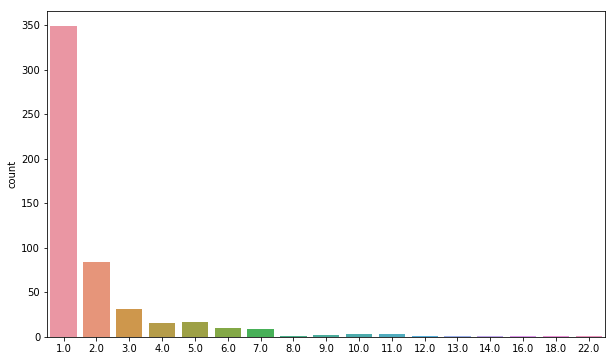

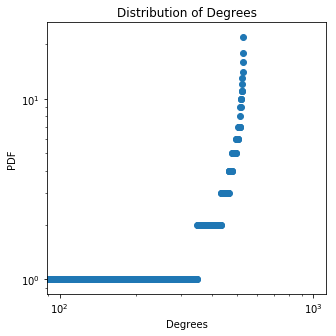

The clustering coefficient is 0.0048543689320388345
Node with highest degree is: 15 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.215080099679602
102
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6243233955623493
number of closed triangles is 1
number of open triangles is 287
average distance is 0.6507254077225237


<Figure size 432x288 with 0 Axes>

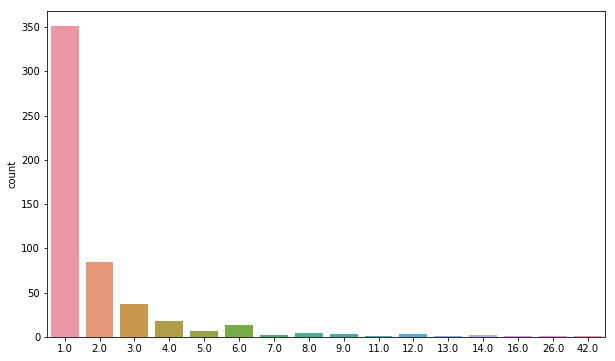

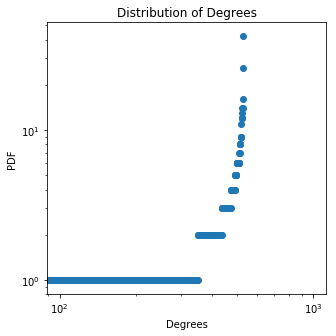

The clustering coefficient is 0.003484320557491289
Node with highest degree is: 4 with a degree of: 42.0 , the mean is 2.0037735849056606 , the variance is 7.9886650053399775
101
number of closed triangles is 1
number of open triangles is 0
average distance is 0.806401393692093
number of closed triangles is 1
number of open triangles is 200
average distance is 0.6884200471730254


<Figure size 432x288 with 0 Axes>

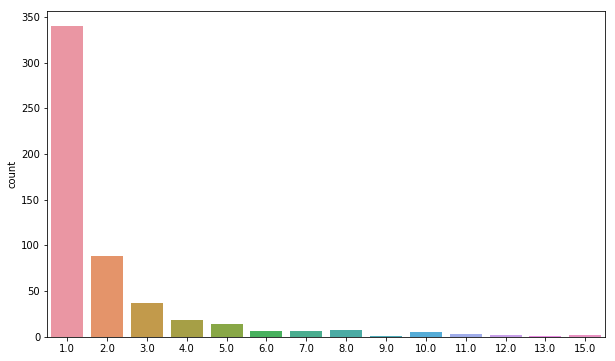

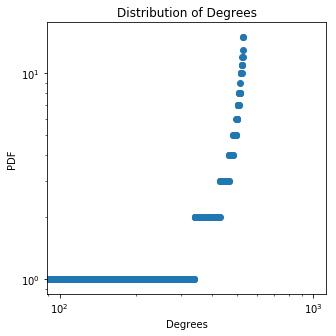

The clustering coefficient is 0.005
Node with highest degree is: 2 with a degree of: 15.0 , the mean is 2.0037735849056606 , the variance is 4.422627269490922
100
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6686849502304015
number of closed triangles is 1
number of open triangles is 205
average distance is 0.6891802795622399


<Figure size 432x288 with 0 Axes>

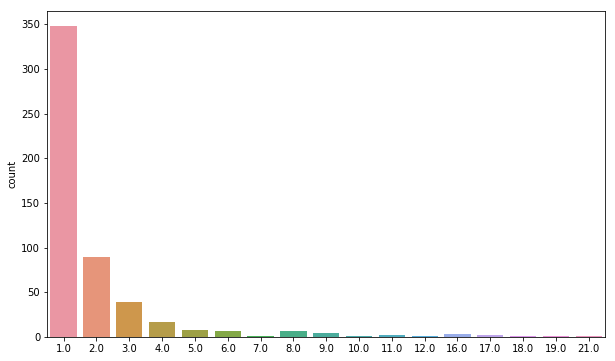

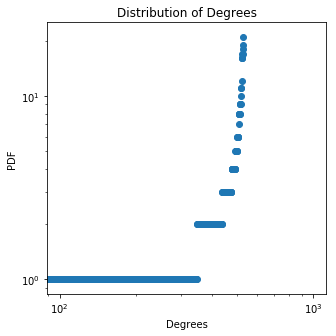

The clustering coefficient is 0.004878048780487805
Node with highest degree is: 16 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 6.283004627981488
99
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6222885004871004
number of closed triangles is 1
number of open triangles is 250
average distance is 0.684533394894375


<Figure size 432x288 with 0 Axes>

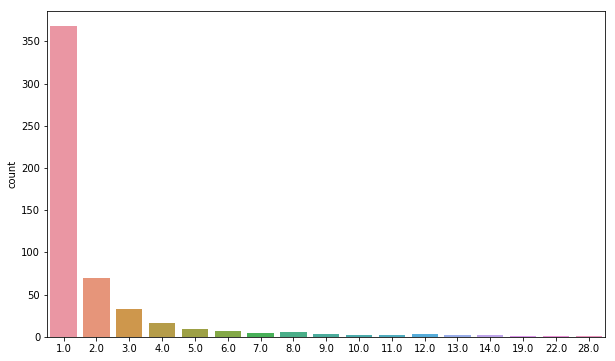

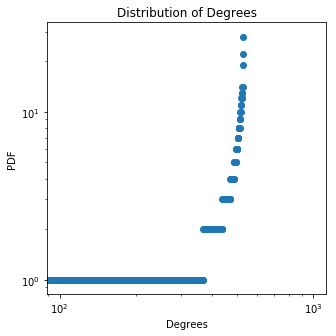

The clustering coefficient is 0.004
Node with highest degree is: 8 with a degree of: 28.0 , the mean is 2.0037735849056606 , the variance is 6.80375934496262
98
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6813221633545873
number of closed triangles is 1
number of open triangles is 196
average distance is 0.6488548273571317


<Figure size 432x288 with 0 Axes>

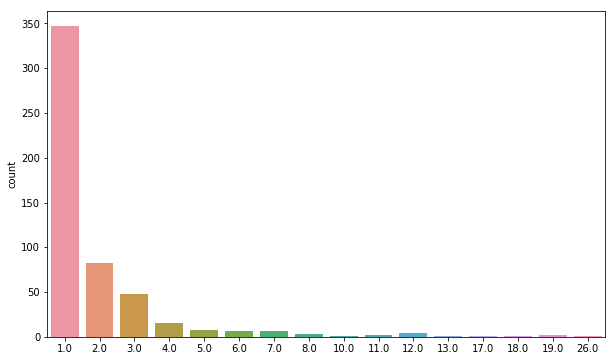

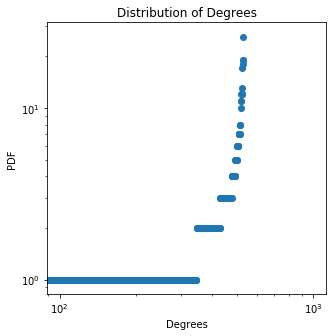

The clustering coefficient is 0.00510204081632653
Node with highest degree is: 25 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 6.233948024207904
97
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5911699431627805
number of closed triangles is 1
number of open triangles is 209
average distance is 0.6435938589148674


<Figure size 432x288 with 0 Axes>

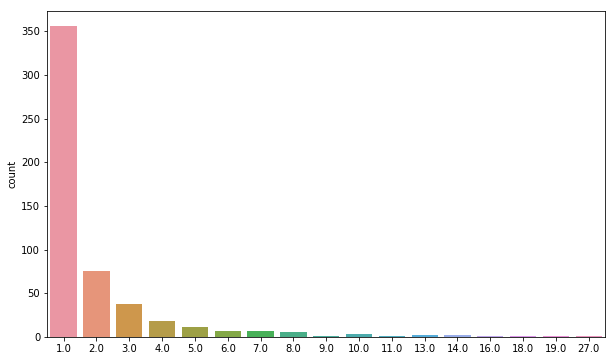

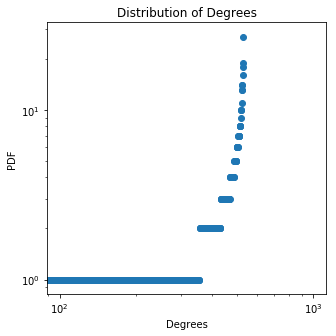

The clustering coefficient is 0.004784688995215311
Node with highest degree is: 20 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 6.132061231755073
96
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6935650308873604
number of closed triangles is 1
number of open triangles is 239
average distance is 0.6830431110797759


<Figure size 432x288 with 0 Axes>

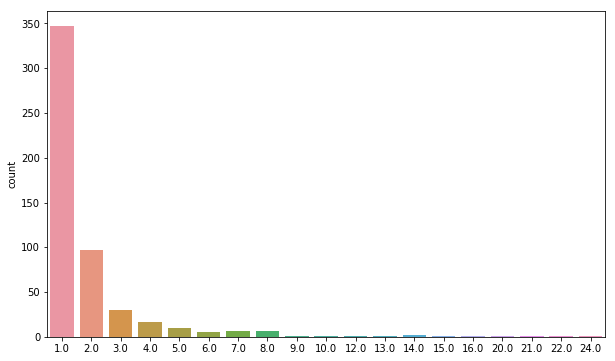

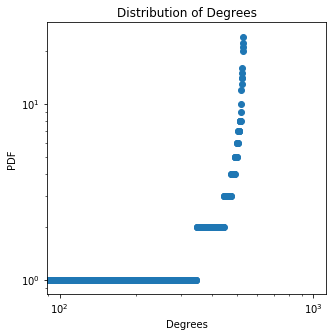

The clustering coefficient is 0.0041841004184100415
Node with highest degree is: 21 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.713193307226772
95
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6481725205337057
number of closed triangles is 1
number of open triangles is 185
average distance is 0.6707619217751853


<Figure size 432x288 with 0 Axes>

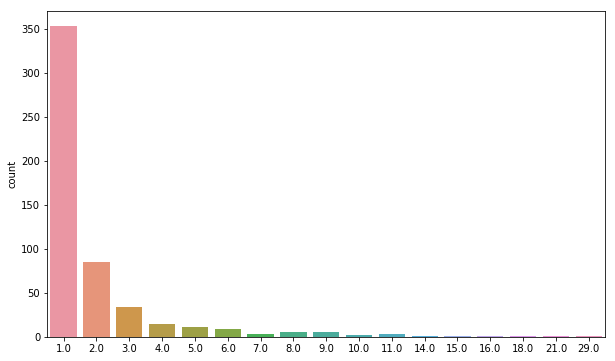

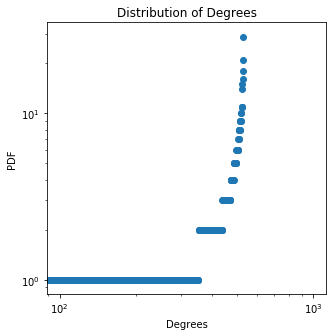

The clustering coefficient is 0.005405405405405406
Node with highest degree is: 16 with a degree of: 29.0 , the mean is 2.0037735849056606 , the variance is 6.437721609113564
94
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6735441734833114
number of closed triangles is 1
number of open triangles is 221
average distance is 0.6483988854389932


<Figure size 432x288 with 0 Axes>

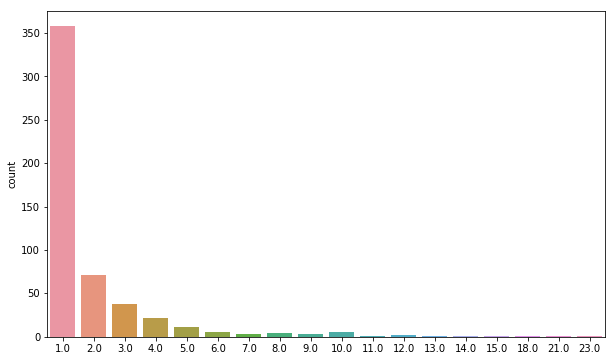

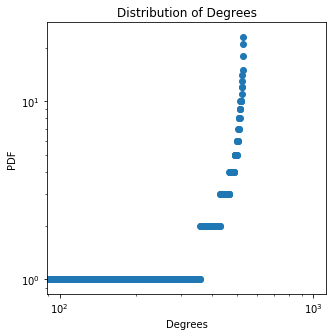

The clustering coefficient is 0.004524886877828055
Node with highest degree is: 18 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.920740477038091
93
number of closed triangles is 1
number of open triangles is 0
average distance is 0.684043699081918
number of closed triangles is 1
number of open triangles is 172
average distance is 0.6657810094207378


<Figure size 432x288 with 0 Axes>

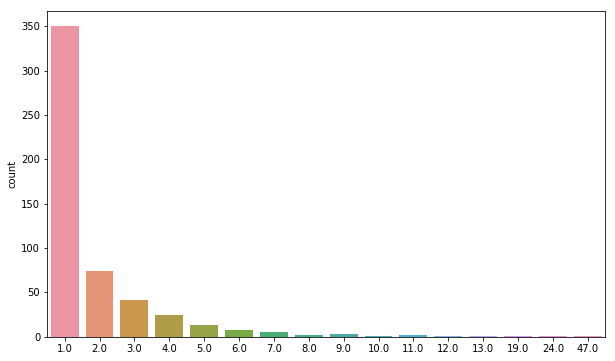

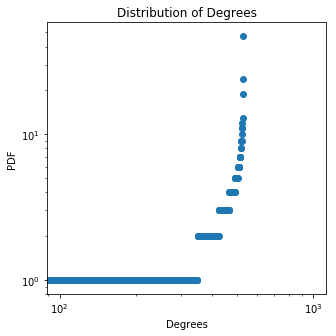

The clustering coefficient is 0.005813953488372093
Node with highest degree is: 27 with a degree of: 47.0 , the mean is 2.0037735849056606 , the variance is 8.162249911000359
92
number of closed triangles is 1
number of open triangles is 0
average distance is 0.70225725886962
number of closed triangles is 1
number of open triangles is 199
average distance is 0.6574113009099807


<Figure size 432x288 with 0 Axes>

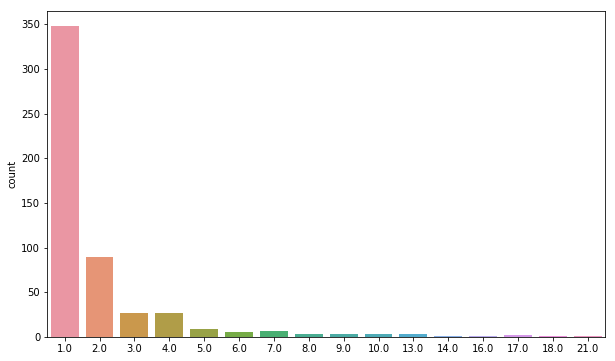

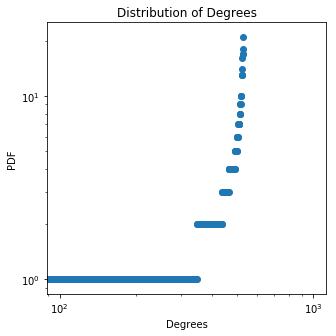

The clustering coefficient is 0.005025125628140704
Node with highest degree is: 13 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.728287646849413
91
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6608010743112857
number of closed triangles is 1
number of open triangles is 225
average distance is 0.6877618448662179


<Figure size 432x288 with 0 Axes>

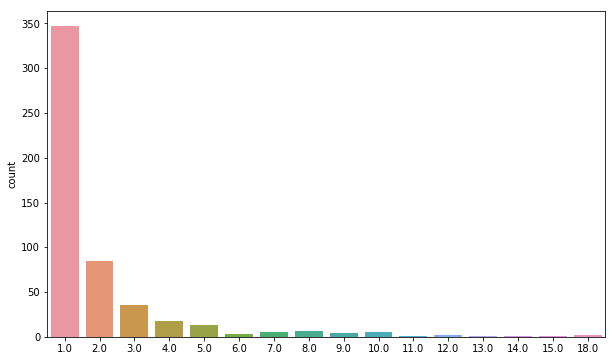

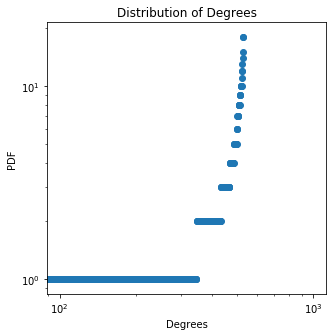

The clustering coefficient is 0.0044444444444444444
Node with highest degree is: 16 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.101872552509791
90
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5509953196374543
number of closed triangles is 1
number of open triangles is 148
average distance is 0.662407731074113


<Figure size 432x288 with 0 Axes>

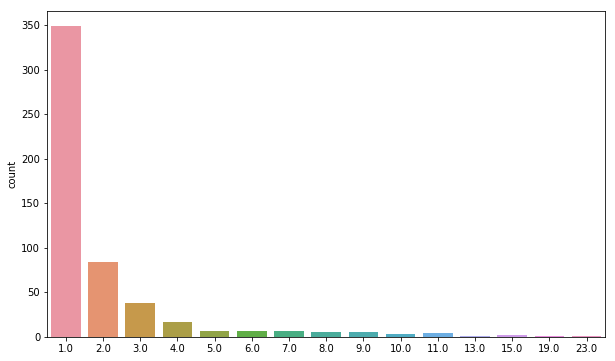

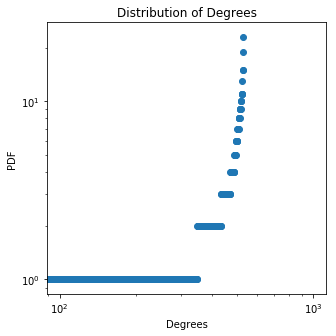

The clustering coefficient is 0.006756756756756757
Node with highest degree is: 12 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.4905517977928096
89
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6083966745854856
number of closed triangles is 1
number of open triangles is 190
average distance is 0.6499556121622099


<Figure size 432x288 with 0 Axes>

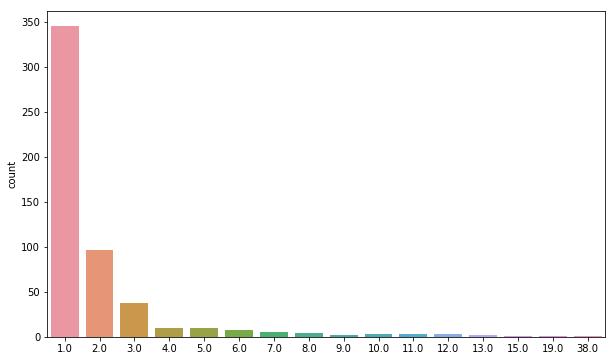

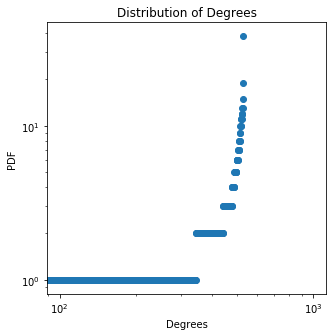

The clustering coefficient is 0.005263157894736842
Node with highest degree is: 10 with a degree of: 38.0 , the mean is 2.0037735849056606 , the variance is 7.022627269490923
88
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6416124069593763
number of closed triangles is 1
number of open triangles is 203
average distance is 0.6580556496709072


<Figure size 432x288 with 0 Axes>

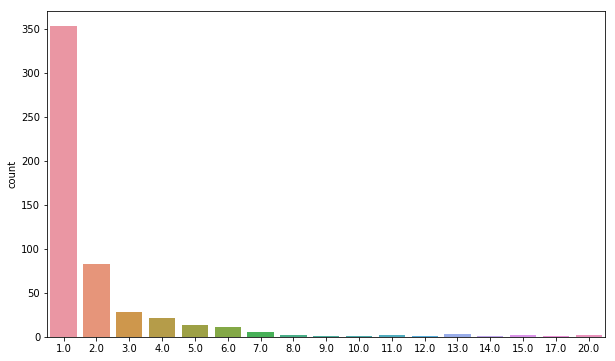

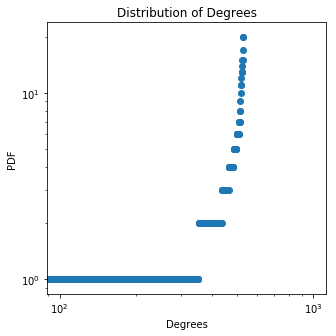

The clustering coefficient is 0.0049261083743842365
Node with highest degree is: 3 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.750929156283374
87
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6623407666078172
number of closed triangles is 1
number of open triangles is 154
average distance is 0.6427247718200447


<Figure size 432x288 with 0 Axes>

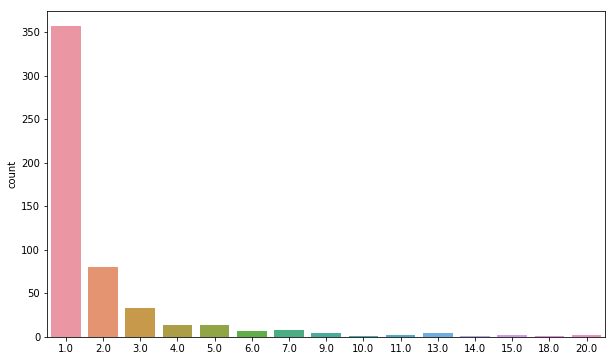

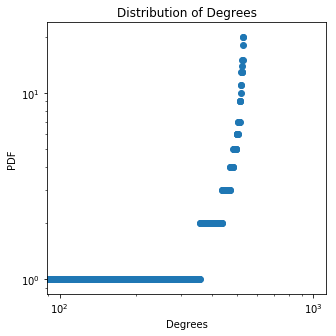

The clustering coefficient is 0.006493506493506494
Node with highest degree is: 0 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.992438590245639
86
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6033946271958092
number of closed triangles is 1
number of open triangles is 151
average distance is 0.6957552510473279


<Figure size 432x288 with 0 Axes>

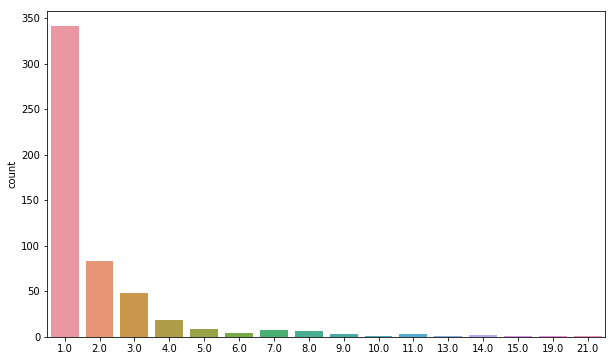

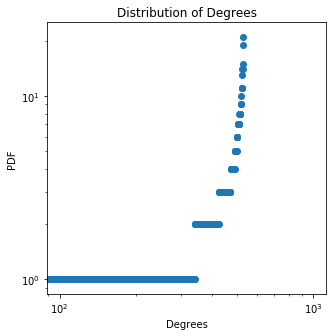

The clustering coefficient is 0.006622516556291391
Node with highest degree is: 24 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.10187255250979
85
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6792289389606523
number of closed triangles is 1
number of open triangles is 170
average distance is 0.6613666007694394


<Figure size 432x288 with 0 Axes>

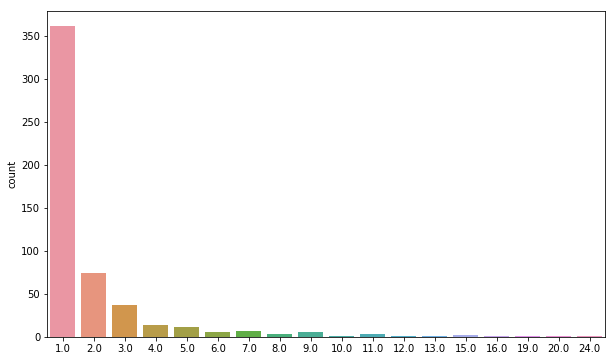

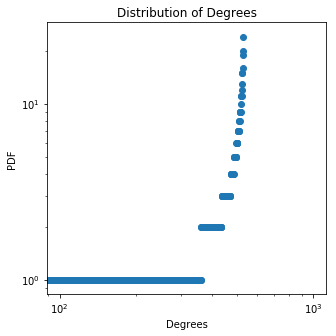

The clustering coefficient is 0.0058823529411764705
Node with highest degree is: 3 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.29432538269847
84
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6015442039872324
number of closed triangles is 1
number of open triangles is 200
average distance is 0.6786823005684385


<Figure size 432x288 with 0 Axes>

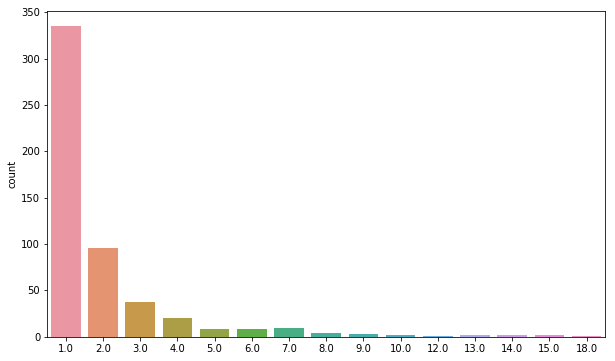

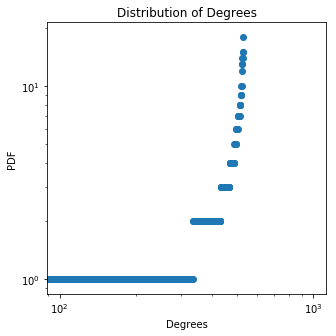

The clustering coefficient is 0.005
Node with highest degree is: 3 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 4.754702741189034
83
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6850877087210385
number of closed triangles is 1
number of open triangles is 209
average distance is 0.6702647422110963


<Figure size 432x288 with 0 Axes>

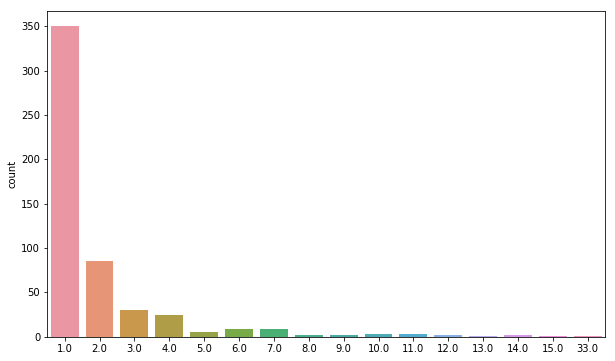

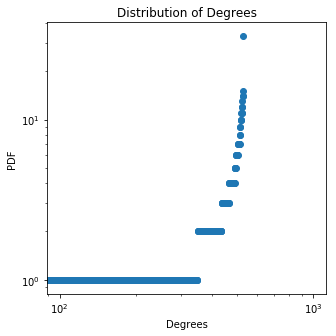

The clustering coefficient is 0.004784688995215311
Node with highest degree is: 29 with a degree of: 33.0 , the mean is 2.0037735849056606 , the variance is 6.10941972232111
82
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7549791653914553
number of closed triangles is 1
number of open triangles is 243
average distance is 0.6647221661838212


<Figure size 432x288 with 0 Axes>

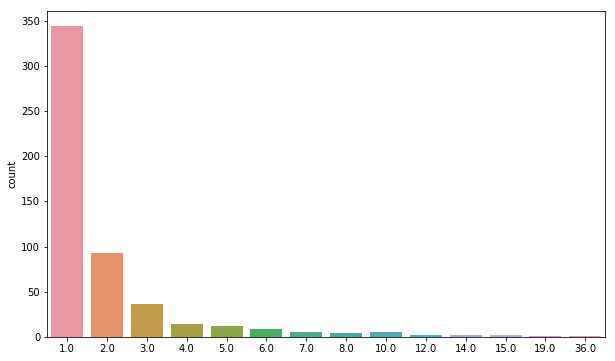

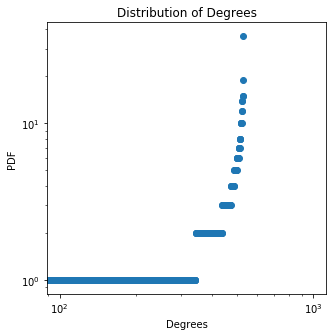

The clustering coefficient is 0.00411522633744856
Node with highest degree is: 13 with a degree of: 36.0 , the mean is 2.0037735849056606 , the variance is 6.6943253826984686
81
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6846568105514544
number of closed triangles is 1
number of open triangles is 211
average distance is 0.6537588205307969


<Figure size 432x288 with 0 Axes>

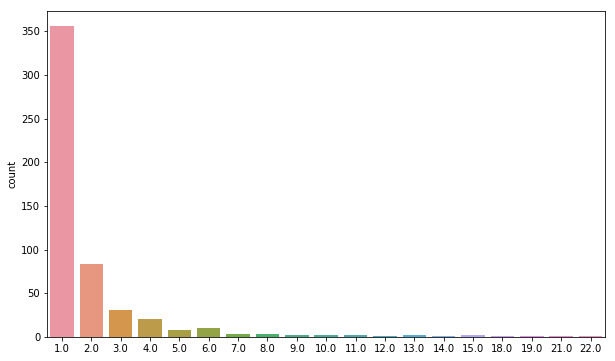

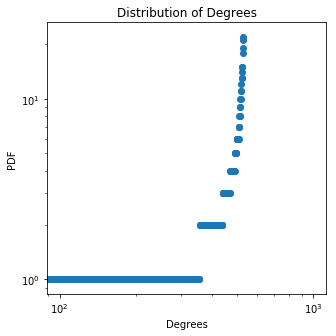

The clustering coefficient is 0.004739336492890996
Node with highest degree is: 14 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 6.4150800996796
80
number of closed triangles is 1
number of open triangles is 0
average distance is 0.705626064534657
number of closed triangles is 1
number of open triangles is 273
average distance is 0.6776642557238628


<Figure size 432x288 with 0 Axes>

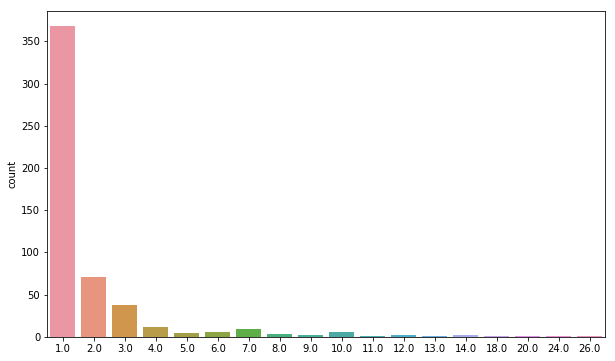

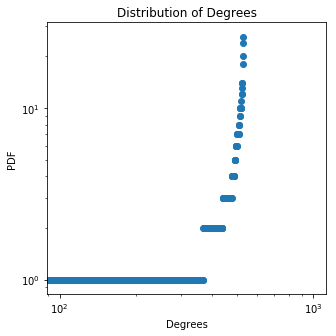

The clustering coefficient is 0.003663003663003663
Node with highest degree is: 18 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 7.056589533641865
79
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5856931808900825
number of closed triangles is 1
number of open triangles is 161
average distance is 0.6436481313024757


<Figure size 432x288 with 0 Axes>

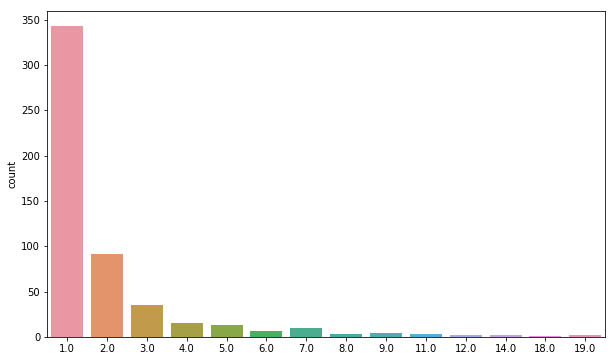

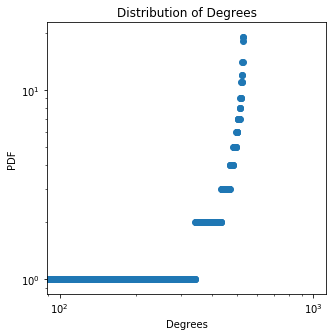

The clustering coefficient is 0.006211180124223602
Node with highest degree is: 22 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.226400854396583
78
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5966942022436239
number of closed triangles is 1
number of open triangles is 227
average distance is 0.6591619961116391


<Figure size 432x288 with 0 Axes>

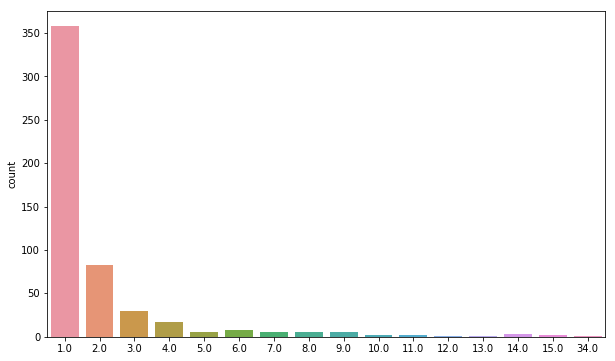

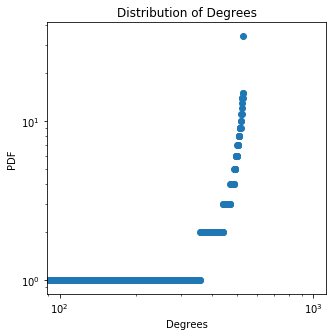

The clustering coefficient is 0.004405286343612335
Node with highest degree is: 9 with a degree of: 34.0 , the mean is 2.0037735849056606 , the variance is 6.683004627981488
77
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6582669215016962
number of closed triangles is 1
number of open triangles is 235
average distance is 0.6460252300165584


<Figure size 432x288 with 0 Axes>

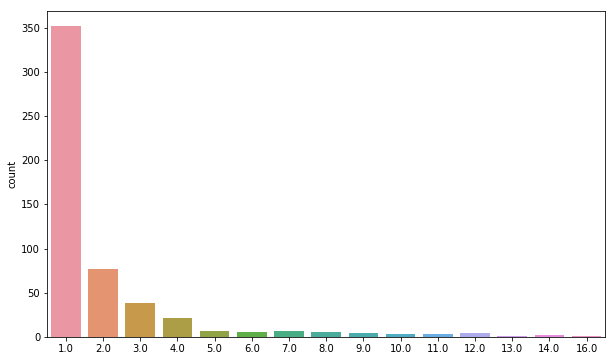

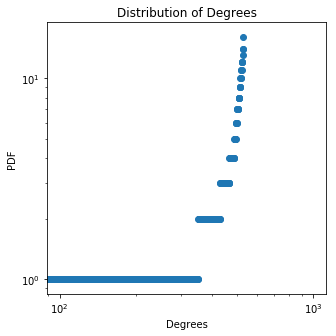

The clustering coefficient is 0.00425531914893617
Node with highest degree is: 27 with a degree of: 16.0 , the mean is 2.0037735849056606 , the variance is 4.920740477038092
76
number of closed triangles is 1
number of open triangles is 0
average distance is 0.586407742875613
number of closed triangles is 1
number of open triangles is 214
average distance is 0.6336129634943121


<Figure size 432x288 with 0 Axes>

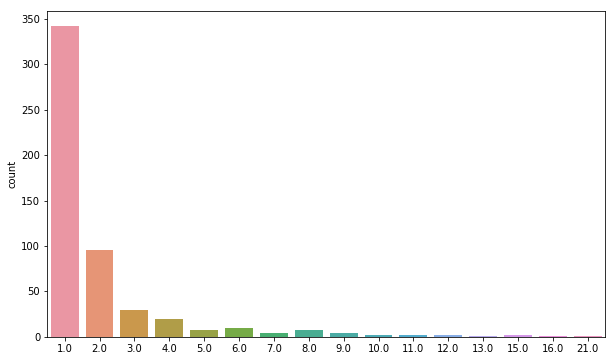

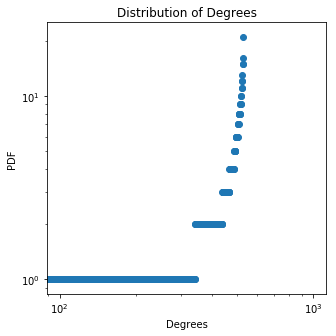

The clustering coefficient is 0.004672897196261682
Node with highest degree is: 21 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.1471555713777155
75
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7112701028479758
number of closed triangles is 1
number of open triangles is 239
average distance is 0.6634430126230908


<Figure size 432x288 with 0 Axes>

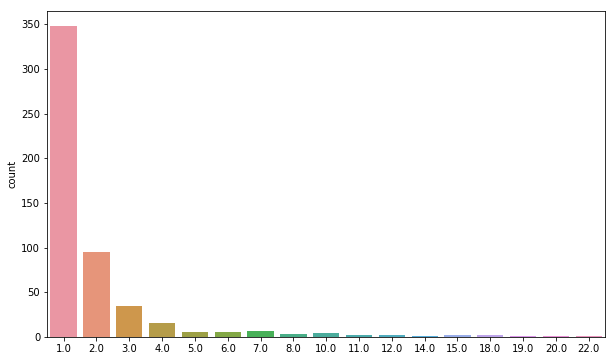

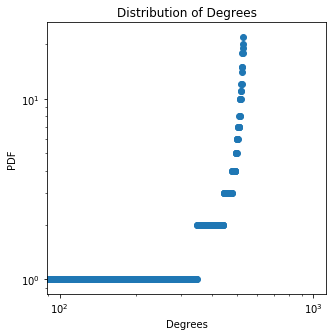

The clustering coefficient is 0.0041841004184100415
Node with highest degree is: 5 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 6.566023495906016
74
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6356277068222721
number of closed triangles is 1
number of open triangles is 161
average distance is 0.6773667703649554


<Figure size 432x288 with 0 Axes>

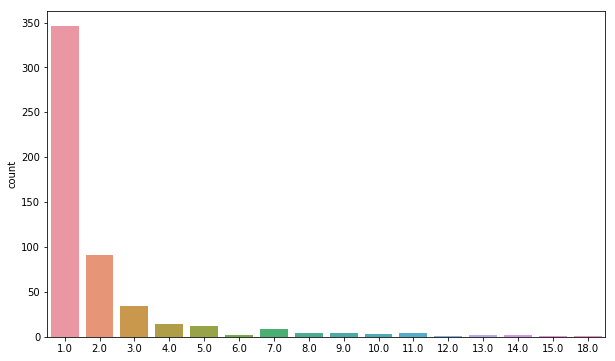

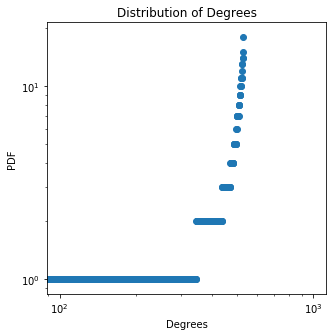

The clustering coefficient is 0.006211180124223602
Node with highest degree is: 27 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.1169668921324325
73
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6871977232752979
number of closed triangles is 1
number of open triangles is 210
average distance is 0.6558020313198325


<Figure size 432x288 with 0 Axes>

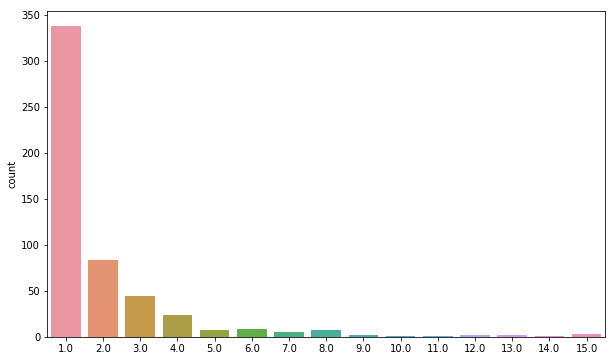

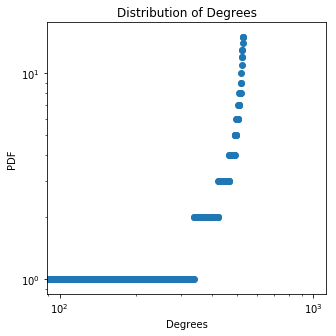

The clustering coefficient is 0.004761904761904762
Node with highest degree is: 10 with a degree of: 15.0 , the mean is 2.0037735849056606 , the variance is 4.524514061943752
72
number of closed triangles is 1
number of open triangles is 0
average distance is 0.650546343923429
number of closed triangles is 1
number of open triangles is 185
average distance is 0.6600530216151715


<Figure size 432x288 with 0 Axes>

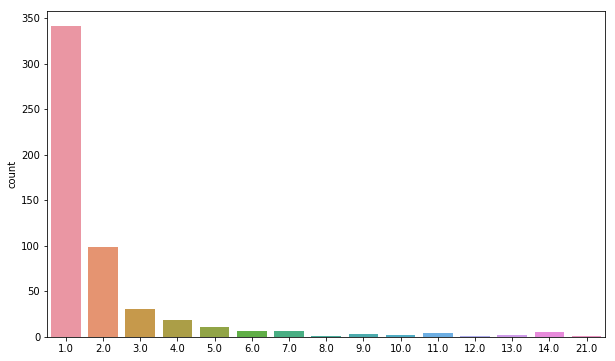

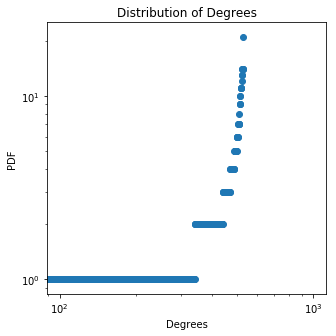

The clustering coefficient is 0.005405405405405406
Node with highest degree is: 27 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.3697970808116775
71
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7269002064527487
number of closed triangles is 1
number of open triangles is 190
average distance is 0.6761325753989463


<Figure size 432x288 with 0 Axes>

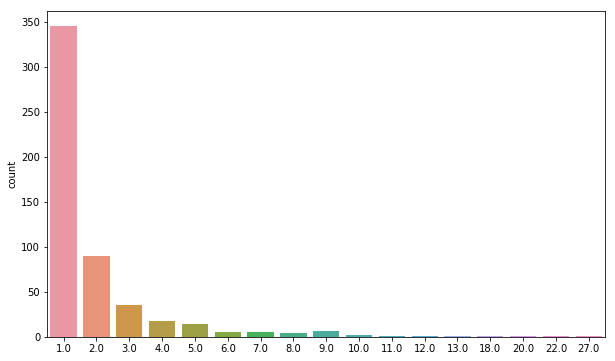

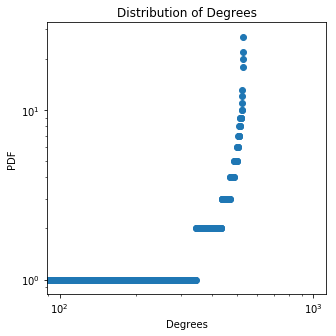

The clustering coefficient is 0.005263157894736842
Node with highest degree is: 8 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 6.135834816660734
70
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7106269918109935
number of closed triangles is 1
number of open triangles is 212
average distance is 0.6507338844730602


<Figure size 432x288 with 0 Axes>

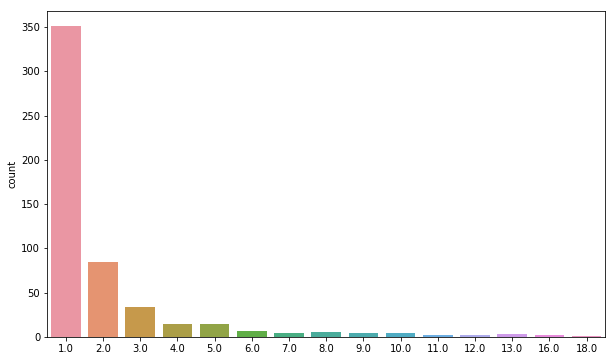

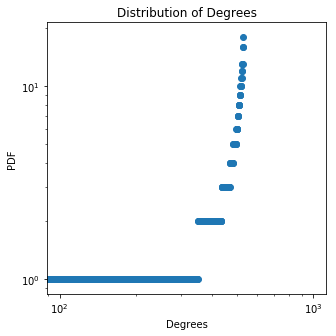

The clustering coefficient is 0.0047169811320754715
Node with highest degree is: 26 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.222627269490923
69
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6361202144484769
number of closed triangles is 1
number of open triangles is 179
average distance is 0.6721413149200468


<Figure size 432x288 with 0 Axes>

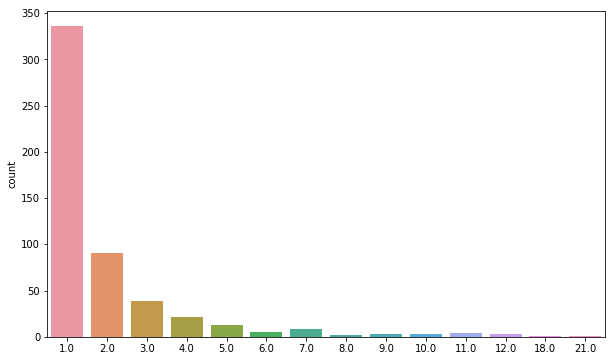

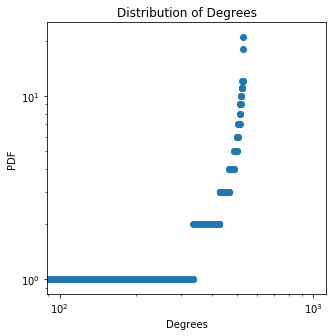

The clustering coefficient is 0.00558659217877095
Node with highest degree is: 13 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 4.732061231755073
68
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7295020391528318
number of closed triangles is 1
number of open triangles is 218
average distance is 0.6633000375750981


<Figure size 432x288 with 0 Axes>

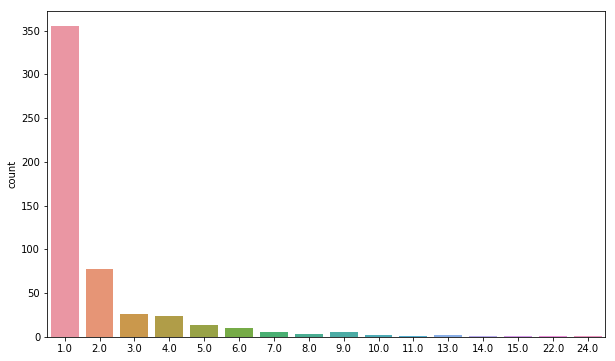

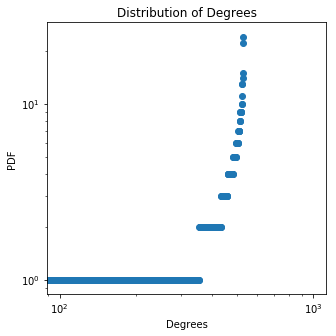

The clustering coefficient is 0.0045871559633027525
Node with highest degree is: 23 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.573570665717337
67
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6988506166085069
number of closed triangles is 1
number of open triangles is 238
average distance is 0.6917283797649266


<Figure size 432x288 with 0 Axes>

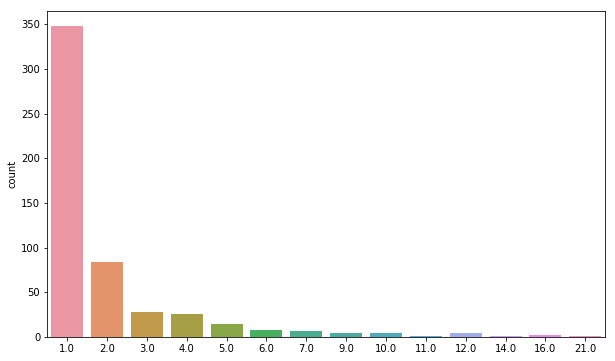

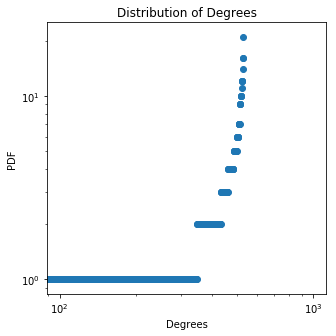

The clustering coefficient is 0.004201680672268907
Node with highest degree is: 14 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.113193307226771
66
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7047867824567289
number of closed triangles is 1
number of open triangles is 232
average distance is 0.6691550716267923


<Figure size 432x288 with 0 Axes>

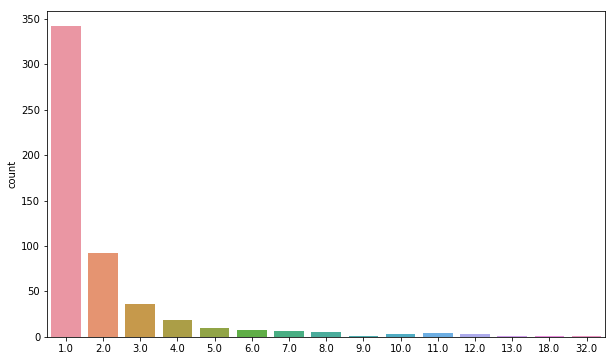

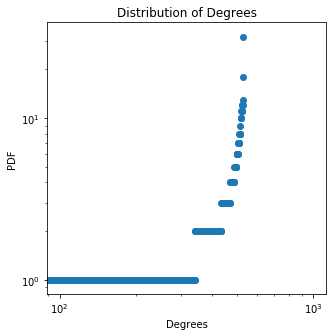

The clustering coefficient is 0.004310344827586207
Node with highest degree is: 3 with a degree of: 32.0 , the mean is 2.0037735849056606 , the variance is 5.894325382698469
65
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6529390423410936
number of closed triangles is 1
number of open triangles is 170
average distance is 0.6570247234656251


<Figure size 432x288 with 0 Axes>

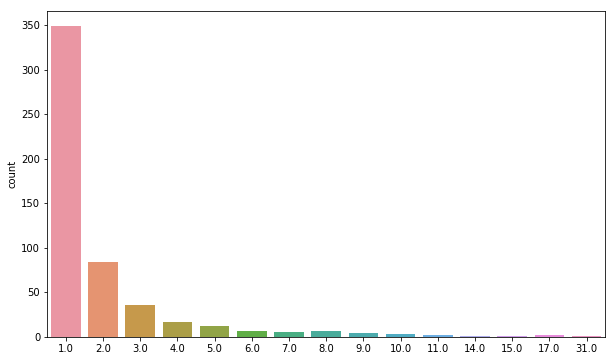

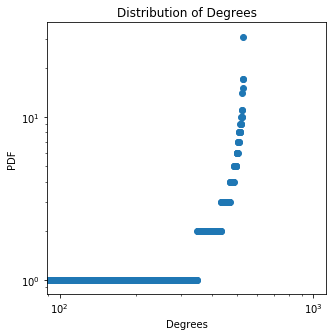

The clustering coefficient is 0.0058823529411764705
Node with highest degree is: 28 with a degree of: 31.0 , the mean is 2.0037735849056606 , the variance is 6.0150800996796026
64
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6107325647991115
number of closed triangles is 1
number of open triangles is 176
average distance is 0.6607518512446421


<Figure size 432x288 with 0 Axes>

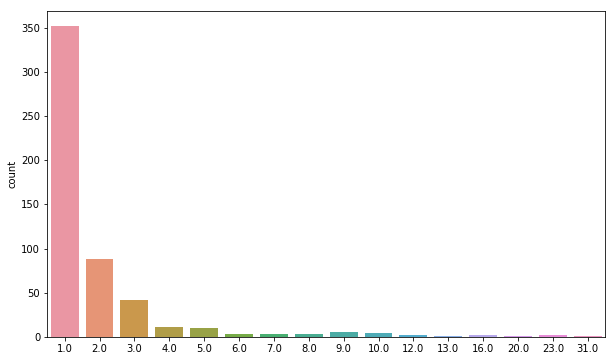

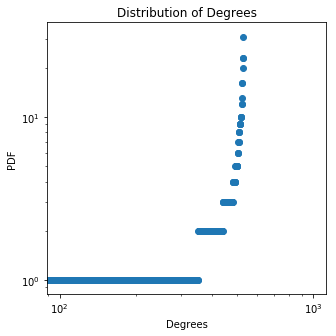

The clustering coefficient is 0.005681818181818182
Node with highest degree is: 15 with a degree of: 31.0 , the mean is 2.0037735849056606 , the variance is 7.584891420434319
63
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7128569540322298
number of closed triangles is 1
number of open triangles is 217
average distance is 0.6657040905181159


<Figure size 432x288 with 0 Axes>

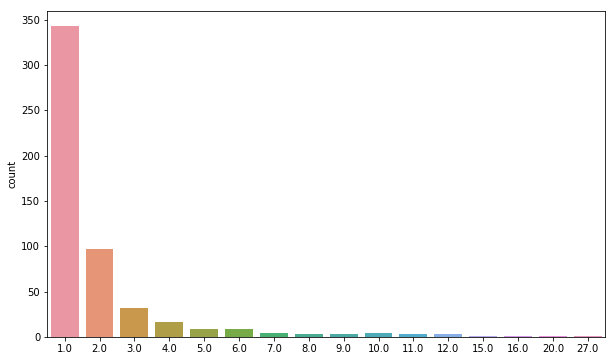

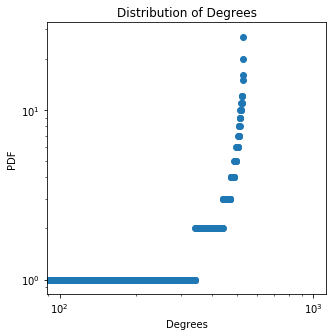

The clustering coefficient is 0.004608294930875576
Node with highest degree is: 16 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 5.90941972232111
62
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6411321810950311
number of closed triangles is 1
number of open triangles is 287
average distance is 0.6873912843022545


<Figure size 432x288 with 0 Axes>

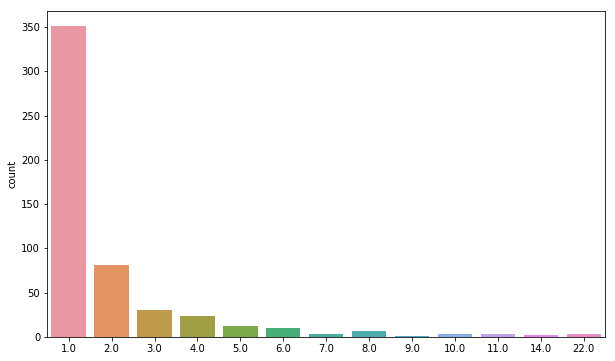

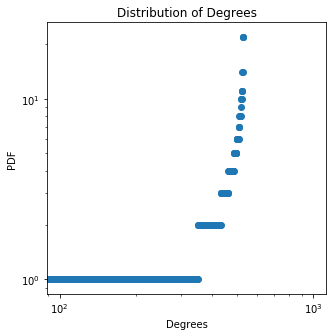

The clustering coefficient is 0.003484320557491289
Node with highest degree is: 2 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.743381986472054
61
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6215897604009167
number of closed triangles is 1
number of open triangles is 192
average distance is 0.6808500121890139


<Figure size 432x288 with 0 Axes>

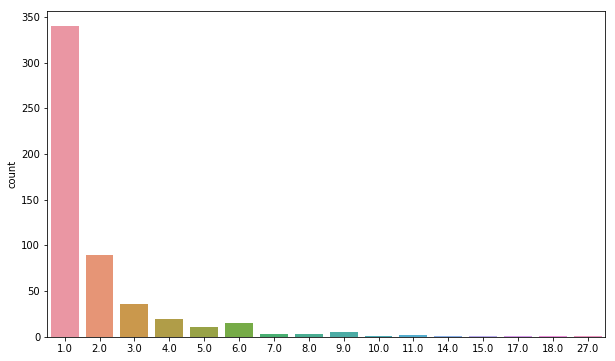

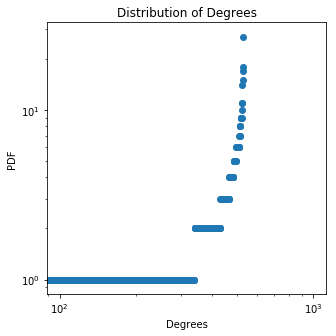

The clustering coefficient is 0.005208333333333333
Node with highest degree is: 32 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 5.403759344962621
60
number of closed triangles is 1
number of open triangles is 0
average distance is 0.8156100104240583
number of closed triangles is 1
number of open triangles is 155
average distance is 0.6581122661569491


<Figure size 432x288 with 0 Axes>

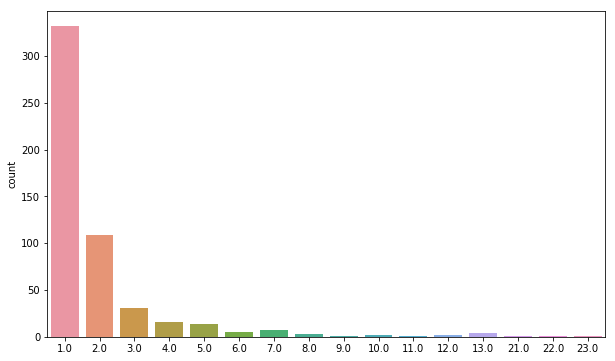

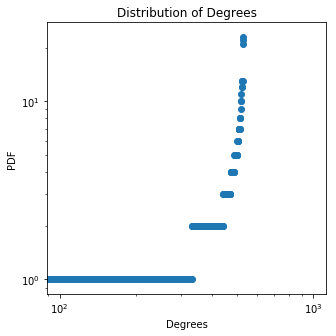

The clustering coefficient is 0.0064516129032258064
Node with highest degree is: 12 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.773570665717337
59
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6284652944187538
number of closed triangles is 1
number of open triangles is 222
average distance is 0.652591685423437


<Figure size 432x288 with 0 Axes>

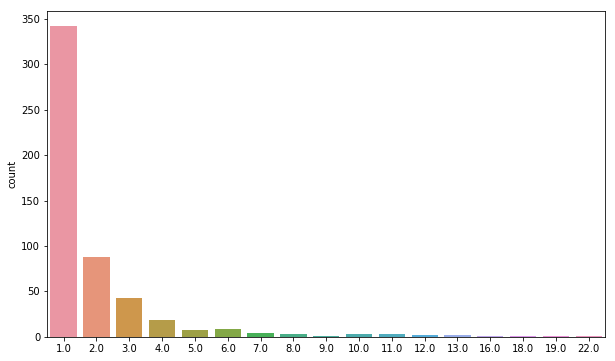

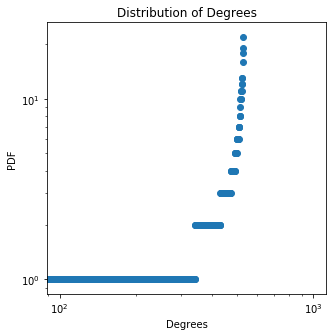

The clustering coefficient is 0.0045045045045045045
Node with highest degree is: 2 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.5622499110003565
58
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7023659643896629
number of closed triangles is 1
number of open triangles is 207
average distance is 0.6705368645830739


<Figure size 432x288 with 0 Axes>

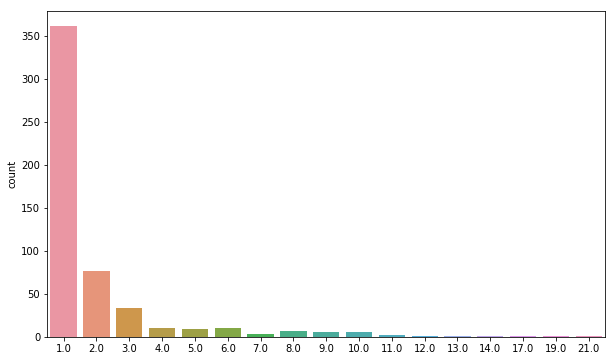

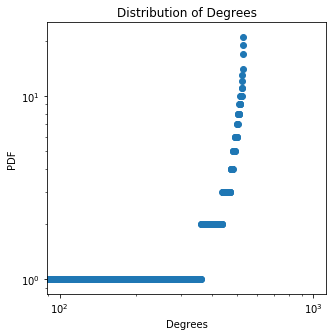

The clustering coefficient is 0.004830917874396135
Node with highest degree is: 23 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.7245140619437525
57
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6037490252021344
number of closed triangles is 1
number of open triangles is 161
average distance is 0.6773909653197723


<Figure size 432x288 with 0 Axes>

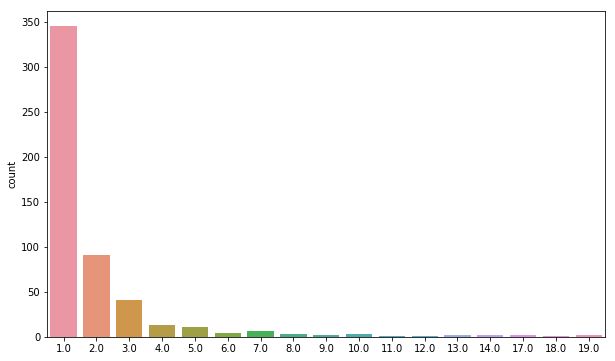

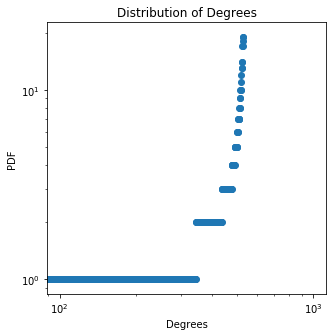

The clustering coefficient is 0.006211180124223602
Node with highest degree is: 23 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.932061231755074
56
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6616987522143097
number of closed triangles is 1
number of open triangles is 265
average distance is 0.6517567306701418


<Figure size 432x288 with 0 Axes>

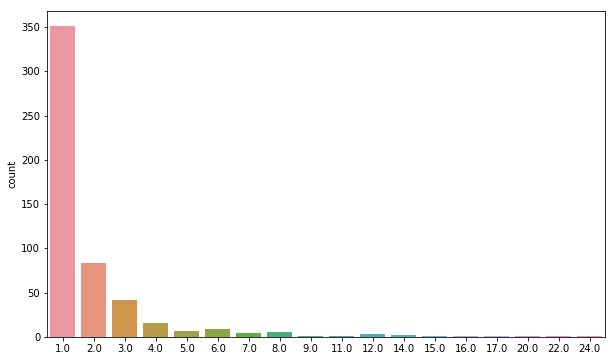

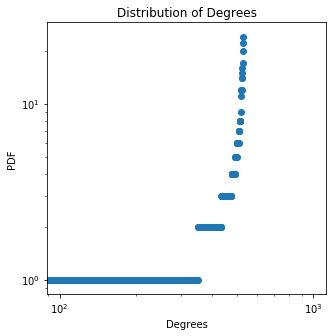

The clustering coefficient is 0.0037735849056603774
Node with highest degree is: 20 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 6.528287646849412
55
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6222964285736807
number of closed triangles is 1
number of open triangles is 199
average distance is 0.6701142877119258


<Figure size 432x288 with 0 Axes>

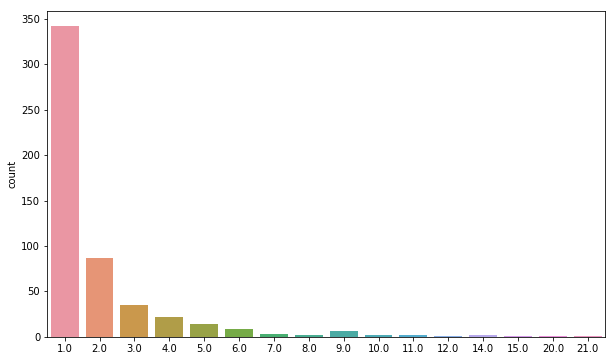

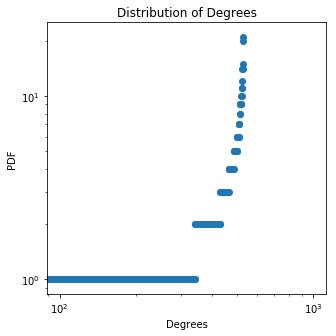

The clustering coefficient is 0.005025125628140704
Node with highest degree is: 16 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.10941972232111
54
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7445755130125301
number of closed triangles is 1
number of open triangles is 223
average distance is 0.6815430715483226


<Figure size 432x288 with 0 Axes>

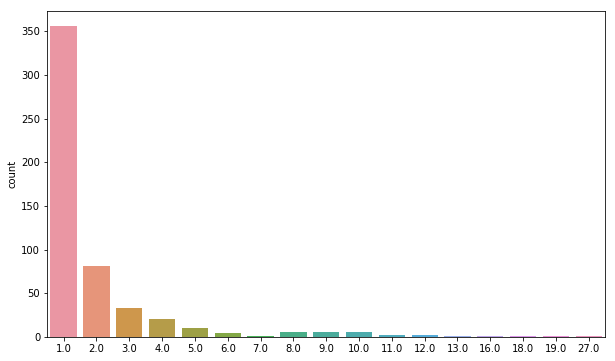

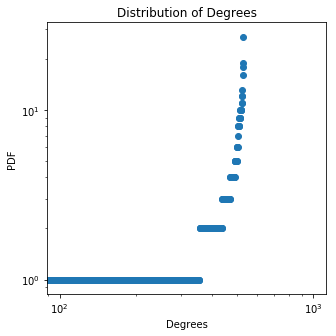

The clustering coefficient is 0.004484304932735426
Node with highest degree is: 17 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 6.2377216091135645
53
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7172375230716278
number of closed triangles is 1
number of open triangles is 205
average distance is 0.6638475579034445


<Figure size 432x288 with 0 Axes>

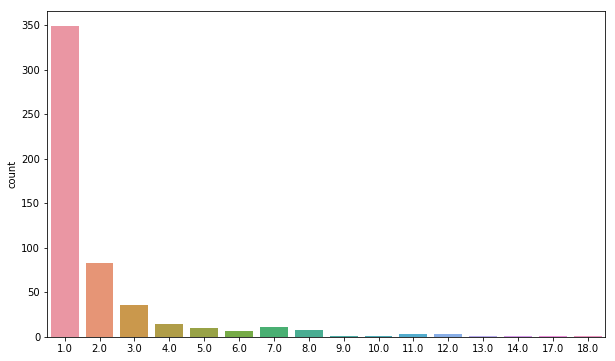

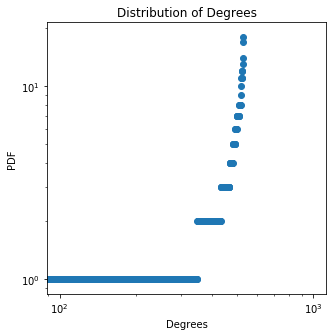

The clustering coefficient is 0.004878048780487805
Node with highest degree is: 80 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 4.920740477038092
52
number of closed triangles is 1
number of open triangles is 0
average distance is 0.606372537596829
number of closed triangles is 1
number of open triangles is 249
average distance is 0.6494666417916319


<Figure size 432x288 with 0 Axes>

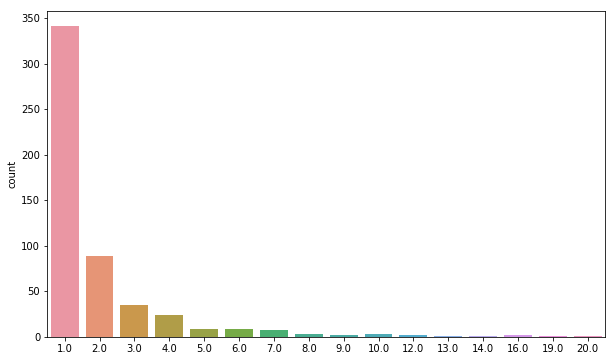

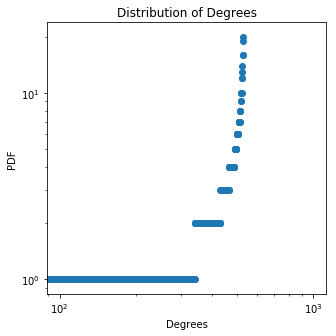

The clustering coefficient is 0.004016064257028112
Node with highest degree is: 18 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.169797080811677
51
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6826492512329201
number of closed triangles is 1
number of open triangles is 251
average distance is 0.6603626450855039


<Figure size 432x288 with 0 Axes>

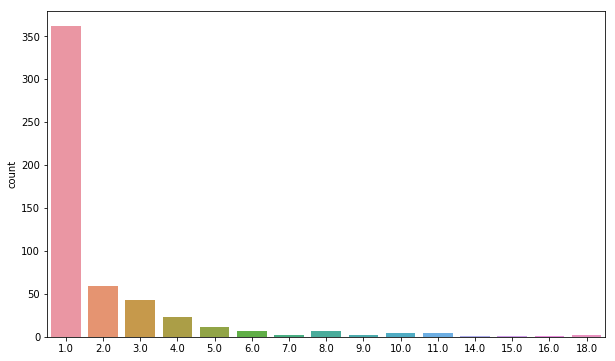

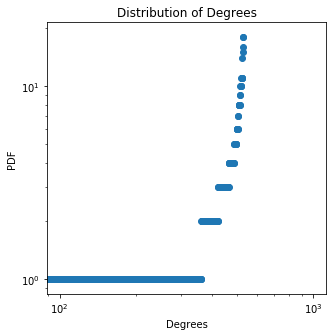

The clustering coefficient is 0.00398406374501992
Node with highest degree is: 26 with a degree of: 18.0 , the mean is 2.0037735849056606 , the variance is 5.264136703453187
50
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6467717618420025
number of closed triangles is 1
number of open triangles is 253
average distance is 0.6761967458712668


<Figure size 432x288 with 0 Axes>

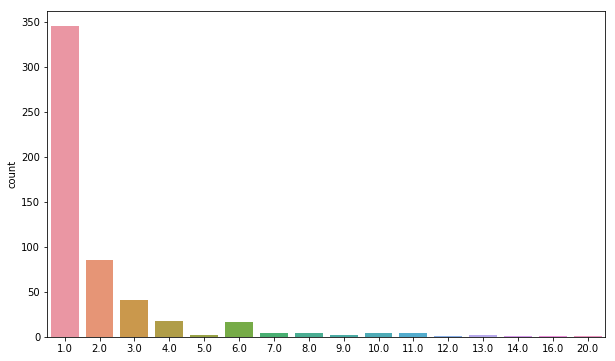

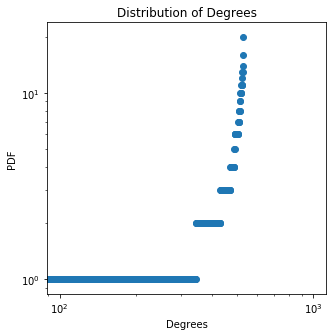

The clustering coefficient is 0.003952569169960474
Node with highest degree is: 11 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.011306514773941
49
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6337563523678397
number of closed triangles is 1
number of open triangles is 204
average distance is 0.6370688719879015


<Figure size 432x288 with 0 Axes>

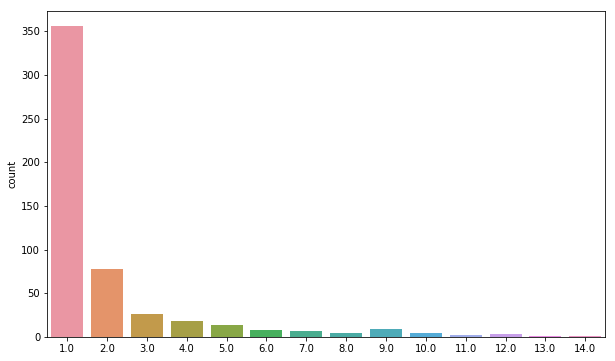

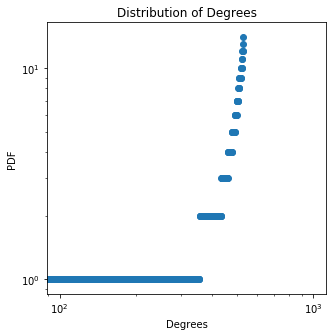

The clustering coefficient is 0.004901960784313725
Node with highest degree is: 20 with a degree of: 14.0 , the mean is 2.0037735849056606 , the variance is 4.607532929868281
48
number of closed triangles is 1
number of open triangles is 0
average distance is 0.720616213663894
number of closed triangles is 1
number of open triangles is 191
average distance is 0.6794527246695393


<Figure size 432x288 with 0 Axes>

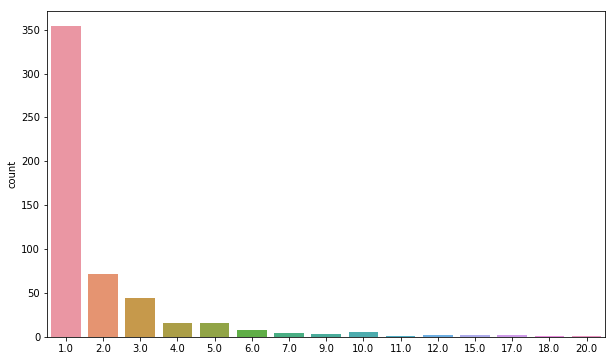

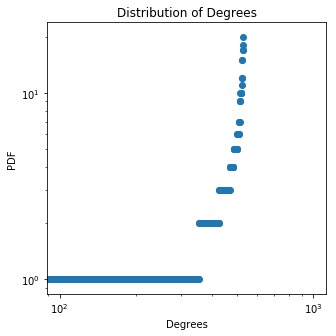

The clustering coefficient is 0.005235602094240838
Node with highest degree is: 21 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.566023495906018
47
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7342973058302728
number of closed triangles is 1
number of open triangles is 204
average distance is 0.6803646665249714


<Figure size 432x288 with 0 Axes>

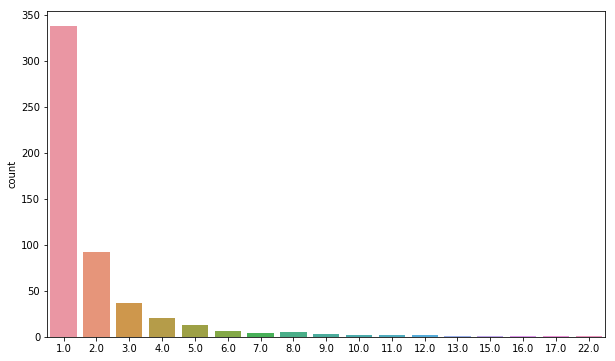

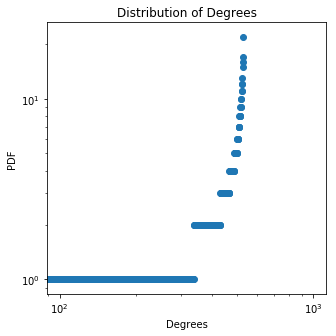

The clustering coefficient is 0.004901960784313725
Node with highest degree is: 16 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.09432538269847
46
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7832549808137195
number of closed triangles is 1
number of open triangles is 245
average distance is 0.6773805639697316


<Figure size 432x288 with 0 Axes>

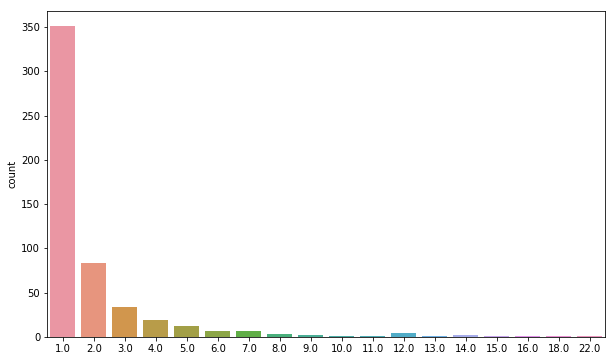

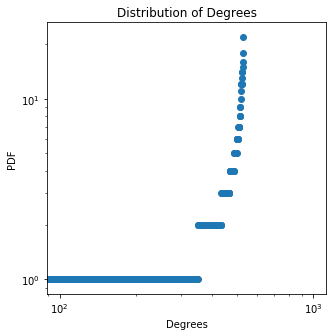

The clustering coefficient is 0.004081632653061225
Node with highest degree is: 9 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.683004627981488
45
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6328096963497759
number of closed triangles is 1
number of open triangles is 220
average distance is 0.6355453579436808


<Figure size 432x288 with 0 Axes>

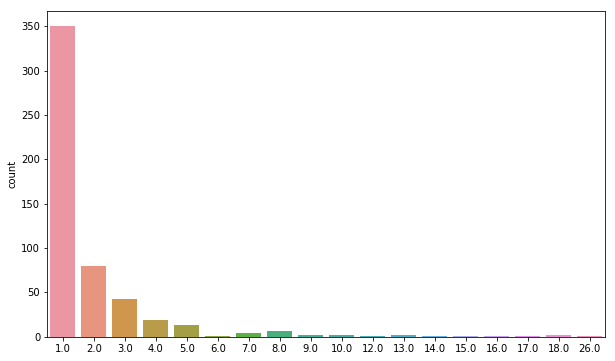

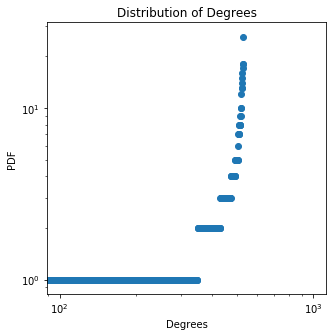

The clustering coefficient is 0.004545454545454545
Node with highest degree is: 10 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 6.241495194019224
44
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6675309824656815
number of closed triangles is 1
number of open triangles is 195
average distance is 0.6626425622754427


<Figure size 432x288 with 0 Axes>

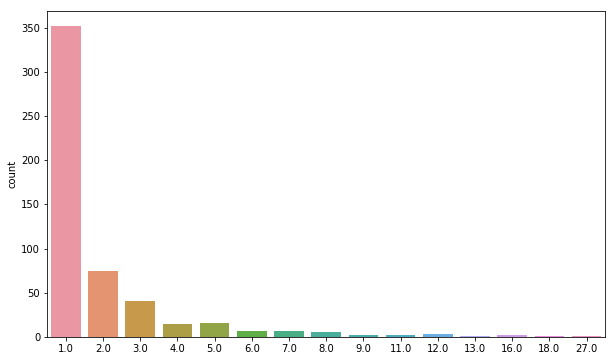

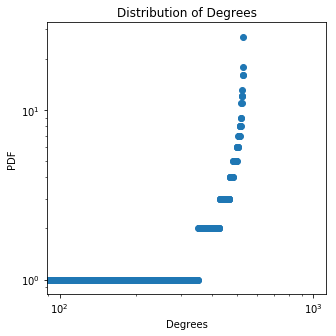

The clustering coefficient is 0.005128205128205128
Node with highest degree is: 28 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 5.6943253826984686
43
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7325856115264514
number of closed triangles is 1
number of open triangles is 156
average distance is 0.6498239451408097


<Figure size 432x288 with 0 Axes>

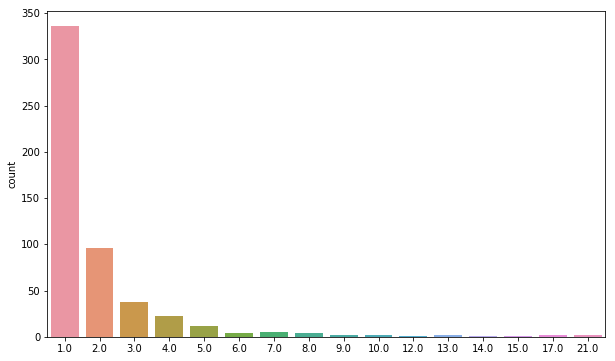

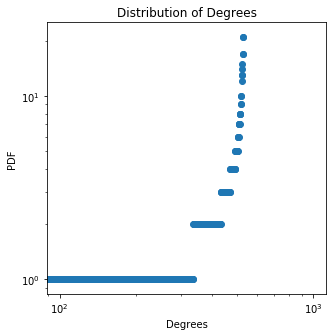

The clustering coefficient is 0.00641025641025641
Node with highest degree is: 5 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.577344250622997
42
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6845553796557415
number of closed triangles is 1
number of open triangles is 201
average distance is 0.6463213399423919


<Figure size 432x288 with 0 Axes>

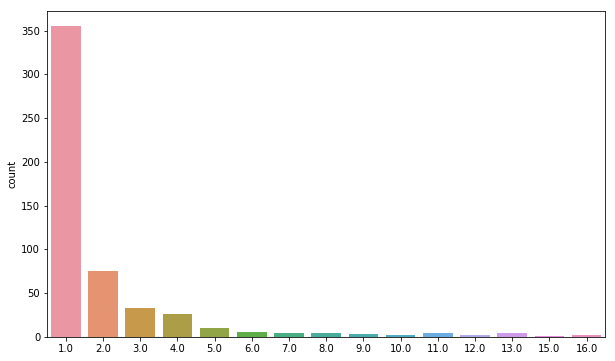

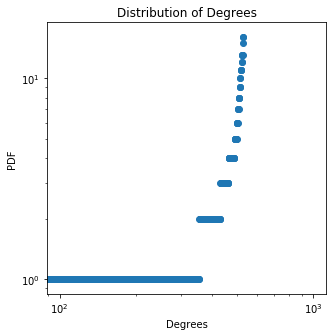

The clustering coefficient is 0.004975124378109453
Node with highest degree is: 17 with a degree of: 16.0 , the mean is 2.0037735849056606 , the variance is 5.18866500533998
41
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6809519285838523
number of closed triangles is 1
number of open triangles is 184
average distance is 0.6654981401531509


<Figure size 432x288 with 0 Axes>

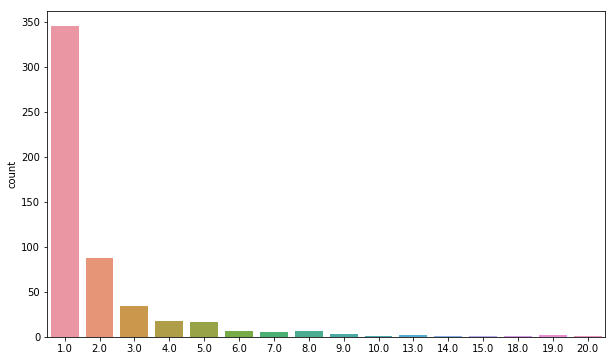

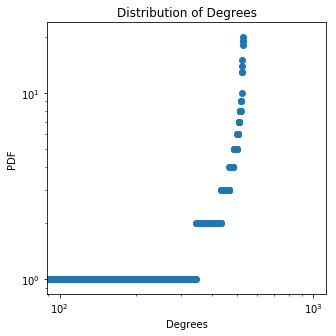

The clustering coefficient is 0.005434782608695652
Node with highest degree is: 15 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.577344250622999
40
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6017027619259301
number of closed triangles is 1
number of open triangles is 209
average distance is 0.6532206734523035


<Figure size 432x288 with 0 Axes>

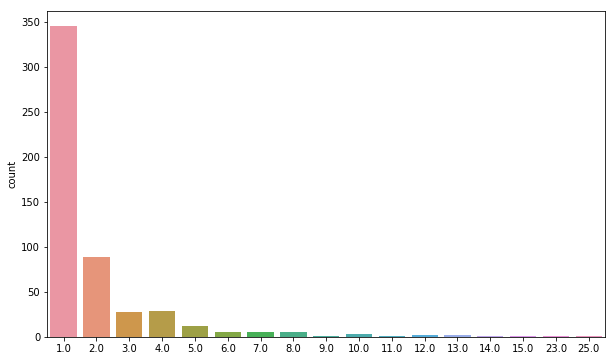

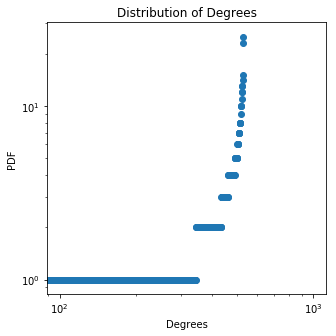

The clustering coefficient is 0.004784688995215311
Node with highest degree is: 15 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.713193307226771
39
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6471743394427159
number of closed triangles is 1
number of open triangles is 183
average distance is 0.6686594475300682


<Figure size 432x288 with 0 Axes>

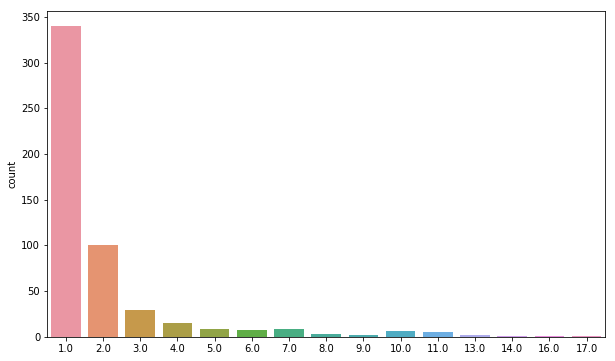

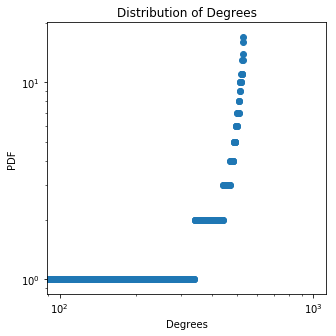

The clustering coefficient is 0.00546448087431694
Node with highest degree is: 25 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 4.950929156283375
38
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6893257175333649
number of closed triangles is 1
number of open triangles is 145
average distance is 0.6634127895558466


<Figure size 432x288 with 0 Axes>

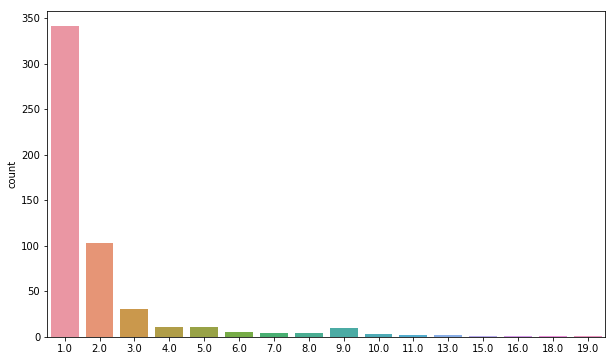

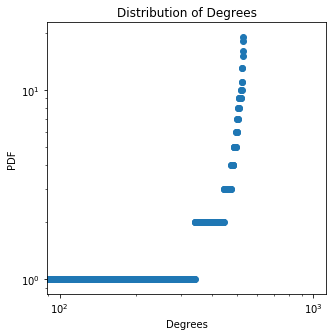

The clustering coefficient is 0.006896551724137931
Node with highest degree is: 27 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.347155571377713
37
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6927465951591737
number of closed triangles is 1
number of open triangles is 159
average distance is 0.6896985163669999


<Figure size 432x288 with 0 Axes>

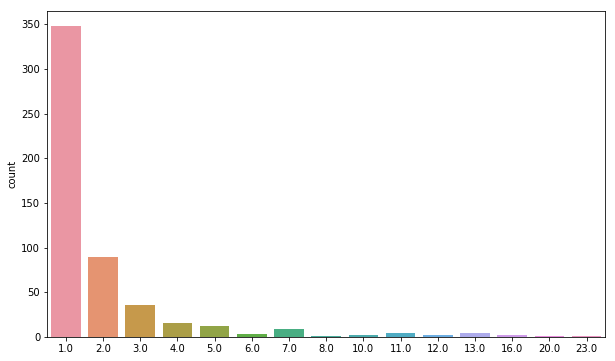

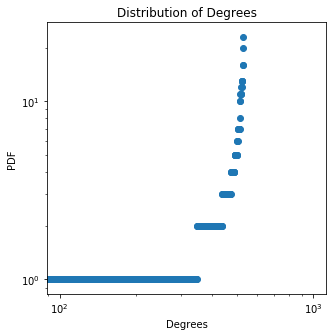

The clustering coefficient is 0.006289308176100629
Node with highest degree is: 16 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.958476326094695
36
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6320372695727983
number of closed triangles is 1
number of open triangles is 162
average distance is 0.6605425731825504


<Figure size 432x288 with 0 Axes>

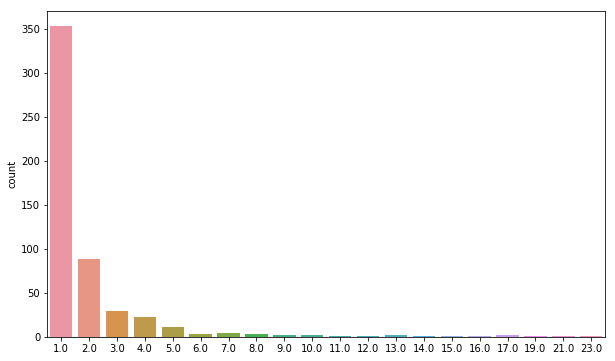

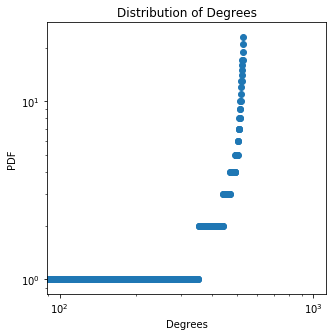

The clustering coefficient is 0.006172839506172839
Node with highest degree is: 12 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 6.656589533641867
35
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6510388144955744
number of closed triangles is 1
number of open triangles is 198
average distance is 0.6489959688519384


<Figure size 432x288 with 0 Axes>

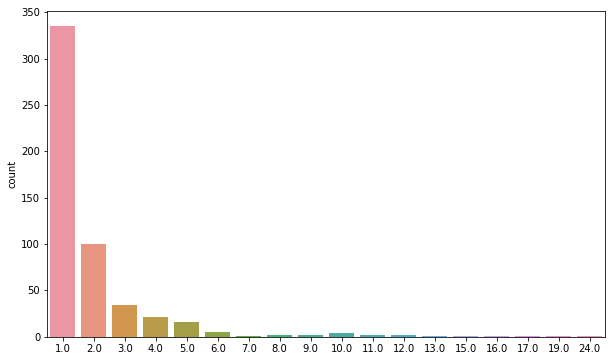

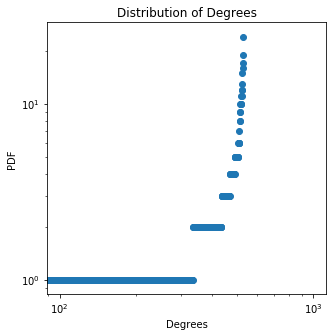

The clustering coefficient is 0.005050505050505051
Node with highest degree is: 16 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.61130651477394
34
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6279912668403544
number of closed triangles is 1
number of open triangles is 189
average distance is 0.6532723312015927


<Figure size 432x288 with 0 Axes>

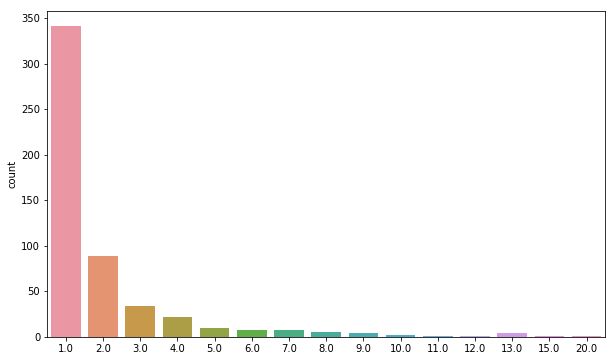

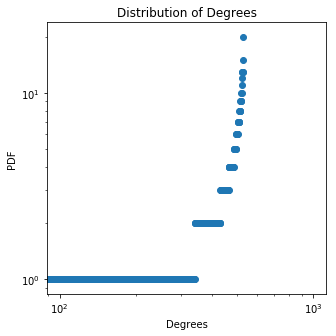

The clustering coefficient is 0.005291005291005291
Node with highest degree is: 23 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 4.750929156283376
33
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7004643811471112
number of closed triangles is 1
number of open triangles is 170
average distance is 0.661945390762256


<Figure size 432x288 with 0 Axes>

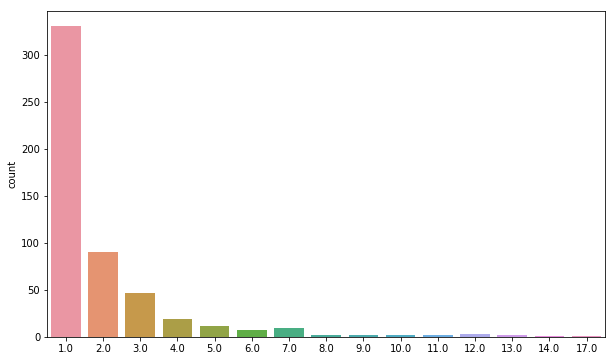

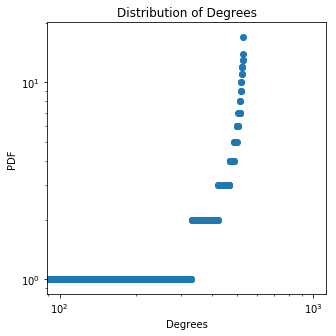

The clustering coefficient is 0.0058823529411764705
Node with highest degree is: 29 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 4.283004627981488
32
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6767477698089587
number of closed triangles is 1
number of open triangles is 232
average distance is 0.6567454870270802


<Figure size 432x288 with 0 Axes>

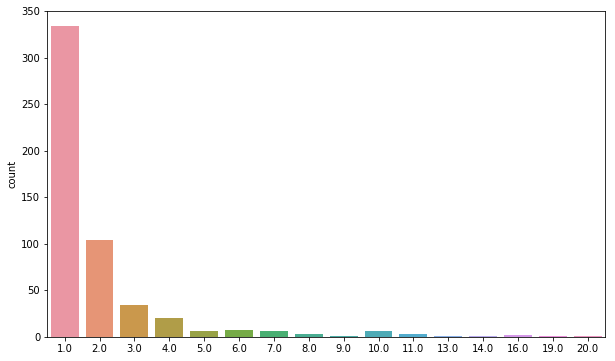

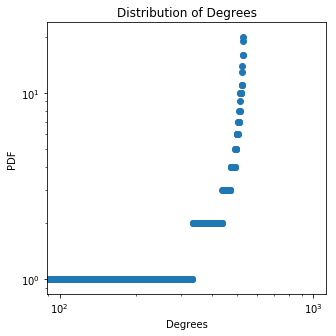

The clustering coefficient is 0.004310344827586207
Node with highest degree is: 12 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.316966892132431
31
number of closed triangles is 1
number of open triangles is 0
average distance is 0.5791807423969307
number of closed triangles is 1
number of open triangles is 230
average distance is 0.6366141159343442


<Figure size 432x288 with 0 Axes>

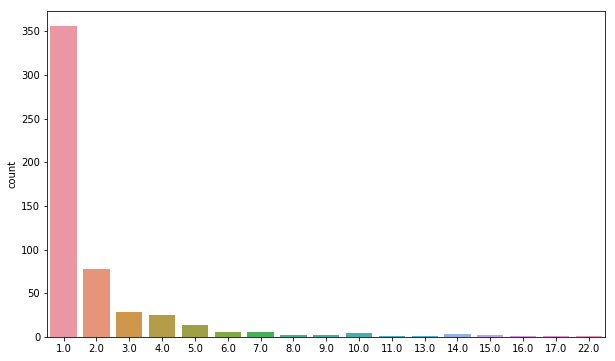

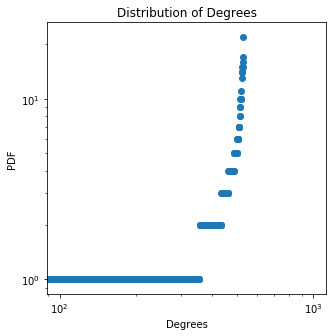

The clustering coefficient is 0.004347826086956522
Node with highest degree is: 17 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.754702741189034
30
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6852135664861542
number of closed triangles is 1
number of open triangles is 161
average distance is 0.6678047091801182


<Figure size 432x288 with 0 Axes>

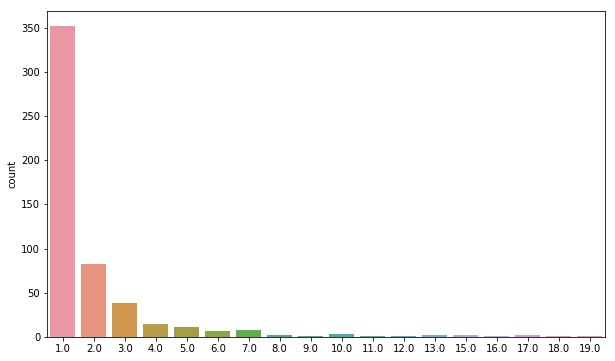

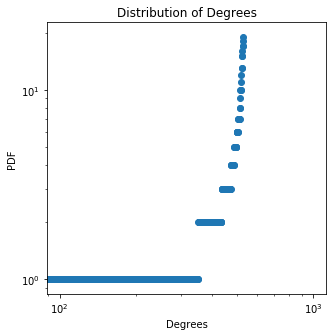

The clustering coefficient is 0.006211180124223602
Node with highest degree is: 16 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.890551797792808
29
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6854518457380284
number of closed triangles is 1
number of open triangles is 201
average distance is 0.6625417996157135


<Figure size 432x288 with 0 Axes>

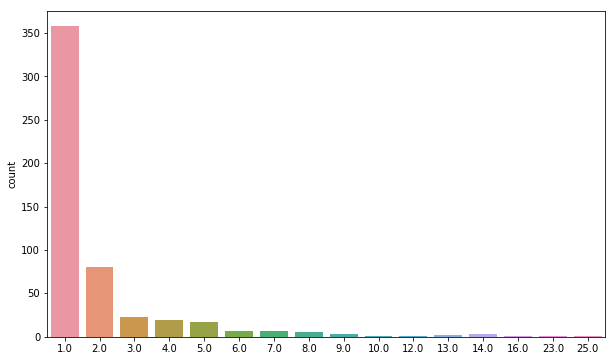

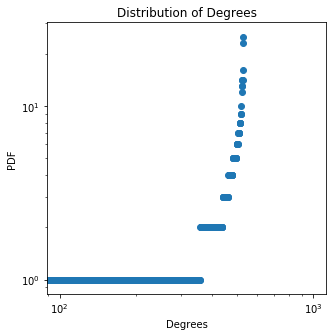

The clustering coefficient is 0.004975124378109453
Node with highest degree is: 25 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.090551797792808
28
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7492552196830313
number of closed triangles is 1
number of open triangles is 173
average distance is 0.6832842817065409


<Figure size 432x288 with 0 Axes>

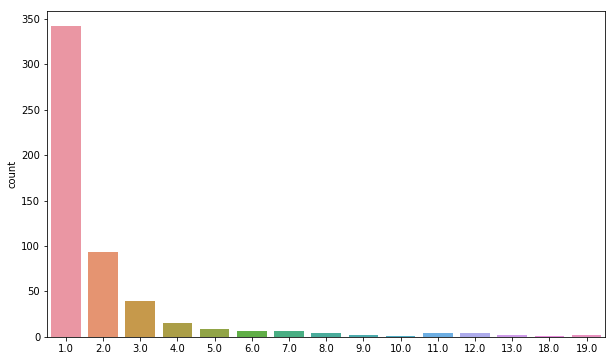

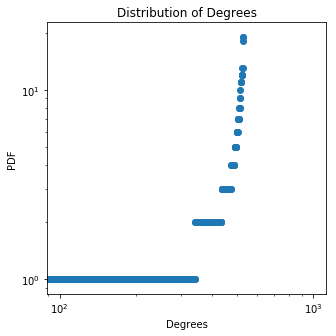

The clustering coefficient is 0.005780346820809248
Node with highest degree is: 16 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 5.422627269490922
27
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7994596379161413
number of closed triangles is 1
number of open triangles is 236
average distance is 0.6646694209464703


<Figure size 432x288 with 0 Axes>

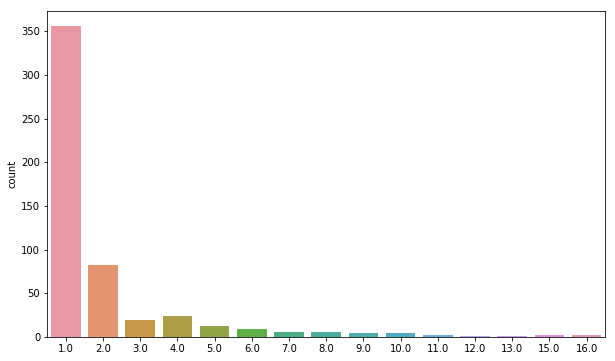

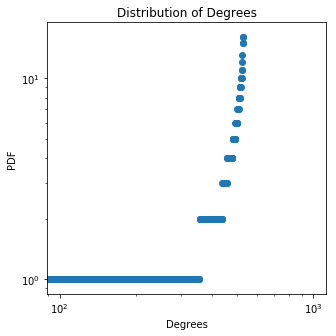

The clustering coefficient is 0.00423728813559322
Node with highest degree is: 9 with a degree of: 16.0 , the mean is 2.0037735849056606 , the variance is 5.007532929868281
26
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6852133896791047
number of closed triangles is 1
number of open triangles is 203
average distance is 0.6556381120426257


<Figure size 432x288 with 0 Axes>

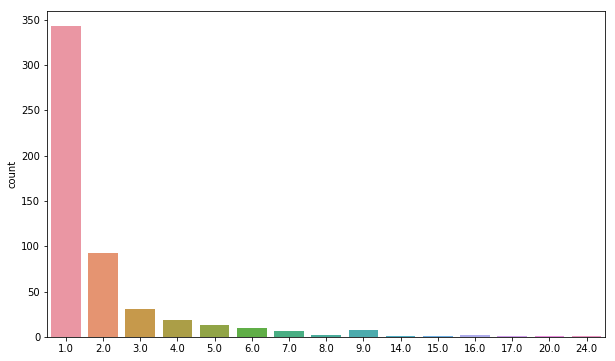

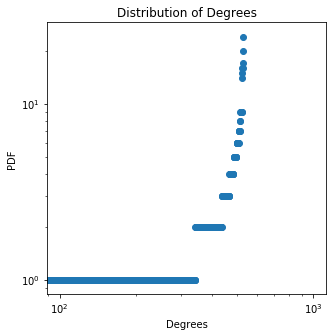

The clustering coefficient is 0.0049261083743842365
Node with highest degree is: 27 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.70941972232111
25
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6048009626008682
number of closed triangles is 1
number of open triangles is 152
average distance is 0.644349764400268


<Figure size 432x288 with 0 Axes>

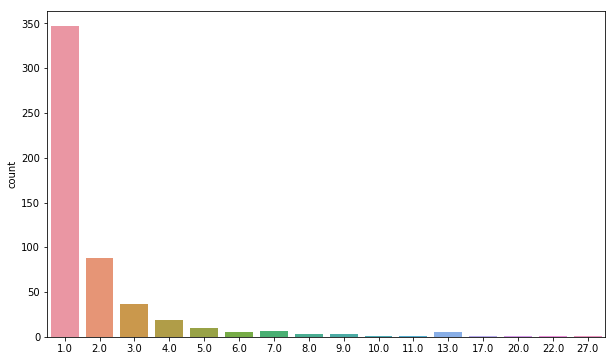

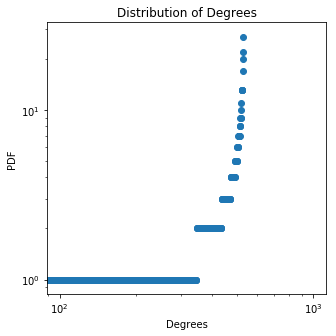

The clustering coefficient is 0.006578947368421052
Node with highest degree is: 15 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 6.384891420434319
24
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6952798574130099
number of closed triangles is 1
number of open triangles is 211
average distance is 0.6607767573304246


<Figure size 432x288 with 0 Axes>

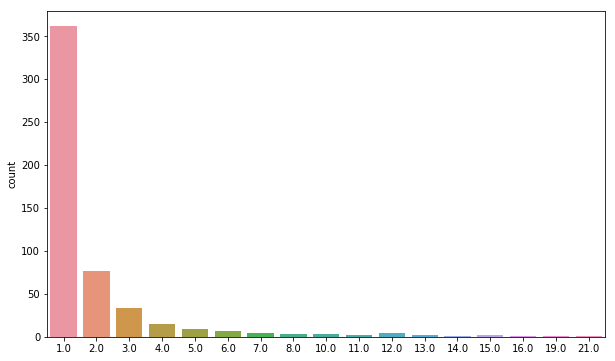

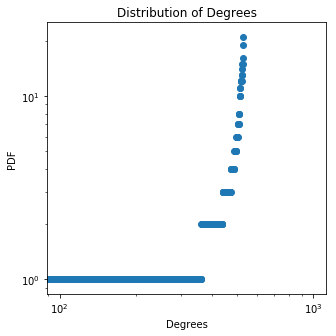

The clustering coefficient is 0.004739336492890996
Node with highest degree is: 22 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 6.237721609113565
23
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6882733327191576
number of closed triangles is 1
number of open triangles is 207
average distance is 0.668671285228753


<Figure size 432x288 with 0 Axes>

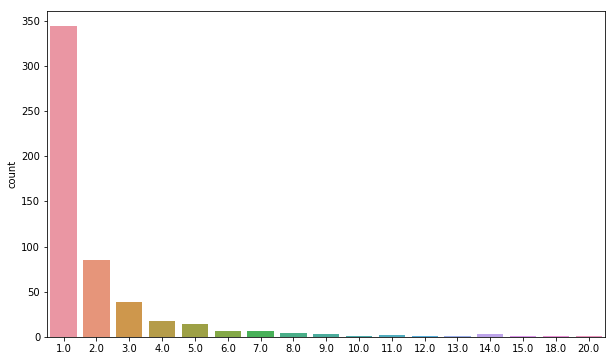

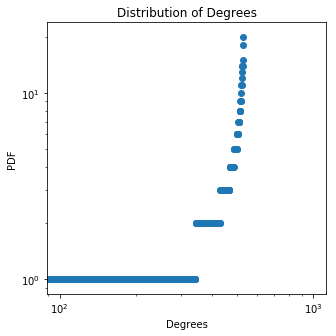

The clustering coefficient is 0.004830917874396135
Node with highest degree is: 0 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.181117835528657
22
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7640508673519926
number of closed triangles is 1
number of open triangles is 176
average distance is 0.7150622775079871


<Figure size 432x288 with 0 Axes>

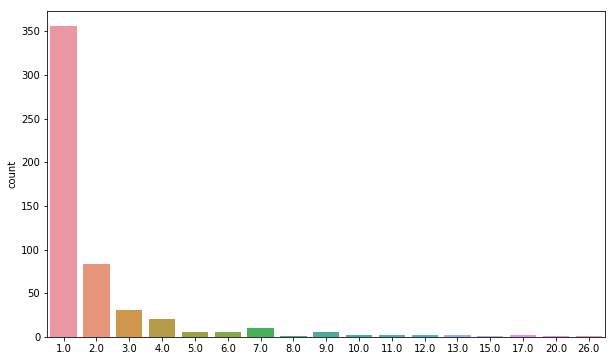

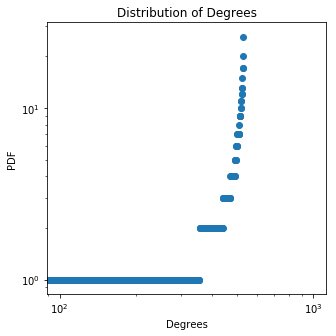

The clustering coefficient is 0.005681818181818182
Node with highest degree is: 15 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 6.366023495906015
21
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6758403318771182
number of closed triangles is 1
number of open triangles is 191
average distance is 0.6599931869407762


<Figure size 432x288 with 0 Axes>

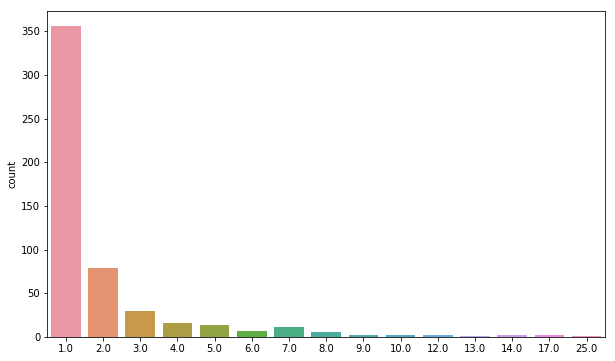

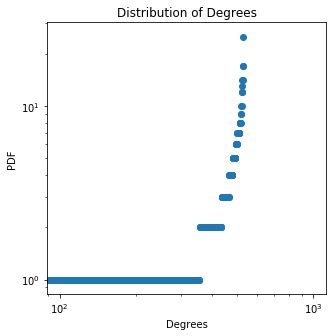

The clustering coefficient is 0.005235602094240838
Node with highest degree is: 23 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 5.630174439302244
20
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6458355995679668
number of closed triangles is 1
number of open triangles is 217
average distance is 0.6704165076404418


<Figure size 432x288 with 0 Axes>

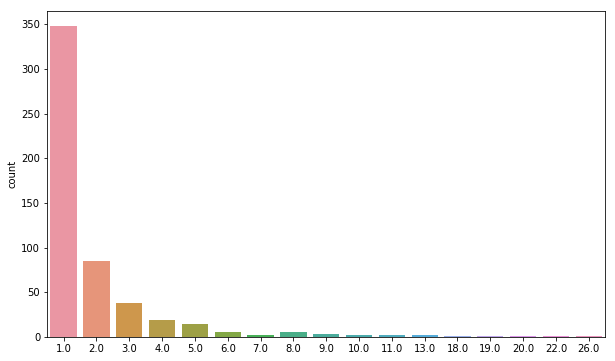

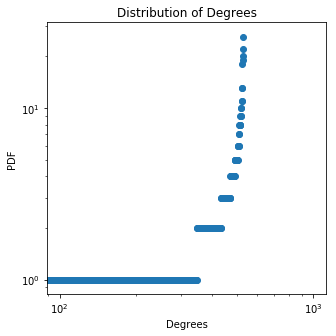

The clustering coefficient is 0.004608294930875576
Node with highest degree is: 22 with a degree of: 26.0 , the mean is 2.0037735849056606 , the variance is 6.456589533641868
19
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6772935598487735
number of closed triangles is 1
number of open triangles is 195
average distance is 0.6648667501647942


<Figure size 432x288 with 0 Axes>

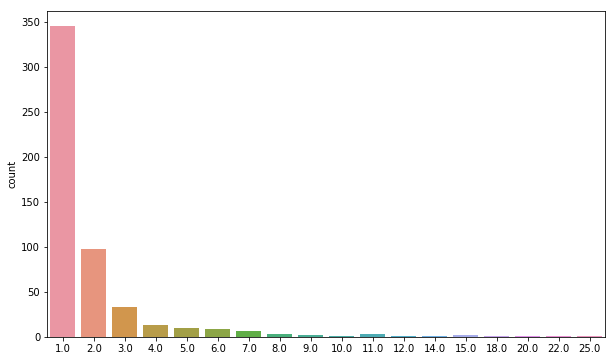

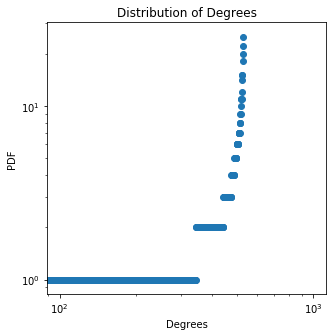

The clustering coefficient is 0.005128205128205128
Node with highest degree is: 5 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.449042363830545
18
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6490011878279968
number of closed triangles is 1
number of open triangles is 285
average distance is 0.6899999644290704


<Figure size 432x288 with 0 Axes>

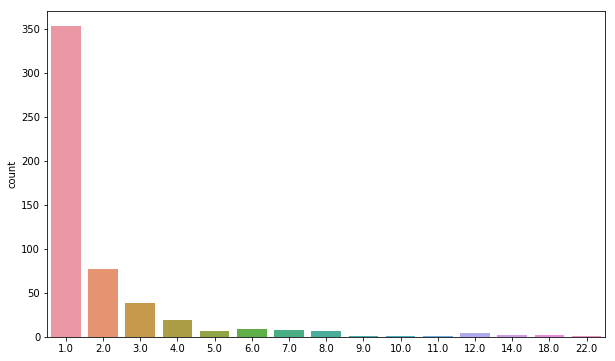

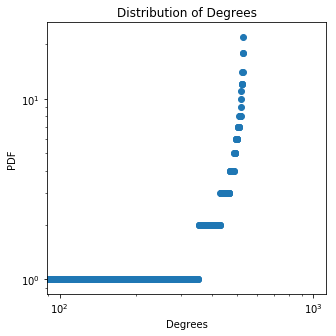

The clustering coefficient is 0.0035087719298245615
Node with highest degree is: 11 with a degree of: 22.0 , the mean is 2.0037735849056606 , the variance is 5.509419722321112
17
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6196259127379607
number of closed triangles is 1
number of open triangles is 217
average distance is 0.6323567471687926


<Figure size 432x288 with 0 Axes>

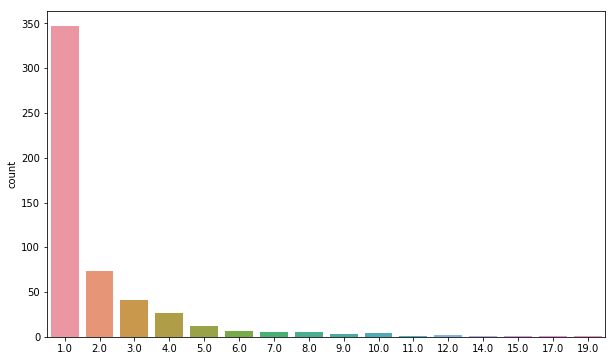

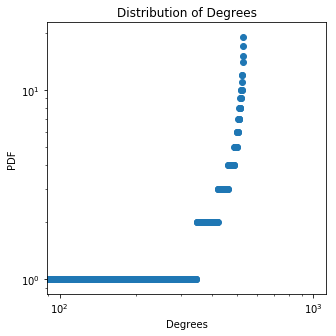

The clustering coefficient is 0.004608294930875576
Node with highest degree is: 14 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 4.747155571377715
16
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6674968638385813
number of closed triangles is 1
number of open triangles is 173
average distance is 0.6695108784230639


<Figure size 432x288 with 0 Axes>

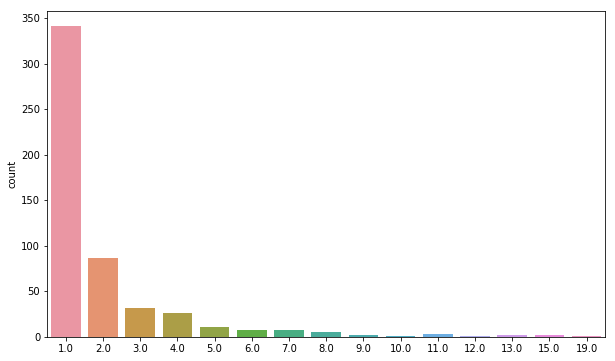

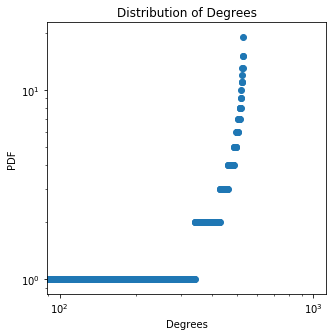

The clustering coefficient is 0.005780346820809248
Node with highest degree is: 25 with a degree of: 19.0 , the mean is 2.0037735849056606 , the variance is 4.637721609113563
15
number of closed triangles is 1
number of open triangles is 0
average distance is 0.610483880072029
number of closed triangles is 1
number of open triangles is 193
average distance is 0.6645532046357295


<Figure size 432x288 with 0 Axes>

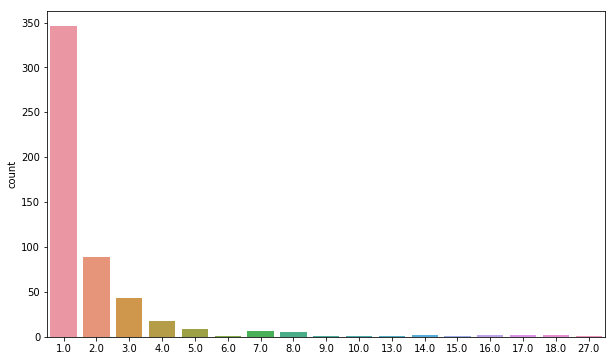

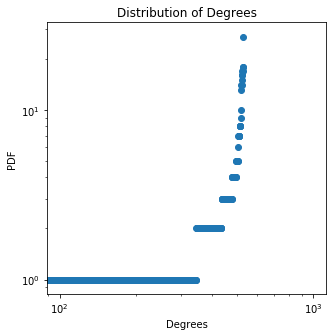

The clustering coefficient is 0.0051813471502590676
Node with highest degree is: 40 with a degree of: 27.0 , the mean is 2.0037735849056606 , the variance is 6.713193307226771
14
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6260046873860993
number of closed triangles is 1
number of open triangles is 220
average distance is 0.6334627919485948


<Figure size 432x288 with 0 Axes>

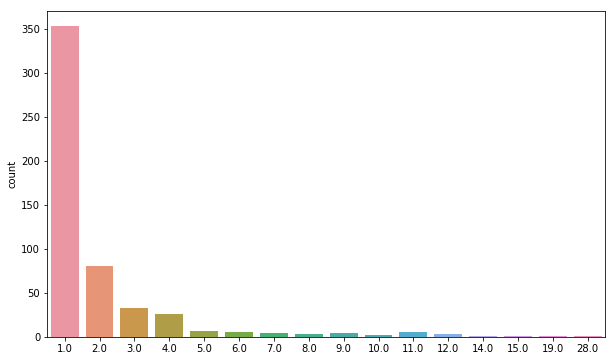

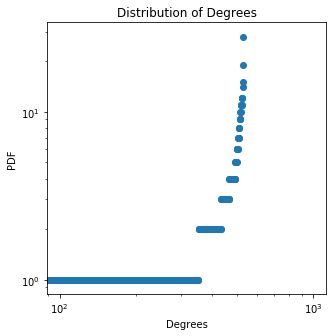

The clustering coefficient is 0.004545454545454545
Node with highest degree is: 11 with a degree of: 28.0 , the mean is 2.0037735849056606 , the variance is 5.969797080811677
13
number of closed triangles is 1
number of open triangles is 0
average distance is 0.644591397104444
number of closed triangles is 1
number of open triangles is 233
average distance is 0.6881969211890393


<Figure size 432x288 with 0 Axes>

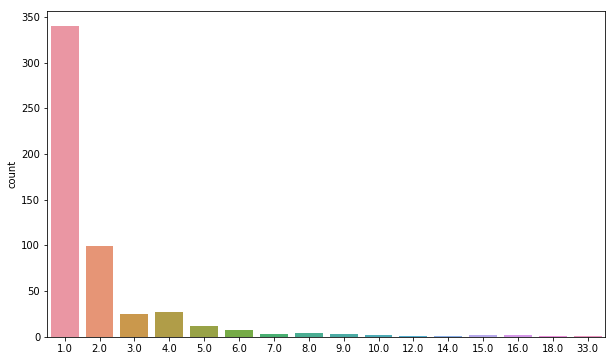

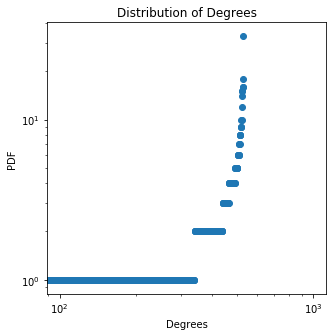

The clustering coefficient is 0.004291845493562232
Node with highest degree is: 7 with a degree of: 33.0 , the mean is 2.0037735849056606 , the variance is 6.373570665717337
12
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6059046975893239
number of closed triangles is 1
number of open triangles is 179
average distance is 0.6751785111619533


<Figure size 432x288 with 0 Axes>

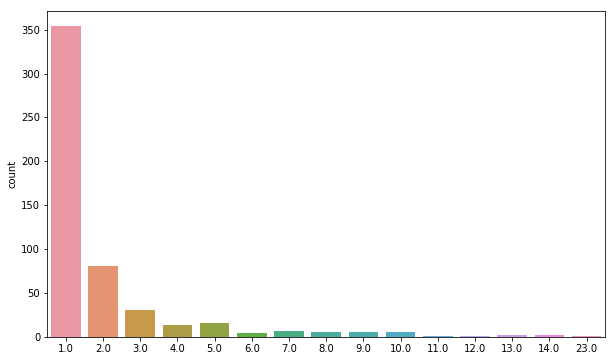

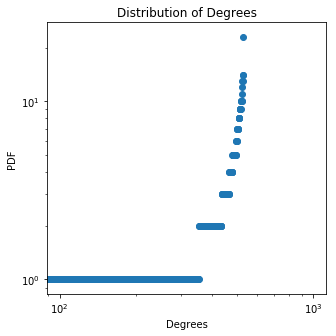

The clustering coefficient is 0.00558659217877095
Node with highest degree is: 4 with a degree of: 23.0 , the mean is 2.0037735849056606 , the variance is 5.226400854396584
11
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6772296492238734
number of closed triangles is 1
number of open triangles is 242
average distance is 0.6694119445569824


<Figure size 432x288 with 0 Axes>

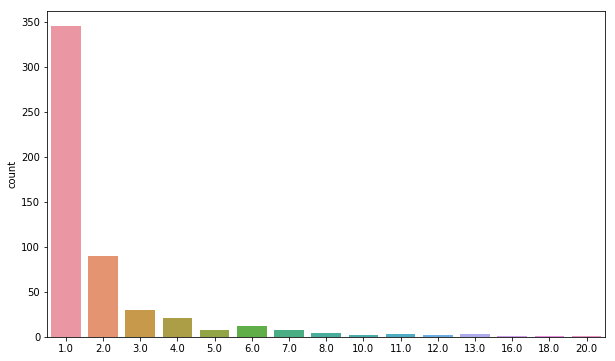

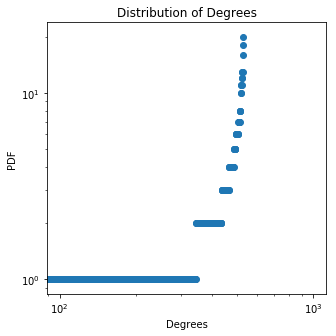

The clustering coefficient is 0.004132231404958678
Node with highest degree is: 16 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.192438590245639
10
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6137438905005385
number of closed triangles is 1
number of open triangles is 258
average distance is 0.6513602154423679


<Figure size 432x288 with 0 Axes>

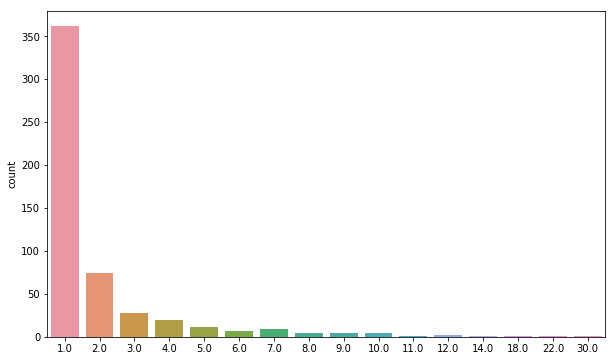

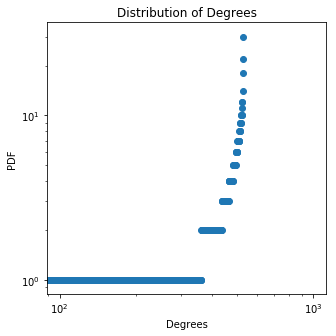

The clustering coefficient is 0.003875968992248062
Node with highest degree is: 12 with a degree of: 30.0 , the mean is 2.0037735849056606 , the variance is 6.362249911000355
9
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6933949197381167
number of closed triangles is 1
number of open triangles is 224
average distance is 0.663838592425156


<Figure size 432x288 with 0 Axes>

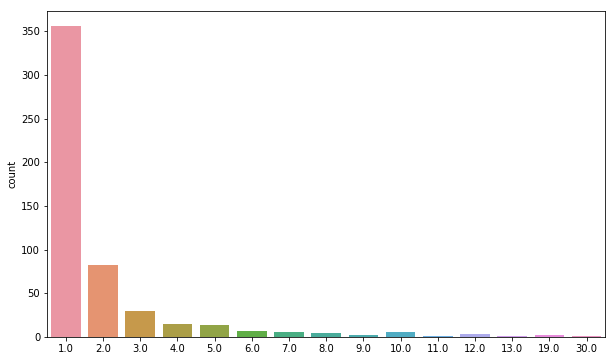

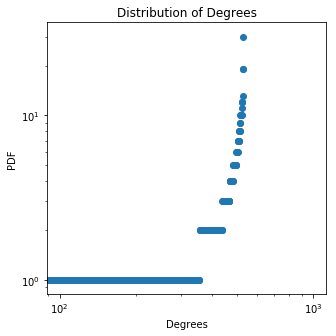

The clustering coefficient is 0.004464285714285714
Node with highest degree is: 22 with a degree of: 30.0 , the mean is 2.0037735849056606 , the variance is 6.271683873264506
8
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7219288882779228
number of closed triangles is 1
number of open triangles is 199
average distance is 0.6793082814945298


<Figure size 432x288 with 0 Axes>

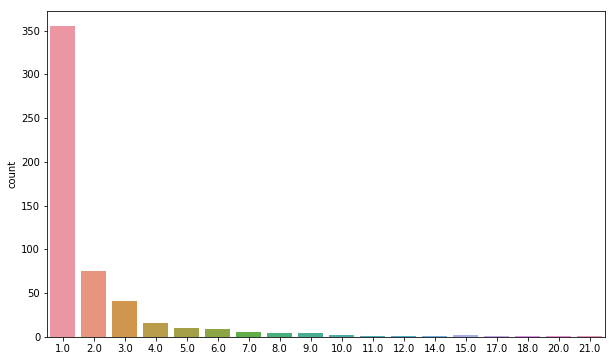

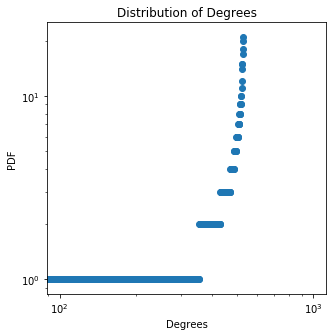

The clustering coefficient is 0.005025125628140704
Node with highest degree is: 13 with a degree of: 21.0 , the mean is 2.0037735849056606 , the variance is 5.879231043075827
7
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6451776871128759
number of closed triangles is 1
number of open triangles is 180
average distance is 0.6477158518315052


<Figure size 432x288 with 0 Axes>

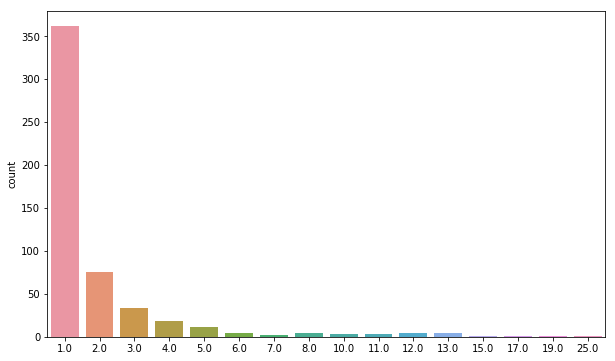

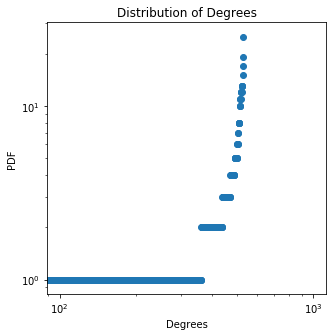

The clustering coefficient is 0.005555555555555556
Node with highest degree is: 23 with a degree of: 25.0 , the mean is 2.0037735849056606 , the variance is 6.415080099679602
6
number of closed triangles is 1
number of open triangles is 0
average distance is 0.7317534184676194
number of closed triangles is 1
number of open triangles is 228
average distance is 0.678003705912867


<Figure size 432x288 with 0 Axes>

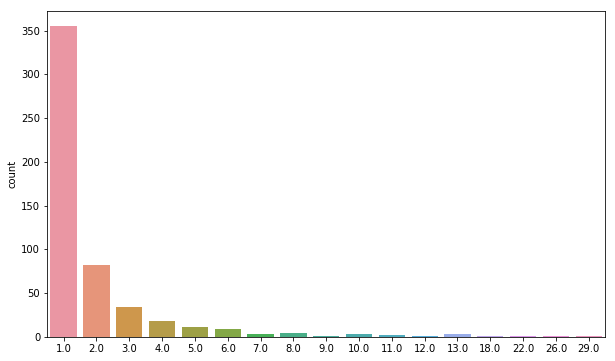

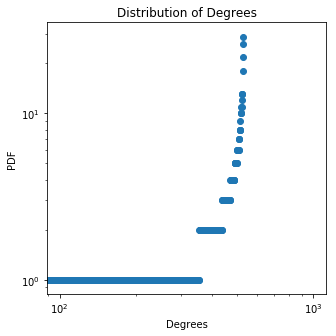

The clustering coefficient is 0.0043859649122807015
Node with highest degree is: 24 with a degree of: 29.0 , the mean is 2.0037735849056606 , the variance is 7.075457458170166
5
number of closed triangles is 1
number of open triangles is 0
average distance is 0.638853719674622
number of closed triangles is 1
number of open triangles is 214
average distance is 0.6452166655834


<Figure size 432x288 with 0 Axes>

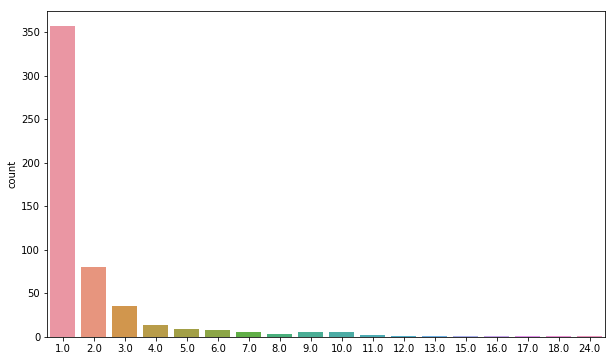

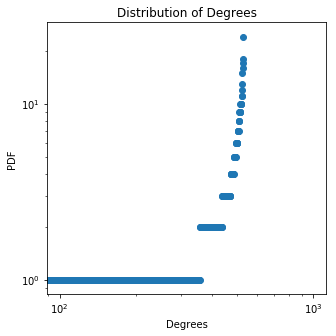

The clustering coefficient is 0.004672897196261682
Node with highest degree is: 35 with a degree of: 24.0 , the mean is 2.0037735849056606 , the variance is 5.977344250622998
4
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6645227677896333
number of closed triangles is 1
number of open triangles is 251
average distance is 0.6692250926968789


<Figure size 432x288 with 0 Axes>

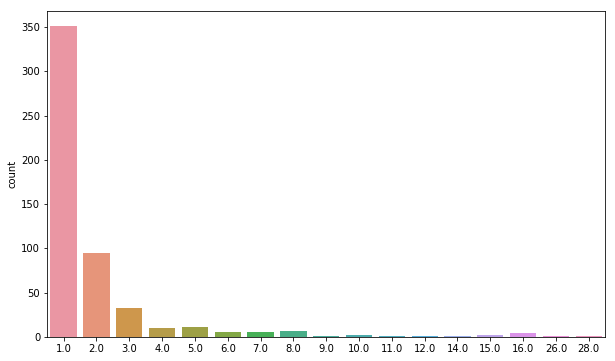

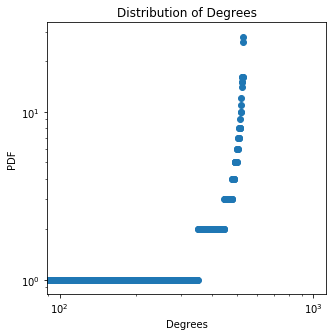

The clustering coefficient is 0.00398406374501992
Node with highest degree is: 15 with a degree of: 28.0 , the mean is 2.0037735849056606 , the variance is 7.207532929868281
3
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6302869436223325
number of closed triangles is 1
number of open triangles is 206
average distance is 0.6628061877275323


<Figure size 432x288 with 0 Axes>

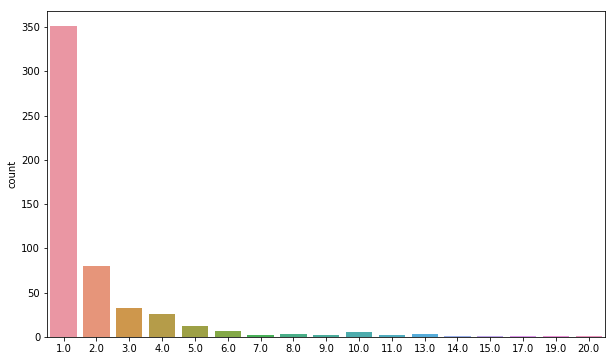

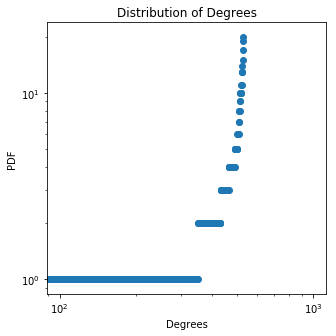

The clustering coefficient is 0.0048543689320388345
Node with highest degree is: 5 with a degree of: 20.0 , the mean is 2.0037735849056606 , the variance is 5.554702741189036
2
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6123442266455528
number of closed triangles is 1
number of open triangles is 230
average distance is 0.645379193221568


<Figure size 432x288 with 0 Axes>

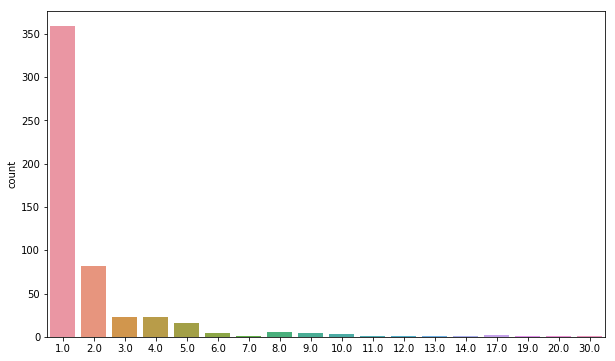

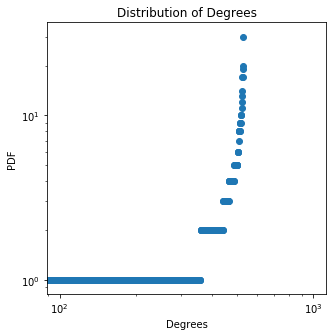

The clustering coefficient is 0.004347826086956522
Node with highest degree is: 16 with a degree of: 30.0 , the mean is 2.0037735849056606 , the variance is 6.79998576005696
1
number of closed triangles is 1
number of open triangles is 0
average distance is 0.6128863367620382
number of closed triangles is 1
number of open triangles is 164
average distance is 0.642818086591196


<Figure size 432x288 with 0 Axes>

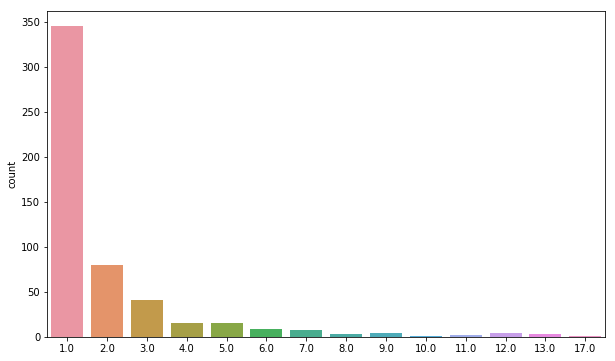

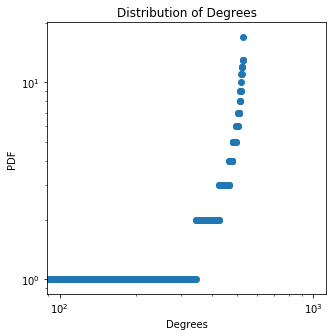

The clustering coefficient is 0.006097560975609756
Node with highest degree is: 14 with a degree of: 17.0 , the mean is 2.0037735849056606 , the variance is 4.5622499110003565
0
The average distance on a sample of 500 is 0.6617199052852089
The average # of closed triangles on a sample of 500 is 202.048
The average # of open triangles on a sample of 500 is 1.0
The average mean on a sample of 500 is 5.755102741189031
The average variance on a sample of 500 is 2.0037735849056433


In [11]:
av_distances= []
closed_triangles=[]
open_triangles=[]
av_clustering=[]
av_mean=[]
av_variance=[]
degree =[]
total = 500
while total > 0:
    d,k,l,m,s,g,h = rich_get_richer(seed = None, graph=False)
    degree.append(d)
    av_distances.append(k)
    closed_triangles.append(l)
    open_triangles.append(m)
    av_clustering.append(s)
    av_variance.append(g)
    av_mean.append(h)
    total -=1

print("The average distance on a sample of 500 is", sum(av_distances)/500)
 
print("The average # of closed triangles on a sample of 500 is", sum(closed_triangles)/500)

print("The average # of open triangles on a sample of 500 is", sum(open_triangles)/500)
print("The average mean on a sample of 500 is", sum(av_mean)/500)
print("The average variance on a sample of 500 is", sum(av_variance)/500)

In [12]:
def rand_net(n=200,p=0.1,seed = 184937):
    if seed is not None:
        np.random.seed(seed)
        
    # generate the nodes positions in [0,1)x[0,1)
    x = np.random.rand(n) # random array, elements in [0,1), length n
    y = np.random.rand(n) # same....
    z = np.random.rand(n)

    # connectivity should be such that all vertices are connected
    # print(conn)

    list2=[]
    
    nodes_random=np.arange(0,n)
    random.shuffle(nodes_random)

    while len(list2) < n:
        for j in nodes_random:
            if np.random.rand() < p:
                list2.append(j)
    #print(list1)
    #print(list2)
          
    triangles, cl_triangles, avdist=trianngles(n,list2,x,y,z)
    

    fig = plt.figure(figsize=(10,8))
    ax = Axes3D(fig)
            
    for j,k,l,i in zip(x,y,z,range(len(x))):
        ax.text(j,k,l,i)
            
    for i in range(n):
        ax.plot([x[i],x[list2[i]]], [y[i],y[list2[i]]], [z[i],z[list2[i]]])
    ax.scatter(x, y, z, cmap='hsv')

    plt.pause(0.001) # needed to force pyplot to actually show us
        
    deg = np.ones(len(x))
    for i in range(len(deg)):
        for j in range(len(list2)):
            if list2[j]==i:
                deg[i] +=1
    
    fig = plt.figure(figsize=(10,8))
    #il = poisson.rvs(mu=1-5*p, size=n)

    #il = il+1
    #fig, ax =plt.subplots(1,2)
    
    
    sns.countplot(deg)
    #sns.countplot(il, ax=ax[0])

    #ax[0].set_title('Poisson distr. w/ mu = 1-p & size = n')
    #ax[1].set_title('Distribution of degrees')
   
    
    plt.show()
    trianngles(n,list2,x,y,z)
 

    print("The clustering coefficient is", cl_triangles/triangles)
    
    index, value = max(enumerate(deg), key=operator.itemgetter(1))

    print("Node with highest degree is:", index,"with a degree of:", value,", the mean is", np.sum(deg)/len(deg),", the variance is", np.var(deg))
    


number of closed triangles is 0
number of open triangles is 27
average distance is 0.6340655715134177


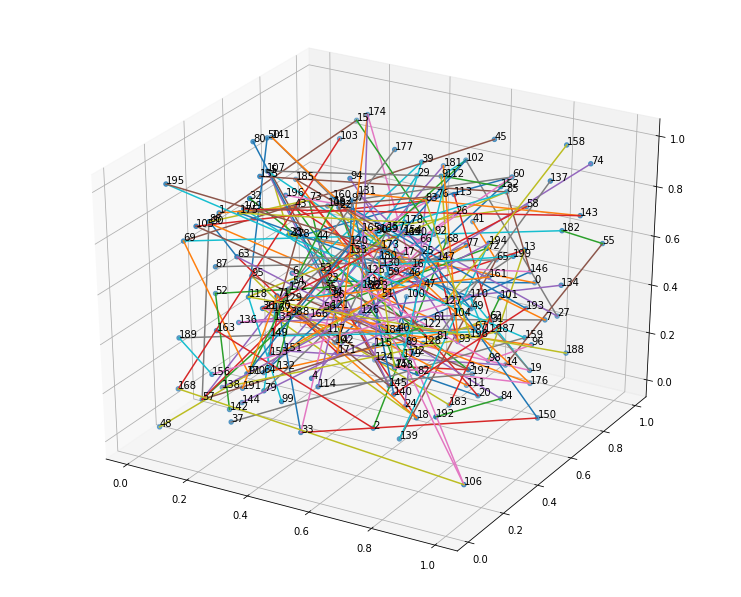

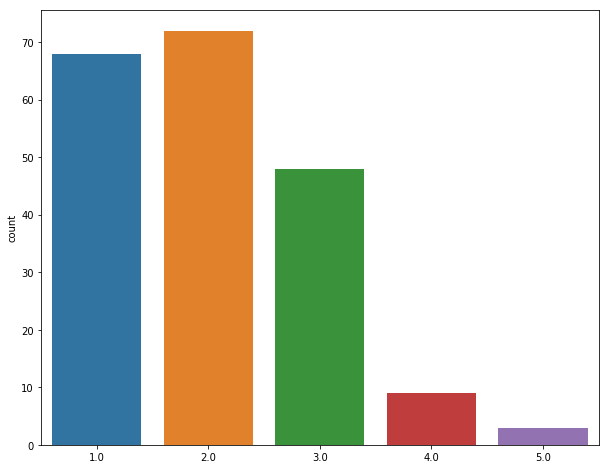

number of closed triangles is 0
number of open triangles is 27
average distance is 0.6340655715134177
The clustering coefficient is 0.0
Node with highest degree is: 57 with a degree of: 5.0 , the mean is 2.035 , the variance is 0.893775


In [13]:
rand_net(n=200,p=0.1)

number of closed triangles is 0
number of open triangles is 0
average distance is 0.6538227679376307


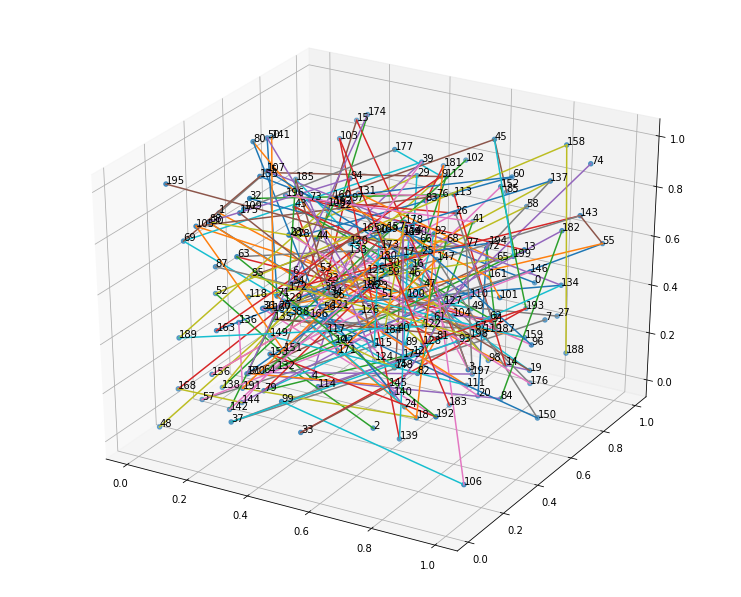

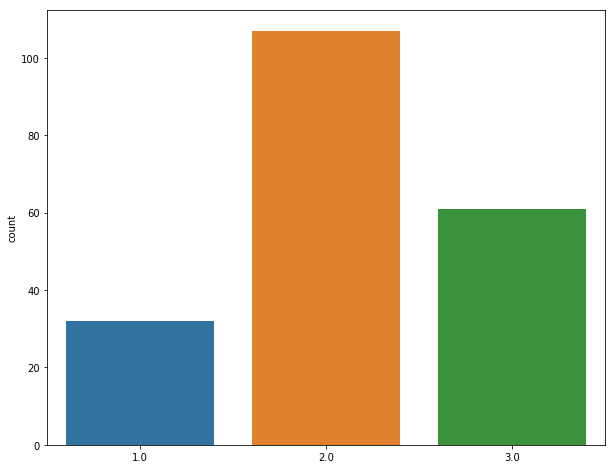

number of closed triangles is 0
number of open triangles is 0
average distance is 0.6538227679376307


ZeroDivisionError: division by zero

In [14]:
rand_net(n=200,p=0.6)

In [ ]:
type(np.random.rand())

In [ ]:
def acc_grow(n0 = 30, n = 200, b=3, seed=184937, graph=True):
    if seed is not None:
        np.random.seed(seed)
        
    # generate the nodes positions in [0,1)x[0,1)
    x = np.random.rand(n0) # random array, elements in [0,1), length n
    y = np.random.rand(n0) # same....
    z = np.random.rand(n0)

    # connectivity should be such that all vertices are connected
    conn = np.array([16,28,14,25,20,16,12,1,27,19,15,2,21,11,4,9,24,27,8,3,23,22,0,29,18,6,5,13,7,10,26,17])
    conn_copy = conn
    #print(conn)

    trianngles(n0,conn,x,y,z)
    
    new_conn=[]
    for i in range(n):
        # create a random node
        new_x= float(np.random.rand())
        new_y= float(np.random.rand())
        new_z= float(np.random.rand())
        
        nx=[new_x,new_x,new_x]
        print(nx)
        ny=[new_y,new_y,new_y]
        nz=[new_z,new_z,new_z]
                
        x = np.append(x,nx) #append the x coordinate of the new node
        y = np.append(y,ny) #append the y coordinate of the new node
        z = np.append(z,nz)
        
        deg_1 = np.zeros(len(x))
        for i in range(len(deg_1)):
            deg_1[i] +=1
            for j in range(len(conn)):
                if conn[j]==i:
                    deg_1[i] +=1

        for i in range(b):
            new_conn.append(random.choices(np.arange(0,len(deg_1)), weights=deg_1)[0]) # weighted choice (wrt to the degree of each node) among existing nodes
        
        plt.clf()
           
    conn = np.append(conn,np.array(new_conn))
    conn = conn.astype(int)
    
    if graph== True:
        fig = plt.figure(figsize=(10,8))
        ax = Axes3D(fig)
            
        for j,k,l,i in zip(x,y,z,range(len(x))):
            ax.text(j,k,l,i)

        for i in range(0,len(x)):
            ax.plot([x[i],x[conn[i]]], [y[i],y[conn[i]]], [z[i],z[conn[i]]])

        ax.scatter(x, y, z, s=40, cmap='hsv')
        plt.show() # needed to force pyplot to actually show us
        
        
    triangles, cl_triangles,avdist = trianngles(n0+n*b,conn,x,y,z)
    
    
    deg = np.zeros(len(conn))
    for i in range(len(deg)):
        deg[i] +=1
        for j in range(len(conn)):
            if conn[j]==i:
                deg[i] +=1
  

    if graph == True:
        fig = plt.figure(figsize=(10,6))
        sns.set_style("white")
        sns.countplot(deg)
    
        plt.show()    
    
    degree = deg
    
    print("The clustering coefficient is", cl_triangles/triangles)
    
    index, value = max(enumerate(deg), key=operator.itemgetter(1))

    print("Node with highest degree is:", index,"with a degree of:", value,", the mean is", np.sum(deg)/len(deg),", the variance is", np.var(deg))
    

    index, value = max(enumerate(deg), key=operator.itemgetter(1))

    print("Node with highest degree is:", index,"with a degree of:", value)
    return degree, avdist, triangles, cl_triangles, cl_triangles/triangles, np.sum(deg)/len(deg),np.var(deg)


In [ ]:
deg_3 = acc_grow(n=90)[0]
len(deg_3)

In [ ]:
sample_3 = truncated_power_law(2,10,500)
fig = plt.figure(figsize=(10,6))
sns.countplot(sample_3)
plt.show()
len(sample_3)

In [ ]:
ks_2samp(sample_3,deg_3)

In [ ]:
deg_8 = acc_grow(n=1000)[0]
len(deg_8)

In [ ]:
sample_8 = truncated_power_law(1,11,1500)
fig = plt.figure(figsize=(10,6))
sns.countplot(sample_8)
plt.show()
len(sample_8)

In [ ]:
ks_2samp(sample_8,deg_8)

In [ ]:
av_distances= []
closed_triangles=[]
open_triangles=[]
av_clustering=[]
av_mean=[]
av_variance=[]
degree =[]
total = 500
while total > 0:
    d,k,l,m,s,g,h = acc_grow(seed = None, graph=False)
    degree.append(d)
    av_distances.append(k)
    closed_triangles.append(l)
    open_triangles.append(m)
    av_clustering.append(s)
    av_variance.append(g)
    av_mean.append(h)
    total -=1
    print(total)

print("The average distance on a sample of 500 is", sum(av_distances)/500)
 
print("The average # of closed triangles on a sample of 500 is", sum(closed_triangles)/500)

print("The average # of open triangles on a sample of 500 is", sum(open_triangles)/500)
print("The average mean on a sample of 500 is", sum(av_mean)/500)
print("The average variance on a sample of 500 is", sum(av_variance)/500)

In [ ]:
def rew(n0 = 30,n=500, r = 350, p =0.7,graph=True, seed=184937):
    'This is a growth model with rewiring of edges'
    if seed is not None:
        np.random.seed(seed)
        
    # generate the nodes positions in [0,1)x[0,1)
    x = np.random.rand(n0) # random array, elements in [0,1), length n
    y = np.random.rand(n0) # same....
    z = np.random.rand(n0)

    # connectivity should be such that all vertices are connected
    conn = np.array([16,28,14,25,20,16,12,1,27,19,15,2,21,11,4,9,24,27,8,3,23,22,0,29,18,6,5,13,7,10,26,17])
    conn_copy = conn
    

    for i in range(n):
        # create a random node
        #while True:
        new_x= np.random.rand()
        new_y= np.random.rand()
        new_z= np.random.rand()

        deg_1 = np.zeros(len(x))
        for i in range(len(deg_1)):
            deg_1[i] +=1
            for j in range(len(conn)):
                if conn[j]==i:
                    deg_1[i] +=1
                
        new_conn = random.choices(np.arange(len(x)), weights=deg_1) # weighted choice (wrt to the degree of each node) among existing nodes
        
        x = np.append(x,new_x) #append the x coordinate of the new node
        y = np.append(y,new_y) #append the y coordinate of the new node
        z = np.append(z,new_z)
        conn = np.append(conn, new_conn) #append the existing node to which the new node will connect

        plt.clf()
        
    if graph==True:
        fig = plt.figure(figsize=(10,8))
        ax = Axes3D(fig)
            
        for j,k,l,i in zip(x,y,z,range(len(x))):
            ax.text(j,k,l,i)
            
        for i in range(len(x)):
            ax.plot([x[i],x[conn[i]]], [y[i],y[conn[i]]], [z[i],z[conn[i]]])
        ax.scatter(x, y, z, cmap='hsv')

        plt.pause(0.001) # needed to force pyplot to actually show us
    
    for k in range(r):
        prob = np.random.rand()
        #print(conn)
        if prob < p:
            # choose a random node
            #while True:
            new_x = np.random.choice(x)
            index = np.where(x==new_x)
            conn[index] = np.random.randint(n0+n) 
        else:
            # choose a random node
            #while True:
            new_x = np.random.choice(x)
            index = np.where(x==new_x)
            #print(index)
            new_ind = conn[np.where(conn==conn[index])]
            conn[index] = np.random.choice(new_ind)    
            
    list2=list(conn)
    triangles = 0
    alr = []
    for i in list2:
        if i in alr:
            triangles +=0
        else:
            if list2.index(i) in list2:
                if list2.index(list2.index(i)) in list2: 
                    if list2.index(list2.index(list2.index(i))) in list2:
                        if list2.index(list2.index(list2.index(i))) == i:
                            triangles +=1
                            alr.append(list2.index(list2.index(list2.index(i))))
                            alr.append(list2.index(list2.index(i)))
                            alr.append(list2.index(i))

    print("number of closed triangles is", triangles)
    
    cl_triangles = 0
    for i in list2:
        if list2.count(i) >= 1:
            cl_triangles += list2.count(i)%2

    print("number of open triangles is", cl_triangles)
    
    distances=[]
    #print(len(x),len(conn))
    for i in range(n0+n):
        distances.append((((x[i]-x[conn[i]])**2)+((y[i]-y[conn[i]])**2)+((z[i]-z[conn[i]])**2))**(1/2))

    distances = np.array(distances)
    tot= n0 + n*3
    
    avdist = np.sum(distances)/(n0+n)
    print('average distance is',avdist)
  
    
    deg = np.zeros(len(x))
    for i in range(len(deg)):
        deg[i] +=1
        for j in range(len(conn)):
            if conn[j]==i:
                deg[i] +=1
    
    if graph == True:    
        sns.set_style("white")
        fig = plt.figure(figsize=(10,6))
        #max_deg= np.argmax(deg)+1
        #sample = truncated_power_law(2,20,200)
        #fig, ax =plt.subplots(1,2)
        #sns.countplot(sample, ax=ax[0])
        sns.countplot(deg)
        #ax[0].set_title('Powerlaw distribution')
        #ax[1].set_title('Distribution of degrees')
    
        plt.show()

        f, ax = plt.subplots(figsize=(5, 5))
        ax.set(xscale="log", yscale="log")
        ax.scatter(np.arange(len(deg)), np.sort(deg))

        ax.set_title('Distribution of Degrees')
        ax.set_xlabel('Degrees')
        ax.set_ylabel('PDF')
        
        plt.show()
        
    

    degree = list(deg)
    
    print("The clustering coefficient is", cl_triangles/triangles)
    
    index, value = max(enumerate(deg), key=operator.itemgetter(1))

    print("Node with highest degree is:", index,"with a degree of:", value,", the mean is", np.sum(deg)/len(deg),", the variance is", np.var(deg))
    return degree, avdist, triangles, cl_triangles, cl_triangles/triangles, np.sum(deg)/len(deg),np.var(deg)


In [ ]:
deg_5=rew(n=300, r=250, p=0.1)[0]

In [ ]:
deg_4=rew(n=300,r=250,p=0.7)[0]

In [ ]:
sample_4 = truncated_power_law(2,13,330)
fig = plt.figure(figsize=(10,6))
sns.countplot(sample_4)
plt.show()

In [ ]:
ks_2samp(sample_4,deg_5)

In [ ]:
ks_2samp(sample_4,deg_4)

In [ ]:
deg_6=rew(n0=30,n=800, r=650, p=0.1,graph=True)[0]

In [ ]:
deg_7=rew(n0=30,n=800, r=650, p=0.7,graph=True)[0]

In [ ]:
sample_5 = truncated_power_law(2,16,1030)
fig = plt.figure(figsize=(10,6))
sns.countplot(sample_5)
plt.show()

In [ ]:
ks_2samp(sample_5,deg_6)

In [ ]:
ks_2samp(sample_5,deg_7)

In [ ]:
av_distances= []
closed_triangles=[]
open_triangles=[]
av_clustering=[]
av_mean=[]
av_variance=[]
degree =[]
total = 500
while total > 0:
    d,k,l,m,s,g,h = rew(seed = None, p=0.1,graph=False)
    degree.append(d)
    av_distances.append(k)
    closed_triangles.append(l)
    open_triangles.append(m)
    av_clustering.append(s)
    av_variance.append(g)
    av_mean.append(h)
    total -=1
    print(total)

print("The average distance on a sample of 500 is", sum(av_distances)/500)
 
print("The average # of closed triangles on a sample of 500 is", sum(closed_triangles)/500)

print("The average # of open triangles on a sample of 500 is", sum(open_triangles)/500)
print("The average mean on a sample of 500 is", sum(av_mean)/500)
print("The average variance on a sample of 500 is", sum(av_variance)/500)

In [ ]:
av_distances= []
closed_triangles=[]
open_triangles=[]
av_clustering=[]
av_mean=[]
av_variance=[]
degree =[]
total = 500
while total > 0:
    d,k,l,m,s,g,h = rew(seed = None, graph=False)
    degree.append(d)
    av_distances.append(k)
    closed_triangles.append(l)
    open_triangles.append(m)
    av_clustering.append(s)
    av_variance.append(g)
    av_mean.append(h)
    total -=1
    print(total)

print("The average distance on a sample of 500 is", sum(av_distances)/500)
 
print("The average # of closed triangles on a sample of 500 is", sum(closed_triangles)/500)

print("The average # of open triangles on a sample of 500 is", sum(open_triangles)/500)
print("The average mean on a sample of 500 is", sum(av_mean)/500)
print("The average variance on a sample of 500 is", sum(av_variance)/500)